# The figures and analysis for monkey PFC decoding paper
### By Alireza Rouzitalab
#### Summer and Fall 2020

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
import sys
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt
import pickle
from sklearn.decomposition import PCA
from tensorflow.keras import Sequential


# from indl.display import turbo_cmap
from sklearn.model_selection import train_test_split

In [3]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

In [4]:
# gpu_devices = tf.config.experimental.list_physical_devices('GPU')
# for device in gpu_devices: tf.config.experimental.set_memory_growth(device, True)

In [5]:
from indl.fileio import from_neuropype_h5

In [3]:
import os

if Path.cwd().stem == 'Analysis':
    os.chdir(Path.cwd().parent.parent)

In [5]:
data_path = Path.cwd() / 'StudyLocationRule'/ 'Data' / 'Preprocessed'
if not (data_path).is_dir():
    !kaggle datasets download --unzip --path {str(data_path)} cboulay/macaque-8a-spikes-rates-and-saccades
    print("Finished downloading and extracting data.")
else:
    print("Data directory found. Skipping download.")

Data directory found. Skipping download.


In [4]:
from misc.misc import sess_infos, load_macaque_pfc, dec_from_enc

load_kwargs = {
    'valid_outcomes': (0,),  # Use (0, 9) to include trials with incorrect behaviour
    'zscore': True,
    'dprime_range': (1.0, np.inf),  # Use (-np.inf, np.inf) to include all trials.
    'time_range': (-np.inf, 1.25),
    'verbose': False,
    'y_type': 'sacClass',
    'samples_last': True    
    #     'resample_X': 20
}

load_kwargs_error = {
    'valid_outcomes': (9,),  # Use (0, 9) to include trials with incorrect behaviour
    'zscore': True,
    'dprime_range': (1.0, np.inf),  # Use (-np.inf, np.inf) to include all trials.
    'time_range': (-np.inf, 1.25),
    'verbose': False,
    'y_type': 'sacClass',
    'samples_last': True    
    #     'resample_X': 20
}

load_kwargs_all = {
    'valid_outcomes': (0,9),  # Use (0, 9) to include trials with incorrect behaviour
    'zscore': True,
    'dprime_range': (1.0, np.inf),  # Use (-np.inf, np.inf) to include all trials.
    'time_range': (-np.inf, 1.25),
    'verbose': False,
    'y_type': 'sacClass',
    'samples_last': True    
    #     'resample_X': 20
}

In [9]:
test_sess_ix = 1
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"\nImporting session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
Y_class = tf.keras.utils.to_categorical(Y, num_classes=8)


Importing session sra3_1_j_050_00+


In [10]:
X_rates.shape

(285, 36, 206)

In [11]:
ax_info['timestamps']

array([-0.6 , -0.59, -0.58, -0.57, -0.56, -0.55, -0.54, -0.53, -0.52,
       -0.51, -0.5 , -0.49, -0.48, -0.47, -0.46, -0.45, -0.44, -0.43,
       -0.42, -0.41, -0.4 , -0.39, -0.38, -0.37, -0.36, -0.35, -0.34,
       -0.33, -0.32, -0.31, -0.3 , -0.29, -0.28, -0.27, -0.26, -0.25,
       -0.24, -0.23, -0.22, -0.21, -0.2 , -0.19, -0.18, -0.17, -0.16,
       -0.15, -0.14, -0.13, -0.12, -0.11, -0.1 , -0.09, -0.08, -0.07,
       -0.06, -0.05, -0.04, -0.03, -0.02, -0.01,  0.  ,  0.01,  0.02,
        0.03,  0.04,  0.05,  0.06,  0.07,  0.08,  0.09,  0.1 ,  0.11,
        0.12,  0.13,  0.14,  0.15,  0.16,  0.17,  0.18,  0.19,  0.2 ,
        0.21,  0.22,  0.23,  0.24,  0.25,  0.26,  0.27,  0.28,  0.29,
        0.3 ,  0.31,  0.32,  0.33,  0.34,  0.35,  0.36,  0.37,  0.38,
        0.39,  0.4 ,  0.41,  0.42,  0.43,  0.44,  0.45,  0.46,  0.47,
        0.48,  0.49,  0.5 ,  0.51,  0.52,  0.53,  0.54,  0.55,  0.56,
        0.57,  0.58,  0.59,  0.6 ,  0.61,  0.62,  0.63,  0.64,  0.65,
        0.66,  0.67,

In [12]:
# from indl.model import parts
# # from indl.model.helper import check_inputs
# from indl.regularizers import KernelLengthRegularizer
# from tensorflow.keras.layers import LSTM, Dense, Reshape, Conv2D, BatchNormalization, DepthwiseConv2D, Activation, AveragePooling2D, Dropout
# N_SPLITS = 10
# BATCH_SIZE = 16
# EPOCHS = 180
# LABEL_SMOOTHING = 0.2

# def make_model(
#     _input,
#     num_classes,
#     filt=8,
#     kernLength=25,
#     ds_rate=10,
#     n_rnn=64,
#     n_rnn2=64,
#     dropoutRate=0.25,
#     activation='relu',
#     l1_reg=0.000, l2_reg=0.000,
#     norm_rate=0.25,
#     latent_dim=16,
#     return_model=True
# ):
# #     input_shape = list(_input.shape)
# #     if len(input_shape) < 4:
# #         input_shape = input_shape + [1]
#     model = Sequential()
# #     model.add(LSTM(_input.shape[, batch_input_shape=(BATCH_SIZE,n_timesteps, n_features), return_sequences=True))
# #     model.add(Reshape(input_shape[1:], batch_input_size=(BATCH_SIZE, _input.shape[1], _input.shape[2])))
# #     inputs = tf.keras.layers.Input(batch_input_shape=(BATCH_SIZE, _input.shape[1], _input.shape[2]))
#     model.add(Conv2D(filt, (1, kernLength), batch_input_shape=(BATCH_SIZE, _input.shape[1], _input.shape[2], _input.shape[3]),
#                      padding='valid', data_format=None,
#                                 dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform',
#                                 bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None,
#                                 activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
    
#     # The Conv layers are insensitive to the number of samples in the time dimension.
#     # To make it possible for this trained model to be applied to segments of different
#     # durations, we need to explicitly state that we don't care about the number of samples.
#     # input_shape[2] = -1  # Comment out during debug
#     # _y = layers.Reshape(input_shape[1:])(_input)  # Note that Reshape ignores the batch dimension.

#     # RNN
    
#     # The Conv layers are insensitive to the number of samples in the time dimension.
#     # To make it possible for this trained model to be applied to segments of different
#     # durations, we need to explicitly state that we don't care about the number of samples.
# #     , batch_input_shape=(BATCH_SIZE, _input.shape[1], _input.shape[2])
# #     _y = tf.keras.layers.Reshape(input_shape[1:])(inputs)
# #     _y = tf.keras.layers.Conv2D(filt, (1, kernLength), padding='valid', data_format=None,
# #                                 dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform',
# #                                 bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None,
# #                                 activity_regularizer=None, kernel_constraint=None, bias_constraint=None)(_y)
#     model.add(BatchNormalization())
    
#     model.add(DepthwiseConv2D((model.layers[-1].output_shape[1], 1), padding='valid',
#                                       depth_multiplier=1, data_format=None, dilation_rate=(1, 1),
#                                       activation=None, use_bias=True, depthwise_initializer='glorot_uniform',
#                                       bias_initializer='zeros', depthwise_regularizer=None,
#                                       bias_regularizer=None, activity_regularizer=None,
#                                       depthwise_constraint=None, bias_constraint=None))
#     model.add(BatchNormalization())
#     model.add(Activation(activation))
#     model.add(AveragePooling2D(pool_size=(1, ds_rate)))
#     _y=model.add(Dropout(dropoutRate))
#     model.add(Reshape(model.layers[-1].output_shape[2:]))
#     model.add(LSTM(n_rnn,kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
#                    recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
#                    return_sequences=n_rnn2 > 0,stateful=False,name='rnn1'))
#     model.add(Activation(activation))
#     model.add(BatchNormalization())
#     model.add(Dropout(dropoutRate))
    
    
#     if n_rnn2 > 0:
        
#         model.add(LSTM(n_rnn2,
#                               kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
#                               recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
#                               return_sequences=False,
#                               stateful=False,
#                               name='rnn2'))
#         model.add(Activation(activation))
#         model.add(BatchNormalization())
#         model.add(Dropout(dropoutRate))
    
#     # Dense
#     model.add(Dense(latent_dim, activation=activation))
# #     _y = parts.Bottleneck(_y, latent_dim=latent_dim, activation=activation)
    
#     # Classify
#     model.add(Dense(num_classes, activation='softmax'))
# #     outputs = parts.Classify(_y, n_classes=num_classes, norm_rate=norm_rate)
    
#     return model

In [13]:
from indl.model import parts
# from indl.model.helper import check_inputs
from indl.regularizers import KernelLengthRegularizer

def make_model(
    _input,
    num_classes,
    filt=8,
    kernLength=25,
    ds_rate=10,
    n_rnn=64,
    n_rnn2=64,
    dropoutRate=0.25,
    activation='relu',
    l1_reg=0.000, l2_reg=0.000,
    norm_rate=0.25,
    latent_dim=16,
    return_model=True
):
    
    inputs = tf.keras.layers.Input(shape=_input.shape[1:])
    
    input_shape = list(_input.shape)
    # The Conv layers are insensitive to the number of samples in the time dimension.
    # To make it possible for this trained model to be applied to segments of different
    # durations, we need to explicitly state that we don't care about the number of samples.
    # input_shape[2] = -1  # Comment out during debug
    # _y = layers.Reshape(input_shape[1:])(_input)  # Note that Reshape ignores the batch dimension.

    # RNN
    if len(input_shape) < 4:
        input_shape = input_shape + [1]
    # The Conv layers are insensitive to the number of samples in the time dimension.
    # To make it possible for this trained model to be applied to segments of different
    # durations, we need to explicitly state that we don't care about the number of samples.
    _y = tf.keras.layers.Reshape(input_shape[1:])(inputs)
    _y = tf.keras.layers.Conv2D(filt, (1, kernLength), padding='valid', data_format=None,
                                dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform',
                                bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None,
                                activity_regularizer=None, kernel_constraint=None, bias_constraint=None)(_y)
    _y = tf.keras.layers.BatchNormalization()(_y)
    _y = tf.keras.layers.DepthwiseConv2D((_y.shape.as_list()[1], 1), padding='valid',
                                      depth_multiplier=1, data_format=None, dilation_rate=(1, 1),
                                      activation=None, use_bias=True, depthwise_initializer='glorot_uniform',
                                      bias_initializer='zeros', depthwise_regularizer=None,
                                      bias_regularizer=None, activity_regularizer=None,
                                      depthwise_constraint=None, bias_constraint=None)(_y)
    _y = tf.keras.layers.BatchNormalization()(_y)
    _y = tf.keras.layers.Activation(activation)(_y)
    _y = tf.keras.layers.AveragePooling2D(pool_size=(1, ds_rate))(_y)
    _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    _y = tf.keras.layers.Reshape(_y.shape.as_list()[2:])(_y)
    _y = tf.keras.layers.LSTM(n_rnn,
                              kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
                              recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
                              return_sequences=n_rnn2 > 0,
                              stateful=False,
                              name='rnn1')(_y)
    _y = tf.keras.layers.Activation(activation)(_y)
    _y = tf.keras.layers.BatchNormalization()(_y)
    _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
    
    if n_rnn2 > 0:
        
        _y = tf.keras.layers.LSTM(n_rnn2,
                              kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
                              recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
                              return_sequences=False,
                              stateful=False,
                              name='rnn2')(_y)
        _y = tf.keras.layers.Activation(activation)(_y)
        _y = tf.keras.layers.BatchNormalization()(_y)
        _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
    # Dense
    _y = tf.keras.layers.Dense(latent_dim, activation=activation)(_y)
#     _y = parts.Bottleneck(_y, latent_dim=latent_dim, activation=activation)
    
    # Classify
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(_y)
#     outputs = parts.Classify(_y, n_classes=num_classes, norm_rate=norm_rate)
    

    if return_model is False:
        return outputs
    else:
        return tf.keras.models.Model(inputs=inputs, outputs=outputs)

In [14]:
# from indl.model import parts
# # from indl.model.helper import check_inputs
# from indl.regularizers import KernelLengthRegularizer
# N_SPLITS = 10
# BATCH_SIZE = 16
# EPOCHS = 180
# LABEL_SMOOTHING = 0.2

# def make_model(
#     _input,
#     num_classes,
#     filt=8,
#     kernLength=25,
#     ds_rate=10,
#     n_rnn=64,
#     n_rnn2=64,
#     dropoutRate=0.25,
#     activation='relu',
#     l1_reg=0.000, l2_reg=0.000,
#     norm_rate=0.25,
#     latent_dim=16,
#     return_model=True
# ):
    
# #     inputs = tf.keras.layers.Input(shape=_input.shape[1:])
    
# #     input_shape = list(_input.shape)
# #     # The Conv layers are insensitive to the number of samples in the time dimension.
# #     # To make it possible for this trained model to be applied to segments of different
# #     # durations, we need to explicitly state that we don't care about the number of samples.
# #     # input_shape[2] = -1  # Comment out during debug
# #     # _y = layers.Reshape(input_shape[1:])(_input)  # Note that Reshape ignores the batch dimension.

# #     # RNN
# #     if len(input_shape) < 4:
# #         input_shape = input_shape + [1]
# #     # The Conv layers are insensitive to the number of samples in the time dimension.
# #     # To make it possible for this trained model to be applied to segments of different
# #     # durations, we need to explicitly state that we don't care about the number of samples.
# #     _y = tf.keras.layers.Reshape(input_shape[1:])(inputs)
# #     _y = tf.keras.layers.Conv2D(filt, (1, kernLength), batch_input_shape=(BATCH_SIZE, _input.shape[1], _input.shape[2], _input.shape[3]),
# #                                 padding='valid', data_format=None,
# #                                 dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform',
# #                                 bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None,
# #                                 activity_regularizer=None, kernel_constraint=None, bias_constraint=None)
# #     _y = tf.keras.layers.BatchNormalization()(_y)
# #     _y = tf.keras.layers.DepthwiseConv2D((_y.shape.as_list()[1], 1), padding='valid',
# #                                       depth_multiplier=1, data_format=None, dilation_rate=(1, 1),
# #                                       activation=None, use_bias=True, depthwise_initializer='glorot_uniform',
# #                                       bias_initializer='zeros', depthwise_regularizer=None,
# #                                       bias_regularizer=None, activity_regularizer=None,
# #                                       depthwise_constraint=None, bias_constraint=None)(_y)
# #     _y = tf.keras.layers.BatchNormalization()(_y)
# #     _y = tf.keras.layers.Activation(activation)(_y)
# #     _y = tf.keras.layers.AveragePooling2D(pool_size=(1, ds_rate))(_y)
# #     _y = tf.keras.layers.Dropout(dropoutRate)(_y)
# #     _y = tf.keras.layers.Reshape(_y.shape.as_list()[2:])(_y)
#     _y = tf.keras.layers.LSTM(n_rnn,
#                               kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
#                               recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
#                               return_sequences=n_rnn2 > 0,
#                               stateful=False,
#                               name='rnn1')(_y)
#     _y = tf.keras.layers.Activation(activation)(_y)
#     _y = tf.keras.layers.BatchNormalization()(_y)
#     _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
    
#     if n_rnn2 > 0:
        
#         _y = tf.keras.layers.LSTM(n_rnn2,
#                               kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
#                               recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
#                               return_sequences=False,
#                               stateful=False,
#                               name='rnn2')(_y)
#         _y = tf.keras.layers.Activation(activation)(_y)
#         _y = tf.keras.layers.BatchNormalization()(_y)
#         _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
#     # Dense
#     _y = tf.keras.layers.Dense(latent_dim, activation=activation)(_y)
# #     _y = parts.Bottleneck(_y, latent_dim=latent_dim, activation=activation)
    
#     # Classify
#     outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(_y)
# #     outputs = parts.Classify(_y, n_classes=num_classes, norm_rate=norm_rate)
    

#     if return_model is False:
#         return outputs
#     else:
#         return tf.keras.models.Model(inputs=inputs, outputs=outputs)

# 10-Fold Performance on all Sessions

In [19]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2
model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)



def get_hists_acc(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy with CNN/LSTM Model: {accuracy}%")
    
    return history, accuracy

In [16]:
# _in = np.reshape(X_rates, (X_rates.shape[0], X_rates.shape[1], X_rates.shape[2], 1))
# _in.shape

In [17]:
model_kwargs1 = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=8,
    n_rnn2=8,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=16
)
# _in = np.reshape(X_rates, (X_rates.shape[0], X_rates.shape[1], X_rates.shape[2], 1))
model = make_model(X_rates, Y_class.shape[-1], **model_kwargs1)
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 206)]         0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 206, 1)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 187, 8)        168       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 187, 8)        32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 187, 8)         296       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 187, 8)         32        
_________________________________________________________________
activation (Activation)      (None, 1, 187, 8)        

In [20]:
trn = int(0.8*X_rates.shape[0])

_y = Y_class

ds_train = tf.data.Dataset.from_tensor_slices((X_rates[:trn], _y[:trn]))
ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[trn:], _y[trn:]))

# cast data types to GPU-friendly types.
ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

# TODO: augmentations (random slicing?)

ds_train = ds_train.shuffle(trn + 1)
ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=True)

In [21]:
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
model.fit(x=ds_train, epochs=EPOCHS, validation_data=ds_valid, verbose=1)

Epoch 1/180
14/14 [==============================] - 1s 98ms/step - loss: 2.4314 - accuracy: 0.1429 - val_loss: 2.1252 - val_accuracy: 0.0625
Epoch 2/180
14/14 [==============================] - 1s 39ms/step - loss: 2.2525 - accuracy: 0.1518 - val_loss: 2.1281 - val_accuracy: 0.0208
Epoch 3/180
14/14 [==============================] - 1s 38ms/step - loss: 2.1661 - accuracy: 0.1830 - val_loss: 2.1328 - val_accuracy: 0.0000e+00
Epoch 4/180
14/14 [==============================] - 1s 39ms/step - loss: 2.1821 - accuracy: 0.1607 - val_loss: 2.1384 - val_accuracy: 0.0000e+00
Epoch 5/180
14/14 [==============================] - 1s 36ms/step - loss: 2.1206 - accuracy: 0.2009 - val_loss: 2.1422 - val_accuracy: 0.0000e+00
Epoch 6/180
14/14 [==============================] - 1s 39ms/step - loss: 2.0785 - accuracy: 0.2143 - val_loss: 2.1475 - val_accuracy: 0.0000e+00
Epoch 7/180
14/14 [==============================] - 1s 38ms/step - loss: 2.0484 - accuracy: 0.2589 - val_loss: 2.1498 - val_accurac

Epoch 58/180
14/14 [==============================] - 1s 39ms/step - loss: 1.4648 - accuracy: 0.6161 - val_loss: 1.5846 - val_accuracy: 0.6042
Epoch 59/180
14/14 [==============================] - 1s 41ms/step - loss: 1.4463 - accuracy: 0.6339 - val_loss: 1.5662 - val_accuracy: 0.5417
Epoch 60/180
14/14 [==============================] - 1s 41ms/step - loss: 1.4843 - accuracy: 0.5938 - val_loss: 1.5884 - val_accuracy: 0.5208
Epoch 61/180
14/14 [==============================] - 1s 39ms/step - loss: 1.4226 - accuracy: 0.6518 - val_loss: 1.6451 - val_accuracy: 0.5208
Epoch 62/180
14/14 [==============================] - 1s 39ms/step - loss: 1.4565 - accuracy: 0.6116 - val_loss: 1.6299 - val_accuracy: 0.5417
Epoch 63/180
14/14 [==============================] - 1s 41ms/step - loss: 1.3897 - accuracy: 0.6384 - val_loss: 1.6195 - val_accuracy: 0.5833
Epoch 64/180
14/14 [==============================] - 1s 43ms/step - loss: 1.4114 - accuracy: 0.6339 - val_loss: 1.6384 - val_accuracy: 0.5208

Epoch 172/180
14/14 [==============================] - 1s 38ms/step - loss: 1.2199 - accuracy: 0.7634 - val_loss: 1.6649 - val_accuracy: 0.5000
Epoch 173/180
14/14 [==============================] - 1s 38ms/step - loss: 1.2241 - accuracy: 0.7902 - val_loss: 1.6388 - val_accuracy: 0.5000
Epoch 174/180
14/14 [==============================] - 1s 39ms/step - loss: 1.2178 - accuracy: 0.7723 - val_loss: 1.5498 - val_accuracy: 0.5833
Epoch 175/180
14/14 [==============================] - 1s 39ms/step - loss: 1.1835 - accuracy: 0.8036 - val_loss: 1.5417 - val_accuracy: 0.5833
Epoch 176/180
14/14 [==============================] - 1s 39ms/step - loss: 1.1782 - accuracy: 0.7857 - val_loss: 1.5091 - val_accuracy: 0.5417
Epoch 177/180
14/14 [==============================] - 1s 38ms/step - loss: 1.2041 - accuracy: 0.7946 - val_loss: 1.4468 - val_accuracy: 0.6042
Epoch 178/180
14/14 [==============================] - 1s 43ms/step - loss: 1.2035 - accuracy: 0.7946 - val_loss: 1.4447 - val_accuracy:

In [15]:
layer_ix = 10  # 10: separable_conv2d
truncated_model = tf.keras.Model(model.input, model.layers[layer_ix].output)
truncated_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 171)]         0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 171, 1)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 152, 8)        168       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 152, 8)        32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 152, 8)         296       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 152, 8)         32        
_________________________________________________________________
activation (Activation)      (None, 1, 152, 8)         0   

In [17]:
y = truncated_model(X_rates)
y.shape

TensorShape([285, 30, 8])

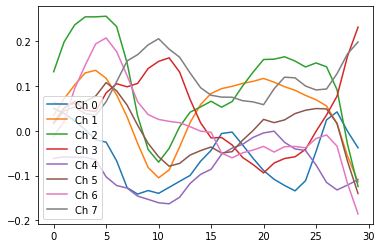

In [35]:
plt.plot(y[200,:,0], label='Ch 0')
plt.plot(y[200,:,1], label='Ch 1')
plt.plot(y[200,:,2], label='Ch 2')
plt.plot(y[200,:,3], label='Ch 3')
plt.plot(y[200,:,4], label='Ch 4')
plt.plot(y[200,:,5], label='Ch 5')
plt.plot(y[200,:,6], label='Ch 6')
plt.plot(y[200,:,7], label='Ch 7')
plt.legend(loc='lower left')

In [36]:
Y[200]

array([2])

In [32]:
accuracies = []

for i in range(8):
    history, accuracy = get_hists_acc(sess_infos[i]['exp_code'], verbose=1)
    accuracies.append(accuracy)

Processing session sra3_2_j_037_00+03...
	Split 1 of 10
Train for 9 steps, validate for 1 steps
Epoch 1/180
6/9 [===================>..........] - ETA: 1s - loss: 2.4871 - accuracy: 0.1458
Epoch 00001: val_accuracy improved from -inf to 0.37500, saving model to r2c_lstm_sra3_2_j_037_00+03_split0.h5
9/9 [==============================] - 3s 341ms/step - loss: 2.4582 - accuracy: 0.1806 - val_loss: 2.1208 - val_accuracy: 0.3750
Epoch 2/180
7/9 [======================>.......] - ETA: 0s - loss: 2.2270 - accuracy: 0.2232
Epoch 00002: val_accuracy did not improve from 0.37500
9/9 [==============================] - 0s 25ms/step - loss: 2.1956 - accuracy: 0.2292 - val_loss: 2.0884 - val_accuracy: 0.3750
Epoch 3/180
7/9 [======================>.......] - ETA: 0s - loss: 1.8951 - accuracy: 0.3661
Epoch 00003: val_accuracy improved from 0.37500 to 0.50000, saving model to r2c_lstm_sra3_2_j_037_00+03_split0.h5
9/9 [==============================] - 0s 30ms/step - loss: 1.8765 - accuracy: 0.3819 - 

Epoch 30/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2829 - accuracy: 0.7411
Epoch 00030: val_accuracy improved from 0.50000 to 0.56250, saving model to r2c_lstm_sra3_2_j_037_00+03_split0.h5
9/9 [==============================] - 0s 27ms/step - loss: 1.2615 - accuracy: 0.7639 - val_loss: 1.6086 - val_accuracy: 0.5625
Epoch 31/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2711 - accuracy: 0.7232
Epoch 00031: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 23ms/step - loss: 1.2681 - accuracy: 0.7361 - val_loss: 1.6079 - val_accuracy: 0.5625
Epoch 32/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2188 - accuracy: 0.7679
Epoch 00032: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 22ms/step - loss: 1.2321 - accuracy: 0.7431 - val_loss: 1.6043 - val_accuracy: 0.5000
Epoch 33/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2369 - accuracy: 0.7857
Epoch 00033: val

Epoch 60/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1524 - accuracy: 0.8036
Epoch 00060: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 24ms/step - loss: 1.1396 - accuracy: 0.8264 - val_loss: 1.8184 - val_accuracy: 0.3750
Epoch 61/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1291 - accuracy: 0.8214
Epoch 00061: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 23ms/step - loss: 1.1200 - accuracy: 0.8333 - val_loss: 1.8197 - val_accuracy: 0.3750
Epoch 62/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0816 - accuracy: 0.8750
Epoch 00062: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 24ms/step - loss: 1.1064 - accuracy: 0.8611 - val_loss: 1.7732 - val_accuracy: 0.5000
Epoch 63/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0968 - accuracy: 0.8304
Epoch 00063: val_accuracy did not improve from 0.56250
9/9 [===============

Epoch 90/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0632 - accuracy: 0.8906
Epoch 00090: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 59ms/step - loss: 1.0531 - accuracy: 0.8958 - val_loss: 2.2196 - val_accuracy: 0.3750
Epoch 91/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0651 - accuracy: 0.8661
Epoch 00091: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 54ms/step - loss: 1.0493 - accuracy: 0.8889 - val_loss: 2.2819 - val_accuracy: 0.2500
Epoch 92/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9948 - accuracy: 0.9297
Epoch 00092: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 77ms/step - loss: 1.0139 - accuracy: 0.9097 - val_loss: 2.5302 - val_accuracy: 0.2500
Epoch 93/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0776 - accuracy: 0.8438
Epoch 00093: val_accuracy did not improve from 0.56250
9/9 [===============

Epoch 120/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0089 - accuracy: 0.9297
Epoch 00120: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 59ms/step - loss: 1.0015 - accuracy: 0.9375 - val_loss: 2.3561 - val_accuracy: 0.1875
Epoch 121/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9491 - accuracy: 0.9844
Epoch 00121: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 60ms/step - loss: 0.9543 - accuracy: 0.9792 - val_loss: 2.4998 - val_accuracy: 0.2500
Epoch 122/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0062 - accuracy: 0.9062
Epoch 00122: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 74ms/step - loss: 0.9999 - accuracy: 0.9097 - val_loss: 2.2760 - val_accuracy: 0.2500
Epoch 123/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9633 - accuracy: 0.9464
Epoch 00123: val_accuracy did not improve from 0.56250
9/9 [===========

Epoch 150/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9538 - accuracy: 0.9643
Epoch 00150: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 51ms/step - loss: 0.9711 - accuracy: 0.9583 - val_loss: 2.2734 - val_accuracy: 0.3750
Epoch 151/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9577 - accuracy: 0.9531
Epoch 00151: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 56ms/step - loss: 0.9600 - accuracy: 0.9514 - val_loss: 2.3790 - val_accuracy: 0.2500
Epoch 152/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9727 - accuracy: 0.9297
Epoch 00152: val_accuracy did not improve from 0.56250
9/9 [==============================] - 0s 53ms/step - loss: 0.9785 - accuracy: 0.9236 - val_loss: 2.4861 - val_accuracy: 0.3125
Epoch 153/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9595 - accuracy: 0.9554
Epoch 00153: val_accuracy did not improve from 0.56250
9/9 [===========

8/9 [=========================>....] - ETA: 0s - loss: 1.2398 - accuracy: 0.7344
Epoch 00028: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 58ms/step - loss: 1.2339 - accuracy: 0.7361 - val_loss: 1.6089 - val_accuracy: 0.5625
Epoch 29/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2329 - accuracy: 0.7344
Epoch 00029: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 57ms/step - loss: 1.2245 - accuracy: 0.7361 - val_loss: 1.6145 - val_accuracy: 0.5000
Epoch 30/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3450 - accuracy: 0.6406
Epoch 00030: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 86ms/step - loss: 1.3191 - accuracy: 0.6736 - val_loss: 1.5885 - val_accuracy: 0.5625
Epoch 31/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2694 - accuracy: 0.7109
Epoch 00031: val_accuracy did not improve from 0.56250
9/9 [============================

Epoch 58/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1627 - accuracy: 0.7812
Epoch 00058: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.1682 - accuracy: 0.7847 - val_loss: 1.6762 - val_accuracy: 0.5000
Epoch 59/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2254 - accuracy: 0.7656
Epoch 00059: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 55ms/step - loss: 1.2045 - accuracy: 0.7847 - val_loss: 1.5841 - val_accuracy: 0.5625
Epoch 60/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1888 - accuracy: 0.7891
Epoch 00060: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.1778 - accuracy: 0.7986 - val_loss: 1.6017 - val_accuracy: 0.5000
Epoch 61/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1291 - accuracy: 0.8359
Epoch 00061: val_accuracy did not improve from 0.62500
9/9 [===============

Epoch 88/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0844 - accuracy: 0.8594
Epoch 00088: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 54ms/step - loss: 1.0930 - accuracy: 0.8542 - val_loss: 1.7928 - val_accuracy: 0.4375
Epoch 89/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0753 - accuracy: 0.8438
Epoch 00089: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 54ms/step - loss: 1.0724 - accuracy: 0.8472 - val_loss: 1.8918 - val_accuracy: 0.4375
Epoch 90/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0479 - accuracy: 0.8750
Epoch 00090: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 55ms/step - loss: 1.0523 - accuracy: 0.8611 - val_loss: 1.9103 - val_accuracy: 0.4375
Epoch 91/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0649 - accuracy: 0.8594 ETA: 0s - loss: 1.1028 - accuracy
Epoch 00091: val_accuracy did not improve

Epoch 147/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9931 - accuracy: 0.9286
Epoch 00147: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 55ms/step - loss: 1.0010 - accuracy: 0.9167 - val_loss: 1.7955 - val_accuracy: 0.5625
Epoch 148/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9930 - accuracy: 0.9554
Epoch 00148: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 1.0289 - accuracy: 0.9167 - val_loss: 1.7000 - val_accuracy: 0.5625
Epoch 149/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0322 - accuracy: 0.8839
Epoch 00149: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.0172 - accuracy: 0.8958 - val_loss: 1.6976 - val_accuracy: 0.5000
Epoch 150/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0044 - accuracy: 0.9297
Epoch 00150: val_accuracy did not improve from 0.62500
9/9 [===========

Epoch 26/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2812 - accuracy: 0.6607
Epoch 00026: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 57ms/step - loss: 1.2712 - accuracy: 0.6944 - val_loss: 1.5978 - val_accuracy: 0.4375
Epoch 27/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2734 - accuracy: 0.7109
Epoch 00027: val_accuracy did not improve from 0.68750
9/9 [==============================] - 0s 56ms/step - loss: 1.2753 - accuracy: 0.7153 - val_loss: 1.6014 - val_accuracy: 0.5000
Epoch 28/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2720 - accuracy: 0.6964
Epoch 00028: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 84ms/step - loss: 1.2712 - accuracy: 0.7083 - val_loss: 1.5912 - val_accuracy: 0.5625
Epoch 29/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2782 - accuracy: 0.6875
Epoch 00029: val_accuracy did not improve from 0.68750
9/9 [===============

Epoch 56/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1446 - accuracy: 0.7946
Epoch 00056: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 57ms/step - loss: 1.1505 - accuracy: 0.7986 - val_loss: 1.6152 - val_accuracy: 0.5000
Epoch 57/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1307 - accuracy: 0.8047
Epoch 00057: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 57ms/step - loss: 1.1392 - accuracy: 0.7986 - val_loss: 1.6424 - val_accuracy: 0.5000
Epoch 58/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1632 - accuracy: 0.7891
Epoch 00058: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 57ms/step - loss: 1.1695 - accuracy: 0.7847 - val_loss: 1.6806 - val_accuracy: 0.5000
Epoch 59/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1686 - accuracy: 0.7969
Epoch 00059: val_accuracy did not improve from 0.68750
9/9 [===============

Epoch 86/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0403 - accuracy: 0.8906
Epoch 00086: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 57ms/step - loss: 1.0502 - accuracy: 0.8750 - val_loss: 2.0094 - val_accuracy: 0.5000
Epoch 87/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0334 - accuracy: 0.9107
Epoch 00087: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 56ms/step - loss: 1.0375 - accuracy: 0.9028 - val_loss: 2.0479 - val_accuracy: 0.5000
Epoch 88/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0544 - accuracy: 0.8750
Epoch 00088: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 87ms/step - loss: 1.0521 - accuracy: 0.8889 - val_loss: 2.0633 - val_accuracy: 0.5000
Epoch 89/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1008 - accuracy: 0.8359
Epoch 00089: val_accuracy did not improve from 0.68750
9/9 [===============

Epoch 145/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0240 - accuracy: 0.9219
Epoch 00145: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 56ms/step - loss: 1.0260 - accuracy: 0.9167 - val_loss: 2.2371 - val_accuracy: 0.4375
Epoch 146/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9499 - accuracy: 0.9732
Epoch 00146: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 56ms/step - loss: 0.9586 - accuracy: 0.9583 - val_loss: 2.3063 - val_accuracy: 0.4375
Epoch 147/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0082 - accuracy: 0.9141
Epoch 00147: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 84ms/step - loss: 1.0115 - accuracy: 0.9097 - val_loss: 2.2692 - val_accuracy: 0.4375
Epoch 148/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9941 - accuracy: 0.9286
Epoch 00148: val_accuracy did not improve from 0.68750
9/9 [===========

Epoch 175/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9702 - accuracy: 0.9464
Epoch 00175: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 58ms/step - loss: 0.9629 - accuracy: 0.9583 - val_loss: 2.4796 - val_accuracy: 0.3750
Epoch 176/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9889 - accuracy: 0.9531
Epoch 00176: val_accuracy did not improve from 0.68750
9/9 [==============================] - 0s 56ms/step - loss: 0.9830 - accuracy: 0.9583 - val_loss: 2.3300 - val_accuracy: 0.4375
Epoch 177/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9764 - accuracy: 0.9464
Epoch 00177: val_accuracy did not improve from 0.68750
9/9 [==============================] - 0s 54ms/step - loss: 0.9720 - accuracy: 0.9514 - val_loss: 2.2641 - val_accuracy: 0.3750
Epoch 178/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9744 - accuracy: 0.9464
Epoch 00178: val_accuracy did not improve from 0.68750
9/9 [===========

Epoch 53/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1749 - accuracy: 0.7812
Epoch 00053: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 56ms/step - loss: 1.1875 - accuracy: 0.7569 - val_loss: 1.2958 - val_accuracy: 0.6875
Epoch 54/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1816 - accuracy: 0.8125
Epoch 00054: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 69ms/step - loss: 1.1994 - accuracy: 0.7708 - val_loss: 1.3254 - val_accuracy: 0.6875
Epoch 55/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1401 - accuracy: 0.7969
Epoch 00055: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 70ms/step - loss: 1.1475 - accuracy: 0.7917 - val_loss: 1.3402 - val_accuracy: 0.6875
Epoch 56/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1997 - accuracy: 0.7946
Epoch 00056: val_accuracy did not improve from 0.75000
9/9 [===============

Epoch 83/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0824 - accuracy: 0.8672
Epoch 00083: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 70ms/step - loss: 1.1138 - accuracy: 0.8542 - val_loss: 1.2599 - val_accuracy: 0.5625
Epoch 84/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1644 - accuracy: 0.7857
Epoch 00084: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 66ms/step - loss: 1.1508 - accuracy: 0.7986 - val_loss: 1.2266 - val_accuracy: 0.6250
Epoch 85/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1462 - accuracy: 0.8125
Epoch 00085: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 60ms/step - loss: 1.1463 - accuracy: 0.8125 - val_loss: 1.2568 - val_accuracy: 0.6250
Epoch 86/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0998 - accuracy: 0.8516
Epoch 00086: val_accuracy did not improve from 0.75000
9/9 [===============

Epoch 142/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0312 - accuracy: 0.8828
Epoch 00142: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 56ms/step - loss: 1.0545 - accuracy: 0.8681 - val_loss: 1.2528 - val_accuracy: 0.6875
Epoch 143/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0245 - accuracy: 0.9107
Epoch 00143: val_accuracy did not improve from 0.81250
9/9 [==============================] - 0s 56ms/step - loss: 1.0420 - accuracy: 0.9028 - val_loss: 1.2415 - val_accuracy: 0.6875
Epoch 144/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0418 - accuracy: 0.9196
Epoch 00144: val_accuracy did not improve from 0.81250
9/9 [==============================] - 0s 55ms/step - loss: 1.0235 - accuracy: 0.9306 - val_loss: 1.2322 - val_accuracy: 0.6875
Epoch 145/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0433 - accuracy: 0.8828
Epoch 00145: val_accuracy did not improve from 0.81250
9/9 [===========

8/9 [=========================>....] - ETA: 0s - loss: 1.3141 - accuracy: 0.6406
Epoch 00020: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 64ms/step - loss: 1.3269 - accuracy: 0.6319 - val_loss: 1.6579 - val_accuracy: 0.5000
Epoch 21/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3097 - accuracy: 0.7266
Epoch 00021: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 61ms/step - loss: 1.3113 - accuracy: 0.7153 - val_loss: 1.6404 - val_accuracy: 0.5000
Epoch 22/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3150 - accuracy: 0.6875
Epoch 00022: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 62ms/step - loss: 1.3140 - accuracy: 0.6944 - val_loss: 1.6444 - val_accuracy: 0.4375
Epoch 23/180
7/9 [======================>.......] - ETA: 0s - loss: 1.3065 - accuracy: 0.6786
Epoch 00023: val_accuracy did not improve from 0.56250
9/9 [============================

Epoch 49/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2281 - accuracy: 0.7344
Epoch 00049: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 57ms/step - loss: 1.2125 - accuracy: 0.7639 - val_loss: 1.3994 - val_accuracy: 0.5000
Epoch 50/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2084 - accuracy: 0.7578
Epoch 00050: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.2033 - accuracy: 0.7500 - val_loss: 1.4156 - val_accuracy: 0.4375
Epoch 51/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1761 - accuracy: 0.7812
Epoch 00051: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 55ms/step - loss: 1.1812 - accuracy: 0.7917 - val_loss: 1.4211 - val_accuracy: 0.4375
Epoch 52/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2428 - accuracy: 0.7500
Epoch 00052: val_accuracy did not improve from 0.75000
9/9 [===============

Epoch 79/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1545 - accuracy: 0.7891
Epoch 00079: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 64ms/step - loss: 1.1422 - accuracy: 0.8056 - val_loss: 1.5786 - val_accuracy: 0.4375
Epoch 80/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1398 - accuracy: 0.8203
Epoch 00080: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 63ms/step - loss: 1.1421 - accuracy: 0.8194 - val_loss: 1.6577 - val_accuracy: 0.5000
Epoch 81/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1594 - accuracy: 0.8125
Epoch 00081: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 54ms/step - loss: 1.1756 - accuracy: 0.7917 - val_loss: 1.6336 - val_accuracy: 0.5625
Epoch 82/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1264 - accuracy: 0.8281
Epoch 00082: val_accuracy did not improve from 0.75000
9/9 [===============

Epoch 109/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0703 - accuracy: 0.8984
Epoch 00109: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.0598 - accuracy: 0.9097 - val_loss: 1.9080 - val_accuracy: 0.5625
Epoch 110/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0739 - accuracy: 0.8672
Epoch 00110: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 52ms/step - loss: 1.0887 - accuracy: 0.8403 - val_loss: 2.0579 - val_accuracy: 0.5625
Epoch 111/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0689 - accuracy: 0.8661
Epoch 00111: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 54ms/step - loss: 1.0687 - accuracy: 0.8681 - val_loss: 2.1947 - val_accuracy: 0.5625
Epoch 112/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0330 - accuracy: 0.9286
Epoch 00112: val_accuracy did not improve from 0.75000
9/9 [===========

Epoch 139/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9768 - accuracy: 0.9464
Epoch 00139: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 55ms/step - loss: 0.9965 - accuracy: 0.9167 - val_loss: 2.0165 - val_accuracy: 0.5625
Epoch 140/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0551 - accuracy: 0.8672
Epoch 00140: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 51ms/step - loss: 1.0437 - accuracy: 0.8750 - val_loss: 2.0214 - val_accuracy: 0.5625
Epoch 141/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9962 - accuracy: 0.9297
Epoch 00141: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.0115 - accuracy: 0.9167 - val_loss: 2.0610 - val_accuracy: 0.5625
Epoch 142/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0154 - accuracy: 0.9018 ETA: 0s - loss: 1.0156 - accuracy: 0.90
Epoch 00142: val_accuracy did n

8/9 [=========================>....] - ETA: 0s - loss: 1.3350 - accuracy: 0.6406
Epoch 00017: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 73ms/step - loss: 1.3401 - accuracy: 0.6319 - val_loss: 1.6786 - val_accuracy: 0.5000
Epoch 18/180
7/9 [======================>.......] - ETA: 0s - loss: 1.3606 - accuracy: 0.6518
Epoch 00018: val_accuracy did not improve from 0.68750
9/9 [==============================] - 0s 54ms/step - loss: 1.3393 - accuracy: 0.6736 - val_loss: 1.6679 - val_accuracy: 0.5000
Epoch 19/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3654 - accuracy: 0.6172
Epoch 00019: val_accuracy did not improve from 0.68750
9/9 [==============================] - 1s 56ms/step - loss: 1.3656 - accuracy: 0.6111 - val_loss: 1.6577 - val_accuracy: 0.4375
Epoch 20/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3287 - accuracy: 0.6641
Epoch 00020: val_accuracy did not improve from 0.68750
9/9 [============================

Epoch 47/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2135 - accuracy: 0.7422
Epoch 00047: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 58ms/step - loss: 1.2227 - accuracy: 0.7361 - val_loss: 1.4030 - val_accuracy: 0.6875
Epoch 48/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2027 - accuracy: 0.7969
Epoch 00048: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 90ms/step - loss: 1.2064 - accuracy: 0.7917 - val_loss: 1.3885 - val_accuracy: 0.6875
Epoch 49/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1862 - accuracy: 0.7589
Epoch 00049: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 63ms/step - loss: 1.2039 - accuracy: 0.7361 - val_loss: 1.3708 - val_accuracy: 0.7500
Epoch 50/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2309 - accuracy: 0.7344
Epoch 00050: val_accuracy did not improve from 0.81250
9/9 [===============

Epoch 77/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1561 - accuracy: 0.8203
Epoch 00077: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 63ms/step - loss: 1.1782 - accuracy: 0.8125 - val_loss: 1.7226 - val_accuracy: 0.3750
Epoch 78/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2035 - accuracy: 0.7578
Epoch 00078: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 60ms/step - loss: 1.1880 - accuracy: 0.7708 - val_loss: 1.7539 - val_accuracy: 0.3750
Epoch 79/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1275 - accuracy: 0.8750
Epoch 00079: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 58ms/step - loss: 1.1230 - accuracy: 0.8750 - val_loss: 1.7132 - val_accuracy: 0.4375
Epoch 80/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1404 - accuracy: 0.8125
Epoch 00080: val_accuracy did not improve from 0.81250
9/9 [===============

Epoch 107/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0332 - accuracy: 0.9062
Epoch 00107: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 60ms/step - loss: 1.0627 - accuracy: 0.8681 - val_loss: 1.7609 - val_accuracy: 0.5625
Epoch 108/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0935 - accuracy: 0.8516
Epoch 00108: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 61ms/step - loss: 1.0847 - accuracy: 0.8542 - val_loss: 1.8039 - val_accuracy: 0.5625
Epoch 109/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1067 - accuracy: 0.8281
Epoch 00109: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 58ms/step - loss: 1.1168 - accuracy: 0.8194 - val_loss: 1.7795 - val_accuracy: 0.5000
Epoch 110/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0698 - accuracy: 0.8828
Epoch 00110: val_accuracy did not improve from 0.81250
9/9 [===========

Epoch 137/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1029 - accuracy: 0.8214
Epoch 00137: val_accuracy did not improve from 0.81250
9/9 [==============================] - 0s 54ms/step - loss: 1.0933 - accuracy: 0.8264 - val_loss: 1.8868 - val_accuracy: 0.3750
Epoch 138/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1298 - accuracy: 0.8125
Epoch 00138: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 57ms/step - loss: 1.1162 - accuracy: 0.8194 - val_loss: 1.8958 - val_accuracy: 0.5625
Epoch 139/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0284 - accuracy: 0.8984
Epoch 00139: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 68ms/step - loss: 1.0251 - accuracy: 0.9097 - val_loss: 2.0545 - val_accuracy: 0.4375
Epoch 140/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0252 - accuracy: 0.9297
Epoch 00140: val_accuracy did not improve from 0.81250
9/9 [===========

Epoch 167/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0841 - accuracy: 0.8281
Epoch 00167: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 103ms/step - loss: 1.0749 - accuracy: 0.8403 - val_loss: 2.1465 - val_accuracy: 0.3750
Epoch 168/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0049 - accuracy: 0.9141
Epoch 00168: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 81ms/step - loss: 1.0265 - accuracy: 0.9097 - val_loss: 1.8814 - val_accuracy: 0.5625
Epoch 169/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0476 - accuracy: 0.8929
Epoch 00169: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 61ms/step - loss: 1.0484 - accuracy: 0.9028 - val_loss: 1.9669 - val_accuracy: 0.5000
Epoch 170/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0664 - accuracy: 0.8750
Epoch 00170: val_accuracy did not improve from 0.81250
9/9 [==========

Epoch 16/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3508 - accuracy: 0.6641
Epoch 00016: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 56ms/step - loss: 1.3421 - accuracy: 0.6667 - val_loss: 1.6880 - val_accuracy: 0.5000
Epoch 17/180
7/9 [======================>.......] - ETA: 0s - loss: 1.3708 - accuracy: 0.6071
Epoch 00017: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 58ms/step - loss: 1.3585 - accuracy: 0.6319 - val_loss: 1.6747 - val_accuracy: 0.5000
Epoch 18/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3153 - accuracy: 0.7109
Epoch 00018: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 76ms/step - loss: 1.3046 - accuracy: 0.7153 - val_loss: 1.6741 - val_accuracy: 0.5000
Epoch 19/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2989 - accuracy: 0.7500
Epoch 00019: val_accuracy did not improve from 0.56250
9/9 [===============

Epoch 46/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2442 - accuracy: 0.7578
Epoch 00046: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 58ms/step - loss: 1.2589 - accuracy: 0.7431 - val_loss: 1.6064 - val_accuracy: 0.5625
Epoch 47/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1812 - accuracy: 0.8125
Epoch 00047: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 1.1941 - accuracy: 0.7917 - val_loss: 1.6259 - val_accuracy: 0.5000
Epoch 48/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2317 - accuracy: 0.7500
Epoch 00048: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 85ms/step - loss: 1.2332 - accuracy: 0.7569 - val_loss: 1.6236 - val_accuracy: 0.5000
Epoch 49/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1824 - accuracy: 0.7734
Epoch 00049: val_accuracy did not improve from 0.62500
9/9 [===============

Epoch 76/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0545 - accuracy: 0.9196
Epoch 00076: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.0742 - accuracy: 0.8889 - val_loss: 1.8496 - val_accuracy: 0.5000
Epoch 77/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1776 - accuracy: 0.8125
Epoch 00077: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 56ms/step - loss: 1.2025 - accuracy: 0.8056 - val_loss: 1.8446 - val_accuracy: 0.5000
Epoch 78/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1402 - accuracy: 0.8359
Epoch 00078: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 105ms/step - loss: 1.1259 - accuracy: 0.8472 - val_loss: 1.8216 - val_accuracy: 0.5000
Epoch 79/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1346 - accuracy: 0.8047
Epoch 00079: val_accuracy did not improve from 0.62500
9/9 [==============

Epoch 106/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0498 - accuracy: 0.8906
Epoch 00106: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 58ms/step - loss: 1.0501 - accuracy: 0.8889 - val_loss: 2.2851 - val_accuracy: 0.4375
Epoch 107/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0596 - accuracy: 0.8661
Epoch 00107: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 59ms/step - loss: 1.0577 - accuracy: 0.8681 - val_loss: 2.2464 - val_accuracy: 0.5000
Epoch 108/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0704 - accuracy: 0.8828
Epoch 00108: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 1.0863 - accuracy: 0.8611 - val_loss: 2.2324 - val_accuracy: 0.4375
Epoch 109/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0639 - accuracy: 0.8571
Epoch 00109: val_accuracy did not improve from 0.62500
9/9 [===========

Epoch 136/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9741 - accuracy: 0.9531
Epoch 00136: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 0.9981 - accuracy: 0.9375 - val_loss: 2.4495 - val_accuracy: 0.5000
Epoch 137/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0309 - accuracy: 0.9062
Epoch 00137: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 1.0200 - accuracy: 0.9167 - val_loss: 2.4832 - val_accuracy: 0.5000
Epoch 138/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0078 - accuracy: 0.9196
Epoch 00138: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 55ms/step - loss: 1.0131 - accuracy: 0.9097 - val_loss: 2.3785 - val_accuracy: 0.5000
Epoch 139/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0361 - accuracy: 0.9062
Epoch 00139: val_accuracy did not improve from 0.62500
9/9 [===========

Epoch 166/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9856 - accuracy: 0.9453
Epoch 00166: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 64ms/step - loss: 0.9838 - accuracy: 0.9444 - val_loss: 2.7070 - val_accuracy: 0.5000
Epoch 167/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9805 - accuracy: 0.9464
Epoch 00167: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 0.9770 - accuracy: 0.9444 - val_loss: 2.7699 - val_accuracy: 0.5000
Epoch 168/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9816 - accuracy: 0.9375
Epoch 00168: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 0.9684 - accuracy: 0.9444 - val_loss: 2.6042 - val_accuracy: 0.5000
Epoch 169/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9888 - accuracy: 0.9141
Epoch 00169: val_accuracy did not improve from 0.62500
9/9 [===========

Epoch 44/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1880 - accuracy: 0.7734
Epoch 00044: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 57ms/step - loss: 1.2112 - accuracy: 0.7639 - val_loss: 1.4210 - val_accuracy: 0.6250
Epoch 45/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1824 - accuracy: 0.8125
Epoch 00045: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.1834 - accuracy: 0.8125 - val_loss: 1.4265 - val_accuracy: 0.6250
Epoch 46/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1969 - accuracy: 0.8036
Epoch 00046: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 57ms/step - loss: 1.2114 - accuracy: 0.7847 - val_loss: 1.4288 - val_accuracy: 0.6250
Epoch 47/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2001 - accuracy: 0.7812
Epoch 00047: val_accuracy did not improve from 0.75000
9/9 [===============

Epoch 74/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1158 - accuracy: 0.8393
Epoch 00074: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 57ms/step - loss: 1.1150 - accuracy: 0.8403 - val_loss: 1.4455 - val_accuracy: 0.6250
Epoch 75/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1573 - accuracy: 0.8047
Epoch 00075: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 68ms/step - loss: 1.1441 - accuracy: 0.8264 - val_loss: 1.4954 - val_accuracy: 0.5625
Epoch 76/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1130 - accuracy: 0.8359
Epoch 00076: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.1114 - accuracy: 0.8403 - val_loss: 1.5578 - val_accuracy: 0.3750
Epoch 77/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1420 - accuracy: 0.7969 ETA: 0s - loss: 1.1330 - accuracy: 0.80
Epoch 00077: val_accuracy did not i

Epoch 00132: val_accuracy did not improve from 0.75000
9/9 [==============================] - 0s 55ms/step - loss: 1.0420 - accuracy: 0.9167 - val_loss: 1.6186 - val_accuracy: 0.5000
Epoch 133/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0633 - accuracy: 0.8594
Epoch 00133: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 57ms/step - loss: 1.0573 - accuracy: 0.8681 - val_loss: 1.6208 - val_accuracy: 0.4375
Epoch 134/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0527 - accuracy: 0.8839
Epoch 00134: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.0469 - accuracy: 0.8958 - val_loss: 1.6363 - val_accuracy: 0.4375
Epoch 135/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0220 - accuracy: 0.9297
Epoch 00135: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 1.0310 - accuracy: 0.9167 - val_loss: 1.4805 - val_

Epoch 162/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9913 - accuracy: 0.9196
Epoch 00162: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 56ms/step - loss: 0.9733 - accuracy: 0.9375 - val_loss: 1.5825 - val_accuracy: 0.5625
Epoch 163/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9986 - accuracy: 0.9141
Epoch 00163: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 71ms/step - loss: 1.0047 - accuracy: 0.9097 - val_loss: 1.5609 - val_accuracy: 0.6250
Epoch 164/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9829 - accuracy: 0.9219
Epoch 00164: val_accuracy did not improve from 0.75000
9/9 [==============================] - 1s 96ms/step - loss: 0.9872 - accuracy: 0.9167 - val_loss: 1.5879 - val_accuracy: 0.5000
Epoch 165/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0218 - accuracy: 0.9219
Epoch 00165: val_accuracy did not improve from 0.75000
9/9 [===========

Epoch 41/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2045 - accuracy: 0.7734
Epoch 00041: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 54ms/step - loss: 1.1938 - accuracy: 0.7917 - val_loss: 1.6208 - val_accuracy: 0.2500
Epoch 42/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1862 - accuracy: 0.8036
Epoch 00042: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.1770 - accuracy: 0.8194 - val_loss: 1.6254 - val_accuracy: 0.2500
Epoch 43/180
7/9 [======================>.......] - ETA: 0s - loss: 1.2027 - accuracy: 0.7857
Epoch 00043: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 1.1791 - accuracy: 0.8056 - val_loss: 1.6285 - val_accuracy: 0.3125
Epoch 44/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2058 - accuracy: 0.7734
Epoch 00044: val_accuracy did not improve from 0.62500
9/9 [===============

Epoch 71/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1290 - accuracy: 0.8281
Epoch 00071: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.1151 - accuracy: 0.8403 - val_loss: 1.6739 - val_accuracy: 0.4375
Epoch 72/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1281 - accuracy: 0.7969
Epoch 00072: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 80ms/step - loss: 1.1453 - accuracy: 0.7986 - val_loss: 1.6848 - val_accuracy: 0.3750
Epoch 73/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0802 - accuracy: 0.8672
Epoch 00073: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 90ms/step - loss: 1.0880 - accuracy: 0.8611 - val_loss: 1.7977 - val_accuracy: 0.4375
Epoch 74/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0919 - accuracy: 0.8571
Epoch 00074: val_accuracy did not improve from 0.62500
9/9 [===============

Epoch 101/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1033 - accuracy: 0.8672
Epoch 00101: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 53ms/step - loss: 1.1107 - accuracy: 0.8611 - val_loss: 1.6612 - val_accuracy: 0.4375
Epoch 102/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0948 - accuracy: 0.8672
Epoch 00102: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 56ms/step - loss: 1.0906 - accuracy: 0.8611 - val_loss: 1.7809 - val_accuracy: 0.3750
Epoch 103/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0952 - accuracy: 0.8839
Epoch 00103: val_accuracy did not improve from 0.62500
9/9 [==============================] - 0s 55ms/step - loss: 1.1013 - accuracy: 0.8750 - val_loss: 1.8074 - val_accuracy: 0.3125
Epoch 104/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0705 - accuracy: 0.8828
Epoch 00104: val_accuracy did not improve from 0.62500
9/9 [===========

Epoch 160/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9679 - accuracy: 0.9464 ETA: 0s - loss: 0.9277 - accuracy: 
Epoch 00160: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 88ms/step - loss: 0.9928 - accuracy: 0.9306 - val_loss: 1.9936 - val_accuracy: 0.3750
Epoch 161/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9742 - accuracy: 0.9531
Epoch 00161: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 61ms/step - loss: 0.9797 - accuracy: 0.9444 - val_loss: 2.1215 - val_accuracy: 0.4375
Epoch 162/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9818 - accuracy: 0.9453
Epoch 00162: val_accuracy did not improve from 0.62500
9/9 [==============================] - 1s 57ms/step - loss: 0.9778 - accuracy: 0.9514 - val_loss: 2.0924 - val_accuracy: 0.4375
Epoch 163/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9676 - accuracy: 0.9464
Epoch 00163: val_accuracy did not i

Epoch 9/180
8/9 [=========================>....] - ETA: 0s - loss: 1.4419 - accuracy: 0.5469
Epoch 00009: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 58ms/step - loss: 1.4395 - accuracy: 0.5625 - val_loss: 1.8289 - val_accuracy: 0.4375
Epoch 10/180
7/9 [======================>.......] - ETA: 0s - loss: 1.3809 - accuracy: 0.5893
Epoch 00010: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 72ms/step - loss: 1.4004 - accuracy: 0.5625 - val_loss: 1.7991 - val_accuracy: 0.4375
Epoch 11/180
8/9 [=========================>....] - ETA: 0s - loss: 1.3715 - accuracy: 0.6406
Epoch 00011: val_accuracy did not improve from 0.56250
9/9 [==============================] - 1s 101ms/step - loss: 1.3718 - accuracy: 0.6458 - val_loss: 1.7747 - val_accuracy: 0.4375
Epoch 12/180
8/9 [=========================>....] - ETA: 0s - loss: 1.4139 - accuracy: 0.6016 ETA: 0s - loss: 1.3929 - accuracy: 0.
Epoch 00012: val_accuracy did not imp

Epoch 67/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1501 - accuracy: 0.8281
Epoch 00067: val_accuracy did not improve from 0.81250
9/9 [==============================] - 0s 54ms/step - loss: 1.1601 - accuracy: 0.8056 - val_loss: 1.2980 - val_accuracy: 0.5625
Epoch 68/180
7/9 [======================>.......] - ETA: 0s - loss: 1.1361 - accuracy: 0.8750
Epoch 00068: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 57ms/step - loss: 1.1371 - accuracy: 0.8542 - val_loss: 1.3012 - val_accuracy: 0.6875
Epoch 69/180
8/9 [=========================>....] - ETA: 0s - loss: 1.2196 - accuracy: 0.7344
Epoch 00069: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 71ms/step - loss: 1.2067 - accuracy: 0.7500 - val_loss: 1.3297 - val_accuracy: 0.5625
Epoch 70/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1437 - accuracy: 0.7969 ETA: 0s - loss: 1.1454 - accuracy: 0.79
Epoch 00070: val_accuracy did not i

Epoch 126/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0477 - accuracy: 0.9107
Epoch 00126: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 56ms/step - loss: 1.0344 - accuracy: 0.9167 - val_loss: 1.8307 - val_accuracy: 0.5625
Epoch 127/180
8/9 [=========================>....] - ETA: 0s - loss: 1.1150 - accuracy: 0.7812
Epoch 00127: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 56ms/step - loss: 1.1017 - accuracy: 0.7986 - val_loss: 1.9170 - val_accuracy: 0.5000
Epoch 128/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0173 - accuracy: 0.9286
Epoch 00128: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 60ms/step - loss: 1.0297 - accuracy: 0.9097 - val_loss: 1.6099 - val_accuracy: 0.5000
Epoch 129/180
7/9 [======================>.......] - ETA: 0s - loss: 1.0493 - accuracy: 0.8839
Epoch 00129: val_accuracy did not improve from 0.81250
9/9 [===========

Epoch 156/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0325 - accuracy: 0.9375
Epoch 00156: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 56ms/step - loss: 1.0295 - accuracy: 0.9306 - val_loss: 1.8587 - val_accuracy: 0.4375
Epoch 157/180
8/9 [=========================>....] - ETA: 0s - loss: 0.9906 - accuracy: 0.9453
Epoch 00157: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 57ms/step - loss: 0.9810 - accuracy: 0.9514 - val_loss: 1.8909 - val_accuracy: 0.4375
Epoch 158/180
8/9 [=========================>....] - ETA: 0s - loss: 1.0620 - accuracy: 0.8828
Epoch 00158: val_accuracy did not improve from 0.81250
9/9 [==============================] - 1s 56ms/step - loss: 1.0512 - accuracy: 0.8889 - val_loss: 1.8264 - val_accuracy: 0.4375
Epoch 159/180
7/9 [======================>.......] - ETA: 0s - loss: 0.9898 - accuracy: 0.9375
Epoch 00159: val_accuracy did not improve from 0.81250
9/9 [===========

15/16 [===========================>..] - ETA: 0s - loss: 1.1858 - accuracy: 0.8208
Epoch 00031: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 102ms/step - loss: 1.1869 - accuracy: 0.8164 - val_loss: 1.1584 - val_accuracy: 0.7931
Epoch 32/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1576 - accuracy: 0.8583
Epoch 00032: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 101ms/step - loss: 1.1525 - accuracy: 0.8594 - val_loss: 1.1534 - val_accuracy: 0.7586
Epoch 33/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1727 - accuracy: 0.8458
Epoch 00033: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 101ms/step - loss: 1.1761 - accuracy: 0.8398 - val_loss: 1.1367 - val_accuracy: 0.7931
Epoch 34/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1356 - accuracy: 0.8667
Epoch 00034: val_accuracy did not improve from 0.82759
16/16 [=========

Epoch 60/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0884 - accuracy: 0.9042
Epoch 00060: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 111ms/step - loss: 1.0869 - accuracy: 0.9062 - val_loss: 1.1113 - val_accuracy: 0.8621
Epoch 61/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0496 - accuracy: 0.9292
Epoch 00061: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 1.0466 - accuracy: 0.9336 - val_loss: 1.1894 - val_accuracy: 0.8276
Epoch 62/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0762 - accuracy: 0.8958
Epoch 00062: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 103ms/step - loss: 1.0771 - accuracy: 0.8945 - val_loss: 1.1878 - val_accuracy: 0.7931
Epoch 63/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0310 - accuracy: 0.9417
Epoch 00063: val_accuracy did not improve from 0.86207
16/

Epoch 89/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0121 - accuracy: 0.9375
Epoch 00089: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 101ms/step - loss: 1.0061 - accuracy: 0.9414 - val_loss: 1.0961 - val_accuracy: 0.8276
Epoch 90/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0002 - accuracy: 0.9417
Epoch 00090: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 102ms/step - loss: 0.9965 - accuracy: 0.9453 - val_loss: 1.0866 - val_accuracy: 0.8966
Epoch 91/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0006 - accuracy: 0.9417
Epoch 00091: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 104ms/step - loss: 1.0002 - accuracy: 0.9414 - val_loss: 1.1150 - val_accuracy: 0.8276
Epoch 92/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0338 - accuracy: 0.9125
Epoch 00092: val_accuracy did not improve from 0.89655
16/

Epoch 118/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0087 - accuracy: 0.9250
Epoch 00118: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 102ms/step - loss: 1.0071 - accuracy: 0.9258 - val_loss: 1.0725 - val_accuracy: 0.8966
Epoch 119/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9858 - accuracy: 0.9458 ETA: 1s - loss: 1.016
Epoch 00119: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 101ms/step - loss: 0.9819 - accuracy: 0.9492 - val_loss: 1.0609 - val_accuracy: 0.8966
Epoch 120/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9677 - accuracy: 0.9500
Epoch 00120: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 102ms/step - loss: 0.9693 - accuracy: 0.9453 - val_loss: 1.1076 - val_accuracy: 0.8966
Epoch 121/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9797 - accuracy: 0.9250 ETA: 0s - loss: 0.9669 - accurac

Epoch 147/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9754 - accuracy: 0.9542
Epoch 00147: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 100ms/step - loss: 0.9717 - accuracy: 0.9570 - val_loss: 1.1063 - val_accuracy: 0.8276
Epoch 148/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9695 - accuracy: 0.9542
Epoch 00148: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 101ms/step - loss: 0.9718 - accuracy: 0.9531 - val_loss: 1.0874 - val_accuracy: 0.8276
Epoch 149/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9847 - accuracy: 0.9250
Epoch 00149: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 101ms/step - loss: 0.9780 - accuracy: 0.9297 - val_loss: 1.0708 - val_accuracy: 0.8621
Epoch 150/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9379 - accuracy: 0.9625 ETA: 0s - loss: 0.9334 - accuracy: 0.96
Epoch 00150: v

Epoch 22/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1830 - accuracy: 0.8542
Epoch 00022: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 102ms/step - loss: 1.1805 - accuracy: 0.8555 - val_loss: 1.3763 - val_accuracy: 0.7241
Epoch 23/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2381 - accuracy: 0.8042
Epoch 00023: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 106ms/step - loss: 1.2415 - accuracy: 0.7969 - val_loss: 1.3476 - val_accuracy: 0.7586
Epoch 24/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2549 - accuracy: 0.7708
Epoch 00024: val_accuracy improved from 0.79310 to 0.86207, saving model to r2c_lstm_sra3_1_j_050_00+_split1.h5
16/16 [==============================] - 2s 106ms/step - loss: 1.2624 - accuracy: 0.7656 - val_loss: 1.3085 - val_accuracy: 0.8621
Epoch 25/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2030 - accuracy: 0.8167
E

Epoch 51/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0949 - accuracy: 0.8917
Epoch 00051: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 102ms/step - loss: 1.0869 - accuracy: 0.8984 - val_loss: 1.1655 - val_accuracy: 0.8621
Epoch 52/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0637 - accuracy: 0.8917
Epoch 00052: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 98ms/step - loss: 1.0619 - accuracy: 0.8945 - val_loss: 1.1637 - val_accuracy: 0.8621
Epoch 53/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0702 - accuracy: 0.8750
Epoch 00053: val_accuracy did not improve from 0.89655
16/16 [==============================] - 2s 100ms/step - loss: 1.0685 - accuracy: 0.8789 - val_loss: 1.1887 - val_accuracy: 0.8276
Epoch 54/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0546 - accuracy: 0.9208
Epoch 00054: val_accuracy did not improve from 0.89655
16/1

Epoch 80/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0502 - accuracy: 0.9083
Epoch 00080: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 99ms/step - loss: 1.0557 - accuracy: 0.9102 - val_loss: 1.1577 - val_accuracy: 0.8276
Epoch 81/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0454 - accuracy: 0.8833
Epoch 00081: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 101ms/step - loss: 1.0416 - accuracy: 0.8906 - val_loss: 1.1882 - val_accuracy: 0.8276
Epoch 82/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0566 - accuracy: 0.9042
Epoch 00082: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 101ms/step - loss: 1.0563 - accuracy: 0.8984 - val_loss: 1.1297 - val_accuracy: 0.8966
Epoch 83/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0502 - accuracy: 0.9083
Epoch 00083: val_accuracy did not improve from 0.93103
16/1

Epoch 109/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9773 - accuracy: 0.9458
Epoch 00109: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 103ms/step - loss: 0.9822 - accuracy: 0.9453 - val_loss: 1.0952 - val_accuracy: 0.8966
Epoch 110/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9859 - accuracy: 0.9417
Epoch 00110: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 101ms/step - loss: 0.9888 - accuracy: 0.9414 - val_loss: 1.1492 - val_accuracy: 0.8966
Epoch 111/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9943 - accuracy: 0.9500 ETA: 1s - loss: 0.9984 - 
Epoch 00111: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 106ms/step - loss: 0.9935 - accuracy: 0.9492 - val_loss: 1.2131 - val_accuracy: 0.8276
Epoch 112/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0059 - accuracy: 0.9417
Epoch 00112: val_accuracy di

Epoch 138/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9416 - accuracy: 0.9667
Epoch 00138: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 101ms/step - loss: 0.9391 - accuracy: 0.9688 - val_loss: 1.1218 - val_accuracy: 0.8276
Epoch 139/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9868 - accuracy: 0.9542
Epoch 00139: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 102ms/step - loss: 0.9820 - accuracy: 0.9570 - val_loss: 1.1489 - val_accuracy: 0.8621
Epoch 140/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9577 - accuracy: 0.9583
Epoch 00140: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 105ms/step - loss: 0.9545 - accuracy: 0.9609 - val_loss: 1.2049 - val_accuracy: 0.8621
Epoch 141/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0133 - accuracy: 0.9333 ETA: 0s - loss: 1.0028 - accuracy: 
Epoch 00141: val_a

Epoch 167/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9824 - accuracy: 0.9458
Epoch 00167: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 103ms/step - loss: 0.9979 - accuracy: 0.9414 - val_loss: 1.1853 - val_accuracy: 0.7931
Epoch 168/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9445 - accuracy: 0.9667
Epoch 00168: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 99ms/step - loss: 0.9447 - accuracy: 0.9648 - val_loss: 1.1588 - val_accuracy: 0.7931
Epoch 169/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9298 - accuracy: 0.9667
Epoch 00169: val_accuracy did not improve from 0.93103
16/16 [==============================] - 2s 101ms/step - loss: 0.9324 - accuracy: 0.9648 - val_loss: 1.2272 - val_accuracy: 0.7931
Epoch 170/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9847 - accuracy: 0.9500
Epoch 00170: val_accuracy did not improve from 0.93103


15/16 [===========================>..] - ETA: 0s - loss: 1.1857 - accuracy: 0.8417
Epoch 00042: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 1.1809 - accuracy: 0.8477 - val_loss: 1.2187 - val_accuracy: 0.7931
Epoch 43/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1397 - accuracy: 0.8417
Epoch 00043: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 1.1388 - accuracy: 0.8477 - val_loss: 1.1650 - val_accuracy: 0.8276
Epoch 44/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1281 - accuracy: 0.8583
Epoch 00044: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 103ms/step - loss: 1.1406 - accuracy: 0.8516 - val_loss: 1.1985 - val_accuracy: 0.8276
Epoch 45/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1278 - accuracy: 0.8750
Epoch 00045: val_accuracy did not improve from 0.86207
16/16 [=========

Epoch 71/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0252 - accuracy: 0.9375
Epoch 00071: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 104ms/step - loss: 1.0226 - accuracy: 0.9414 - val_loss: 1.2256 - val_accuracy: 0.7931
Epoch 72/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0651 - accuracy: 0.9000
Epoch 00072: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 103ms/step - loss: 1.0789 - accuracy: 0.8867 - val_loss: 1.2117 - val_accuracy: 0.8276
Epoch 73/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0588 - accuracy: 0.8917
Epoch 00073: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 107ms/step - loss: 1.0527 - accuracy: 0.8984 - val_loss: 1.1802 - val_accuracy: 0.8276
Epoch 74/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0499 - accuracy: 0.9000 ETA: 1s - loss: 1.1
Epoch 00074: val_accuracy did not impr

Epoch 100/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9940 - accuracy: 0.9375
Epoch 00100: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 101ms/step - loss: 0.9888 - accuracy: 0.9414 - val_loss: 1.3021 - val_accuracy: 0.7586
Epoch 101/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0178 - accuracy: 0.9208
Epoch 00101: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 107ms/step - loss: 1.0114 - accuracy: 0.9258 - val_loss: 1.3261 - val_accuracy: 0.7586
Epoch 102/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0791 - accuracy: 0.8958
Epoch 00102: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 103ms/step - loss: 1.0712 - accuracy: 0.9023 - val_loss: 1.2902 - val_accuracy: 0.7586
Epoch 103/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9692 - accuracy: 0.9583
Epoch 00103: val_accuracy did not improve from 0.86207

Epoch 129/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9959 - accuracy: 0.9500 ETA: 0s - loss: 0.9661 - ac
Epoch 00129: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 1.0047 - accuracy: 0.9453 - val_loss: 1.2705 - val_accuracy: 0.8276
Epoch 130/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9835 - accuracy: 0.9458
Epoch 00130: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 0.9824 - accuracy: 0.9453 - val_loss: 1.2571 - val_accuracy: 0.8621
Epoch 131/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0154 - accuracy: 0.9241 ETA: 0s - loss: 1.0180 - ac - ETA: 0s - loss: 1.0090 - accuracy: 0.9292
Epoch 00131: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 1.0167 - accuracy: 0.9258 - val_loss: 1.2875 - val_accuracy: 0.8276
Epoch 132/180
15/16 [===========================>..

Epoch 158/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9910 - accuracy: 0.9458
Epoch 00158: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 0.9869 - accuracy: 0.9492 - val_loss: 1.3554 - val_accuracy: 0.7931
Epoch 159/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9508 - accuracy: 0.9708
Epoch 00159: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 102ms/step - loss: 0.9551 - accuracy: 0.9688 - val_loss: 1.3152 - val_accuracy: 0.7586
Epoch 160/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9420 - accuracy: 0.9792
Epoch 00160: val_accuracy did not improve from 0.86207
16/16 [==============================] - 2s 103ms/step - loss: 0.9404 - accuracy: 0.9805 - val_loss: 1.3366 - val_accuracy: 0.7931
Epoch 161/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9451 - accuracy: 0.9625
Epoch 00161: val_accuracy did not improve from 0.86207

Epoch 6/180
15/16 [===========================>..] - ETA: 0s - loss: 1.5615 - accuracy: 0.5833
Epoch 00006: val_accuracy improved from 0.48276 to 0.58621, saving model to r2c_lstm_sra3_1_j_050_00+_split3.h5
16/16 [==============================] - 2s 107ms/step - loss: 1.5515 - accuracy: 0.5938 - val_loss: 2.0122 - val_accuracy: 0.5862
Epoch 7/180
15/16 [===========================>..] - ETA: 0s - loss: 1.4507 - accuracy: 0.6708
Epoch 00007: val_accuracy did not improve from 0.58621
16/16 [==============================] - 2s 108ms/step - loss: 1.4540 - accuracy: 0.6719 - val_loss: 1.9586 - val_accuracy: 0.5862
Epoch 8/180
15/16 [===========================>..] - ETA: 0s - loss: 1.4631 - accuracy: 0.6917
Epoch 00008: val_accuracy did not improve from 0.58621
16/16 [==============================] - 2s 103ms/step - loss: 1.4495 - accuracy: 0.7031 - val_loss: 1.9221 - val_accuracy: 0.5862
Epoch 9/180
15/16 [===========================>..] - ETA: 0s - loss: 1.4889 - accuracy: 0.6417
Epoch

Epoch 34/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1346 - accuracy: 0.8708
Epoch 00034: val_accuracy did not improve from 0.72414
16/16 [==============================] - 2s 103ms/step - loss: 1.1305 - accuracy: 0.8750 - val_loss: 1.3424 - val_accuracy: 0.6207
Epoch 35/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1351 - accuracy: 0.8500
Epoch 00035: val_accuracy did not improve from 0.72414
16/16 [==============================] - 2s 99ms/step - loss: 1.1465 - accuracy: 0.8477 - val_loss: 1.3175 - val_accuracy: 0.6207
Epoch 36/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1554 - accuracy: 0.8583
Epoch 00036: val_accuracy did not improve from 0.72414
16/16 [==============================] - 2s 98ms/step - loss: 1.1500 - accuracy: 0.8555 - val_loss: 1.3566 - val_accuracy: 0.6552
Epoch 37/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1344 - accuracy: 0.8583
Epoch 00037: val_accuracy did not improve from 0.72414
16/16

Epoch 91/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0146 - accuracy: 0.9292
Epoch 00091: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 101ms/step - loss: 1.0157 - accuracy: 0.9297 - val_loss: 1.4742 - val_accuracy: 0.6897
Epoch 92/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0307 - accuracy: 0.9292
Epoch 00092: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 102ms/step - loss: 1.0247 - accuracy: 0.9336 - val_loss: 1.3879 - val_accuracy: 0.7241
Epoch 93/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9791 - accuracy: 0.9542
Epoch 00093: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 101ms/step - loss: 0.9811 - accuracy: 0.9492 - val_loss: 1.3559 - val_accuracy: 0.7241
Epoch 94/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0145 - accuracy: 0.9333
Epoch 00094: val_accuracy did not improve from 0.79310
16/

Epoch 120/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9697 - accuracy: 0.9542
Epoch 00120: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 102ms/step - loss: 0.9681 - accuracy: 0.9531 - val_loss: 1.3746 - val_accuracy: 0.7586
Epoch 121/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9584 - accuracy: 0.9542
Epoch 00121: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 103ms/step - loss: 0.9640 - accuracy: 0.9492 - val_loss: 1.4133 - val_accuracy: 0.6897
Epoch 122/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9615 - accuracy: 0.9667
Epoch 00122: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 102ms/step - loss: 0.9577 - accuracy: 0.9688 - val_loss: 1.4459 - val_accuracy: 0.7241
Epoch 123/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9446 - accuracy: 0.9750
Epoch 00123: val_accuracy did not improve from 0.79310

Epoch 177/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9612 - accuracy: 0.9708
Epoch 00177: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 101ms/step - loss: 0.9608 - accuracy: 0.9688 - val_loss: 1.4459 - val_accuracy: 0.6897
Epoch 178/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9559 - accuracy: 0.9583
Epoch 00178: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 105ms/step - loss: 0.9626 - accuracy: 0.9531 - val_loss: 1.4106 - val_accuracy: 0.6552
Epoch 179/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9479 - accuracy: 0.9583
Epoch 00179: val_accuracy did not improve from 0.79310
16/16 [==============================] - 2s 100ms/step - loss: 0.9474 - accuracy: 0.9570 - val_loss: 1.4224 - val_accuracy: 0.6552
Epoch 180/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9513 - accuracy: 0.9625
Epoch 00180: val_accuracy did not improve from 0.79310

15/16 [===========================>..] - ETA: 0s - loss: 1.0705 - accuracy: 0.9000
Epoch 00052: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 101ms/step - loss: 1.0682 - accuracy: 0.8984 - val_loss: 1.3088 - val_accuracy: 0.7931
Epoch 53/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0637 - accuracy: 0.9125
Epoch 00053: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 105ms/step - loss: 1.0558 - accuracy: 0.9180 - val_loss: 1.3128 - val_accuracy: 0.7931
Epoch 54/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0903 - accuracy: 0.8875
Epoch 00054: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 109ms/step - loss: 1.0869 - accuracy: 0.8906 - val_loss: 1.2628 - val_accuracy: 0.7931
Epoch 55/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1090 - accuracy: 0.8750
Epoch 00055: val_accuracy did not improve from 0.82759
16/16 [=========

Epoch 81/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0141 - accuracy: 0.9333
Epoch 00081: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 102ms/step - loss: 1.0191 - accuracy: 0.9297 - val_loss: 1.3264 - val_accuracy: 0.7931
Epoch 82/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0264 - accuracy: 0.9042
Epoch 00082: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 101ms/step - loss: 1.0208 - accuracy: 0.9102 - val_loss: 1.3735 - val_accuracy: 0.7586
Epoch 83/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9952 - accuracy: 0.9458
Epoch 00083: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 100ms/step - loss: 0.9958 - accuracy: 0.9453 - val_loss: 1.2834 - val_accuracy: 0.7931
Epoch 84/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0015 - accuracy: 0.9375
Epoch 00084: val_accuracy did not improve from 0.82759
16/

Epoch 139/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9756 - accuracy: 0.9583 ETA: 0s - loss: 0.9744 - accuracy: 
Epoch 00139: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 101ms/step - loss: 0.9715 - accuracy: 0.9609 - val_loss: 1.2608 - val_accuracy: 0.7931
Epoch 140/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9468 - accuracy: 0.9708
Epoch 00140: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 102ms/step - loss: 0.9512 - accuracy: 0.9648 - val_loss: 1.2838 - val_accuracy: 0.7931
Epoch 141/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9973 - accuracy: 0.9375
Epoch 00141: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 100ms/step - loss: 0.9900 - accuracy: 0.9414 - val_loss: 1.2365 - val_accuracy: 0.7931
Epoch 142/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9556 - accuracy: 0.9792
Epoch 00142: val_a

Epoch 168/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9330 - accuracy: 0.9625
Epoch 00168: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 102ms/step - loss: 0.9325 - accuracy: 0.9648 - val_loss: 1.2971 - val_accuracy: 0.7586
Epoch 169/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9248 - accuracy: 0.9792
Epoch 00169: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 99ms/step - loss: 0.9271 - accuracy: 0.9805 - val_loss: 1.3754 - val_accuracy: 0.7586
Epoch 170/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9433 - accuracy: 0.9667
Epoch 00170: val_accuracy did not improve from 0.82759
16/16 [==============================] - 2s 101ms/step - loss: 0.9413 - accuracy: 0.9688 - val_loss: 1.2475 - val_accuracy: 0.7931
Epoch 171/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9748 - accuracy: 0.9417
Epoch 00171: val_accuracy did not improve from 0.82759


15/16 [===========================>..] - ETA: 0s - loss: 1.1283 - accuracy: 0.8792
Epoch 00043: val_accuracy did not improve from 0.82143
16/16 [==============================] - 2s 101ms/step - loss: 1.1250 - accuracy: 0.8789 - val_loss: 1.2538 - val_accuracy: 0.7857
Epoch 44/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1167 - accuracy: 0.8625 ETA: 1s - loss: 1.0
Epoch 00044: val_accuracy did not improve from 0.82143
16/16 [==============================] - 2s 103ms/step - loss: 1.1117 - accuracy: 0.8633 - val_loss: 1.2441 - val_accuracy: 0.7500
Epoch 45/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1348 - accuracy: 0.8583
Epoch 00045: val_accuracy did not improve from 0.82143
16/16 [==============================] - 2s 101ms/step - loss: 1.1333 - accuracy: 0.8555 - val_loss: 1.2603 - val_accuracy: 0.7143
Epoch 46/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0621 - accuracy: 0.9250
Epoch 00046: val_accuracy did not improve from 0.82

Epoch 100/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9874 - accuracy: 0.9292
Epoch 00100: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9877 - accuracy: 0.9297 - val_loss: 1.2852 - val_accuracy: 0.7857
Epoch 101/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9798 - accuracy: 0.9500
Epoch 00101: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9782 - accuracy: 0.9531 - val_loss: 1.2420 - val_accuracy: 0.7500
Epoch 102/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0192 - accuracy: 0.9375
Epoch 00102: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 1.0172 - accuracy: 0.9336 - val_loss: 1.3081 - val_accuracy: 0.6786
Epoch 103/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9785 - accuracy: 0.9500
Epoch 00103: val_accuracy did not improve from 0.85714

Epoch 157/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9163 - accuracy: 0.9917 ETA: 0s - loss: 0.9132 - accura
Epoch 00157: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9128 - accuracy: 0.9922 - val_loss: 1.3118 - val_accuracy: 0.7143
Epoch 158/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9131 - accuracy: 0.9917
Epoch 00158: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9131 - accuracy: 0.9922 - val_loss: 1.3076 - val_accuracy: 0.6786
Epoch 159/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9620 - accuracy: 0.9458
Epoch 00159: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 103ms/step - loss: 0.9580 - accuracy: 0.9492 - val_loss: 1.2925 - val_accuracy: 0.8214
Epoch 160/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9516 - accuracy: 0.9583
Epoch 00160: val_accur

16/16 [==============================] - 2s 104ms/step - loss: 1.7047 - accuracy: 0.4883 - val_loss: 2.0867 - val_accuracy: 0.5000
Epoch 5/180
15/16 [===========================>..] - ETA: 0s - loss: 1.5724 - accuracy: 0.5750
Epoch 00005: val_accuracy improved from 0.50000 to 0.57143, saving model to r2c_lstm_sra3_1_j_050_00+_split6.h5
16/16 [==============================] - 2s 110ms/step - loss: 1.5589 - accuracy: 0.5859 - val_loss: 2.0453 - val_accuracy: 0.5714
Epoch 6/180
15/16 [===========================>..] - ETA: 0s - loss: 1.5219 - accuracy: 0.6083
Epoch 00006: val_accuracy did not improve from 0.57143
16/16 [==============================] - 2s 104ms/step - loss: 1.5322 - accuracy: 0.6094 - val_loss: 2.0050 - val_accuracy: 0.5714
Epoch 7/180
15/16 [===========================>..] - ETA: 0s - loss: 1.4901 - accuracy: 0.6500
Epoch 00007: val_accuracy improved from 0.57143 to 0.64286, saving model to r2c_lstm_sra3_1_j_050_00+_split6.h5
16/16 [==============================] - 2s

Epoch 33/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1316 - accuracy: 0.8667
Epoch 00033: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 102ms/step - loss: 1.1303 - accuracy: 0.8711 - val_loss: 1.2102 - val_accuracy: 0.7500
Epoch 34/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1633 - accuracy: 0.8667
Epoch 00034: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 104ms/step - loss: 1.1711 - accuracy: 0.8633 - val_loss: 1.1580 - val_accuracy: 0.7857
Epoch 35/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2092 - accuracy: 0.8333
Epoch 00035: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 100ms/step - loss: 1.2100 - accuracy: 0.8359 - val_loss: 1.1522 - val_accuracy: 0.8214
Epoch 36/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1679 - accuracy: 0.8125
Epoch 00036: val_accuracy did not improve from 0.85714
16/

Epoch 62/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0532 - accuracy: 0.8958
Epoch 00062: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 1.0582 - accuracy: 0.8945 - val_loss: 1.2318 - val_accuracy: 0.7857
Epoch 63/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0344 - accuracy: 0.9250
Epoch 00063: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 104ms/step - loss: 1.0356 - accuracy: 0.9180 - val_loss: 1.2175 - val_accuracy: 0.8214
Epoch 64/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0356 - accuracy: 0.9375
Epoch 00064: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 1.0326 - accuracy: 0.9414 - val_loss: 1.2503 - val_accuracy: 0.7857
Epoch 65/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0666 - accuracy: 0.8833
Epoch 00065: val_accuracy did not improve from 0.85714
16/

Epoch 91/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0011 - accuracy: 0.9333
Epoch 00091: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 1.0144 - accuracy: 0.9219 - val_loss: 1.2171 - val_accuracy: 0.7857
Epoch 92/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0733 - accuracy: 0.8958
Epoch 00092: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 102ms/step - loss: 1.0672 - accuracy: 0.9023 - val_loss: 1.3517 - val_accuracy: 0.7143
Epoch 93/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0242 - accuracy: 0.9292
Epoch 00093: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 1.0205 - accuracy: 0.9336 - val_loss: 1.2535 - val_accuracy: 0.8214
Epoch 94/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0029 - accuracy: 0.9583
Epoch 00094: val_accuracy did not improve from 0.85714
16/

Epoch 120/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9705 - accuracy: 0.96 - ETA: 0s - loss: 0.9773 - accuracy: 0.9583
Epoch 00120: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9757 - accuracy: 0.9609 - val_loss: 1.2545 - val_accuracy: 0.7857
Epoch 121/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9779 - accuracy: 0.9583
Epoch 00121: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9828 - accuracy: 0.9531 - val_loss: 1.2638 - val_accuracy: 0.7857
Epoch 122/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9822 - accuracy: 0.9583
Epoch 00122: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9820 - accuracy: 0.9609 - val_loss: 1.2615 - val_accuracy: 0.7857
Epoch 123/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9822 - accuracy: 0.9292 ETA: 0s - lo

Epoch 149/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9481 - accuracy: 0.9708
Epoch 00149: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 103ms/step - loss: 0.9456 - accuracy: 0.9727 - val_loss: 1.2269 - val_accuracy: 0.7143
Epoch 150/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9406 - accuracy: 0.9792
Epoch 00150: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9388 - accuracy: 0.9805 - val_loss: 1.2330 - val_accuracy: 0.7857
Epoch 151/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9596 - accuracy: 0.9542
Epoch 00151: val_accuracy did not improve from 0.85714
16/16 [==============================] - 2s 101ms/step - loss: 0.9621 - accuracy: 0.9570 - val_loss: 1.2387 - val_accuracy: 0.8214
Epoch 152/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9608 - accuracy: 0.9458
Epoch 00152: val_accuracy did not improve from 0.85714

Epoch 178/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9214 - accuracy: 0.9792
Epoch 00178: val_accuracy improved from 0.85714 to 0.89286, saving model to r2c_lstm_sra3_1_j_050_00+_split6.h5
16/16 [==============================] - 2s 107ms/step - loss: 0.9204 - accuracy: 0.9805 - val_loss: 1.1552 - val_accuracy: 0.8929
Epoch 179/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9540 - accuracy: 0.9667
Epoch 00179: val_accuracy did not improve from 0.89286
16/16 [==============================] - 2s 105ms/step - loss: 0.9505 - accuracy: 0.9688 - val_loss: 1.1771 - val_accuracy: 0.7857
Epoch 180/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9454 - accuracy: 0.9625
Epoch 00180: val_accuracy did not improve from 0.89286
16/16 [==============================] - 2s 101ms/step - loss: 0.9524 - accuracy: 0.9609 - val_loss: 1.2038 - val_accuracy: 0.8571
	Split 8 of 10
Train for 16 steps, validate for 2 steps
Epoch 1/180
15/16 [===================

Epoch 25/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1910 - accuracy: 0.8292
Epoch 00025: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 1.2042 - accuracy: 0.8164 - val_loss: 1.1993 - val_accuracy: 0.8214
Epoch 26/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2021 - accuracy: 0.8250
Epoch 00026: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 106ms/step - loss: 1.2125 - accuracy: 0.8125 - val_loss: 1.1875 - val_accuracy: 0.8571
Epoch 27/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2279 - accuracy: 0.8333
Epoch 00027: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.2257 - accuracy: 0.8320 - val_loss: 1.1910 - val_accuracy: 0.8571
Epoch 28/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1897 - accuracy: 0.8167
Epoch 00028: val_accuracy did not improve from 0.92857
16/

15/16 [===========================>..] - ETA: 0s - loss: 1.0089 - accuracy: 0.9208
Epoch 00083: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0121 - accuracy: 0.9180 - val_loss: 1.1891 - val_accuracy: 0.8214
Epoch 84/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0529 - accuracy: 0.9083
Epoch 00084: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0503 - accuracy: 0.9102 - val_loss: 1.2284 - val_accuracy: 0.8214
Epoch 85/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0270 - accuracy: 0.9333
Epoch 00085: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 100ms/step - loss: 1.0268 - accuracy: 0.9336 - val_loss: 1.2021 - val_accuracy: 0.7857
Epoch 86/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9916 - accuracy: 0.9417
Epoch 00086: val_accuracy did not improve from 0.92857
16/16 [=========

Epoch 112/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0001 - accuracy: 0.9375 ETA: 0s - loss: 0.9854 - accura
Epoch 00112: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 103ms/step - loss: 0.9980 - accuracy: 0.9414 - val_loss: 1.2938 - val_accuracy: 0.8214
Epoch 113/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9862 - accuracy: 0.9375
Epoch 00113: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 0.9854 - accuracy: 0.9375 - val_loss: 1.2873 - val_accuracy: 0.8214
Epoch 114/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9752 - accuracy: 0.9583
Epoch 00114: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 0.9777 - accuracy: 0.9570 - val_loss: 1.3102 - val_accuracy: 0.8214
Epoch 115/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9850 - accuracy: 0.9417
Epoch 00115: val_accur

Epoch 169/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9584 - accuracy: 0.9542
Epoch 00169: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 0.9544 - accuracy: 0.9570 - val_loss: 1.3598 - val_accuracy: 0.7857
Epoch 170/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9482 - accuracy: 0.9667
Epoch 00170: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 0.9436 - accuracy: 0.9688 - val_loss: 1.3257 - val_accuracy: 0.7500
Epoch 171/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9238 - accuracy: 0.9792
Epoch 00171: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 0.9210 - accuracy: 0.9805 - val_loss: 1.3603 - val_accuracy: 0.7500
Epoch 172/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9163 - accuracy: 0.9833
Epoch 00172: val_accuracy did not improve from 0.92857

Epoch 16/180
15/16 [===========================>..] - ETA: 0s - loss: 1.3108 - accuracy: 0.7583
Epoch 00016: val_accuracy did not improve from 0.89286
16/16 [==============================] - 2s 106ms/step - loss: 1.3151 - accuracy: 0.7656 - val_loss: 1.5101 - val_accuracy: 0.8929
Epoch 17/180
15/16 [===========================>..] - ETA: 0s - loss: 1.3202 - accuracy: 0.7542
Epoch 00017: val_accuracy did not improve from 0.89286
16/16 [==============================] - 2s 101ms/step - loss: 1.3232 - accuracy: 0.7461 - val_loss: 1.4480 - val_accuracy: 0.8571
Epoch 18/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2619 - accuracy: 0.7708
Epoch 00018: val_accuracy improved from 0.89286 to 0.92857, saving model to r2c_lstm_sra3_1_j_050_00+_split8.h5
16/16 [==============================] - 2s 108ms/step - loss: 1.2651 - accuracy: 0.7695 - val_loss: 1.3933 - val_accuracy: 0.9286
Epoch 19/180
15/16 [===========================>..] - ETA: 0s - loss: 1.2788 - accuracy: 0.7625
E

Epoch 45/180
15/16 [===========================>..] - ETA: 0s - loss: 1.1375 - accuracy: 0.8333
Epoch 00045: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 1.1285 - accuracy: 0.8438 - val_loss: 1.1474 - val_accuracy: 0.7857
Epoch 46/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0945 - accuracy: 0.8917
Epoch 00046: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 103ms/step - loss: 1.1116 - accuracy: 0.8828 - val_loss: 1.0877 - val_accuracy: 0.8214
Epoch 47/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0969 - accuracy: 0.8958
Epoch 00047: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0929 - accuracy: 0.8906 - val_loss: 1.0677 - val_accuracy: 0.8571
Epoch 48/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0927 - accuracy: 0.9000 ETA: 1s - loss: 1.1119 
Epoch 00048: val_accuracy did not 

Epoch 74/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0295 - accuracy: 0.9250
Epoch 00074: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 104ms/step - loss: 1.0250 - accuracy: 0.9297 - val_loss: 1.0695 - val_accuracy: 0.8571
Epoch 75/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0881 - accuracy: 0.8958
Epoch 00075: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 98ms/step - loss: 1.0812 - accuracy: 0.8984 - val_loss: 0.9985 - val_accuracy: 0.8929
Epoch 76/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0628 - accuracy: 0.9208
Epoch 00076: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 1.0680 - accuracy: 0.9180 - val_loss: 1.1038 - val_accuracy: 0.8929
Epoch 77/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0857 - accuracy: 0.9000
Epoch 00077: val_accuracy did not improve from 0.92857
16/1

Epoch 103/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0178 - accuracy: 0.9333
Epoch 00103: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 103ms/step - loss: 1.0134 - accuracy: 0.9336 - val_loss: 1.0570 - val_accuracy: 0.8929
Epoch 104/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9899 - accuracy: 0.9458
Epoch 00104: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 108ms/step - loss: 0.9872 - accuracy: 0.9453 - val_loss: 1.0831 - val_accuracy: 0.8571
Epoch 105/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0709 - accuracy: 0.9083
Epoch 00105: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 107ms/step - loss: 1.0709 - accuracy: 0.9062 - val_loss: 1.0796 - val_accuracy: 0.8571
Epoch 106/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0428 - accuracy: 0.9167
Epoch 00106: val_accuracy did not improve from 0.92857

Epoch 132/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0352 - accuracy: 0.9125
Epoch 00132: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 104ms/step - loss: 1.0268 - accuracy: 0.9180 - val_loss: 1.0587 - val_accuracy: 0.8929
Epoch 133/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0170 - accuracy: 0.9375
Epoch 00133: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 103ms/step - loss: 1.0163 - accuracy: 0.9375 - val_loss: 1.0533 - val_accuracy: 0.8929
Epoch 134/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0226 - accuracy: 0.9125 ETA: 0s - loss: 1.0226 - accuracy: 
Epoch 00134: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 103ms/step - loss: 1.0168 - accuracy: 0.9180 - val_loss: 1.0523 - val_accuracy: 0.8571
Epoch 135/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0180 - accuracy: 0.9333
Epoch 00135: val_a

Epoch 161/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9625 - accuracy: 0.9583
Epoch 00161: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 0.9617 - accuracy: 0.9609 - val_loss: 1.0822 - val_accuracy: 0.8929
Epoch 162/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9511 - accuracy: 0.9625 ETA: 0s - loss: 0.9418 - accu
Epoch 00162: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 0.9480 - accuracy: 0.9648 - val_loss: 1.0761 - val_accuracy: 0.8929
Epoch 163/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9806 - accuracy: 0.9292
Epoch 00163: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 0.9752 - accuracy: 0.9336 - val_loss: 1.1021 - val_accuracy: 0.8929
Epoch 164/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9812 - accuracy: 0.9375
Epoch 00164: val_accurac

15/16 [===========================>..] - ETA: 0s - loss: 1.5188 - accuracy: 0.6083
Epoch 00008: val_accuracy did not improve from 0.75000
16/16 [==============================] - 1s 93ms/step - loss: 1.5109 - accuracy: 0.6172 - val_loss: 1.8560 - val_accuracy: 0.6786
Epoch 9/180
15/16 [===========================>..] - ETA: 0s - loss: 1.4779 - accuracy: 0.6000
Epoch 00009: val_accuracy did not improve from 0.75000
16/16 [==============================] - 1s 78ms/step - loss: 1.4843 - accuracy: 0.5977 - val_loss: 1.8199 - val_accuracy: 0.6071
Epoch 10/180
15/16 [===========================>..] - ETA: 0s - loss: 1.4114 - accuracy: 0.7042
Epoch 00010: val_accuracy improved from 0.75000 to 0.78571, saving model to r2c_lstm_sra3_1_j_050_00+_split9.h5
16/16 [==============================] - 1s 86ms/step - loss: 1.4088 - accuracy: 0.7070 - val_loss: 1.7602 - val_accuracy: 0.7857
Epoch 11/180
15/16 [===========================>..] - ETA: 0s - loss: 1.3878 - accuracy: 0.6958
Epoch 00011: val_a

Epoch 65/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0435 - accuracy: 0.9125
Epoch 00065: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0477 - accuracy: 0.9062 - val_loss: 1.1270 - val_accuracy: 0.8571
Epoch 66/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0424 - accuracy: 0.9125
Epoch 00066: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 1.0412 - accuracy: 0.9102 - val_loss: 1.1720 - val_accuracy: 0.7857
Epoch 67/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0466 - accuracy: 0.9125
Epoch 00067: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0478 - accuracy: 0.9062 - val_loss: 1.1037 - val_accuracy: 0.8571
Epoch 68/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0530 - accuracy: 0.9167
Epoch 00068: val_accuracy did not improve from 0.92857
16/

Epoch 94/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9924 - accuracy: 0.9500
Epoch 00094: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 105ms/step - loss: 0.9978 - accuracy: 0.9492 - val_loss: 1.1094 - val_accuracy: 0.7857
Epoch 95/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0541 - accuracy: 0.9083
Epoch 00095: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 100ms/step - loss: 1.0508 - accuracy: 0.9102 - val_loss: 1.0771 - val_accuracy: 0.8929
Epoch 96/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0166 - accuracy: 0.9375
Epoch 00096: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0157 - accuracy: 0.9375 - val_loss: 1.1023 - val_accuracy: 0.8571
Epoch 97/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9738 - accuracy: 0.9583
Epoch 00097: val_accuracy did not improve from 0.92857
16/

Epoch 123/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9861 - accuracy: 0.9500
Epoch 00123: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 0.9878 - accuracy: 0.9492 - val_loss: 1.1596 - val_accuracy: 0.8214
Epoch 124/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9561 - accuracy: 0.9667
Epoch 00124: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 0.9552 - accuracy: 0.9688 - val_loss: 1.1294 - val_accuracy: 0.8214
Epoch 125/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0206 - accuracy: 0.9083
Epoch 00125: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 101ms/step - loss: 1.0158 - accuracy: 0.9141 - val_loss: 1.1076 - val_accuracy: 0.8214
Epoch 126/180
15/16 [===========================>..] - ETA: 0s - loss: 1.0221 - accuracy: 0.9250
Epoch 00126: val_accuracy did not improve from 0.92857

Epoch 152/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9671 - accuracy: 0.9625
Epoch 00152: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 0.9632 - accuracy: 0.9648 - val_loss: 1.1623 - val_accuracy: 0.7857
Epoch 153/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9657 - accuracy: 0.9375
Epoch 00153: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 100ms/step - loss: 0.9619 - accuracy: 0.9414 - val_loss: 1.1694 - val_accuracy: 0.7857
Epoch 154/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9693 - accuracy: 0.9667
Epoch 00154: val_accuracy did not improve from 0.92857
16/16 [==============================] - 2s 102ms/step - loss: 0.9696 - accuracy: 0.9648 - val_loss: 1.1548 - val_accuracy: 0.8214
Epoch 155/180
15/16 [===========================>..] - ETA: 0s - loss: 0.9731 - accuracy: 0.9583
Epoch 00155: val_accuracy did not improve from 0.92857

Epoch 00027: val_accuracy did not improve from 0.71429
15/15 [==============================] - 2s 129ms/step - loss: 1.2290 - accuracy: 0.7667 - val_loss: 1.2593 - val_accuracy: 0.7143
Epoch 28/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2100 - accuracy: 0.7768
Epoch 00028: val_accuracy improved from 0.71429 to 0.78571, saving model to r2c_lstm_sra3_1_j_051_00+_split0.h5
15/15 [==============================] - 2s 139ms/step - loss: 1.2088 - accuracy: 0.7792 - val_loss: 1.2317 - val_accuracy: 0.7857
Epoch 29/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1844 - accuracy: 0.8125
Epoch 00029: val_accuracy improved from 0.78571 to 0.82143, saving model to r2c_lstm_sra3_1_j_051_00+_split0.h5
15/15 [==============================] - 2s 143ms/step - loss: 1.1881 - accuracy: 0.8000 - val_loss: 1.2152 - val_accuracy: 0.8214
Epoch 30/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1938 - accuracy: 0.7902
Epoch 00030: val_accuracy did not improv

Epoch 56/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0794 - accuracy: 0.8929
Epoch 00056: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 131ms/step - loss: 1.0745 - accuracy: 0.8958 - val_loss: 1.1929 - val_accuracy: 0.7500
Epoch 57/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0626 - accuracy: 0.8973
Epoch 00057: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 130ms/step - loss: 1.0714 - accuracy: 0.8917 - val_loss: 1.2053 - val_accuracy: 0.7500
Epoch 58/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0473 - accuracy: 0.8884
Epoch 00058: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 133ms/step - loss: 1.0470 - accuracy: 0.8875 - val_loss: 1.2088 - val_accuracy: 0.7857
Epoch 59/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0534 - accuracy: 0.8750
Epoch 00059: val_accuracy did not improve from 0.85714
15/

14/15 [===========================>..] - ETA: 0s - loss: 0.9305 - accuracy: 0.9777
Epoch 00114: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 129ms/step - loss: 0.9344 - accuracy: 0.9792 - val_loss: 1.4476 - val_accuracy: 0.7500
Epoch 115/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9184 - accuracy: 0.9777
Epoch 00115: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 131ms/step - loss: 0.9200 - accuracy: 0.9708 - val_loss: 1.4334 - val_accuracy: 0.7500
Epoch 116/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9147 - accuracy: 0.9821
Epoch 00116: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 129ms/step - loss: 0.9177 - accuracy: 0.9792 - val_loss: 1.4531 - val_accuracy: 0.7143
Epoch 117/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9146 - accuracy: 0.9866
Epoch 00117: val_accuracy did not improve from 0.85714
15/15 [======

Epoch 143/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9198 - accuracy: 0.9643
Epoch 00143: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 131ms/step - loss: 0.9168 - accuracy: 0.9667 - val_loss: 1.3764 - val_accuracy: 0.6786
Epoch 144/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9117 - accuracy: 0.9688
Epoch 00144: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 129ms/step - loss: 0.9077 - accuracy: 0.9708 - val_loss: 1.3951 - val_accuracy: 0.7143
Epoch 145/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9345 - accuracy: 0.9598
Epoch 00145: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 129ms/step - loss: 0.9380 - accuracy: 0.9583 - val_loss: 1.4785 - val_accuracy: 0.7143
Epoch 146/180
14/15 [===========================>..] - ETA: 0s - loss: 0.8980 - accuracy: 0.9821
Epoch 00146: val_accuracy did not improve from 0.85714

Epoch 172/180
14/15 [===========================>..] - ETA: 0s - loss: 0.8946 - accuracy: 0.9911
Epoch 00172: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 129ms/step - loss: 0.8947 - accuracy: 0.9917 - val_loss: 1.5785 - val_accuracy: 0.7143
Epoch 173/180
14/15 [===========================>..] - ETA: 0s - loss: 0.8981 - accuracy: 0.9821
Epoch 00173: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 130ms/step - loss: 0.8982 - accuracy: 0.9833 - val_loss: 1.5052 - val_accuracy: 0.7143
Epoch 174/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9217 - accuracy: 0.9598
Epoch 00174: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 131ms/step - loss: 0.9172 - accuracy: 0.9625 - val_loss: 1.5876 - val_accuracy: 0.6786
Epoch 175/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9054 - accuracy: 0.9777
Epoch 00175: val_accuracy did not improve from 0.85714

Epoch 49/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0742 - accuracy: 0.8750
Epoch 00049: val_accuracy improved from 0.74074 to 0.77778, saving model to r2c_lstm_sra3_1_j_051_00+_split1.h5
15/15 [==============================] - 2s 133ms/step - loss: 1.0779 - accuracy: 0.8708 - val_loss: 1.1559 - val_accuracy: 0.7778
Epoch 50/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0856 - accuracy: 0.8839
Epoch 00050: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 131ms/step - loss: 1.0816 - accuracy: 0.8875 - val_loss: 1.1640 - val_accuracy: 0.7037
Epoch 51/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1155 - accuracy: 0.8170
Epoch 00051: val_accuracy improved from 0.77778 to 0.81481, saving model to r2c_lstm_sra3_1_j_051_00+_split1.h5
15/15 [==============================] - 2s 137ms/step - loss: 1.1096 - accuracy: 0.8208 - val_loss: 1.0883 - val_accuracy: 0.8148
Epoch 52/180
14/15 [====================

Epoch 78/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0468 - accuracy: 0.8795
Epoch 00078: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 131ms/step - loss: 1.0404 - accuracy: 0.8833 - val_loss: 1.2313 - val_accuracy: 0.7037
Epoch 79/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0333 - accuracy: 0.8973
Epoch 00079: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 127ms/step - loss: 1.0290 - accuracy: 0.9000 - val_loss: 1.2302 - val_accuracy: 0.7037
Epoch 80/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0230 - accuracy: 0.9062
Epoch 00080: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 129ms/step - loss: 1.0283 - accuracy: 0.9000 - val_loss: 1.0854 - val_accuracy: 0.8148
Epoch 81/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9946 - accuracy: 0.9330
Epoch 00081: val_accuracy did not improve from 0.85185
15/

14/15 [===========================>..] - ETA: 0s - loss: 0.9983 - accuracy: 0.9330
Epoch 00107: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 129ms/step - loss: 0.9955 - accuracy: 0.9375 - val_loss: 1.1140 - val_accuracy: 0.7407
Epoch 108/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9491 - accuracy: 0.9688
Epoch 00108: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 117ms/step - loss: 0.9546 - accuracy: 0.9625 - val_loss: 1.1893 - val_accuracy: 0.7037
Epoch 109/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9622 - accuracy: 0.9375
Epoch 00109: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 122ms/step - loss: 0.9577 - accuracy: 0.9417 - val_loss: 1.1290 - val_accuracy: 0.7778
Epoch 110/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9445 - accuracy: 0.9554
Epoch 00110: val_accuracy did not improve from 0.85185
15/15 [======

Epoch 136/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9301 - accuracy: 0.9866
Epoch 00136: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 129ms/step - loss: 0.9277 - accuracy: 0.9875 - val_loss: 1.1382 - val_accuracy: 0.7778
Epoch 137/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9488 - accuracy: 0.9643
Epoch 00137: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 129ms/step - loss: 0.9512 - accuracy: 0.9625 - val_loss: 1.1452 - val_accuracy: 0.7407
Epoch 138/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9215 - accuracy: 0.9643
Epoch 00138: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 126ms/step - loss: 0.9204 - accuracy: 0.9625 - val_loss: 1.1695 - val_accuracy: 0.8148
Epoch 139/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9305 - accuracy: 0.9643
Epoch 00139: val_accuracy did not improve from 0.85185

Epoch 165/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9203 - accuracy: 0.9643
Epoch 00165: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 128ms/step - loss: 0.9164 - accuracy: 0.9667 - val_loss: 1.1248 - val_accuracy: 0.8148
Epoch 166/180
14/15 [===========================>..] - ETA: 0s - loss: 0.8942 - accuracy: 0.9955
Epoch 00166: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 125ms/step - loss: 0.8925 - accuracy: 0.9958 - val_loss: 1.0945 - val_accuracy: 0.7778
Epoch 167/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9108 - accuracy: 0.9777
Epoch 00167: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 124ms/step - loss: 0.9147 - accuracy: 0.9750 - val_loss: 1.1396 - val_accuracy: 0.7778
Epoch 168/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9050 - accuracy: 0.9821
Epoch 00168: val_accuracy did not improve from 0.85185

14/15 [===========================>..] - ETA: 0s - loss: 1.3364 - accuracy: 0.6875
Epoch 00013: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 130ms/step - loss: 1.3358 - accuracy: 0.6792 - val_loss: 1.5974 - val_accuracy: 0.6667
Epoch 14/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3134 - accuracy: 0.7054
Epoch 00014: val_accuracy improved from 0.66667 to 0.70370, saving model to r2c_lstm_sra3_1_j_051_00+_split2.h5
15/15 [==============================] - 2s 134ms/step - loss: 1.3115 - accuracy: 0.7042 - val_loss: 1.5409 - val_accuracy: 0.7037
Epoch 15/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2976 - accuracy: 0.7143
Epoch 00015: val_accuracy did not improve from 0.70370
15/15 [==============================] - 2s 132ms/step - loss: 1.2976 - accuracy: 0.7208 - val_loss: 1.4987 - val_accuracy: 0.7037
Epoch 16/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2842 - accuracy: 0.7054
Epoch 00016: v

Epoch 42/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1418 - accuracy: 0.8259
Epoch 00042: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 129ms/step - loss: 1.1339 - accuracy: 0.8375 - val_loss: 1.2699 - val_accuracy: 0.6296
Epoch 43/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1146 - accuracy: 0.8571
Epoch 00043: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 130ms/step - loss: 1.1042 - accuracy: 0.8667 - val_loss: 1.3070 - val_accuracy: 0.6667
Epoch 44/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1065 - accuracy: 0.8661
Epoch 00044: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 129ms/step - loss: 1.1059 - accuracy: 0.8667 - val_loss: 1.2881 - val_accuracy: 0.6296
Epoch 45/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1145 - accuracy: 0.8616
Epoch 00045: val_accuracy did not improve from 0.74074
15/

14/15 [===========================>..] - ETA: 0s - loss: 0.9307 - accuracy: 0.9821
Epoch 00100: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 128ms/step - loss: 0.9424 - accuracy: 0.9750 - val_loss: 1.4764 - val_accuracy: 0.7407
Epoch 101/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9776 - accuracy: 0.9420
Epoch 00101: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 129ms/step - loss: 0.9740 - accuracy: 0.9458 - val_loss: 1.4965 - val_accuracy: 0.7037
Epoch 102/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9505 - accuracy: 0.9688
Epoch 00102: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 128ms/step - loss: 0.9496 - accuracy: 0.9667 - val_loss: 1.4401 - val_accuracy: 0.7407
Epoch 103/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9427 - accuracy: 0.9732
Epoch 00103: val_accuracy did not improve from 0.74074
15/15 [======

Epoch 129/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9157 - accuracy: 0.9821
Epoch 00129: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 128ms/step - loss: 0.9158 - accuracy: 0.9833 - val_loss: 1.4788 - val_accuracy: 0.7037
Epoch 130/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9053 - accuracy: 0.9732
Epoch 00130: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9038 - accuracy: 0.9750 - val_loss: 1.5336 - val_accuracy: 0.6667
Epoch 131/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9584 - accuracy: 0.9375
Epoch 00131: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 129ms/step - loss: 0.9550 - accuracy: 0.9375 - val_loss: 1.4861 - val_accuracy: 0.7037
Epoch 132/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9198 - accuracy: 0.9777
Epoch 00132: val_accuracy did not improve from 0.74074

Epoch 158/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9282 - accuracy: 0.9732
Epoch 00158: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 128ms/step - loss: 0.9283 - accuracy: 0.9750 - val_loss: 1.5666 - val_accuracy: 0.7037
Epoch 159/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9238 - accuracy: 0.9732
Epoch 00159: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 129ms/step - loss: 0.9229 - accuracy: 0.9708 - val_loss: 1.5294 - val_accuracy: 0.6667
Epoch 160/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9170 - accuracy: 0.9688
Epoch 00160: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 129ms/step - loss: 0.9368 - accuracy: 0.9583 - val_loss: 1.5102 - val_accuracy: 0.7037
Epoch 161/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9179 - accuracy: 0.9777
Epoch 00161: val_accuracy did not improve from 0.77778

Epoch 35/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1540 - accuracy: 0.8125
Epoch 00035: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 128ms/step - loss: 1.1445 - accuracy: 0.8250 - val_loss: 1.3661 - val_accuracy: 0.5926
Epoch 36/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1528 - accuracy: 0.8125
Epoch 00036: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 131ms/step - loss: 1.1428 - accuracy: 0.8250 - val_loss: 1.3687 - val_accuracy: 0.6667
Epoch 37/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1093 - accuracy: 0.8482
Epoch 00037: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 1.1145 - accuracy: 0.8417 - val_loss: 1.3784 - val_accuracy: 0.6296
Epoch 38/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1133 - accuracy: 0.8705
Epoch 00038: val_accuracy did not improve from 0.66667
15/

14/15 [===========================>..] - ETA: 0s - loss: 0.9386 - accuracy: 0.9777
Epoch 00093: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 0.9413 - accuracy: 0.9750 - val_loss: 1.7477 - val_accuracy: 0.5556
Epoch 94/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9366 - accuracy: 0.9777
Epoch 00094: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 128ms/step - loss: 0.9335 - accuracy: 0.9792 - val_loss: 1.7804 - val_accuracy: 0.5185
Epoch 95/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9195 - accuracy: 0.9821
Epoch 00095: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9242 - accuracy: 0.9833 - val_loss: 1.9416 - val_accuracy: 0.5556
Epoch 96/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9355 - accuracy: 0.9732
Epoch 00096: val_accuracy did not improve from 0.66667
15/15 [=========

Epoch 122/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9384 - accuracy: 0.9509
Epoch 00122: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 0.9359 - accuracy: 0.9542 - val_loss: 1.9348 - val_accuracy: 0.5556
Epoch 123/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9435 - accuracy: 0.9598
Epoch 00123: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 130ms/step - loss: 0.9591 - accuracy: 0.9458 - val_loss: 1.8870 - val_accuracy: 0.6296
Epoch 124/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9643 - accuracy: 0.9464
Epoch 00124: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 128ms/step - loss: 0.9685 - accuracy: 0.9417 - val_loss: 1.8573 - val_accuracy: 0.5926
Epoch 125/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9732 - accuracy: 0.9464
Epoch 00125: val_accuracy did not improve from 0.66667

Epoch 151/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9074 - accuracy: 0.9777
Epoch 00151: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 0.9048 - accuracy: 0.9792 - val_loss: 1.7169 - val_accuracy: 0.5556
Epoch 152/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9023 - accuracy: 0.9777
Epoch 00152: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 128ms/step - loss: 0.9107 - accuracy: 0.9750 - val_loss: 1.9867 - val_accuracy: 0.5926
Epoch 153/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9008 - accuracy: 0.9732
Epoch 00153: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 0.8994 - accuracy: 0.9750 - val_loss: 1.9174 - val_accuracy: 0.5556
Epoch 154/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9212 - accuracy: 0.9777
Epoch 00154: val_accuracy did not improve from 0.66667

Epoch 180/180
14/15 [===========================>..] - ETA: 0s - loss: 0.8892 - accuracy: 0.9866
Epoch 00180: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 130ms/step - loss: 0.8874 - accuracy: 0.9875 - val_loss: 1.9775 - val_accuracy: 0.4815
	Split 5 of 10
Train for 15 steps, validate for 2 steps
Epoch 1/180
14/15 [===========================>..] - ETA: 0s - loss: 1.9733 - accuracy: 0.3661
Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to r2c_lstm_sra3_1_j_051_00+_split4.h5
15/15 [==============================] - 9s 611ms/step - loss: 1.9783 - accuracy: 0.3667 - val_loss: 2.1240 - val_accuracy: 0.5185
Epoch 2/180
14/15 [===========================>..] - ETA: 0s - loss: 1.6873 - accuracy: 0.5446
Epoch 00002: val_accuracy improved from 0.51852 to 0.55556, saving model to r2c_lstm_sra3_1_j_051_00+_split4.h5
15/15 [==============================] - 2s 132ms/step - loss: 1.7015 - accuracy: 0.5292 - val_loss: 2.0862 - val_accur

15/15 [==============================] - 2s 133ms/step - loss: 1.2138 - accuracy: 0.7625 - val_loss: 1.2525 - val_accuracy: 0.7778
Epoch 28/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1636 - accuracy: 0.7991
Epoch 00028: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 126ms/step - loss: 1.1886 - accuracy: 0.7792 - val_loss: 1.2496 - val_accuracy: 0.7778
Epoch 29/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2038 - accuracy: 0.7768
Epoch 00029: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 127ms/step - loss: 1.2062 - accuracy: 0.7792 - val_loss: 1.2618 - val_accuracy: 0.7407
Epoch 30/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1619 - accuracy: 0.7812
Epoch 00030: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 127ms/step - loss: 1.1653 - accuracy: 0.7833 - val_loss: 1.2239 - val_accuracy: 0.7407
Epoch 31/180
14/15 [===

Epoch 57/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0771 - accuracy: 0.8795
Epoch 00057: val_accuracy did not improve from 0.81481
15/15 [==============================] - 2s 126ms/step - loss: 1.0828 - accuracy: 0.8708 - val_loss: 1.2086 - val_accuracy: 0.7407
Epoch 58/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0470 - accuracy: 0.8705
Epoch 00058: val_accuracy did not improve from 0.81481
15/15 [==============================] - 2s 123ms/step - loss: 1.0522 - accuracy: 0.8750 - val_loss: 1.1977 - val_accuracy: 0.7407
Epoch 59/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0086 - accuracy: 0.9152
Epoch 00059: val_accuracy did not improve from 0.81481
15/15 [==============================] - 2s 128ms/step - loss: 1.0103 - accuracy: 0.9125 - val_loss: 1.1991 - val_accuracy: 0.7778
Epoch 60/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0686 - accuracy: 0.8750
Epoch 00060: val_accuracy did not improve from 0.81481
15/

Epoch 86/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0526 - accuracy: 0.9062
Epoch 00086: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 126ms/step - loss: 1.0485 - accuracy: 0.9083 - val_loss: 1.1739 - val_accuracy: 0.8148
Epoch 87/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9528 - accuracy: 0.9509
Epoch 00087: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 129ms/step - loss: 0.9488 - accuracy: 0.9542 - val_loss: 1.3570 - val_accuracy: 0.7037
Epoch 88/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9666 - accuracy: 0.9509
Epoch 00088: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 127ms/step - loss: 0.9658 - accuracy: 0.9500 - val_loss: 1.3064 - val_accuracy: 0.7407
Epoch 89/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9529 - accuracy: 0.9375
Epoch 00089: val_accuracy did not improve from 0.88889
15/

Epoch 115/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9768 - accuracy: 0.9420
Epoch 00115: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 128ms/step - loss: 0.9718 - accuracy: 0.9458 - val_loss: 1.4634 - val_accuracy: 0.7407
Epoch 116/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9457 - accuracy: 0.9598
Epoch 00116: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 126ms/step - loss: 0.9425 - accuracy: 0.9625 - val_loss: 1.3920 - val_accuracy: 0.7037
Epoch 117/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9327 - accuracy: 0.9643
Epoch 00117: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 127ms/step - loss: 0.9320 - accuracy: 0.9625 - val_loss: 1.4655 - val_accuracy: 0.7037
Epoch 118/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9038 - accuracy: 0.9866
Epoch 00118: val_accuracy did not improve from 0.88889

Epoch 144/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9196 - accuracy: 0.9732
Epoch 00144: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 127ms/step - loss: 0.9202 - accuracy: 0.9708 - val_loss: 1.3532 - val_accuracy: 0.7407
Epoch 145/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9086 - accuracy: 0.9777
Epoch 00145: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 127ms/step - loss: 0.9070 - accuracy: 0.9792 - val_loss: 1.3353 - val_accuracy: 0.7407
Epoch 146/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9051 - accuracy: 0.9777
Epoch 00146: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 130ms/step - loss: 0.9019 - accuracy: 0.9792 - val_loss: 1.3891 - val_accuracy: 0.7037
Epoch 147/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9395 - accuracy: 0.9509
Epoch 00147: val_accuracy did not improve from 0.88889

Epoch 173/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9479 - accuracy: 0.9420
Epoch 00173: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 128ms/step - loss: 0.9438 - accuracy: 0.9458 - val_loss: 1.3148 - val_accuracy: 0.7778
Epoch 174/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9223 - accuracy: 0.9598
Epoch 00174: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 128ms/step - loss: 0.9340 - accuracy: 0.9542 - val_loss: 1.3878 - val_accuracy: 0.7407
Epoch 175/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9398 - accuracy: 0.9420
Epoch 00175: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 129ms/step - loss: 0.9367 - accuracy: 0.9458 - val_loss: 1.3540 - val_accuracy: 0.7037
Epoch 176/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9367 - accuracy: 0.9688
Epoch 00176: val_accuracy did not improve from 0.88889

Epoch 50/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0308 - accuracy: 0.9241
Epoch 00050: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 126ms/step - loss: 1.0300 - accuracy: 0.9208 - val_loss: 1.6267 - val_accuracy: 0.5185
Epoch 51/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0319 - accuracy: 0.8884
Epoch 00051: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 128ms/step - loss: 1.0248 - accuracy: 0.8958 - val_loss: 1.5338 - val_accuracy: 0.6296
Epoch 52/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0604 - accuracy: 0.8839
Epoch 00052: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 129ms/step - loss: 1.0738 - accuracy: 0.8792 - val_loss: 1.5689 - val_accuracy: 0.5556
Epoch 53/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0554 - accuracy: 0.9107
Epoch 00053: val_accuracy did not improve from 0.77778
15/

14/15 [===========================>..] - ETA: 0s - loss: 0.9676 - accuracy: 0.9509
Epoch 00108: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 128ms/step - loss: 0.9630 - accuracy: 0.9542 - val_loss: 1.7014 - val_accuracy: 0.5926
Epoch 109/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9922 - accuracy: 0.9509
Epoch 00109: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 129ms/step - loss: 0.9865 - accuracy: 0.9542 - val_loss: 1.6698 - val_accuracy: 0.6296
Epoch 110/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9647 - accuracy: 0.9464
Epoch 00110: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 129ms/step - loss: 0.9595 - accuracy: 0.9500 - val_loss: 1.6559 - val_accuracy: 0.7037
Epoch 111/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9981 - accuracy: 0.9241
Epoch 00111: val_accuracy did not improve from 0.77778
15/15 [======

Epoch 137/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9414 - accuracy: 0.9598
Epoch 00137: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 126ms/step - loss: 0.9376 - accuracy: 0.9625 - val_loss: 1.5448 - val_accuracy: 0.7037
Epoch 138/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9444 - accuracy: 0.9643
Epoch 00138: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 128ms/step - loss: 0.9453 - accuracy: 0.9625 - val_loss: 1.5963 - val_accuracy: 0.6667
Epoch 139/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9318 - accuracy: 0.9554
Epoch 00139: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 128ms/step - loss: 0.9287 - accuracy: 0.9583 - val_loss: 1.6318 - val_accuracy: 0.5926
Epoch 140/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9071 - accuracy: 0.9866
Epoch 00140: val_accuracy did not improve from 0.77778

Epoch 166/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9380 - accuracy: 0.9598
Epoch 00166: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 125ms/step - loss: 0.9349 - accuracy: 0.9625 - val_loss: 1.5093 - val_accuracy: 0.6296
Epoch 167/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9272 - accuracy: 0.9554
Epoch 00167: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 126ms/step - loss: 0.9251 - accuracy: 0.9583 - val_loss: 1.5879 - val_accuracy: 0.6296
Epoch 168/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9305 - accuracy: 0.9598
Epoch 00168: val_accuracy did not improve from 0.77778
15/15 [==============================] - 2s 131ms/step - loss: 0.9358 - accuracy: 0.9583 - val_loss: 1.6251 - val_accuracy: 0.7037
Epoch 169/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9206 - accuracy: 0.9643
Epoch 00169: val_accuracy did not improve from 0.77778

15/15 [==============================] - 2s 135ms/step - loss: 1.3068 - accuracy: 0.7417 - val_loss: 1.5924 - val_accuracy: 0.6296
Epoch 15/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2960 - accuracy: 0.7143
Epoch 00015: val_accuracy did not improve from 0.62963
15/15 [==============================] - 2s 131ms/step - loss: 1.3026 - accuracy: 0.7125 - val_loss: 1.6107 - val_accuracy: 0.5185
Epoch 16/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3106 - accuracy: 0.7366
Epoch 00016: val_accuracy did not improve from 0.62963
15/15 [==============================] - 2s 129ms/step - loss: 1.3019 - accuracy: 0.7375 - val_loss: 1.5593 - val_accuracy: 0.5556
Epoch 17/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2541 - accuracy: 0.7232
Epoch 00017: val_accuracy did not improve from 0.62963
15/15 [==============================] - 2s 128ms/step - loss: 1.2539 - accuracy: 0.7167 - val_loss: 1.5383 - val_accuracy: 0.5926
Epoch 18/180
14/15 [===

Epoch 44/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1019 - accuracy: 0.8661
Epoch 00044: val_accuracy did not improve from 0.62963
15/15 [==============================] - 2s 127ms/step - loss: 1.1023 - accuracy: 0.8708 - val_loss: 1.5593 - val_accuracy: 0.6296
Epoch 45/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0654 - accuracy: 0.8884
Epoch 00045: val_accuracy did not improve from 0.62963
15/15 [==============================] - 2s 139ms/step - loss: 1.0726 - accuracy: 0.8792 - val_loss: 1.6414 - val_accuracy: 0.5556
Epoch 46/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1231 - accuracy: 0.8482
Epoch 00046: val_accuracy did not improve from 0.62963
15/15 [==============================] - 2s 129ms/step - loss: 1.1219 - accuracy: 0.8458 - val_loss: 1.5640 - val_accuracy: 0.5556
Epoch 47/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0734 - accuracy: 0.8750
Epoch 00047: val_accuracy did not improve from 0.62963
15/

Epoch 102/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9788 - accuracy: 0.9464
Epoch 00102: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9779 - accuracy: 0.9458 - val_loss: 1.7809 - val_accuracy: 0.5926
Epoch 103/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9875 - accuracy: 0.9286
Epoch 00103: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 134ms/step - loss: 0.9845 - accuracy: 0.9292 - val_loss: 1.8061 - val_accuracy: 0.5926
Epoch 104/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9649 - accuracy: 0.9509
Epoch 00104: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9756 - accuracy: 0.9458 - val_loss: 1.8427 - val_accuracy: 0.4815
Epoch 105/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9745 - accuracy: 0.9509
Epoch 00105: val_accuracy did not improve from 0.66667

Epoch 131/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9485 - accuracy: 0.9598
Epoch 00131: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9545 - accuracy: 0.9542 - val_loss: 1.7264 - val_accuracy: 0.5556
Epoch 132/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9340 - accuracy: 0.9643
Epoch 00132: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 126ms/step - loss: 0.9364 - accuracy: 0.9583 - val_loss: 1.9956 - val_accuracy: 0.4815
Epoch 133/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9388 - accuracy: 0.9554
Epoch 00133: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9502 - accuracy: 0.9500 - val_loss: 1.8407 - val_accuracy: 0.5926
Epoch 134/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9617 - accuracy: 0.9464
Epoch 00134: val_accuracy did not improve from 0.66667

Epoch 160/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9036 - accuracy: 0.9777
Epoch 00160: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9065 - accuracy: 0.9750 - val_loss: 2.1157 - val_accuracy: 0.5185
Epoch 161/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9285 - accuracy: 0.9732
Epoch 00161: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 132ms/step - loss: 0.9250 - accuracy: 0.9750 - val_loss: 1.7453 - val_accuracy: 0.5926
Epoch 162/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9300 - accuracy: 0.9643
Epoch 00162: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 129ms/step - loss: 0.9260 - accuracy: 0.9667 - val_loss: 2.0670 - val_accuracy: 0.4444
Epoch 163/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9216 - accuracy: 0.9821
Epoch 00163: val_accuracy did not improve from 0.66667

Epoch 36/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1202 - accuracy: 0.8661
Epoch 00036: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 128ms/step - loss: 1.1221 - accuracy: 0.8625 - val_loss: 1.1233 - val_accuracy: 0.7778
Epoch 37/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1874 - accuracy: 0.7946
Epoch 00037: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 127ms/step - loss: 1.1736 - accuracy: 0.8042 - val_loss: 1.0811 - val_accuracy: 0.7778
Epoch 38/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1703 - accuracy: 0.8080
Epoch 00038: val_accuracy did not improve from 0.85185
15/15 [==============================] - 2s 127ms/step - loss: 1.1689 - accuracy: 0.8083 - val_loss: 1.0711 - val_accuracy: 0.8148
Epoch 39/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1618 - accuracy: 0.8080
Epoch 00039: val_accuracy did not improve from 0.85185
15/

Epoch 65/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0197 - accuracy: 0.9107
Epoch 00065: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 124ms/step - loss: 1.0192 - accuracy: 0.9125 - val_loss: 1.1052 - val_accuracy: 0.8889
Epoch 66/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0257 - accuracy: 0.9375
Epoch 00066: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 129ms/step - loss: 1.0308 - accuracy: 0.9333 - val_loss: 1.0798 - val_accuracy: 0.8889
Epoch 67/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0497 - accuracy: 0.8929
Epoch 00067: val_accuracy did not improve from 0.88889
15/15 [==============================] - 2s 127ms/step - loss: 1.0458 - accuracy: 0.9000 - val_loss: 1.1653 - val_accuracy: 0.8148
Epoch 68/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0699 - accuracy: 0.8884
Epoch 00068: val_accuracy did not improve from 0.88889
15/

Epoch 123/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9620 - accuracy: 0.9509
Epoch 00123: val_accuracy did not improve from 0.92593
15/15 [==============================] - 2s 128ms/step - loss: 0.9556 - accuracy: 0.9542 - val_loss: 1.1798 - val_accuracy: 0.8889
Epoch 124/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9387 - accuracy: 0.9643
Epoch 00124: val_accuracy did not improve from 0.92593
15/15 [==============================] - 2s 129ms/step - loss: 0.9373 - accuracy: 0.9667 - val_loss: 1.1341 - val_accuracy: 0.8889
Epoch 125/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9347 - accuracy: 0.9732
Epoch 00125: val_accuracy did not improve from 0.92593
15/15 [==============================] - 2s 130ms/step - loss: 0.9381 - accuracy: 0.9708 - val_loss: 1.0521 - val_accuracy: 0.9259
Epoch 126/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9518 - accuracy: 0.9420
Epoch 00126: val_accuracy did not improve from 0.92593

Epoch 152/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9035 - accuracy: 0.9866
Epoch 00152: val_accuracy did not improve from 0.92593
15/15 [==============================] - 2s 131ms/step - loss: 0.9013 - accuracy: 0.9875 - val_loss: 1.1142 - val_accuracy: 0.8889
Epoch 153/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9062 - accuracy: 0.9732
Epoch 00153: val_accuracy did not improve from 0.92593
15/15 [==============================] - 2s 127ms/step - loss: 0.9052 - accuracy: 0.9750 - val_loss: 1.1333 - val_accuracy: 0.8889
Epoch 154/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9117 - accuracy: 0.9777
Epoch 00154: val_accuracy did not improve from 0.92593
15/15 [==============================] - 2s 129ms/step - loss: 0.9090 - accuracy: 0.9792 - val_loss: 1.1176 - val_accuracy: 0.8889
Epoch 155/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9157 - accuracy: 0.9688
Epoch 00155: val_accuracy did not improve from 0.92593

	Split 9 of 10
Train for 15 steps, validate for 2 steps
Epoch 1/180
14/15 [===========================>..] - ETA: 0s - loss: 2.0073 - accuracy: 0.3170
Epoch 00001: val_accuracy improved from -inf to 0.51852, saving model to r2c_lstm_sra3_1_j_051_00+_split8.h5
15/15 [==============================] - 9s 613ms/step - loss: 1.9963 - accuracy: 0.3208 - val_loss: 2.1228 - val_accuracy: 0.5185
Epoch 2/180
14/15 [===========================>..] - ETA: 0s - loss: 1.6877 - accuracy: 0.5491
Epoch 00002: val_accuracy improved from 0.51852 to 0.59259, saving model to r2c_lstm_sra3_1_j_051_00+_split8.h5
15/15 [==============================] - 2s 137ms/step - loss: 1.6753 - accuracy: 0.5583 - val_loss: 2.0779 - val_accuracy: 0.5926
Epoch 3/180
14/15 [===========================>..] - ETA: 0s - loss: 1.5098 - accuracy: 0.5982
Epoch 00003: val_accuracy did not improve from 0.59259
15/15 [==============================] - 2s 135ms/step - loss: 1.5140 - accuracy: 0.5958 - val_loss: 2.0408 - val_accurac

14/15 [===========================>..] - ETA: 0s - loss: 1.0544 - accuracy: 0.8884
Epoch 00058: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 128ms/step - loss: 1.0549 - accuracy: 0.8917 - val_loss: 1.4459 - val_accuracy: 0.5185
Epoch 59/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0352 - accuracy: 0.9152
Epoch 00059: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 1.0319 - accuracy: 0.9208 - val_loss: 1.5318 - val_accuracy: 0.5185
Epoch 60/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0603 - accuracy: 0.8795
Epoch 00060: val_accuracy did not improve from 0.66667
15/15 [==============================] - 2s 127ms/step - loss: 1.0561 - accuracy: 0.8875 - val_loss: 1.4823 - val_accuracy: 0.5185
Epoch 61/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0137 - accuracy: 0.9330
Epoch 00061: val_accuracy did not improve from 0.66667
15/15 [=========

Epoch 116/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9611 - accuracy: 0.9375
Epoch 00116: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9668 - accuracy: 0.9333 - val_loss: 1.5156 - val_accuracy: 0.6296
Epoch 117/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9460 - accuracy: 0.9643
Epoch 00117: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 125ms/step - loss: 0.9421 - accuracy: 0.9667 - val_loss: 1.4729 - val_accuracy: 0.6296
Epoch 118/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9114 - accuracy: 0.9777
Epoch 00118: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 128ms/step - loss: 0.9122 - accuracy: 0.9792 - val_loss: 1.5329 - val_accuracy: 0.6296
Epoch 119/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9198 - accuracy: 0.9777
Epoch 00119: val_accuracy did not improve from 0.74074

Epoch 145/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9126 - accuracy: 0.9777
Epoch 00145: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 129ms/step - loss: 0.9123 - accuracy: 0.9750 - val_loss: 1.4538 - val_accuracy: 0.6667
Epoch 146/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9441 - accuracy: 0.9688
Epoch 00146: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9395 - accuracy: 0.9708 - val_loss: 1.4429 - val_accuracy: 0.6667
Epoch 147/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9192 - accuracy: 0.9598
Epoch 00147: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 128ms/step - loss: 0.9183 - accuracy: 0.9583 - val_loss: 1.5047 - val_accuracy: 0.7037
Epoch 148/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9240 - accuracy: 0.9643
Epoch 00148: val_accuracy did not improve from 0.74074

Epoch 174/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9365 - accuracy: 0.9598
Epoch 00174: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 130ms/step - loss: 0.9345 - accuracy: 0.9625 - val_loss: 1.5845 - val_accuracy: 0.7407
Epoch 175/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9088 - accuracy: 0.9688
Epoch 00175: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 130ms/step - loss: 0.9076 - accuracy: 0.9708 - val_loss: 1.5187 - val_accuracy: 0.6667
Epoch 176/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9287 - accuracy: 0.9777
Epoch 00176: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 131ms/step - loss: 0.9270 - accuracy: 0.9792 - val_loss: 1.4734 - val_accuracy: 0.6296
Epoch 177/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9577 - accuracy: 0.9420
Epoch 00177: val_accuracy did not improve from 0.74074

Epoch 22/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2566 - accuracy: 0.6920
Epoch 00022: val_accuracy did not improve from 0.70370
15/15 [==============================] - 2s 129ms/step - loss: 1.2529 - accuracy: 0.7000 - val_loss: 1.3622 - val_accuracy: 0.6667
Epoch 23/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2119 - accuracy: 0.7946
Epoch 00023: val_accuracy did not improve from 0.70370
15/15 [==============================] - 2s 127ms/step - loss: 1.2141 - accuracy: 0.7875 - val_loss: 1.3554 - val_accuracy: 0.6667
Epoch 24/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2033 - accuracy: 0.7723
Epoch 00024: val_accuracy did not improve from 0.70370
15/15 [==============================] - 2s 130ms/step - loss: 1.2052 - accuracy: 0.7708 - val_loss: 1.3594 - val_accuracy: 0.6667
Epoch 25/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2324 - accuracy: 0.7857
Epoch 00025: val_accuracy did not improve from 0.70370
15/

Epoch 51/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0742 - accuracy: 0.8839
Epoch 00051: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 126ms/step - loss: 1.0688 - accuracy: 0.8875 - val_loss: 1.3930 - val_accuracy: 0.6667
Epoch 52/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1004 - accuracy: 0.8750
Epoch 00052: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 132ms/step - loss: 1.0935 - accuracy: 0.8792 - val_loss: 1.3865 - val_accuracy: 0.5926
Epoch 53/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0657 - accuracy: 0.8795
Epoch 00053: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 133ms/step - loss: 1.0801 - accuracy: 0.8792 - val_loss: 1.3856 - val_accuracy: 0.6296
Epoch 54/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0726 - accuracy: 0.8839
Epoch 00054: val_accuracy did not improve from 0.74074
15/

14/15 [===========================>..] - ETA: 0s - loss: 0.9412 - accuracy: 0.9688
Epoch 00109: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 128ms/step - loss: 0.9450 - accuracy: 0.9625 - val_loss: 1.6438 - val_accuracy: 0.6296
Epoch 110/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9255 - accuracy: 0.9732
Epoch 00110: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 126ms/step - loss: 0.9236 - accuracy: 0.9750 - val_loss: 1.6964 - val_accuracy: 0.5926
Epoch 111/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9679 - accuracy: 0.9554
Epoch 00111: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 130ms/step - loss: 0.9674 - accuracy: 0.9583 - val_loss: 1.7827 - val_accuracy: 0.5926
Epoch 112/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9572 - accuracy: 0.9554
Epoch 00112: val_accuracy did not improve from 0.74074
15/15 [======

Epoch 138/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9066 - accuracy: 0.9732
Epoch 00138: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9058 - accuracy: 0.9750 - val_loss: 1.7369 - val_accuracy: 0.5556
Epoch 139/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9400 - accuracy: 0.9643
Epoch 00139: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9377 - accuracy: 0.9667 - val_loss: 1.7651 - val_accuracy: 0.5556
Epoch 140/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9658 - accuracy: 0.9420
Epoch 00140: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 133ms/step - loss: 0.9630 - accuracy: 0.9417 - val_loss: 1.7346 - val_accuracy: 0.5556
Epoch 141/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9576 - accuracy: 0.9464
Epoch 00141: val_accuracy did not improve from 0.74074

Epoch 167/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9242 - accuracy: 0.9688
Epoch 00167: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 129ms/step - loss: 0.9291 - accuracy: 0.9625 - val_loss: 1.7718 - val_accuracy: 0.5926
Epoch 168/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9157 - accuracy: 0.9688
Epoch 00168: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9122 - accuracy: 0.9708 - val_loss: 1.7097 - val_accuracy: 0.6296
Epoch 169/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9362 - accuracy: 0.9598
Epoch 00169: val_accuracy did not improve from 0.74074
15/15 [==============================] - 2s 127ms/step - loss: 0.9457 - accuracy: 0.9542 - val_loss: 1.6850 - val_accuracy: 0.6296
Epoch 170/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9034 - accuracy: 0.9866
Epoch 00170: val_accuracy did not improve from 0.74074

Epoch 14/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3926 - accuracy: 0.6786
Epoch 00014: val_accuracy did not improve from 0.67857
15/15 [==============================] - 2s 106ms/step - loss: 1.3840 - accuracy: 0.6833 - val_loss: 1.6842 - val_accuracy: 0.6071
Epoch 15/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4533 - accuracy: 0.6116
Epoch 00015: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 98ms/step - loss: 1.4436 - accuracy: 0.6208 - val_loss: 1.6533 - val_accuracy: 0.5714
Epoch 16/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4178 - accuracy: 0.6429
Epoch 00016: val_accuracy did not improve from 0.67857
15/15 [==============================] - 2s 102ms/step - loss: 1.4088 - accuracy: 0.6542 - val_loss: 1.6248 - val_accuracy: 0.5714
Epoch 17/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3523 - accuracy: 0.6920
Epoch 00017: val_accuracy did not improve from 0.67857
15/1

Epoch 43/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2604 - accuracy: 0.7679
Epoch 00043: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 97ms/step - loss: 1.2567 - accuracy: 0.7667 - val_loss: 1.5151 - val_accuracy: 0.4643
Epoch 44/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1960 - accuracy: 0.7902
Epoch 00044: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 100ms/step - loss: 1.1894 - accuracy: 0.8000 - val_loss: 1.4747 - val_accuracy: 0.5000
Epoch 45/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2327 - accuracy: 0.7679
Epoch 00045: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 99ms/step - loss: 1.2209 - accuracy: 0.7750 - val_loss: 1.5018 - val_accuracy: 0.5000
Epoch 46/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2754 - accuracy: 0.7500 ETA: 0s - loss: 1.2691 - accura
Epoch 00046: val_accuracy di

Epoch 72/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0843 - accuracy: 0.8839
Epoch 00072: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 99ms/step - loss: 1.0853 - accuracy: 0.8875 - val_loss: 1.5652 - val_accuracy: 0.5714
Epoch 73/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1355 - accuracy: 0.8616
Epoch 00073: val_accuracy did not improve from 0.67857
15/15 [==============================] - 2s 100ms/step - loss: 1.1427 - accuracy: 0.8583 - val_loss: 1.5411 - val_accuracy: 0.5357
Epoch 74/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0924 - accuracy: 0.8705
Epoch 00074: val_accuracy did not improve from 0.67857
15/15 [==============================] - 2s 102ms/step - loss: 1.0944 - accuracy: 0.8792 - val_loss: 1.5155 - val_accuracy: 0.5714
Epoch 75/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1243 - accuracy: 0.8571
Epoch 00075: val_accuracy did not improve from 0.67857
15/1

Epoch 101/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0304 - accuracy: 0.9241
Epoch 00101: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 97ms/step - loss: 1.0289 - accuracy: 0.9250 - val_loss: 1.6441 - val_accuracy: 0.5714
Epoch 102/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0695 - accuracy: 0.8884
Epoch 00102: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 98ms/step - loss: 1.0705 - accuracy: 0.8875 - val_loss: 1.7691 - val_accuracy: 0.5000
Epoch 103/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0934 - accuracy: 0.8661
Epoch 00103: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 99ms/step - loss: 1.0896 - accuracy: 0.8667 - val_loss: 1.6224 - val_accuracy: 0.5000
Epoch 104/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0764 - accuracy: 0.8973
Epoch 00104: val_accuracy did not improve from 0.67857
15

Epoch 130/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0291 - accuracy: 0.9018
Epoch 00130: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 98ms/step - loss: 1.0296 - accuracy: 0.8958 - val_loss: 1.5947 - val_accuracy: 0.5000
Epoch 131/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0526 - accuracy: 0.8973
Epoch 00131: val_accuracy did not improve from 0.67857
15/15 [==============================] - 2s 103ms/step - loss: 1.0510 - accuracy: 0.8958 - val_loss: 1.4943 - val_accuracy: 0.5357
Epoch 132/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0269 - accuracy: 0.9062
Epoch 00132: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 98ms/step - loss: 1.0336 - accuracy: 0.9042 - val_loss: 1.6408 - val_accuracy: 0.5000
Epoch 133/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0370 - accuracy: 0.9018
Epoch 00133: val_accuracy did not improve from 0.67857
1

Epoch 159/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9657 - accuracy: 0.9464
Epoch 00159: val_accuracy did not improve from 0.71429
15/15 [==============================] - 2s 101ms/step - loss: 0.9642 - accuracy: 0.9500 - val_loss: 1.5429 - val_accuracy: 0.5714
Epoch 160/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0064 - accuracy: 0.9286 ETA: 1s - loss: 0.974
Epoch 00160: val_accuracy did not improve from 0.71429
15/15 [==============================] - 2s 103ms/step - loss: 1.0011 - accuracy: 0.9333 - val_loss: 1.5356 - val_accuracy: 0.6071
Epoch 161/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0439 - accuracy: 0.9062
Epoch 00161: val_accuracy did not improve from 0.71429
15/15 [==============================] - 2s 102ms/step - loss: 1.0338 - accuracy: 0.9125 - val_loss: 1.5115 - val_accuracy: 0.6429
Epoch 162/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0316 - accuracy: 0.9196
Epoch 00162: val_accuracy did no

Epoch 7/180
14/15 [===========================>..] - ETA: 0s - loss: 1.6545 - accuracy: 0.5089
Epoch 00007: val_accuracy did not improve from 0.50000
15/15 [==============================] - 2s 103ms/step - loss: 1.6479 - accuracy: 0.5083 - val_loss: 2.0178 - val_accuracy: 0.4643
Epoch 8/180
14/15 [===========================>..] - ETA: 0s - loss: 1.5795 - accuracy: 0.5357
Epoch 00008: val_accuracy did not improve from 0.50000
15/15 [==============================] - 2s 103ms/step - loss: 1.5713 - accuracy: 0.5417 - val_loss: 1.9712 - val_accuracy: 0.4643
Epoch 9/180
14/15 [===========================>..] - ETA: 0s - loss: 1.5651 - accuracy: 0.5446 ETA: 0s - loss: 1.5734 - ac
Epoch 00009: val_accuracy improved from 0.50000 to 0.53571, saving model to r2c_lstm_sra3_1_j_052_00+_split1.h5
15/15 [==============================] - 2s 111ms/step - loss: 1.5665 - accuracy: 0.5417 - val_loss: 1.9142 - val_accuracy: 0.5357
Epoch 10/180
14/15 [===========================>..] - ETA: 0s - loss: 1.

Epoch 63/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1695 - accuracy: 0.8259
Epoch 00063: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 103ms/step - loss: 1.1697 - accuracy: 0.8208 - val_loss: 1.2555 - val_accuracy: 0.7500
Epoch 64/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1718 - accuracy: 0.8080
Epoch 00064: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 105ms/step - loss: 1.2003 - accuracy: 0.7875 - val_loss: 1.1707 - val_accuracy: 0.7857
Epoch 65/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1462 - accuracy: 0.7902
Epoch 00065: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 104ms/step - loss: 1.1407 - accuracy: 0.8000 - val_loss: 1.3568 - val_accuracy: 0.7143
Epoch 66/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1229 - accuracy: 0.8616
Epoch 00066: val_accuracy did not improve from 0.85714
15/

Epoch 92/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1166 - accuracy: 0.8616
Epoch 00092: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 103ms/step - loss: 1.1074 - accuracy: 0.8708 - val_loss: 1.2483 - val_accuracy: 0.7857
Epoch 93/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0993 - accuracy: 0.8571
Epoch 00093: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 102ms/step - loss: 1.1009 - accuracy: 0.8500 - val_loss: 1.2140 - val_accuracy: 0.8214
Epoch 94/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0844 - accuracy: 0.9018
Epoch 00094: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 103ms/step - loss: 1.0964 - accuracy: 0.8833 - val_loss: 1.2055 - val_accuracy: 0.7500
Epoch 95/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0881 - accuracy: 0.8616
Epoch 00095: val_accuracy did not improve from 0.85714
15/

Epoch 121/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0348 - accuracy: 0.9062
Epoch 00121: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 104ms/step - loss: 1.0341 - accuracy: 0.9083 - val_loss: 1.2846 - val_accuracy: 0.8214
Epoch 122/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0340 - accuracy: 0.9330
Epoch 00122: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 107ms/step - loss: 1.0333 - accuracy: 0.9333 - val_loss: 1.2468 - val_accuracy: 0.8214
Epoch 123/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9969 - accuracy: 0.9509
Epoch 00123: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 101ms/step - loss: 0.9951 - accuracy: 0.9542 - val_loss: 1.2876 - val_accuracy: 0.7857
Epoch 124/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0333 - accuracy: 0.9196 ETA: 1s - loss: 1.0064 -  - ETA: 0s - loss: 1.0268 - a

Epoch 150/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0072 - accuracy: 0.9420
Epoch 00150: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 102ms/step - loss: 1.0006 - accuracy: 0.9458 - val_loss: 1.2806 - val_accuracy: 0.8214
Epoch 151/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0139 - accuracy: 0.9152
Epoch 00151: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 104ms/step - loss: 1.0195 - accuracy: 0.9167 - val_loss: 1.2968 - val_accuracy: 0.8214
Epoch 152/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9926 - accuracy: 0.9420
Epoch 00152: val_accuracy did not improve from 0.85714
15/15 [==============================] - 2s 105ms/step - loss: 0.9899 - accuracy: 0.9417 - val_loss: 1.4069 - val_accuracy: 0.7500
Epoch 153/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0730 - accuracy: 0.8839
Epoch 00153: val_accuracy did not improve from 0.85714

Epoch 179/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0179 - accuracy: 0.9135
Epoch 00179: val_accuracy did not improve from 0.85714
15/15 [==============================] - 1s 65ms/step - loss: 1.0120 - accuracy: 0.9167 - val_loss: 1.3001 - val_accuracy: 0.7857
Epoch 180/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0073 - accuracy: 0.9183
Epoch 00180: val_accuracy did not improve from 0.85714
15/15 [==============================] - 1s 49ms/step - loss: 1.0008 - accuracy: 0.9250 - val_loss: 1.2969 - val_accuracy: 0.8214
	Split 3 of 10
Train for 15 steps, validate for 2 steps
Epoch 1/180
14/15 [===========================>..] - ETA: 0s - loss: 2.2909 - accuracy: 0.1964
Epoch 00001: val_accuracy improved from -inf to 0.10714, saving model to r2c_lstm_sra3_1_j_052_00+_split2.h5
15/15 [==============================] - 5s 351ms/step - loss: 2.2955 - accuracy: 0.1958 - val_loss: 2.1475 - val_accuracy: 0.1071
Epoch 2/180
13/15 [=========================>

Epoch 26/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3453 - accuracy: 0.6652
Epoch 00026: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 53ms/step - loss: 1.3443 - accuracy: 0.6625 - val_loss: 1.4500 - val_accuracy: 0.6071
Epoch 27/180
13/15 [=========================>....] - ETA: 0s - loss: 1.3108 - accuracy: 0.7260
Epoch 00027: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 52ms/step - loss: 1.3037 - accuracy: 0.7250 - val_loss: 1.4443 - val_accuracy: 0.5357
Epoch 28/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2887 - accuracy: 0.7321
Epoch 00028: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 54ms/step - loss: 1.2981 - accuracy: 0.7250 - val_loss: 1.4518 - val_accuracy: 0.5714
Epoch 29/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3017 - accuracy: 0.7589
Epoch 00029: val_accuracy did not improve from 0.64286
15/15 

Epoch 55/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2330 - accuracy: 0.7596
Epoch 00055: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 53ms/step - loss: 1.2306 - accuracy: 0.7708 - val_loss: 1.4938 - val_accuracy: 0.6071
Epoch 56/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1872 - accuracy: 0.7991
Epoch 00056: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 54ms/step - loss: 1.1787 - accuracy: 0.8083 - val_loss: 1.4616 - val_accuracy: 0.6429
Epoch 57/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1794 - accuracy: 0.8080
Epoch 00057: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 52ms/step - loss: 1.1845 - accuracy: 0.8000 - val_loss: 1.4785 - val_accuracy: 0.5714
Epoch 58/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1948 - accuracy: 0.7902
Epoch 00058: val_accuracy did not improve from 0.71429
15/15 

Epoch 84/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0928 - accuracy: 0.8304
Epoch 00084: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 52ms/step - loss: 1.0972 - accuracy: 0.8292 - val_loss: 1.7238 - val_accuracy: 0.6071
Epoch 85/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0948 - accuracy: 0.8750
Epoch 00085: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 51ms/step - loss: 1.0904 - accuracy: 0.8792 - val_loss: 1.5871 - val_accuracy: 0.6071
Epoch 86/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1079 - accuracy: 0.8616
Epoch 00086: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 52ms/step - loss: 1.1161 - accuracy: 0.8583 - val_loss: 1.5201 - val_accuracy: 0.6429
Epoch 87/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0726 - accuracy: 0.8929
Epoch 00087: val_accuracy did not improve from 0.75000
15/15 

13/15 [=========================>....] - ETA: 0s - loss: 1.0432 - accuracy: 0.9038
Epoch 00142: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 50ms/step - loss: 1.0371 - accuracy: 0.9125 - val_loss: 1.6658 - val_accuracy: 0.6429
Epoch 143/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0338 - accuracy: 0.9241
Epoch 00143: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 51ms/step - loss: 1.0434 - accuracy: 0.9167 - val_loss: 1.6570 - val_accuracy: 0.6786
Epoch 144/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0169 - accuracy: 0.9423
Epoch 00144: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 51ms/step - loss: 1.0210 - accuracy: 0.9417 - val_loss: 1.5853 - val_accuracy: 0.6786
Epoch 145/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0199 - accuracy: 0.9330
Epoch 00145: val_accuracy did not improve from 0.75000
15/15 [=========

Epoch 19/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3759 - accuracy: 0.6696
Epoch 00019: val_accuracy did not improve from 0.60714
15/15 [==============================] - 1s 51ms/step - loss: 1.3653 - accuracy: 0.6750 - val_loss: 1.5338 - val_accuracy: 0.6071
Epoch 20/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3875 - accuracy: 0.6607
Epoch 00020: val_accuracy did not improve from 0.60714
15/15 [==============================] - 1s 51ms/step - loss: 1.3879 - accuracy: 0.6583 - val_loss: 1.4920 - val_accuracy: 0.5714
Epoch 21/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3569 - accuracy: 0.6875
Epoch 00021: val_accuracy did not improve from 0.60714
15/15 [==============================] - 1s 53ms/step - loss: 1.3687 - accuracy: 0.6792 - val_loss: 1.4737 - val_accuracy: 0.6071
Epoch 22/180
13/15 [=========================>....] - ETA: 0s - loss: 1.4005 - accuracy: 0.6010
Epoch 00022: val_accuracy did not improve from 0.60714
15/15 

Epoch 48/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2633 - accuracy: 0.7500
Epoch 00048: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 52ms/step - loss: 1.2530 - accuracy: 0.7583 - val_loss: 1.3797 - val_accuracy: 0.5357
Epoch 49/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2286 - accuracy: 0.7589
Epoch 00049: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 53ms/step - loss: 1.2275 - accuracy: 0.7625 - val_loss: 1.3782 - val_accuracy: 0.5000
Epoch 50/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2137 - accuracy: 0.7548
Epoch 00050: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 50ms/step - loss: 1.2132 - accuracy: 0.7667 - val_loss: 1.3812 - val_accuracy: 0.6429
Epoch 51/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2613 - accuracy: 0.7634
Epoch 00051: val_accuracy did not improve from 0.64286
15/15 

13/15 [=========================>....] - ETA: 0s - loss: 1.0749 - accuracy: 0.8798
Epoch 00106: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 51ms/step - loss: 1.0800 - accuracy: 0.8833 - val_loss: 1.6156 - val_accuracy: 0.5714
Epoch 107/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0699 - accuracy: 0.9018
Epoch 00107: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 51ms/step - loss: 1.0667 - accuracy: 0.9083 - val_loss: 1.6014 - val_accuracy: 0.5714
Epoch 108/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0507 - accuracy: 0.8884
Epoch 00108: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 52ms/step - loss: 1.0473 - accuracy: 0.8958 - val_loss: 1.5825 - val_accuracy: 0.6429
Epoch 109/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0391 - accuracy: 0.8973
Epoch 00109: val_accuracy did not improve from 0.64286
15/15 [=========

Epoch 135/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0054 - accuracy: 0.9375
Epoch 00135: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 51ms/step - loss: 1.0120 - accuracy: 0.9333 - val_loss: 1.5373 - val_accuracy: 0.6071
Epoch 136/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0073 - accuracy: 0.9241
Epoch 00136: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 52ms/step - loss: 1.0291 - accuracy: 0.9125 - val_loss: 1.6211 - val_accuracy: 0.6071
Epoch 137/180
13/15 [=========================>....] - ETA: 0s - loss: 0.9991 - accuracy: 0.9567
Epoch 00137: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 52ms/step - loss: 1.0052 - accuracy: 0.9500 - val_loss: 1.5929 - val_accuracy: 0.6071
Epoch 138/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0616 - accuracy: 0.8884
Epoch 00138: val_accuracy did not improve from 0.67857
15

Epoch 13/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4392 - accuracy: 0.6339
Epoch 00013: val_accuracy did not improve from 0.46429
15/15 [==============================] - 1s 53ms/step - loss: 1.4423 - accuracy: 0.6250 - val_loss: 1.8575 - val_accuracy: 0.4286
Epoch 14/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4490 - accuracy: 0.6250
Epoch 00014: val_accuracy improved from 0.46429 to 0.53571, saving model to r2c_lstm_sra3_1_j_052_00+_split4.h5
15/15 [==============================] - 1s 55ms/step - loss: 1.4583 - accuracy: 0.6167 - val_loss: 1.8004 - val_accuracy: 0.5357
Epoch 15/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4175 - accuracy: 0.6696
Epoch 00015: val_accuracy did not improve from 0.53571
15/15 [==============================] - 1s 55ms/step - loss: 1.4197 - accuracy: 0.6625 - val_loss: 1.7753 - val_accuracy: 0.4643
Epoch 16/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4089 - accuracy: 0.6295
Epoc

Epoch 42/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1731 - accuracy: 0.8080
Epoch 00042: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 55ms/step - loss: 1.1709 - accuracy: 0.8083 - val_loss: 1.4018 - val_accuracy: 0.5000
Epoch 43/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2224 - accuracy: 0.7768
Epoch 00043: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 54ms/step - loss: 1.2222 - accuracy: 0.7792 - val_loss: 1.4009 - val_accuracy: 0.5000
Epoch 44/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2051 - accuracy: 0.8125
Epoch 00044: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 50ms/step - loss: 1.2064 - accuracy: 0.8083 - val_loss: 1.3843 - val_accuracy: 0.6071
Epoch 45/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1999 - accuracy: 0.8221
Epoch 00045: val_accuracy did not improve from 0.71429
15/15 

13/15 [=========================>....] - ETA: 0s - loss: 1.1058 - accuracy: 0.8654
Epoch 00100: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 52ms/step - loss: 1.0936 - accuracy: 0.8750 - val_loss: 1.4685 - val_accuracy: 0.5714
Epoch 101/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0082 - accuracy: 0.9420
Epoch 00101: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 54ms/step - loss: 1.0088 - accuracy: 0.9417 - val_loss: 1.5684 - val_accuracy: 0.6071
Epoch 102/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0277 - accuracy: 0.9241
Epoch 00102: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 51ms/step - loss: 1.0310 - accuracy: 0.9167 - val_loss: 1.4660 - val_accuracy: 0.6071
Epoch 103/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0299 - accuracy: 0.9152
Epoch 00103: val_accuracy did not improve from 0.71429
15/15 [=========

Epoch 129/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0057 - accuracy: 0.9375
Epoch 00129: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 50ms/step - loss: 1.0035 - accuracy: 0.9417 - val_loss: 1.6629 - val_accuracy: 0.6429
Epoch 130/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0099 - accuracy: 0.9279
Epoch 00130: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 53ms/step - loss: 1.0162 - accuracy: 0.9208 - val_loss: 1.6349 - val_accuracy: 0.6071
Epoch 131/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0247 - accuracy: 0.9420
Epoch 00131: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 57ms/step - loss: 1.0357 - accuracy: 0.9292 - val_loss: 1.6664 - val_accuracy: 0.6071
Epoch 132/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9894 - accuracy: 0.9375
Epoch 00132: val_accuracy did not improve from 0.75000
15

Epoch 158/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0093 - accuracy: 0.9330
Epoch 00158: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 52ms/step - loss: 1.0075 - accuracy: 0.9333 - val_loss: 1.6762 - val_accuracy: 0.6786
Epoch 159/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9833 - accuracy: 0.9643
Epoch 00159: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 51ms/step - loss: 0.9818 - accuracy: 0.9625 - val_loss: 1.6368 - val_accuracy: 0.6786
Epoch 160/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0192 - accuracy: 0.9286
Epoch 00160: val_accuracy did not improve from 0.75000
15/15 [==============================] - 1s 53ms/step - loss: 1.0157 - accuracy: 0.9292 - val_loss: 1.6571 - val_accuracy: 0.7143
Epoch 161/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9722 - accuracy: 0.9598
Epoch 00161: val_accuracy did not improve from 0.75000
15

Epoch 35/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2876 - accuracy: 0.7404
Epoch 00035: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 50ms/step - loss: 1.2767 - accuracy: 0.7458 - val_loss: 1.3586 - val_accuracy: 0.5000
Epoch 36/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3280 - accuracy: 0.7098
Epoch 00036: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 51ms/step - loss: 1.3373 - accuracy: 0.7042 - val_loss: 1.3931 - val_accuracy: 0.5357
Epoch 37/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2746 - accuracy: 0.7596
Epoch 00037: val_accuracy did not improve from 0.64286
15/15 [==============================] - 1s 55ms/step - loss: 1.2704 - accuracy: 0.7708 - val_loss: 1.3677 - val_accuracy: 0.6071
Epoch 38/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2998 - accuracy: 0.7019
Epoch 00038: val_accuracy did not improve from 0.64286
15/15 

Epoch 64/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1678 - accuracy: 0.8036
Epoch 00064: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 52ms/step - loss: 1.1698 - accuracy: 0.8042 - val_loss: 1.4593 - val_accuracy: 0.6071
Epoch 65/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1850 - accuracy: 0.7981
Epoch 00065: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 51ms/step - loss: 1.1855 - accuracy: 0.8000 - val_loss: 1.5258 - val_accuracy: 0.6429
Epoch 66/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1800 - accuracy: 0.7991
Epoch 00066: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 53ms/step - loss: 1.1725 - accuracy: 0.8125 - val_loss: 1.5687 - val_accuracy: 0.6429
Epoch 67/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1787 - accuracy: 0.7933
Epoch 00067: val_accuracy did not improve from 0.67857
15/15 

13/15 [=========================>....] - ETA: 0s - loss: 1.0752 - accuracy: 0.8846
Epoch 00122: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 51ms/step - loss: 1.0706 - accuracy: 0.8875 - val_loss: 1.6864 - val_accuracy: 0.6071
Epoch 123/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0436 - accuracy: 0.8942
Epoch 00123: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 51ms/step - loss: 1.0621 - accuracy: 0.8875 - val_loss: 1.6461 - val_accuracy: 0.5714
Epoch 124/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0347 - accuracy: 0.9196
Epoch 00124: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 52ms/step - loss: 1.0431 - accuracy: 0.9167 - val_loss: 1.6566 - val_accuracy: 0.5357
Epoch 125/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0484 - accuracy: 0.9018
Epoch 00125: val_accuracy did not improve from 0.67857
15/15 [=========

14/15 [===========================>..] - ETA: 0s - loss: 1.0266 - accuracy: 0.9196
Epoch 00180: val_accuracy did not improve from 0.67857
15/15 [==============================] - 1s 53ms/step - loss: 1.0299 - accuracy: 0.9167 - val_loss: 1.8370 - val_accuracy: 0.5357
	Split 7 of 10
Train for 15 steps, validate for 2 steps
Epoch 1/180
13/15 [=========================>....] - ETA: 0s - loss: 2.3174 - accuracy: 0.1731
Epoch 00001: val_accuracy improved from -inf to 0.39286, saving model to r2c_lstm_sra3_1_j_052_00+_split6.h5
15/15 [==============================] - 4s 262ms/step - loss: 2.3132 - accuracy: 0.1667 - val_loss: 2.1434 - val_accuracy: 0.3929
Epoch 2/180
14/15 [===========================>..] - ETA: 0s - loss: 2.0437 - accuracy: 0.3036
Epoch 00002: val_accuracy did not improve from 0.39286
15/15 [==============================] - 1s 45ms/step - loss: 2.0323 - accuracy: 0.3083 - val_loss: 2.1298 - val_accuracy: 0.3571
Epoch 3/180
14/15 [===========================>..] - ETA: 0s 

Epoch 28/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2839 - accuracy: 0.7366
Epoch 00028: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 51ms/step - loss: 1.2815 - accuracy: 0.7375 - val_loss: 1.3030 - val_accuracy: 0.7143
Epoch 29/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2969 - accuracy: 0.7188
Epoch 00029: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 51ms/step - loss: 1.2905 - accuracy: 0.7292 - val_loss: 1.3207 - val_accuracy: 0.7143
Epoch 30/180
13/15 [=========================>....] - ETA: 0s - loss: 1.3329 - accuracy: 0.7212
Epoch 00030: val_accuracy did not improve from 0.71429
15/15 [==============================] - 1s 53ms/step - loss: 1.3158 - accuracy: 0.7333 - val_loss: 1.3281 - val_accuracy: 0.6429
Epoch 31/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2827 - accuracy: 0.7321
Epoch 00031: val_accuracy did not improve from 0.71429
15/15 

Epoch 57/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1490 - accuracy: 0.8702
Epoch 00057: val_accuracy did not improve from 0.85714
15/15 [==============================] - 1s 51ms/step - loss: 1.1538 - accuracy: 0.8583 - val_loss: 1.2070 - val_accuracy: 0.7500
Epoch 58/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1611 - accuracy: 0.8214
Epoch 00058: val_accuracy did not improve from 0.85714
15/15 [==============================] - 1s 52ms/step - loss: 1.1749 - accuracy: 0.8167 - val_loss: 1.2055 - val_accuracy: 0.7857
Epoch 59/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1529 - accuracy: 0.8317
Epoch 00059: val_accuracy did not improve from 0.85714
15/15 [==============================] - 1s 50ms/step - loss: 1.1625 - accuracy: 0.8375 - val_loss: 1.1640 - val_accuracy: 0.7857
Epoch 60/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1689 - accuracy: 0.8317
Epoch 00060: val_accuracy did not improve from 0.85714
15/15 

Epoch 115/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9992 - accuracy: 0.9420
Epoch 00115: val_accuracy did not improve from 0.89286
15/15 [==============================] - 1s 54ms/step - loss: 1.0011 - accuracy: 0.9375 - val_loss: 1.1092 - val_accuracy: 0.8214
Epoch 116/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0496 - accuracy: 0.8894
Epoch 00116: val_accuracy did not improve from 0.89286
15/15 [==============================] - 1s 49ms/step - loss: 1.0413 - accuracy: 0.8958 - val_loss: 1.1603 - val_accuracy: 0.7143
Epoch 117/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0259 - accuracy: 0.9018
Epoch 00117: val_accuracy did not improve from 0.89286
15/15 [==============================] - 1s 52ms/step - loss: 1.0190 - accuracy: 0.9083 - val_loss: 1.2293 - val_accuracy: 0.8214
Epoch 118/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0262 - accuracy: 0.9152
Epoch 00118: val_accuracy did not improve from 0.89286
15

Epoch 173/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9718 - accuracy: 0.9420
Epoch 00173: val_accuracy did not improve from 0.92857
15/15 [==============================] - 1s 53ms/step - loss: 0.9754 - accuracy: 0.9333 - val_loss: 1.1917 - val_accuracy: 0.8214
Epoch 174/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9704 - accuracy: 0.9598
Epoch 00174: val_accuracy did not improve from 0.92857
15/15 [==============================] - 1s 53ms/step - loss: 0.9715 - accuracy: 0.9583 - val_loss: 1.0849 - val_accuracy: 0.8214
Epoch 175/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0160 - accuracy: 0.9286
Epoch 00175: val_accuracy did not improve from 0.92857
15/15 [==============================] - 1s 52ms/step - loss: 1.0175 - accuracy: 0.9292 - val_loss: 1.1790 - val_accuracy: 0.8214
Epoch 176/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0040 - accuracy: 0.9375
Epoch 00176: val_accuracy did not improve from 0.92857
15

Epoch 21/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3732 - accuracy: 0.6652
Epoch 00021: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 53ms/step - loss: 1.3662 - accuracy: 0.6708 - val_loss: 1.4201 - val_accuracy: 0.7037
Epoch 22/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3617 - accuracy: 0.6205
Epoch 00022: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 50ms/step - loss: 1.3549 - accuracy: 0.6292 - val_loss: 1.3947 - val_accuracy: 0.7037
Epoch 23/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4206 - accuracy: 0.6295
Epoch 00023: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 52ms/step - loss: 1.4120 - accuracy: 0.6333 - val_loss: 1.3824 - val_accuracy: 0.7037
Epoch 24/180
14/15 [===========================>..] - ETA: 0s - loss: 1.3534 - accuracy: 0.6652
Epoch 00024: val_accuracy did not improve from 0.70370
15/15 

Epoch 50/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2019 - accuracy: 0.8125
Epoch 00050: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 52ms/step - loss: 1.1999 - accuracy: 0.8125 - val_loss: 1.4483 - val_accuracy: 0.6667
Epoch 51/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1994 - accuracy: 0.8080
Epoch 00051: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 51ms/step - loss: 1.2015 - accuracy: 0.8042 - val_loss: 1.4167 - val_accuracy: 0.6667
Epoch 52/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2149 - accuracy: 0.7679
Epoch 00052: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 53ms/step - loss: 1.2183 - accuracy: 0.7708 - val_loss: 1.3408 - val_accuracy: 0.6296
Epoch 53/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2148 - accuracy: 0.8080
Epoch 00053: val_accuracy did not improve from 0.74074
15/15 

Epoch 108/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0861 - accuracy: 0.8654
Epoch 00108: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 52ms/step - loss: 1.0804 - accuracy: 0.8667 - val_loss: 1.6479 - val_accuracy: 0.5185
Epoch 109/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0399 - accuracy: 0.9018
Epoch 00109: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 52ms/step - loss: 1.0410 - accuracy: 0.9000 - val_loss: 1.6226 - val_accuracy: 0.5556
Epoch 110/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0805 - accuracy: 0.8839
Epoch 00110: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 54ms/step - loss: 1.0717 - accuracy: 0.8875 - val_loss: 1.5990 - val_accuracy: 0.4815
Epoch 111/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0370 - accuracy: 0.9196
Epoch 00111: val_accuracy did not improve from 0.77778
15

14/15 [===========================>..] - ETA: 0s - loss: 1.0314 - accuracy: 0.8973
Epoch 00166: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 51ms/step - loss: 1.0389 - accuracy: 0.8917 - val_loss: 1.5347 - val_accuracy: 0.6296
Epoch 167/180
13/15 [=========================>....] - ETA: 0s - loss: 0.9879 - accuracy: 0.9375
Epoch 00167: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 52ms/step - loss: 0.9806 - accuracy: 0.9417 - val_loss: 1.6539 - val_accuracy: 0.5185
Epoch 168/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9582 - accuracy: 0.9420
Epoch 00168: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 51ms/step - loss: 0.9653 - accuracy: 0.9417 - val_loss: 1.5885 - val_accuracy: 0.5556
Epoch 169/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9678 - accuracy: 0.9554
Epoch 00169: val_accuracy did not improve from 0.77778
15/15 [=========

Epoch 14/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4685 - accuracy: 0.6473
Epoch 00014: val_accuracy did not improve from 0.62963
15/15 [==============================] - 1s 54ms/step - loss: 1.4628 - accuracy: 0.6500 - val_loss: 1.7028 - val_accuracy: 0.5926
Epoch 15/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4248 - accuracy: 0.6518
Epoch 00015: val_accuracy did not improve from 0.62963
15/15 [==============================] - 1s 51ms/step - loss: 1.4247 - accuracy: 0.6583 - val_loss: 1.6793 - val_accuracy: 0.6296
Epoch 16/180
14/15 [===========================>..] - ETA: 0s - loss: 1.4222 - accuracy: 0.6652
Epoch 00016: val_accuracy did not improve from 0.62963
15/15 [==============================] - 1s 51ms/step - loss: 1.4149 - accuracy: 0.6667 - val_loss: 1.6339 - val_accuracy: 0.5556
Epoch 17/180
13/15 [=========================>....] - ETA: 0s - loss: 1.4091 - accuracy: 0.6394
Epoch 00017: val_accuracy did not improve from 0.62963
15/15 

Epoch 43/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2333 - accuracy: 0.7991
Epoch 00043: val_accuracy did not improve from 0.66667
15/15 [==============================] - 1s 53ms/step - loss: 1.2426 - accuracy: 0.7958 - val_loss: 1.4326 - val_accuracy: 0.6296
Epoch 44/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2980 - accuracy: 0.7500
Epoch 00044: val_accuracy did not improve from 0.66667
15/15 [==============================] - 1s 52ms/step - loss: 1.2894 - accuracy: 0.7542 - val_loss: 1.4060 - val_accuracy: 0.6296
Epoch 45/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2255 - accuracy: 0.7857
Epoch 00045: val_accuracy did not improve from 0.66667
15/15 [==============================] - 1s 56ms/step - loss: 1.2195 - accuracy: 0.7917 - val_loss: 1.4292 - val_accuracy: 0.5926
Epoch 46/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2218 - accuracy: 0.7981
Epoch 00046: val_accuracy did not improve from 0.66667
15/15 

Epoch 72/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1133 - accuracy: 0.8705
Epoch 00072: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 52ms/step - loss: 1.1133 - accuracy: 0.8792 - val_loss: 1.5012 - val_accuracy: 0.5556
Epoch 73/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0970 - accuracy: 0.8616
Epoch 00073: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 51ms/step - loss: 1.1142 - accuracy: 0.8500 - val_loss: 1.5283 - val_accuracy: 0.5926
Epoch 74/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1351 - accuracy: 0.8702
Epoch 00074: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 52ms/step - loss: 1.1380 - accuracy: 0.8667 - val_loss: 1.5169 - val_accuracy: 0.6296
Epoch 75/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1412 - accuracy: 0.8413
Epoch 00075: val_accuracy did not improve from 0.70370
15/15 

Epoch 130/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0165 - accuracy: 0.9196
Epoch 00130: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 52ms/step - loss: 1.0232 - accuracy: 0.9167 - val_loss: 1.6407 - val_accuracy: 0.6296
Epoch 131/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0007 - accuracy: 0.9327
Epoch 00131: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 51ms/step - loss: 1.0172 - accuracy: 0.9208 - val_loss: 1.6294 - val_accuracy: 0.5926
Epoch 132/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0013 - accuracy: 0.9286
Epoch 00132: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 52ms/step - loss: 0.9955 - accuracy: 0.9333 - val_loss: 1.6060 - val_accuracy: 0.6296
Epoch 133/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0417 - accuracy: 0.9062
Epoch 00133: val_accuracy did not improve from 0.74074
15

14/15 [===========================>..] - ETA: 0s - loss: 1.6430 - accuracy: 0.5357
Epoch 00007: val_accuracy improved from 0.48148 to 0.62963, saving model to r2c_lstm_sra3_1_j_052_00+_split9.h5
15/15 [==============================] - 1s 55ms/step - loss: 1.6358 - accuracy: 0.5417 - val_loss: 1.9986 - val_accuracy: 0.6296
Epoch 8/180
14/15 [===========================>..] - ETA: 0s - loss: 1.6490 - accuracy: 0.5179
Epoch 00008: val_accuracy did not improve from 0.62963
15/15 [==============================] - 1s 53ms/step - loss: 1.6563 - accuracy: 0.5125 - val_loss: 1.9670 - val_accuracy: 0.5185
Epoch 9/180
14/15 [===========================>..] - ETA: 0s - loss: 1.5551 - accuracy: 0.5759
Epoch 00009: val_accuracy did not improve from 0.62963
15/15 [==============================] - 1s 52ms/step - loss: 1.5457 - accuracy: 0.5792 - val_loss: 1.9150 - val_accuracy: 0.5926
Epoch 10/180
14/15 [===========================>..] - ETA: 0s - loss: 1.5154 - accuracy: 0.5982
Epoch 00010: val_ac

Epoch 36/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2485 - accuracy: 0.7679
Epoch 00036: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 52ms/step - loss: 1.2571 - accuracy: 0.7625 - val_loss: 1.2830 - val_accuracy: 0.6667
Epoch 37/180
14/15 [===========================>..] - ETA: 0s - loss: 1.2620 - accuracy: 0.7455
Epoch 00037: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 51ms/step - loss: 1.2557 - accuracy: 0.7500 - val_loss: 1.2920 - val_accuracy: 0.6667
Epoch 38/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2809 - accuracy: 0.7596
Epoch 00038: val_accuracy did not improve from 0.70370
15/15 [==============================] - 1s 53ms/step - loss: 1.2925 - accuracy: 0.7458 - val_loss: 1.2833 - val_accuracy: 0.6296
Epoch 39/180
13/15 [=========================>....] - ETA: 0s - loss: 1.2957 - accuracy: 0.7019
Epoch 00039: val_accuracy did not improve from 0.70370
15/15 

Epoch 94/180
13/15 [=========================>....] - ETA: 0s - loss: 1.1101 - accuracy: 0.8702
Epoch 00094: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 51ms/step - loss: 1.1045 - accuracy: 0.8750 - val_loss: 1.3058 - val_accuracy: 0.7037
Epoch 95/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0718 - accuracy: 0.8929
Epoch 00095: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 51ms/step - loss: 1.0739 - accuracy: 0.8917 - val_loss: 1.3222 - val_accuracy: 0.7037
Epoch 96/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0919 - accuracy: 0.8558
Epoch 00096: val_accuracy did not improve from 0.74074
15/15 [==============================] - 1s 51ms/step - loss: 1.0783 - accuracy: 0.8667 - val_loss: 1.3446 - val_accuracy: 0.7037
Epoch 97/180
14/15 [===========================>..] - ETA: 0s - loss: 1.1202 - accuracy: 0.8527
Epoch 00097: val_accuracy did not improve from 0.74074
15/15 

Epoch 123/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0324 - accuracy: 0.9062
Epoch 00123: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 51ms/step - loss: 1.0384 - accuracy: 0.9042 - val_loss: 1.3113 - val_accuracy: 0.7037
Epoch 124/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0788 - accuracy: 0.8750
Epoch 00124: val_accuracy did not improve from 0.77778
15/15 [==============================] - 1s 63ms/step - loss: 1.0733 - accuracy: 0.8792 - val_loss: 1.3215 - val_accuracy: 0.7407
Epoch 125/180
14/15 [===========================>..] - ETA: 0s - loss: 1.0638 - accuracy: 0.8973
Epoch 00125: val_accuracy improved from 0.77778 to 0.81481, saving model to r2c_lstm_sra3_1_j_052_00+_split9.h5
15/15 [==============================] - 1s 60ms/step - loss: 1.0815 - accuracy: 0.8750 - val_loss: 1.2517 - val_accuracy: 0.8148
Epoch 126/180
13/15 [=========================>....] - ETA: 0s - loss: 0.9840 - accuracy: 0.9423


Epoch 152/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0053 - accuracy: 0.9423
Epoch 00152: val_accuracy did not improve from 0.81481
15/15 [==============================] - 1s 53ms/step - loss: 1.0029 - accuracy: 0.9417 - val_loss: 1.3200 - val_accuracy: 0.7778
Epoch 153/180
14/15 [===========================>..] - ETA: 0s - loss: 0.9798 - accuracy: 0.9509
Epoch 00153: val_accuracy did not improve from 0.81481
15/15 [==============================] - 1s 54ms/step - loss: 0.9768 - accuracy: 0.9542 - val_loss: 1.2034 - val_accuracy: 0.7778
Epoch 154/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0394 - accuracy: 0.8990
Epoch 00154: val_accuracy did not improve from 0.81481
15/15 [==============================] - 1s 51ms/step - loss: 1.0337 - accuracy: 0.9083 - val_loss: 1.2872 - val_accuracy: 0.7778
Epoch 155/180
13/15 [=========================>....] - ETA: 0s - loss: 1.0297 - accuracy: 0.9183
Epoch 00155: val_accuracy did not improve from 0.81481
15



Session sra3_1_j_052_00+ overall accuracy with CNN/LSTM Model: 77.9783393501805%
Processing session sra3_1_m_077_00+01...
	Split 1 of 10
Train for 7 steps, validate for 1 steps
Epoch 1/180
5/7 [====================>.........] - ETA: 1s - loss: 2.3492 - accuracy: 0.1125
Epoch 00001: val_accuracy improved from -inf to 0.15385, saving model to r2c_lstm_sra3_1_m_077_00+01_split0.h5
7/7 [==============================] - 3s 487ms/step - loss: 2.3621 - accuracy: 0.1429 - val_loss: 2.1477 - val_accuracy: 0.1538
Epoch 2/180
5/7 [====================>.........] - ETA: 0s - loss: 2.1799 - accuracy: 0.2375
Epoch 00002: val_accuracy improved from 0.15385 to 0.30769, saving model to r2c_lstm_sra3_1_m_077_00+01_split0.h5
7/7 [==============================] - 0s 38ms/step - loss: 2.2152 - accuracy: 0.1964 - val_loss: 2.1385 - val_accuracy: 0.3077
Epoch 3/180
5/7 [====================>.........] - ETA: 0s - loss: 2.0001 - accuracy: 0.3750
Epoch 00003: val_accuracy did not improve from 0.30769
7/7 [

Epoch 29/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4556 - accuracy: 0.6875
Epoch 00029: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.4529 - accuracy: 0.6875 - val_loss: 1.8992 - val_accuracy: 0.5385
Epoch 30/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5603 - accuracy: 0.5375
Epoch 00030: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.4785 - accuracy: 0.6071 - val_loss: 1.8936 - val_accuracy: 0.4615
Epoch 31/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3442 - accuracy: 0.7250
Epoch 00031: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.4104 - accuracy: 0.7054 - val_loss: 1.8524 - val_accuracy: 0.4615
Epoch 32/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4278 - accuracy: 0.7125
Epoch 00032: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 59/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3016 - accuracy: 0.7250
Epoch 00059: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 51ms/step - loss: 1.2649 - accuracy: 0.7768 - val_loss: 1.6223 - val_accuracy: 0.5385
Epoch 60/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2654 - accuracy: 0.7500
Epoch 00060: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 43ms/step - loss: 1.2725 - accuracy: 0.7589 - val_loss: 1.6524 - val_accuracy: 0.4615
Epoch 61/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3070 - accuracy: 0.7750
Epoch 00061: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 41ms/step - loss: 1.3034 - accuracy: 0.7768 - val_loss: 1.6977 - val_accuracy: 0.5385
Epoch 62/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2469 - accuracy: 0.8375
Epoch 00062: val_accuracy did not improve from 0.61538
7/7 [===============

Epoch 89/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2273 - accuracy: 0.7750
Epoch 00089: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 40ms/step - loss: 1.1956 - accuracy: 0.7857 - val_loss: 1.8197 - val_accuracy: 0.3846
Epoch 90/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1191 - accuracy: 0.8750
Epoch 00090: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 39ms/step - loss: 1.1428 - accuracy: 0.8571 - val_loss: 1.7080 - val_accuracy: 0.5385
Epoch 91/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2821 - accuracy: 0.7875
Epoch 00091: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 41ms/step - loss: 1.2704 - accuracy: 0.7679 - val_loss: 1.7235 - val_accuracy: 0.4615
Epoch 92/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1508 - accuracy: 0.8875
Epoch 00092: val_accuracy did not improve from 0.61538
7/7 [===============

Epoch 148/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0467 - accuracy: 0.9375
Epoch 00148: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.0580 - accuracy: 0.9375 - val_loss: 1.9261 - val_accuracy: 0.4615
Epoch 149/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0881 - accuracy: 0.9500
Epoch 00149: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.0805 - accuracy: 0.9464 - val_loss: 1.9574 - val_accuracy: 0.4615
Epoch 150/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0213 - accuracy: 0.9500
Epoch 00150: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.0784 - accuracy: 0.9107 - val_loss: 2.0180 - val_accuracy: 0.4615
Epoch 151/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0615 - accuracy: 0.9375
Epoch 00151: val_accuracy did not improve from 0.69231
7/7 [===========

Epoch 178/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0215 - accuracy: 0.9500
Epoch 00178: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 40ms/step - loss: 1.0520 - accuracy: 0.9286 - val_loss: 2.1750 - val_accuracy: 0.3846
Epoch 179/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0454 - accuracy: 0.9250
Epoch 00179: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.0468 - accuracy: 0.9375 - val_loss: 2.1979 - val_accuracy: 0.3846
Epoch 180/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0119 - accuracy: 0.9625
Epoch 00180: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.0172 - accuracy: 0.9554 - val_loss: 2.2586 - val_accuracy: 0.3846
	Split 2 of 10
Train for 7 steps, validate for 1 steps
Epoch 1/180
5/7 [====================>.........] - ETA: 1s - loss: 2.3921 - accuracy: 0.1375
Epoch 00001: val_a

Epoch 27/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4622 - accuracy: 0.6375
Epoch 00027: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.4660 - accuracy: 0.6250 - val_loss: 1.8032 - val_accuracy: 0.4615
Epoch 28/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4987 - accuracy: 0.6250
Epoch 00028: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.4453 - accuracy: 0.6518 - val_loss: 1.7654 - val_accuracy: 0.4615
Epoch 29/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4569 - accuracy: 0.7000
Epoch 00029: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.4900 - accuracy: 0.6696 - val_loss: 1.7568 - val_accuracy: 0.4615
Epoch 30/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5282 - accuracy: 0.6250
Epoch 00030: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 57/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3567 - accuracy: 0.7125
Epoch 00057: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.3192 - accuracy: 0.7321 - val_loss: 1.5849 - val_accuracy: 0.4615
Epoch 58/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2709 - accuracy: 0.7500
Epoch 00058: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 37ms/step - loss: 1.2805 - accuracy: 0.7232 - val_loss: 1.5821 - val_accuracy: 0.5385
Epoch 59/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2690 - accuracy: 0.8125
Epoch 00059: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.2524 - accuracy: 0.8125 - val_loss: 1.5801 - val_accuracy: 0.5385
Epoch 60/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2240 - accuracy: 0.7625
Epoch 00060: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 87/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1528 - accuracy: 0.8875
Epoch 00087: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 42ms/step - loss: 1.1744 - accuracy: 0.8571 - val_loss: 1.7249 - val_accuracy: 0.3077
Epoch 88/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1554 - accuracy: 0.8375
Epoch 00088: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.1559 - accuracy: 0.8661 - val_loss: 1.7655 - val_accuracy: 0.3077
Epoch 89/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2476 - accuracy: 0.7875
Epoch 00089: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 35ms/step - loss: 1.2294 - accuracy: 0.7857 - val_loss: 1.7684 - val_accuracy: 0.4615
Epoch 90/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1309 - accuracy: 0.8500
Epoch 00090: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 117/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1176 - accuracy: 0.8625
Epoch 00117: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.1343 - accuracy: 0.8750 - val_loss: 2.3254 - val_accuracy: 0.4615
Epoch 118/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1760 - accuracy: 0.8875
Epoch 00118: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.1608 - accuracy: 0.8750 - val_loss: 2.2557 - val_accuracy: 0.4615
Epoch 119/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1198 - accuracy: 0.8375
Epoch 00119: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 43ms/step - loss: 1.1531 - accuracy: 0.8125 - val_loss: 2.2649 - val_accuracy: 0.4615
Epoch 120/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1353 - accuracy: 0.8375
Epoch 00120: val_accuracy did not improve from 0.53846
7/7 [===========

Epoch 147/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0402 - accuracy: 0.9375
Epoch 00147: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.0406 - accuracy: 0.9375 - val_loss: 2.3395 - val_accuracy: 0.4615
Epoch 148/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0428 - accuracy: 0.9500
Epoch 00148: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 44ms/step - loss: 1.0702 - accuracy: 0.9196 - val_loss: 2.3551 - val_accuracy: 0.4615
Epoch 149/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0616 - accuracy: 0.9250
Epoch 00149: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.0396 - accuracy: 0.9464 - val_loss: 2.4203 - val_accuracy: 0.3846
Epoch 150/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0628 - accuracy: 0.9375
Epoch 00150: val_accuracy did not improve from 0.53846
7/7 [===========

Epoch 177/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0879 - accuracy: 0.8625
Epoch 00177: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 41ms/step - loss: 1.0951 - accuracy: 0.8750 - val_loss: 2.4243 - val_accuracy: 0.4615
Epoch 178/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0453 - accuracy: 0.9250
Epoch 00178: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.0438 - accuracy: 0.9286 - val_loss: 2.4961 - val_accuracy: 0.4615
Epoch 179/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0037 - accuracy: 0.9125
Epoch 00179: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 37ms/step - loss: 1.0078 - accuracy: 0.9286 - val_loss: 2.5080 - val_accuracy: 0.4615
Epoch 180/180
5/7 [====================>.........] - ETA: 0s - loss: 0.9968 - accuracy: 0.9625
Epoch 00180: val_accuracy did not improve from 0.53846
7/7 [===========

Epoch 26/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4396 - accuracy: 0.7250
Epoch 00026: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 34ms/step - loss: 1.4199 - accuracy: 0.7232 - val_loss: 1.7999 - val_accuracy: 0.3846
Epoch 27/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5180 - accuracy: 0.6250
Epoch 00027: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 35ms/step - loss: 1.4470 - accuracy: 0.6875 - val_loss: 1.7927 - val_accuracy: 0.3846
Epoch 28/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4456 - accuracy: 0.6750
Epoch 00028: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.4210 - accuracy: 0.6786 - val_loss: 1.7881 - val_accuracy: 0.3077
Epoch 29/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3721 - accuracy: 0.7375
Epoch 00029: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 56/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2428 - accuracy: 0.7500
Epoch 00056: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 37ms/step - loss: 1.2685 - accuracy: 0.7500 - val_loss: 1.6480 - val_accuracy: 0.4615
Epoch 57/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3113 - accuracy: 0.6750
Epoch 00057: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 36ms/step - loss: 1.2945 - accuracy: 0.6964 - val_loss: 1.6363 - val_accuracy: 0.4615
Epoch 58/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2775 - accuracy: 0.7125
Epoch 00058: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 40ms/step - loss: 1.2566 - accuracy: 0.7679 - val_loss: 1.6270 - val_accuracy: 0.2308
Epoch 59/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2547 - accuracy: 0.8000
Epoch 00059: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 86/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2112 - accuracy: 0.8125
Epoch 00086: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.2131 - accuracy: 0.8214 - val_loss: 1.8099 - val_accuracy: 0.3846
Epoch 87/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2147 - accuracy: 0.7875
Epoch 00087: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.2205 - accuracy: 0.7857 - val_loss: 1.8858 - val_accuracy: 0.3846
Epoch 88/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1119 - accuracy: 0.8750
Epoch 00088: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 38ms/step - loss: 1.1363 - accuracy: 0.8750 - val_loss: 1.8974 - val_accuracy: 0.3846
Epoch 89/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2089 - accuracy: 0.7750
Epoch 00089: val_accuracy did not improve from 0.61538
7/7 [===============

Epoch 116/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1617 - accuracy: 0.8375
Epoch 00116: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 40ms/step - loss: 1.1731 - accuracy: 0.8393 - val_loss: 2.0033 - val_accuracy: 0.3846
Epoch 117/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0723 - accuracy: 0.9375
Epoch 00117: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 35ms/step - loss: 1.1069 - accuracy: 0.9196 - val_loss: 2.0036 - val_accuracy: 0.3846
Epoch 118/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2198 - accuracy: 0.7875
Epoch 00118: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 34ms/step - loss: 1.2138 - accuracy: 0.7946 - val_loss: 1.9615 - val_accuracy: 0.3846
Epoch 119/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1418 - accuracy: 0.8750
Epoch 00119: val_accuracy did not improve from 0.61538
7/7 [===========

Epoch 146/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0532 - accuracy: 0.9250
Epoch 00146: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 38ms/step - loss: 1.0682 - accuracy: 0.9018 - val_loss: 2.0113 - val_accuracy: 0.3846
Epoch 147/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0787 - accuracy: 0.9000
Epoch 00147: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 38ms/step - loss: 1.0989 - accuracy: 0.8750 - val_loss: 1.8796 - val_accuracy: 0.3077
Epoch 148/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0365 - accuracy: 0.9250
Epoch 00148: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 36ms/step - loss: 1.0658 - accuracy: 0.9196 - val_loss: 1.9589 - val_accuracy: 0.3846
Epoch 149/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1018 - accuracy: 0.8500
Epoch 00149: val_accuracy did not improve from 0.61538
7/7 [===========

5/7 [====================>.........] - ETA: 0s - loss: 1.5052 - accuracy: 0.6375
Epoch 00024: val_accuracy did not improve from 0.38462
7/7 [==============================] - 0s 39ms/step - loss: 1.5313 - accuracy: 0.6161 - val_loss: 1.9537 - val_accuracy: 0.3077
Epoch 25/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4967 - accuracy: 0.6000
Epoch 00025: val_accuracy did not improve from 0.38462
7/7 [==============================] - 0s 39ms/step - loss: 1.4673 - accuracy: 0.6161 - val_loss: 1.9400 - val_accuracy: 0.3846
Epoch 26/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4417 - accuracy: 0.6875
Epoch 00026: val_accuracy did not improve from 0.38462
7/7 [==============================] - 0s 36ms/step - loss: 1.4522 - accuracy: 0.6786 - val_loss: 1.9463 - val_accuracy: 0.2308
Epoch 27/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4475 - accuracy: 0.6625
Epoch 00027: val_accuracy did not improve from 0.38462
7/7 [============================

Epoch 83/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2160 - accuracy: 0.7875
Epoch 00083: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.1905 - accuracy: 0.8125 - val_loss: 1.6957 - val_accuracy: 0.6154
Epoch 84/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1750 - accuracy: 0.8500
Epoch 00084: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.1800 - accuracy: 0.8393 - val_loss: 1.7494 - val_accuracy: 0.6154
Epoch 85/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1250 - accuracy: 0.8625
Epoch 00085: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.1423 - accuracy: 0.8482 - val_loss: 1.7788 - val_accuracy: 0.6154
Epoch 86/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2038 - accuracy: 0.8500
Epoch 00086: val_accuracy did not improve from 0.61538
7/7 [===============

Epoch 113/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0466 - accuracy: 0.8875
Epoch 00113: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 38ms/step - loss: 1.0656 - accuracy: 0.8661 - val_loss: 1.7910 - val_accuracy: 0.6154
Epoch 114/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1381 - accuracy: 0.8750
Epoch 00114: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.1209 - accuracy: 0.8929 - val_loss: 1.7921 - val_accuracy: 0.5385
Epoch 115/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0717 - accuracy: 0.8875
Epoch 00115: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 39ms/step - loss: 1.1204 - accuracy: 0.8661 - val_loss: 1.7627 - val_accuracy: 0.6154
Epoch 116/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1371 - accuracy: 0.8375
Epoch 00116: val_accuracy did not improve from 0.61538
7/7 [===========

Epoch 143/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0368 - accuracy: 0.9500
Epoch 00143: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 42ms/step - loss: 1.0437 - accuracy: 0.9375 - val_loss: 1.8394 - val_accuracy: 0.6154
Epoch 144/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0505 - accuracy: 0.9375
Epoch 00144: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 36ms/step - loss: 1.0831 - accuracy: 0.9107 - val_loss: 1.8715 - val_accuracy: 0.5385
Epoch 145/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0595 - accuracy: 0.9000
Epoch 00145: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 37ms/step - loss: 1.0436 - accuracy: 0.9107 - val_loss: 1.8921 - val_accuracy: 0.5385
Epoch 146/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0716 - accuracy: 0.9125
Epoch 00146: val_accuracy did not improve from 0.61538
7/7 [===========

Epoch 173/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0544 - accuracy: 0.9375
Epoch 00173: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 35ms/step - loss: 1.0843 - accuracy: 0.9107 - val_loss: 1.9565 - val_accuracy: 0.3846
Epoch 174/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0470 - accuracy: 0.9250
Epoch 00174: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 36ms/step - loss: 1.0236 - accuracy: 0.9375 - val_loss: 1.9350 - val_accuracy: 0.5385
Epoch 175/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0037 - accuracy: 0.9375
Epoch 00175: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 36ms/step - loss: 1.0310 - accuracy: 0.9196 - val_loss: 1.9452 - val_accuracy: 0.5385
Epoch 176/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0206 - accuracy: 0.9750
Epoch 00176: val_accuracy did not improve from 0.61538
7/7 [===========

Epoch 22/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4602 - accuracy: 0.6500
Epoch 00022: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 40ms/step - loss: 1.4519 - accuracy: 0.6607 - val_loss: 1.9185 - val_accuracy: 0.6154
Epoch 23/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4241 - accuracy: 0.6625
Epoch 00023: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 40ms/step - loss: 1.4743 - accuracy: 0.6518 - val_loss: 1.8907 - val_accuracy: 0.5385
Epoch 24/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5119 - accuracy: 0.5750
Epoch 00024: val_accuracy did not improve from 0.61538
7/7 [==============================] - 0s 40ms/step - loss: 1.5184 - accuracy: 0.5804 - val_loss: 1.8974 - val_accuracy: 0.6154
Epoch 25/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4196 - accuracy: 0.6875
Epoch 00025: val_accuracy did not improve from 0.61538
7/7 [===============

Epoch 81/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1664 - accuracy: 0.8375
Epoch 00081: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 45ms/step - loss: 1.2017 - accuracy: 0.7946 - val_loss: 1.4834 - val_accuracy: 0.4615
Epoch 82/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2397 - accuracy: 0.7750
Epoch 00082: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 39ms/step - loss: 1.2282 - accuracy: 0.8036 - val_loss: 1.4497 - val_accuracy: 0.5385
Epoch 83/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1967 - accuracy: 0.8125
Epoch 00083: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 39ms/step - loss: 1.2728 - accuracy: 0.7411 - val_loss: 1.4641 - val_accuracy: 0.6154
Epoch 84/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2328 - accuracy: 0.8250
Epoch 00084: val_accuracy did not improve from 0.76923
7/7 [===============

Epoch 111/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2016 - accuracy: 0.7750
Epoch 00111: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 38ms/step - loss: 1.1825 - accuracy: 0.7857 - val_loss: 1.6988 - val_accuracy: 0.6154
Epoch 112/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1021 - accuracy: 0.9125
Epoch 00112: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 37ms/step - loss: 1.1454 - accuracy: 0.8571 - val_loss: 1.7429 - val_accuracy: 0.5385
Epoch 113/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0906 - accuracy: 0.8875
Epoch 00113: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 44ms/step - loss: 1.1192 - accuracy: 0.8571 - val_loss: 1.7403 - val_accuracy: 0.4615
Epoch 114/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2178 - accuracy: 0.7875
Epoch 00114: val_accuracy did not improve from 0.76923
7/7 [===========

Epoch 141/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1143 - accuracy: 0.8375
Epoch 00141: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 36ms/step - loss: 1.1018 - accuracy: 0.8393 - val_loss: 1.5832 - val_accuracy: 0.6923
Epoch 142/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0693 - accuracy: 0.9375
Epoch 00142: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 38ms/step - loss: 1.0621 - accuracy: 0.9286 - val_loss: 1.6210 - val_accuracy: 0.6154
Epoch 143/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1643 - accuracy: 0.8000
Epoch 00143: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 41ms/step - loss: 1.1433 - accuracy: 0.8304 - val_loss: 1.6840 - val_accuracy: 0.6154
Epoch 144/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0277 - accuracy: 0.9375
Epoch 00144: val_accuracy did not improve from 0.76923
7/7 [===========

Epoch 171/180
6/7 [========================>.....] - ETA: 0s - loss: 1.0145 - accuracy: 0.9583
Epoch 00171: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 33ms/step - loss: 1.0183 - accuracy: 0.9554 - val_loss: 1.6518 - val_accuracy: 0.6154
Epoch 172/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0190 - accuracy: 0.9750
Epoch 00172: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 37ms/step - loss: 1.0089 - accuracy: 0.9643 - val_loss: 1.6862 - val_accuracy: 0.6154
Epoch 173/180
5/7 [====================>.........] - ETA: 0s - loss: 0.9989 - accuracy: 0.9625
Epoch 00173: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 40ms/step - loss: 1.0316 - accuracy: 0.9375 - val_loss: 1.7339 - val_accuracy: 0.5385
Epoch 174/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0760 - accuracy: 0.8750
Epoch 00174: val_accuracy did not improve from 0.76923
7/7 [===========

Epoch 20/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5009 - accuracy: 0.6250
Epoch 00020: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 38ms/step - loss: 1.4930 - accuracy: 0.5982 - val_loss: 1.9522 - val_accuracy: 0.2308
Epoch 21/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5098 - accuracy: 0.6000
Epoch 00021: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 36ms/step - loss: 1.4838 - accuracy: 0.6250 - val_loss: 1.9605 - val_accuracy: 0.3077
Epoch 22/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5774 - accuracy: 0.4875
Epoch 00022: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 38ms/step - loss: 1.5338 - accuracy: 0.5536 - val_loss: 1.9074 - val_accuracy: 0.3846
Epoch 23/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5048 - accuracy: 0.6250
Epoch 00023: val_accuracy did not improve from 0.46154
7/7 [===============

Epoch 50/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3220 - accuracy: 0.7750
Epoch 00050: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 39ms/step - loss: 1.3221 - accuracy: 0.7589 - val_loss: 1.7089 - val_accuracy: 0.3846
Epoch 51/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2985 - accuracy: 0.7875
Epoch 00051: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 38ms/step - loss: 1.2538 - accuracy: 0.8125 - val_loss: 1.7284 - val_accuracy: 0.3846
Epoch 52/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2904 - accuracy: 0.7250
Epoch 00052: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 39ms/step - loss: 1.3335 - accuracy: 0.7232 - val_loss: 1.7224 - val_accuracy: 0.3846
Epoch 53/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3872 - accuracy: 0.6750
Epoch 00053: val_accuracy did not improve from 0.46154
7/7 [===============

Epoch 80/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2311 - accuracy: 0.8375
Epoch 00080: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.2118 - accuracy: 0.8304 - val_loss: 1.9549 - val_accuracy: 0.4615
Epoch 81/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1206 - accuracy: 0.9000
Epoch 00081: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.1787 - accuracy: 0.8571 - val_loss: 1.9630 - val_accuracy: 0.4615
Epoch 82/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1622 - accuracy: 0.8750
Epoch 00082: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.1953 - accuracy: 0.8304 - val_loss: 1.9606 - val_accuracy: 0.4615
Epoch 83/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1951 - accuracy: 0.8375
Epoch 00083: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 110/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0751 - accuracy: 0.9000
Epoch 00110: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 41ms/step - loss: 1.0886 - accuracy: 0.8661 - val_loss: 1.9564 - val_accuracy: 0.4615
Epoch 111/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1216 - accuracy: 0.8750
Epoch 00111: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 42ms/step - loss: 1.1360 - accuracy: 0.8750 - val_loss: 2.0227 - val_accuracy: 0.4615
Epoch 112/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0818 - accuracy: 0.9125
Epoch 00112: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 40ms/step - loss: 1.1240 - accuracy: 0.8750 - val_loss: 1.9348 - val_accuracy: 0.4615
Epoch 113/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0686 - accuracy: 0.9250
Epoch 00113: val_accuracy did not improve from 0.53846
7/7 [===========

Epoch 140/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1154 - accuracy: 0.9000
Epoch 00140: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 41ms/step - loss: 1.1063 - accuracy: 0.9107 - val_loss: 2.0467 - val_accuracy: 0.4615
Epoch 141/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0565 - accuracy: 0.9375
Epoch 00141: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 41ms/step - loss: 1.0517 - accuracy: 0.9286 - val_loss: 2.0694 - val_accuracy: 0.4615
Epoch 142/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1571 - accuracy: 0.8375
Epoch 00142: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 43ms/step - loss: 1.1162 - accuracy: 0.8750 - val_loss: 2.0498 - val_accuracy: 0.4615
Epoch 143/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0384 - accuracy: 0.9375
Epoch 00143: val_accuracy did not improve from 0.53846
7/7 [===========

Epoch 170/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1238 - accuracy: 0.9000
Epoch 00170: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.0991 - accuracy: 0.9107 - val_loss: 2.1950 - val_accuracy: 0.4615
Epoch 171/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0266 - accuracy: 0.9125
Epoch 00171: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 38ms/step - loss: 1.0398 - accuracy: 0.9018 - val_loss: 2.1737 - val_accuracy: 0.4615
Epoch 172/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1855 - accuracy: 0.7875
Epoch 00172: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.1469 - accuracy: 0.8304 - val_loss: 2.3278 - val_accuracy: 0.4615
Epoch 173/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0479 - accuracy: 0.9250
Epoch 00173: val_accuracy did not improve from 0.53846
7/7 [===========

Epoch 19/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5733 - accuracy: 0.5750
Epoch 00019: val_accuracy did not improve from 0.38462
7/7 [==============================] - 0s 37ms/step - loss: 1.5984 - accuracy: 0.5714 - val_loss: 1.9742 - val_accuracy: 0.3077
Epoch 20/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4903 - accuracy: 0.7000
Epoch 00020: val_accuracy improved from 0.38462 to 0.46154, saving model to r2c_lstm_sra3_1_m_077_00+01_split6.h5
7/7 [==============================] - 0s 44ms/step - loss: 1.4879 - accuracy: 0.6875 - val_loss: 1.9375 - val_accuracy: 0.4615
Epoch 21/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5287 - accuracy: 0.5875
Epoch 00021: val_accuracy did not improve from 0.46154
7/7 [==============================] - 0s 36ms/step - loss: 1.5216 - accuracy: 0.5893 - val_loss: 1.9373 - val_accuracy: 0.3846
Epoch 22/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4780 - accuracy: 0.6000
Epoch 00022: val

Epoch 48/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3711 - accuracy: 0.6875
Epoch 00048: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 38ms/step - loss: 1.3723 - accuracy: 0.6875 - val_loss: 1.6004 - val_accuracy: 0.5385
Epoch 49/180
5/7 [====================>.........] - ETA: 0s - loss: 1.4083 - accuracy: 0.6250
Epoch 00049: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 42ms/step - loss: 1.3705 - accuracy: 0.6786 - val_loss: 1.5717 - val_accuracy: 0.5385
Epoch 50/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2393 - accuracy: 0.8250
Epoch 00050: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 38ms/step - loss: 1.2619 - accuracy: 0.7768 - val_loss: 1.5953 - val_accuracy: 0.6923
Epoch 51/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3415 - accuracy: 0.7375
Epoch 00051: val_accuracy did not improve from 0.69231
7/7 [===============

Epoch 78/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2365 - accuracy: 0.8125
Epoch 00078: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.2736 - accuracy: 0.7857 - val_loss: 1.5218 - val_accuracy: 0.6154
Epoch 79/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3911 - accuracy: 0.6625
Epoch 00079: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 39ms/step - loss: 1.3516 - accuracy: 0.6964 - val_loss: 1.6187 - val_accuracy: 0.5385
Epoch 80/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2815 - accuracy: 0.8375
Epoch 00080: val_accuracy did not improve from 0.69231
7/7 [==============================] - 0s 38ms/step - loss: 1.2487 - accuracy: 0.8393 - val_loss: 1.6324 - val_accuracy: 0.4615
Epoch 81/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1842 - accuracy: 0.8375
Epoch 00081: val_accuracy did not improve from 0.69231
7/7 [===============

Epoch 137/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0701 - accuracy: 0.9000
Epoch 00137: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 37ms/step - loss: 1.0781 - accuracy: 0.8929 - val_loss: 1.8191 - val_accuracy: 0.3846
Epoch 138/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1409 - accuracy: 0.8500
Epoch 00138: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 36ms/step - loss: 1.1489 - accuracy: 0.8661 - val_loss: 1.7362 - val_accuracy: 0.5385
Epoch 139/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1184 - accuracy: 0.8625
Epoch 00139: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 39ms/step - loss: 1.1193 - accuracy: 0.8750 - val_loss: 1.7247 - val_accuracy: 0.5385
Epoch 140/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1447 - accuracy: 0.8750
Epoch 00140: val_accuracy did not improve from 0.76923
7/7 [===========

Epoch 167/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0266 - accuracy: 0.9375
Epoch 00167: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 38ms/step - loss: 1.0014 - accuracy: 0.9554 - val_loss: 1.7185 - val_accuracy: 0.4615
Epoch 168/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0594 - accuracy: 0.8750
Epoch 00168: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 38ms/step - loss: 1.0866 - accuracy: 0.8661 - val_loss: 1.7628 - val_accuracy: 0.5385
Epoch 169/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1036 - accuracy: 0.8875
Epoch 00169: val_accuracy did not improve from 0.76923
7/7 [==============================] - 0s 37ms/step - loss: 1.1464 - accuracy: 0.8482 - val_loss: 1.7555 - val_accuracy: 0.6154
Epoch 170/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1041 - accuracy: 0.9000
Epoch 00170: val_accuracy did not improve from 0.76923
7/7 [===========

Epoch 16/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5912 - accuracy: 0.5250
Epoch 00016: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 40ms/step - loss: 1.6198 - accuracy: 0.5268 - val_loss: 1.9239 - val_accuracy: 0.4615
Epoch 17/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5493 - accuracy: 0.6125
Epoch 00017: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 39ms/step - loss: 1.5674 - accuracy: 0.5893 - val_loss: 1.8896 - val_accuracy: 0.4615
Epoch 18/180
5/7 [====================>.........] - ETA: 0s - loss: 1.6026 - accuracy: 0.5375
Epoch 00018: val_accuracy did not improve from 0.53846
7/7 [==============================] - 0s 37ms/step - loss: 1.5541 - accuracy: 0.5893 - val_loss: 1.8770 - val_accuracy: 0.5385
Epoch 19/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5607 - accuracy: 0.6125
Epoch 00019: val_accuracy did not improve from 0.53846
7/7 [===============

Epoch 45/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2866 - accuracy: 0.7750
Epoch 00045: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 40ms/step - loss: 1.3063 - accuracy: 0.7500 - val_loss: 1.3401 - val_accuracy: 0.8462
Epoch 46/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3863 - accuracy: 0.6750
Epoch 00046: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 39ms/step - loss: 1.3525 - accuracy: 0.7143 - val_loss: 1.3984 - val_accuracy: 0.8462
Epoch 47/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2723 - accuracy: 0.7250
Epoch 00047: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 39ms/step - loss: 1.2829 - accuracy: 0.7321 - val_loss: 1.3176 - val_accuracy: 0.9231
Epoch 48/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2353 - accuracy: 0.8000
Epoch 00048: val_accuracy did not improve from 0.92308
7/7 [===============

Epoch 75/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1627 - accuracy: 0.8500
Epoch 00075: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 40ms/step - loss: 1.2072 - accuracy: 0.8125 - val_loss: 1.1923 - val_accuracy: 0.9231
Epoch 76/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2715 - accuracy: 0.7875
Epoch 00076: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 34ms/step - loss: 1.2831 - accuracy: 0.7500 - val_loss: 1.1689 - val_accuracy: 0.9231
Epoch 77/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2100 - accuracy: 0.7750
Epoch 00077: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 37ms/step - loss: 1.2049 - accuracy: 0.8036 - val_loss: 1.2075 - val_accuracy: 0.9231
Epoch 78/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2079 - accuracy: 0.8500
Epoch 00078: val_accuracy did not improve from 0.92308
7/7 [===============

Epoch 105/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1224 - accuracy: 0.8625
Epoch 00105: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 37ms/step - loss: 1.1122 - accuracy: 0.8839 - val_loss: 1.1770 - val_accuracy: 0.9231
Epoch 106/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1736 - accuracy: 0.8500
Epoch 00106: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 38ms/step - loss: 1.1725 - accuracy: 0.8304 - val_loss: 1.1940 - val_accuracy: 0.9231
Epoch 107/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1114 - accuracy: 0.8875
Epoch 00107: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 36ms/step - loss: 1.1098 - accuracy: 0.8929 - val_loss: 1.1731 - val_accuracy: 0.9231
Epoch 108/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1775 - accuracy: 0.8750
Epoch 00108: val_accuracy did not improve from 0.92308
7/7 [===========

Epoch 135/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1604 - accuracy: 0.8375
Epoch 00135: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 37ms/step - loss: 1.1427 - accuracy: 0.8482 - val_loss: 1.3132 - val_accuracy: 0.7692
Epoch 136/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0802 - accuracy: 0.9250
Epoch 00136: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 41ms/step - loss: 1.1135 - accuracy: 0.8929 - val_loss: 1.2272 - val_accuracy: 0.9231
Epoch 137/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0261 - accuracy: 0.9375
Epoch 00137: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 40ms/step - loss: 1.0374 - accuracy: 0.9375 - val_loss: 1.1818 - val_accuracy: 0.9231
Epoch 138/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1015 - accuracy: 0.8875
Epoch 00138: val_accuracy did not improve from 0.92308
7/7 [===========

Epoch 165/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0747 - accuracy: 0.9125
Epoch 00165: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 37ms/step - loss: 1.0648 - accuracy: 0.9107 - val_loss: 1.1662 - val_accuracy: 0.9231
Epoch 166/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0172 - accuracy: 0.9250
Epoch 00166: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 36ms/step - loss: 1.1135 - accuracy: 0.8750 - val_loss: 1.1823 - val_accuracy: 0.8462
Epoch 167/180
5/7 [====================>.........] - ETA: 0s - loss: 0.9978 - accuracy: 0.9750
Epoch 00167: val_accuracy did not improve from 0.92308
7/7 [==============================] - 0s 36ms/step - loss: 1.0135 - accuracy: 0.9554 - val_loss: 1.1874 - val_accuracy: 0.9231
Epoch 168/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0440 - accuracy: 0.9250
Epoch 00168: val_accuracy did not improve from 0.92308
7/7 [===========

Epoch 14/180
5/7 [====================>.........] - ETA: 0s - loss: 1.6259 - accuracy: 0.5000
Epoch 00014: val_accuracy did not improve from 0.50000
7/7 [==============================] - 0s 39ms/step - loss: 1.6297 - accuracy: 0.5446 - val_loss: 1.9964 - val_accuracy: 0.5000
Epoch 15/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5643 - accuracy: 0.5250
Epoch 00015: val_accuracy did not improve from 0.50000
7/7 [==============================] - 0s 43ms/step - loss: 1.6155 - accuracy: 0.5089 - val_loss: 1.9949 - val_accuracy: 0.3333
Epoch 16/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5857 - accuracy: 0.5500
Epoch 00016: val_accuracy did not improve from 0.50000
7/7 [==============================] - 0s 41ms/step - loss: 1.5995 - accuracy: 0.5268 - val_loss: 1.9812 - val_accuracy: 0.4167
Epoch 17/180
5/7 [====================>.........] - ETA: 0s - loss: 1.6148 - accuracy: 0.5875
Epoch 00017: val_accuracy did not improve from 0.50000
7/7 [===============

Epoch 44/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3999 - accuracy: 0.6750
Epoch 00044: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 44ms/step - loss: 1.3971 - accuracy: 0.6786 - val_loss: 1.5822 - val_accuracy: 0.6667
Epoch 45/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2945 - accuracy: 0.7625
Epoch 00045: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 40ms/step - loss: 1.2916 - accuracy: 0.7679 - val_loss: 1.5053 - val_accuracy: 0.7500
Epoch 46/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3556 - accuracy: 0.7375
Epoch 00046: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 39ms/step - loss: 1.3717 - accuracy: 0.7232 - val_loss: 1.5570 - val_accuracy: 0.6667
Epoch 47/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3724 - accuracy: 0.7125
Epoch 00047: val_accuracy did not improve from 0.83333
7/7 [===============

Epoch 74/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2443 - accuracy: 0.8125
Epoch 00074: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 43ms/step - loss: 1.2198 - accuracy: 0.8125 - val_loss: 1.5222 - val_accuracy: 0.7500
Epoch 75/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1906 - accuracy: 0.8375
Epoch 00075: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 42ms/step - loss: 1.2415 - accuracy: 0.7857 - val_loss: 1.5111 - val_accuracy: 0.6667
Epoch 76/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2321 - accuracy: 0.7875
Epoch 00076: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 39ms/step - loss: 1.2030 - accuracy: 0.8125 - val_loss: 1.4588 - val_accuracy: 0.7500
Epoch 77/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1983 - accuracy: 0.8125
Epoch 00077: val_accuracy did not improve from 0.83333
7/7 [===============

Epoch 104/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1603 - accuracy: 0.8625
Epoch 00104: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 37ms/step - loss: 1.1480 - accuracy: 0.8750 - val_loss: 1.7250 - val_accuracy: 0.5833
Epoch 105/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2226 - accuracy: 0.8000
Epoch 00105: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 39ms/step - loss: 1.2485 - accuracy: 0.7857 - val_loss: 1.6860 - val_accuracy: 0.5833
Epoch 106/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1426 - accuracy: 0.8625
Epoch 00106: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 38ms/step - loss: 1.1707 - accuracy: 0.8571 - val_loss: 1.8012 - val_accuracy: 0.5833
Epoch 107/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1966 - accuracy: 0.8000
Epoch 00107: val_accuracy did not improve from 0.83333
7/7 [===========

Epoch 163/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0397 - accuracy: 0.9375
Epoch 00163: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 40ms/step - loss: 1.0434 - accuracy: 0.9286 - val_loss: 1.6558 - val_accuracy: 0.6667
Epoch 164/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1083 - accuracy: 0.9125
Epoch 00164: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 39ms/step - loss: 1.1095 - accuracy: 0.8929 - val_loss: 1.5818 - val_accuracy: 0.7500
Epoch 165/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0851 - accuracy: 0.8750
Epoch 00165: val_accuracy did not improve from 0.83333
7/7 [==============================] - 0s 39ms/step - loss: 1.0890 - accuracy: 0.8661 - val_loss: 1.6197 - val_accuracy: 0.6667
Epoch 166/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1204 - accuracy: 0.8750
Epoch 00166: val_accuracy did not improve from 0.83333
7/7 [===========

Epoch 12/180
5/7 [====================>.........] - ETA: 0s - loss: 1.7487 - accuracy: 0.4375
Epoch 00012: val_accuracy did not improve from 0.50000
7/7 [==============================] - 0s 39ms/step - loss: 1.7341 - accuracy: 0.4375 - val_loss: 2.0260 - val_accuracy: 0.5000
Epoch 13/180
5/7 [====================>.........] - ETA: 0s - loss: 1.6027 - accuracy: 0.5750
Epoch 00013: val_accuracy did not improve from 0.50000
7/7 [==============================] - 0s 39ms/step - loss: 1.5892 - accuracy: 0.5804 - val_loss: 2.0195 - val_accuracy: 0.4167
Epoch 14/180
5/7 [====================>.........] - ETA: 0s - loss: 1.5931 - accuracy: 0.5375
Epoch 00014: val_accuracy did not improve from 0.50000
7/7 [==============================] - 0s 39ms/step - loss: 1.6242 - accuracy: 0.5179 - val_loss: 2.0152 - val_accuracy: 0.4167
Epoch 15/180
5/7 [====================>.........] - ETA: 0s - loss: 1.6259 - accuracy: 0.4875
Epoch 00015: val_accuracy did not improve from 0.50000
7/7 [===============

Epoch 42/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3885 - accuracy: 0.6625
Epoch 00042: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 37ms/step - loss: 1.3494 - accuracy: 0.6875 - val_loss: 1.6578 - val_accuracy: 0.4167
Epoch 43/180
5/7 [====================>.........] - ETA: 0s - loss: 1.3046 - accuracy: 0.7250
Epoch 00043: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 39ms/step - loss: 1.2814 - accuracy: 0.7321 - val_loss: 1.6302 - val_accuracy: 0.4167
Epoch 44/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2653 - accuracy: 0.7625
Epoch 00044: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 40ms/step - loss: 1.2706 - accuracy: 0.7679 - val_loss: 1.6242 - val_accuracy: 0.4167
Epoch 45/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2651 - accuracy: 0.7375
Epoch 00045: val_accuracy did not improve from 0.58333
7/7 [===============

Epoch 72/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1974 - accuracy: 0.8000
Epoch 00072: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 38ms/step - loss: 1.2233 - accuracy: 0.7857 - val_loss: 1.5939 - val_accuracy: 0.4167
Epoch 73/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1336 - accuracy: 0.9000
Epoch 00073: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 39ms/step - loss: 1.1691 - accuracy: 0.8393 - val_loss: 1.6323 - val_accuracy: 0.4167
Epoch 74/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1698 - accuracy: 0.8375
Epoch 00074: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 37ms/step - loss: 1.1639 - accuracy: 0.8482 - val_loss: 1.6409 - val_accuracy: 0.4167
Epoch 75/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1466 - accuracy: 0.9000
Epoch 00075: val_accuracy did not improve from 0.58333
7/7 [===============

Epoch 102/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1310 - accuracy: 0.8500
Epoch 00102: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 40ms/step - loss: 1.1462 - accuracy: 0.8214 - val_loss: 1.8929 - val_accuracy: 0.2500
Epoch 103/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1543 - accuracy: 0.8625
Epoch 00103: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 36ms/step - loss: 1.1624 - accuracy: 0.8482 - val_loss: 1.8077 - val_accuracy: 0.2500
Epoch 104/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0848 - accuracy: 0.8750
Epoch 00104: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 37ms/step - loss: 1.0778 - accuracy: 0.8929 - val_loss: 1.8242 - val_accuracy: 0.3333
Epoch 105/180
5/7 [====================>.........] - ETA: 0s - loss: 1.2653 - accuracy: 0.7500
Epoch 00105: val_accuracy did not improve from 0.58333
7/7 [===========

Epoch 132/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1184 - accuracy: 0.8625
Epoch 00132: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 37ms/step - loss: 1.1293 - accuracy: 0.8482 - val_loss: 2.0640 - val_accuracy: 0.2500
Epoch 133/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1289 - accuracy: 0.8625
Epoch 00133: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 40ms/step - loss: 1.1149 - accuracy: 0.8661 - val_loss: 2.1393 - val_accuracy: 0.4167
Epoch 134/180
5/7 [====================>.........] - ETA: 0s - loss: 1.1425 - accuracy: 0.8625
Epoch 00134: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 39ms/step - loss: 1.1544 - accuracy: 0.8304 - val_loss: 2.0457 - val_accuracy: 0.3333
Epoch 135/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0778 - accuracy: 0.9125
Epoch 00135: val_accuracy did not improve from 0.58333
7/7 [===========

Epoch 162/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0643 - accuracy: 0.9000
Epoch 00162: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 37ms/step - loss: 1.0499 - accuracy: 0.9107 - val_loss: 2.0069 - val_accuracy: 0.3333
Epoch 163/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0356 - accuracy: 0.9375
Epoch 00163: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 40ms/step - loss: 1.0684 - accuracy: 0.9107 - val_loss: 1.9927 - val_accuracy: 0.3333
Epoch 164/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0897 - accuracy: 0.9125
Epoch 00164: val_accuracy did not improve from 0.58333
7/7 [==============================] - 0s 38ms/step - loss: 1.0901 - accuracy: 0.9107 - val_loss: 1.9004 - val_accuracy: 0.3333
Epoch 165/180
5/7 [====================>.........] - ETA: 0s - loss: 1.0251 - accuracy: 0.9250
Epoch 00165: val_accuracy did not improve from 0.58333
7/7 [===========

Epoch 11/180
3/5 [=================>............] - ETA: 0s - loss: 1.3664 - accuracy: 0.7083
Epoch 00011: val_accuracy did not improve from 0.50000
5/5 [==============================] - 0s 43ms/step - loss: 1.4095 - accuracy: 0.6875 - val_loss: 1.9982 - val_accuracy: 0.4000
Epoch 12/180
3/5 [=================>............] - ETA: 0s - loss: 1.4725 - accuracy: 0.5417
Epoch 00012: val_accuracy did not improve from 0.50000
5/5 [==============================] - 0s 42ms/step - loss: 1.4527 - accuracy: 0.6125 - val_loss: 1.9884 - val_accuracy: 0.4000
Epoch 13/180
3/5 [=================>............] - ETA: 0s - loss: 1.4132 - accuracy: 0.6458
Epoch 00013: val_accuracy did not improve from 0.50000
5/5 [==============================] - 0s 44ms/step - loss: 1.3762 - accuracy: 0.7125 - val_loss: 1.9785 - val_accuracy: 0.4000
Epoch 14/180
3/5 [=================>............] - ETA: 0s - loss: 1.3401 - accuracy: 0.7917
Epoch 00014: val_accuracy did not improve from 0.50000
5/5 [===============

Epoch 41/180
3/5 [=================>............] - ETA: 0s - loss: 1.1591 - accuracy: 0.8333
Epoch 00041: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.2396 - accuracy: 0.8250 - val_loss: 1.8218 - val_accuracy: 0.7000
Epoch 42/180
3/5 [=================>............] - ETA: 0s - loss: 1.1229 - accuracy: 0.8750
Epoch 00042: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 43ms/step - loss: 1.1369 - accuracy: 0.8750 - val_loss: 1.8247 - val_accuracy: 0.7000
Epoch 43/180
3/5 [=================>............] - ETA: 0s - loss: 1.2054 - accuracy: 0.8125
Epoch 00043: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 41ms/step - loss: 1.1551 - accuracy: 0.8500 - val_loss: 1.8209 - val_accuracy: 0.7000
Epoch 44/180
3/5 [=================>............] - ETA: 0s - loss: 1.2281 - accuracy: 0.8333
Epoch 00044: val_accuracy did not improve from 0.70000
5/5 [===============

Epoch 71/180
3/5 [=================>............] - ETA: 0s - loss: 1.1027 - accuracy: 0.8958
Epoch 00071: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 42ms/step - loss: 1.0730 - accuracy: 0.9125 - val_loss: 1.7309 - val_accuracy: 0.5000
Epoch 72/180
3/5 [=================>............] - ETA: 0s - loss: 1.0585 - accuracy: 0.8958
Epoch 00072: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 46ms/step - loss: 1.0863 - accuracy: 0.8875 - val_loss: 1.7042 - val_accuracy: 0.6000
Epoch 73/180
3/5 [=================>............] - ETA: 0s - loss: 1.0539 - accuracy: 0.8958
Epoch 00073: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 45ms/step - loss: 1.1030 - accuracy: 0.8500 - val_loss: 1.6844 - val_accuracy: 0.6000
Epoch 74/180
3/5 [=================>............] - ETA: 0s - loss: 1.0368 - accuracy: 0.8958
Epoch 00074: val_accuracy did not improve from 0.80000
5/5 [===============

Epoch 101/180
3/5 [=================>............] - ETA: 0s - loss: 1.0252 - accuracy: 0.9583
Epoch 00101: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 47ms/step - loss: 0.9991 - accuracy: 0.9500 - val_loss: 1.6780 - val_accuracy: 0.6000
Epoch 102/180
3/5 [=================>............] - ETA: 0s - loss: 0.9539 - accuracy: 0.9583
Epoch 00102: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 45ms/step - loss: 0.9689 - accuracy: 0.9500 - val_loss: 1.7286 - val_accuracy: 0.6000
Epoch 103/180
3/5 [=================>............] - ETA: 0s - loss: 1.0389 - accuracy: 0.9375
Epoch 00103: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 45ms/step - loss: 1.0193 - accuracy: 0.9375 - val_loss: 1.7290 - val_accuracy: 0.6000
Epoch 104/180
3/5 [=================>............] - ETA: 0s - loss: 0.9734 - accuracy: 0.9792
Epoch 00104: val_accuracy did not improve from 0.80000
5/5 [===========

Epoch 131/180
3/5 [=================>............] - ETA: 0s - loss: 0.9439 - accuracy: 0.9792
Epoch 00131: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 43ms/step - loss: 0.9416 - accuracy: 0.9750 - val_loss: 1.8496 - val_accuracy: 0.5000
Epoch 132/180
3/5 [=================>............] - ETA: 0s - loss: 0.9233 - accuracy: 1.0000
Epoch 00132: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 44ms/step - loss: 0.9190 - accuracy: 1.0000 - val_loss: 1.8003 - val_accuracy: 0.5000
Epoch 133/180
3/5 [=================>............] - ETA: 0s - loss: 0.9158 - accuracy: 1.0000
Epoch 00133: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 43ms/step - loss: 0.9275 - accuracy: 1.0000 - val_loss: 1.7084 - val_accuracy: 0.5000
Epoch 134/180
3/5 [=================>............] - ETA: 0s - loss: 0.9155 - accuracy: 1.0000
Epoch 00134: val_accuracy did not improve from 0.80000
5/5 [===========

Epoch 161/180
3/5 [=================>............] - ETA: 0s - loss: 0.9449 - accuracy: 0.9792
Epoch 00161: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 42ms/step - loss: 0.9571 - accuracy: 0.9750 - val_loss: 1.8332 - val_accuracy: 0.5000
Epoch 162/180
3/5 [=================>............] - ETA: 0s - loss: 0.9641 - accuracy: 0.9375
Epoch 00162: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 44ms/step - loss: 0.9819 - accuracy: 0.9375 - val_loss: 2.0504 - val_accuracy: 0.4000
Epoch 163/180
3/5 [=================>............] - ETA: 0s - loss: 0.9407 - accuracy: 0.9792
Epoch 00163: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 45ms/step - loss: 0.9312 - accuracy: 0.9875 - val_loss: 2.0671 - val_accuracy: 0.4000
Epoch 164/180
3/5 [=================>............] - ETA: 0s - loss: 0.9100 - accuracy: 1.0000
Epoch 00164: val_accuracy did not improve from 0.80000
5/5 [===========

Epoch 39/180
3/5 [=================>............] - ETA: 0s - loss: 1.2004 - accuracy: 0.7917
Epoch 00039: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.1729 - accuracy: 0.8500 - val_loss: 1.8059 - val_accuracy: 0.6000
Epoch 40/180
3/5 [=================>............] - ETA: 0s - loss: 1.1897 - accuracy: 0.8125
Epoch 00040: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 43ms/step - loss: 1.1633 - accuracy: 0.8375 - val_loss: 1.8031 - val_accuracy: 0.6000
Epoch 41/180
3/5 [=================>............] - ETA: 0s - loss: 1.1355 - accuracy: 0.8542
Epoch 00041: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.1444 - accuracy: 0.8500 - val_loss: 1.8133 - val_accuracy: 0.6000
Epoch 42/180
3/5 [=================>............] - ETA: 0s - loss: 1.1362 - accuracy: 0.9375
Epoch 00042: val_accuracy did not improve from 0.70000
5/5 [===============

Epoch 69/180
3/5 [=================>............] - ETA: 0s - loss: 1.1096 - accuracy: 0.8333
Epoch 00069: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.1331 - accuracy: 0.8250 - val_loss: 1.6732 - val_accuracy: 0.5000
Epoch 70/180
3/5 [=================>............] - ETA: 0s - loss: 1.0801 - accuracy: 0.8958
Epoch 00070: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 43ms/step - loss: 1.1046 - accuracy: 0.8750 - val_loss: 1.6864 - val_accuracy: 0.5000
Epoch 71/180
3/5 [=================>............] - ETA: 0s - loss: 1.0522 - accuracy: 0.8958
Epoch 00071: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 44ms/step - loss: 1.0474 - accuracy: 0.9125 - val_loss: 1.6888 - val_accuracy: 0.5000
Epoch 72/180
3/5 [=================>............] - ETA: 0s - loss: 0.9806 - accuracy: 0.9792
Epoch 00072: val_accuracy did not improve from 0.70000
5/5 [===============

Epoch 99/180
3/5 [=================>............] - ETA: 0s - loss: 1.0025 - accuracy: 0.9375
Epoch 00099: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 38ms/step - loss: 1.0445 - accuracy: 0.9000 - val_loss: 1.6951 - val_accuracy: 0.4000
Epoch 100/180
3/5 [=================>............] - ETA: 0s - loss: 1.0475 - accuracy: 0.9167
Epoch 00100: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 41ms/step - loss: 1.0743 - accuracy: 0.8875 - val_loss: 1.6235 - val_accuracy: 0.5000
Epoch 101/180
3/5 [=================>............] - ETA: 0s - loss: 0.9913 - accuracy: 0.9583
Epoch 00101: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 40ms/step - loss: 0.9805 - accuracy: 0.9625 - val_loss: 1.6330 - val_accuracy: 0.4000
Epoch 102/180
3/5 [=================>............] - ETA: 0s - loss: 1.0010 - accuracy: 0.9583
Epoch 00102: val_accuracy did not improve from 0.70000
5/5 [============

Epoch 129/180
3/5 [=================>............] - ETA: 0s - loss: 0.9545 - accuracy: 0.9792
Epoch 00129: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 51ms/step - loss: 0.9717 - accuracy: 0.9750 - val_loss: 1.6440 - val_accuracy: 0.5000
Epoch 130/180
3/5 [=================>............] - ETA: 0s - loss: 1.0407 - accuracy: 0.9167
Epoch 00130: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 50ms/step - loss: 1.0072 - accuracy: 0.9375 - val_loss: 1.7093 - val_accuracy: 0.6000
Epoch 131/180
3/5 [=================>............] - ETA: 0s - loss: 0.9626 - accuracy: 0.9583
Epoch 00131: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 48ms/step - loss: 0.9718 - accuracy: 0.9625 - val_loss: 1.7618 - val_accuracy: 0.4000
Epoch 132/180
3/5 [=================>............] - ETA: 0s - loss: 0.9346 - accuracy: 0.9583
Epoch 00132: val_accuracy did not improve from 0.70000
5/5 [===========

Epoch 159/180
3/5 [=================>............] - ETA: 0s - loss: 1.0106 - accuracy: 0.9583
Epoch 00159: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 46ms/step - loss: 0.9726 - accuracy: 0.9750 - val_loss: 1.6662 - val_accuracy: 0.6000
Epoch 160/180
3/5 [=================>............] - ETA: 0s - loss: 0.9436 - accuracy: 0.9792
Epoch 00160: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 0.9431 - accuracy: 0.9875 - val_loss: 1.5932 - val_accuracy: 0.7000
Epoch 161/180
3/5 [=================>............] - ETA: 0s - loss: 0.9535 - accuracy: 0.9583
Epoch 00161: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 0.9574 - accuracy: 0.9500 - val_loss: 1.6229 - val_accuracy: 0.6000
Epoch 162/180
3/5 [=================>............] - ETA: 0s - loss: 1.0632 - accuracy: 0.8542
Epoch 00162: val_accuracy did not improve from 0.70000
5/5 [===========

Epoch 38/180
3/5 [=================>............] - ETA: 0s - loss: 1.2579 - accuracy: 0.7917
Epoch 00038: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.2450 - accuracy: 0.8250 - val_loss: 1.8623 - val_accuracy: 0.5000
Epoch 39/180
3/5 [=================>............] - ETA: 0s - loss: 1.1681 - accuracy: 0.8125
Epoch 00039: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 40ms/step - loss: 1.1287 - accuracy: 0.8500 - val_loss: 1.8542 - val_accuracy: 0.5000
Epoch 40/180
3/5 [=================>............] - ETA: 0s - loss: 1.1853 - accuracy: 0.7917
Epoch 00040: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.1509 - accuracy: 0.8250 - val_loss: 1.8547 - val_accuracy: 0.6000
Epoch 41/180
3/5 [=================>............] - ETA: 0s - loss: 1.3172 - accuracy: 0.7083
Epoch 00041: val_accuracy did not improve from 0.60000
5/5 [===============

Epoch 68/180
3/5 [=================>............] - ETA: 0s - loss: 1.1232 - accuracy: 0.8125
Epoch 00068: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 45ms/step - loss: 1.0572 - accuracy: 0.8875 - val_loss: 1.7988 - val_accuracy: 0.5000
Epoch 69/180
3/5 [=================>............] - ETA: 0s - loss: 1.0704 - accuracy: 0.9375
Epoch 00069: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.0312 - accuracy: 0.9625 - val_loss: 1.7883 - val_accuracy: 0.5000
Epoch 70/180
3/5 [=================>............] - ETA: 0s - loss: 1.0946 - accuracy: 0.8542
Epoch 00070: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 41ms/step - loss: 1.1069 - accuracy: 0.8625 - val_loss: 1.8181 - val_accuracy: 0.5000
Epoch 71/180
3/5 [=================>............] - ETA: 0s - loss: 1.0655 - accuracy: 0.8750
Epoch 00071: val_accuracy did not improve from 0.60000
5/5 [===============

Epoch 98/180
3/5 [=================>............] - ETA: 0s - loss: 0.9778 - accuracy: 0.9792
Epoch 00098: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 45ms/step - loss: 0.9720 - accuracy: 0.9625 - val_loss: 1.7747 - val_accuracy: 0.6000
Epoch 99/180
3/5 [=================>............] - ETA: 0s - loss: 1.0348 - accuracy: 0.8750
Epoch 00099: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.0457 - accuracy: 0.8875 - val_loss: 1.7786 - val_accuracy: 0.4000
Epoch 100/180
3/5 [=================>............] - ETA: 0s - loss: 1.0247 - accuracy: 0.9583
Epoch 00100: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 42ms/step - loss: 1.0047 - accuracy: 0.9750 - val_loss: 1.8595 - val_accuracy: 0.5000
Epoch 101/180
3/5 [=================>............] - ETA: 0s - loss: 1.0212 - accuracy: 0.9167
Epoch 00101: val_accuracy did not improve from 0.60000
5/5 [=============

Epoch 128/180
3/5 [=================>............] - ETA: 0s - loss: 0.9913 - accuracy: 0.9167
Epoch 00128: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 47ms/step - loss: 1.0005 - accuracy: 0.9250 - val_loss: 2.0598 - val_accuracy: 0.5000
Epoch 129/180
3/5 [=================>............] - ETA: 0s - loss: 0.9739 - accuracy: 0.9583
Epoch 00129: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 51ms/step - loss: 0.9778 - accuracy: 0.9625 - val_loss: 2.0159 - val_accuracy: 0.5000
Epoch 130/180
3/5 [=================>............] - ETA: 0s - loss: 0.9623 - accuracy: 0.9375
Epoch 00130: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 43ms/step - loss: 0.9806 - accuracy: 0.9375 - val_loss: 1.8417 - val_accuracy: 0.6000
Epoch 131/180
3/5 [=================>............] - ETA: 0s - loss: 1.0080 - accuracy: 0.9167
Epoch 00131: val_accuracy did not improve from 0.60000
5/5 [===========

Epoch 158/180
3/5 [=================>............] - ETA: 0s - loss: 0.9720 - accuracy: 0.9375
Epoch 00158: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 40ms/step - loss: 0.9633 - accuracy: 0.9500 - val_loss: 1.9576 - val_accuracy: 0.6000
Epoch 159/180
3/5 [=================>............] - ETA: 0s - loss: 0.9472 - accuracy: 1.0000
Epoch 00159: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 43ms/step - loss: 0.9456 - accuracy: 0.9875 - val_loss: 1.9702 - val_accuracy: 0.5000
Epoch 160/180
3/5 [=================>............] - ETA: 0s - loss: 1.0357 - accuracy: 0.9375
Epoch 00160: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 43ms/step - loss: 0.9944 - accuracy: 0.9625 - val_loss: 1.8627 - val_accuracy: 0.5000
Epoch 161/180
3/5 [=================>............] - ETA: 0s - loss: 1.0039 - accuracy: 0.9375
Epoch 00161: val_accuracy did not improve from 0.60000
5/5 [===========

Epoch 37/180
3/5 [=================>............] - ETA: 0s - loss: 1.1518 - accuracy: 0.8750
Epoch 00037: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 45ms/step - loss: 1.1943 - accuracy: 0.8375 - val_loss: 1.7818 - val_accuracy: 0.6000
Epoch 38/180
3/5 [=================>............] - ETA: 0s - loss: 1.2197 - accuracy: 0.8542
Epoch 00038: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 43ms/step - loss: 1.1992 - accuracy: 0.8500 - val_loss: 1.7675 - val_accuracy: 0.6000
Epoch 39/180
3/5 [=================>............] - ETA: 0s - loss: 1.2385 - accuracy: 0.8333
Epoch 00039: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.2015 - accuracy: 0.8250 - val_loss: 1.7742 - val_accuracy: 0.6000
Epoch 40/180
3/5 [=================>............] - ETA: 0s - loss: 1.2234 - accuracy: 0.8125
Epoch 00040: val_accuracy did not improve from 0.60000
5/5 [===============

Epoch 96/180
3/5 [=================>............] - ETA: 0s - loss: 0.9875 - accuracy: 0.9583
Epoch 00096: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 42ms/step - loss: 0.9875 - accuracy: 0.9625 - val_loss: 1.3262 - val_accuracy: 0.6000
Epoch 97/180
3/5 [=================>............] - ETA: 0s - loss: 1.0900 - accuracy: 0.8750
Epoch 00097: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 42ms/step - loss: 1.0863 - accuracy: 0.8750 - val_loss: 1.2914 - val_accuracy: 0.7000
Epoch 98/180
3/5 [=================>............] - ETA: 0s - loss: 0.9897 - accuracy: 0.9583
Epoch 00098: val_accuracy did not improve from 0.80000
5/5 [==============================] - 0s 40ms/step - loss: 0.9762 - accuracy: 0.9750 - val_loss: 1.2999 - val_accuracy: 0.7000
Epoch 99/180
3/5 [=================>............] - ETA: 0s - loss: 1.0013 - accuracy: 0.9167
Epoch 00099: val_accuracy did not improve from 0.80000
5/5 [===============

Epoch 126/180
3/5 [=================>............] - ETA: 0s - loss: 0.9748 - accuracy: 0.9792
Epoch 00126: val_accuracy improved from 0.80000 to 0.90000, saving model to r2c_lstm_sra3_1_m_081_00+01_split3.h5
5/5 [==============================] - 0s 59ms/step - loss: 0.9835 - accuracy: 0.9750 - val_loss: 1.2619 - val_accuracy: 0.9000
Epoch 127/180
3/5 [=================>............] - ETA: 0s - loss: 0.9439 - accuracy: 0.9792
Epoch 00127: val_accuracy did not improve from 0.90000
5/5 [==============================] - 0s 41ms/step - loss: 0.9602 - accuracy: 0.9750 - val_loss: 1.2125 - val_accuracy: 0.7000
Epoch 128/180
3/5 [=================>............] - ETA: 0s - loss: 1.0160 - accuracy: 0.9583
Epoch 00128: val_accuracy did not improve from 0.90000
5/5 [==============================] - 0s 40ms/step - loss: 1.0122 - accuracy: 0.9375 - val_loss: 1.1783 - val_accuracy: 0.7000
Epoch 129/180
3/5 [=================>............] - ETA: 0s - loss: 0.9441 - accuracy: 0.9792
Epoch 00129:

3/5 [=================>............] - ETA: 0s - loss: 1.7617 - accuracy: 0.5000
Epoch 00004: val_accuracy did not improve from 0.40000
5/5 [==============================] - 0s 37ms/step - loss: 1.7384 - accuracy: 0.4875 - val_loss: 2.0871 - val_accuracy: 0.4000
Epoch 5/180
3/5 [=================>............] - ETA: 0s - loss: 1.7836 - accuracy: 0.5000
Epoch 00005: val_accuracy did not improve from 0.40000
5/5 [==============================] - 0s 37ms/step - loss: 1.7094 - accuracy: 0.5125 - val_loss: 2.0715 - val_accuracy: 0.4000
Epoch 6/180
3/5 [=================>............] - ETA: 0s - loss: 1.5166 - accuracy: 0.6875
Epoch 00006: val_accuracy did not improve from 0.40000
5/5 [==============================] - 0s 40ms/step - loss: 1.5146 - accuracy: 0.6750 - val_loss: 2.0549 - val_accuracy: 0.4000
Epoch 7/180
3/5 [=================>............] - ETA: 0s - loss: 1.5380 - accuracy: 0.5625
Epoch 00007: val_accuracy did not improve from 0.40000
5/5 [==============================]

Epoch 63/180
3/5 [=================>............] - ETA: 0s - loss: 0.9948 - accuracy: 1.0000
Epoch 00063: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 0.9738 - accuracy: 1.0000 - val_loss: 1.8149 - val_accuracy: 0.4000
Epoch 64/180
3/5 [=================>............] - ETA: 0s - loss: 1.0626 - accuracy: 0.9167
Epoch 00064: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.0632 - accuracy: 0.9250 - val_loss: 1.8240 - val_accuracy: 0.4000
Epoch 65/180
3/5 [=================>............] - ETA: 0s - loss: 1.0676 - accuracy: 0.9167
Epoch 00065: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 42ms/step - loss: 1.0619 - accuracy: 0.9250 - val_loss: 1.8101 - val_accuracy: 0.5000
Epoch 66/180
3/5 [=================>............] - ETA: 0s - loss: 1.0509 - accuracy: 0.9167
Epoch 00066: val_accuracy did not improve from 0.60000
5/5 [===============

Epoch 93/180
3/5 [=================>............] - ETA: 0s - loss: 0.9410 - accuracy: 1.0000
Epoch 00093: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 47ms/step - loss: 0.9569 - accuracy: 0.9875 - val_loss: 1.8579 - val_accuracy: 0.5000
Epoch 94/180
3/5 [=================>............] - ETA: 0s - loss: 1.0256 - accuracy: 0.9167
Epoch 00094: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.0344 - accuracy: 0.9125 - val_loss: 1.9586 - val_accuracy: 0.4000
Epoch 95/180
3/5 [=================>............] - ETA: 0s - loss: 0.9628 - accuracy: 0.9792
Epoch 00095: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 40ms/step - loss: 0.9701 - accuracy: 0.9750 - val_loss: 1.9852 - val_accuracy: 0.4000
Epoch 96/180
3/5 [=================>............] - ETA: 0s - loss: 1.0213 - accuracy: 0.8958
Epoch 00096: val_accuracy did not improve from 0.60000
5/5 [===============

Epoch 123/180
3/5 [=================>............] - ETA: 0s - loss: 0.9422 - accuracy: 0.9583
Epoch 00123: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 42ms/step - loss: 0.9801 - accuracy: 0.9625 - val_loss: 1.8666 - val_accuracy: 0.4000
Epoch 124/180
3/5 [=================>............] - ETA: 0s - loss: 1.0942 - accuracy: 0.8958
Epoch 00124: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.0528 - accuracy: 0.9000 - val_loss: 1.9226 - val_accuracy: 0.4000
Epoch 125/180
3/5 [=================>............] - ETA: 0s - loss: 1.0538 - accuracy: 0.8958
Epoch 00125: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 44ms/step - loss: 1.0604 - accuracy: 0.9000 - val_loss: 2.0022 - val_accuracy: 0.3000
Epoch 126/180
3/5 [=================>............] - ETA: 0s - loss: 0.9847 - accuracy: 0.9167
Epoch 00126: val_accuracy did not improve from 0.60000
5/5 [===========

Epoch 153/180
3/5 [=================>............] - ETA: 0s - loss: 0.9069 - accuracy: 1.0000
Epoch 00153: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 39ms/step - loss: 0.9274 - accuracy: 0.9875 - val_loss: 1.9070 - val_accuracy: 0.6000
Epoch 154/180
3/5 [=================>............] - ETA: 0s - loss: 0.9211 - accuracy: 1.0000
Epoch 00154: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 41ms/step - loss: 0.9185 - accuracy: 1.0000 - val_loss: 1.9253 - val_accuracy: 0.6000
Epoch 155/180
3/5 [=================>............] - ETA: 0s - loss: 0.8921 - accuracy: 1.0000
Epoch 00155: val_accuracy did not improve from 0.60000
5/5 [==============================] - 0s 43ms/step - loss: 0.9356 - accuracy: 0.9750 - val_loss: 1.8986 - val_accuracy: 0.6000
Epoch 156/180
3/5 [=================>............] - ETA: 0s - loss: 0.9910 - accuracy: 0.9167
Epoch 00156: val_accuracy did not improve from 0.60000
5/5 [===========

Epoch 31/180
3/5 [=================>............] - ETA: 0s - loss: 1.2111 - accuracy: 0.8750
Epoch 00031: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.2060 - accuracy: 0.8625 - val_loss: 1.7686 - val_accuracy: 0.5000
Epoch 32/180
3/5 [=================>............] - ETA: 0s - loss: 1.2051 - accuracy: 0.8333
Epoch 00032: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.2136 - accuracy: 0.8125 - val_loss: 1.7590 - val_accuracy: 0.5000
Epoch 33/180
3/5 [=================>............] - ETA: 0s - loss: 1.2529 - accuracy: 0.7500
Epoch 00033: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 40ms/step - loss: 1.2261 - accuracy: 0.8000 - val_loss: 1.7588 - val_accuracy: 0.5000
Epoch 34/180
3/5 [=================>............] - ETA: 0s - loss: 1.1415 - accuracy: 0.8542
Epoch 00034: val_accuracy did not improve from 0.70000
5/5 [===============

Epoch 61/180
3/5 [=================>............] - ETA: 0s - loss: 1.1065 - accuracy: 0.8542
Epoch 00061: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 46ms/step - loss: 1.0564 - accuracy: 0.9125 - val_loss: 1.5661 - val_accuracy: 0.6000
Epoch 62/180
3/5 [=================>............] - ETA: 0s - loss: 0.9983 - accuracy: 0.9792
Epoch 00062: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 49ms/step - loss: 1.0508 - accuracy: 0.9250 - val_loss: 1.5580 - val_accuracy: 0.7000
Epoch 63/180
3/5 [=================>............] - ETA: 0s - loss: 1.1092 - accuracy: 0.8750
Epoch 00063: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 47ms/step - loss: 1.0566 - accuracy: 0.9125 - val_loss: 1.6036 - val_accuracy: 0.5000
Epoch 64/180
3/5 [=================>............] - ETA: 0s - loss: 1.0642 - accuracy: 0.9167
Epoch 00064: val_accuracy did not improve from 0.70000
5/5 [===============

Epoch 91/180
3/5 [=================>............] - ETA: 0s - loss: 0.9973 - accuracy: 0.9583
Epoch 00091: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 44ms/step - loss: 0.9867 - accuracy: 0.9750 - val_loss: 1.7881 - val_accuracy: 0.5000
Epoch 92/180
3/5 [=================>............] - ETA: 0s - loss: 0.9644 - accuracy: 0.9375
Epoch 00092: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 45ms/step - loss: 1.0119 - accuracy: 0.9125 - val_loss: 1.7136 - val_accuracy: 0.5000
Epoch 93/180
3/5 [=================>............] - ETA: 0s - loss: 0.9923 - accuracy: 0.9375
Epoch 00093: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 1.0230 - accuracy: 0.9250 - val_loss: 1.7210 - val_accuracy: 0.6000
Epoch 94/180
3/5 [=================>............] - ETA: 0s - loss: 0.9570 - accuracy: 0.9792
Epoch 00094: val_accuracy did not improve from 0.70000
5/5 [===============

Epoch 121/180
3/5 [=================>............] - ETA: 0s - loss: 0.9411 - accuracy: 1.0000
Epoch 00121: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 46ms/step - loss: 0.9488 - accuracy: 1.0000 - val_loss: 1.8362 - val_accuracy: 0.6000
Epoch 122/180
3/5 [=================>............] - ETA: 0s - loss: 0.9509 - accuracy: 0.9792
Epoch 00122: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 44ms/step - loss: 0.9559 - accuracy: 0.9750 - val_loss: 1.8498 - val_accuracy: 0.6000
Epoch 123/180
3/5 [=================>............] - ETA: 0s - loss: 0.9650 - accuracy: 0.9583
Epoch 00123: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 45ms/step - loss: 0.9586 - accuracy: 0.9625 - val_loss: 1.9035 - val_accuracy: 0.6000
Epoch 124/180
3/5 [=================>............] - ETA: 0s - loss: 1.0078 - accuracy: 0.9375
Epoch 00124: val_accuracy did not improve from 0.70000
5/5 [===========

Epoch 151/180
3/5 [=================>............] - ETA: 0s - loss: 1.0097 - accuracy: 0.9167
Epoch 00151: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 40ms/step - loss: 1.0001 - accuracy: 0.9250 - val_loss: 1.8423 - val_accuracy: 0.7000
Epoch 152/180
3/5 [=================>............] - ETA: 0s - loss: 0.9463 - accuracy: 0.9792
Epoch 00152: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 41ms/step - loss: 0.9419 - accuracy: 0.9875 - val_loss: 1.8372 - val_accuracy: 0.6000
Epoch 153/180
3/5 [=================>............] - ETA: 0s - loss: 0.9100 - accuracy: 1.0000
Epoch 00153: val_accuracy did not improve from 0.70000
5/5 [==============================] - 0s 42ms/step - loss: 0.9088 - accuracy: 1.0000 - val_loss: 1.8653 - val_accuracy: 0.7000
Epoch 154/180
3/5 [=================>............] - ETA: 0s - loss: 0.9272 - accuracy: 0.9583
Epoch 00154: val_accuracy did not improve from 0.70000
5/5 [===========

	Split 7 of 10
Train for 5 steps, validate for 1 steps
Epoch 1/180
3/5 [=================>............] - ETA: 1s - loss: 2.1076 - accuracy: 0.2083 
Epoch 00001: val_accuracy improved from -inf to 0.33333, saving model to r2c_lstm_sra3_1_m_081_00+01_split6.h5
5/5 [==============================] - 3s 655ms/step - loss: 2.1071 - accuracy: 0.2500 - val_loss: 2.1403 - val_accuracy: 0.3333
Epoch 2/180
3/5 [=================>............] - ETA: 0s - loss: 2.0950 - accuracy: 0.3750
Epoch 00002: val_accuracy improved from 0.33333 to 0.44444, saving model to r2c_lstm_sra3_1_m_081_00+01_split6.h5
5/5 [==============================] - 0s 47ms/step - loss: 2.0364 - accuracy: 0.3625 - val_loss: 2.1240 - val_accuracy: 0.4444
Epoch 3/180
3/5 [=================>............] - ETA: 0s - loss: 1.9359 - accuracy: 0.4167
Epoch 00003: val_accuracy did not improve from 0.44444
5/5 [==============================] - 0s 36ms/step - loss: 1.9180 - accuracy: 0.4250 - val_loss: 2.1051 - val_accuracy: 0.4444


Epoch 30/180
3/5 [=================>............] - ETA: 0s - loss: 1.2308 - accuracy: 0.8125
Epoch 00030: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 50ms/step - loss: 1.2090 - accuracy: 0.8125 - val_loss: 1.8068 - val_accuracy: 0.7778
Epoch 31/180
3/5 [=================>............] - ETA: 0s - loss: 1.2911 - accuracy: 0.7917
Epoch 00031: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 45ms/step - loss: 1.2431 - accuracy: 0.8125 - val_loss: 1.7849 - val_accuracy: 0.7778
Epoch 32/180
3/5 [=================>............] - ETA: 0s - loss: 1.2754 - accuracy: 0.7708
Epoch 00032: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 43ms/step - loss: 1.2534 - accuracy: 0.8000 - val_loss: 1.7793 - val_accuracy: 0.7778
Epoch 33/180
3/5 [=================>............] - ETA: 0s - loss: 1.2506 - accuracy: 0.8333
Epoch 00033: val_accuracy did not improve from 0.77778
5/5 [===============

Epoch 60/180
3/5 [=================>............] - ETA: 0s - loss: 1.1060 - accuracy: 0.8958
Epoch 00060: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 43ms/step - loss: 1.1103 - accuracy: 0.8875 - val_loss: 1.5401 - val_accuracy: 0.7778
Epoch 61/180
3/5 [=================>............] - ETA: 0s - loss: 1.0346 - accuracy: 0.9583
Epoch 00061: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 42ms/step - loss: 1.0739 - accuracy: 0.9000 - val_loss: 1.5235 - val_accuracy: 0.7778
Epoch 62/180
3/5 [=================>............] - ETA: 0s - loss: 1.1107 - accuracy: 0.9167
Epoch 00062: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 42ms/step - loss: 1.1178 - accuracy: 0.8750 - val_loss: 1.5282 - val_accuracy: 0.6667
Epoch 63/180
3/5 [=================>............] - ETA: 0s - loss: 1.0645 - accuracy: 0.9375
Epoch 00063: val_accuracy did not improve from 0.77778
5/5 [===============

Epoch 90/180
3/5 [=================>............] - ETA: 0s - loss: 0.9858 - accuracy: 0.9375
Epoch 00090: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 44ms/step - loss: 0.9887 - accuracy: 0.9500 - val_loss: 1.4036 - val_accuracy: 0.6667
Epoch 91/180
3/5 [=================>............] - ETA: 0s - loss: 1.0488 - accuracy: 0.9167
Epoch 00091: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 44ms/step - loss: 1.0277 - accuracy: 0.9250 - val_loss: 1.4137 - val_accuracy: 0.6667
Epoch 92/180
3/5 [=================>............] - ETA: 0s - loss: 1.0273 - accuracy: 0.9167
Epoch 00092: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 38ms/step - loss: 1.0126 - accuracy: 0.9250 - val_loss: 1.4168 - val_accuracy: 0.6667
Epoch 93/180
3/5 [=================>............] - ETA: 0s - loss: 1.0112 - accuracy: 0.9167
Epoch 00093: val_accuracy did not improve from 0.77778
5/5 [===============

Epoch 120/180
3/5 [=================>............] - ETA: 0s - loss: 0.9588 - accuracy: 0.9583
Epoch 00120: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 42ms/step - loss: 0.9843 - accuracy: 0.9500 - val_loss: 1.4524 - val_accuracy: 0.6667
Epoch 121/180
3/5 [=================>............] - ETA: 0s - loss: 0.9321 - accuracy: 1.0000
Epoch 00121: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 43ms/step - loss: 0.9323 - accuracy: 1.0000 - val_loss: 1.4014 - val_accuracy: 0.6667
Epoch 122/180
3/5 [=================>............] - ETA: 0s - loss: 1.0244 - accuracy: 0.9375
Epoch 00122: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 40ms/step - loss: 1.0342 - accuracy: 0.9500 - val_loss: 1.4139 - val_accuracy: 0.5556
Epoch 123/180
3/5 [=================>............] - ETA: 0s - loss: 0.9235 - accuracy: 0.9792
Epoch 00123: val_accuracy did not improve from 0.77778
5/5 [===========

Epoch 150/180
3/5 [=================>............] - ETA: 0s - loss: 0.9430 - accuracy: 0.9792
Epoch 00150: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 41ms/step - loss: 0.9387 - accuracy: 0.9875 - val_loss: 1.4976 - val_accuracy: 0.6667
Epoch 151/180
3/5 [=================>............] - ETA: 0s - loss: 0.9528 - accuracy: 0.9792
Epoch 00151: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 43ms/step - loss: 0.9354 - accuracy: 0.9875 - val_loss: 1.4534 - val_accuracy: 0.6667
Epoch 152/180
3/5 [=================>............] - ETA: 0s - loss: 1.0072 - accuracy: 0.9167
Epoch 00152: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 42ms/step - loss: 0.9994 - accuracy: 0.9375 - val_loss: 1.4404 - val_accuracy: 0.6667
Epoch 153/180
3/5 [=================>............] - ETA: 0s - loss: 0.9338 - accuracy: 1.0000
Epoch 00153: val_accuracy did not improve from 0.77778
5/5 [===========

Epoch 180/180
3/5 [=================>............] - ETA: 0s - loss: 0.9280 - accuracy: 0.9792
Epoch 00180: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 41ms/step - loss: 0.9625 - accuracy: 0.9500 - val_loss: 1.5421 - val_accuracy: 0.6667
	Split 8 of 10
Train for 5 steps, validate for 1 steps
Epoch 1/180
3/5 [=================>............] - ETA: 1s - loss: 2.0443 - accuracy: 0.3333 
Epoch 00001: val_accuracy improved from -inf to 0.33333, saving model to r2c_lstm_sra3_1_m_081_00+01_split7.h5
5/5 [==============================] - 4s 705ms/step - loss: 2.1093 - accuracy: 0.2750 - val_loss: 2.1410 - val_accuracy: 0.3333
Epoch 2/180
3/5 [=================>............] - ETA: 0s - loss: 1.9914 - accuracy: 0.3958
Epoch 00002: val_accuracy improved from 0.33333 to 0.44444, saving model to r2c_lstm_sra3_1_m_081_00+01_split7.h5
5/5 [==============================] - 0s 50ms/step - loss: 1.9814 - accuracy: 0.4125 - val_loss: 2.1244 - val_accuracy: 0.444

Epoch 29/180
3/5 [=================>............] - ETA: 0s - loss: 1.3819 - accuracy: 0.6875
Epoch 00029: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 1.3295 - accuracy: 0.7250 - val_loss: 1.7585 - val_accuracy: 0.7778
Epoch 30/180
3/5 [=================>............] - ETA: 0s - loss: 1.3179 - accuracy: 0.7708
Epoch 00030: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 1.2824 - accuracy: 0.8125 - val_loss: 1.7474 - val_accuracy: 0.7778
Epoch 31/180
3/5 [=================>............] - ETA: 0s - loss: 1.2941 - accuracy: 0.7917
Epoch 00031: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 1.2786 - accuracy: 0.7750 - val_loss: 1.7458 - val_accuracy: 0.7778
Epoch 32/180
3/5 [=================>............] - ETA: 0s - loss: 1.3666 - accuracy: 0.6875
Epoch 00032: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 59/180
3/5 [=================>............] - ETA: 0s - loss: 1.1400 - accuracy: 0.7917
Epoch 00059: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 1.1446 - accuracy: 0.8250 - val_loss: 1.4749 - val_accuracy: 0.6667
Epoch 60/180
3/5 [=================>............] - ETA: 0s - loss: 1.1070 - accuracy: 0.8750
Epoch 00060: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 41ms/step - loss: 1.1167 - accuracy: 0.8500 - val_loss: 1.4763 - val_accuracy: 0.6667
Epoch 61/180
3/5 [=================>............] - ETA: 0s - loss: 1.1809 - accuracy: 0.8333
Epoch 00061: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 41ms/step - loss: 1.1732 - accuracy: 0.8375 - val_loss: 1.4814 - val_accuracy: 0.6667
Epoch 62/180
3/5 [=================>............] - ETA: 0s - loss: 1.1799 - accuracy: 0.8750
Epoch 00062: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 89/180
3/5 [=================>............] - ETA: 0s - loss: 0.9969 - accuracy: 0.9583
Epoch 00089: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 1.0296 - accuracy: 0.9500 - val_loss: 1.2692 - val_accuracy: 0.7778
Epoch 90/180
3/5 [=================>............] - ETA: 0s - loss: 1.0590 - accuracy: 0.9375
Epoch 00090: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 45ms/step - loss: 1.0260 - accuracy: 0.9500 - val_loss: 1.2703 - val_accuracy: 0.7778
Epoch 91/180
3/5 [=================>............] - ETA: 0s - loss: 1.1388 - accuracy: 0.8125
Epoch 00091: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 43ms/step - loss: 1.0769 - accuracy: 0.8750 - val_loss: 1.2561 - val_accuracy: 0.7778
Epoch 92/180
3/5 [=================>............] - ETA: 0s - loss: 0.9884 - accuracy: 0.9792
Epoch 00092: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 119/180
3/5 [=================>............] - ETA: 0s - loss: 0.9692 - accuracy: 0.9792
Epoch 00119: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 0.9745 - accuracy: 0.9750 - val_loss: 1.2070 - val_accuracy: 0.7778
Epoch 120/180
3/5 [=================>............] - ETA: 0s - loss: 0.9498 - accuracy: 1.0000
Epoch 00120: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9572 - accuracy: 0.9750 - val_loss: 1.1970 - val_accuracy: 0.8889
Epoch 121/180
3/5 [=================>............] - ETA: 0s - loss: 0.9917 - accuracy: 0.9792
Epoch 00121: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9821 - accuracy: 0.9750 - val_loss: 1.1688 - val_accuracy: 0.7778
Epoch 122/180
3/5 [=================>............] - ETA: 0s - loss: 0.9961 - accuracy: 0.9167
Epoch 00122: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 149/180
3/5 [=================>............] - ETA: 0s - loss: 0.9432 - accuracy: 1.0000
Epoch 00149: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9457 - accuracy: 0.9875 - val_loss: 1.3326 - val_accuracy: 0.7778
Epoch 150/180
3/5 [=================>............] - ETA: 0s - loss: 0.9224 - accuracy: 0.9792
Epoch 00150: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 40ms/step - loss: 0.9332 - accuracy: 0.9625 - val_loss: 1.3341 - val_accuracy: 0.7778
Epoch 151/180
3/5 [=================>............] - ETA: 0s - loss: 0.9698 - accuracy: 0.9375
Epoch 00151: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 40ms/step - loss: 0.9499 - accuracy: 0.9625 - val_loss: 1.3159 - val_accuracy: 0.7778
Epoch 152/180
3/5 [=================>............] - ETA: 0s - loss: 0.9723 - accuracy: 1.0000
Epoch 00152: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 179/180
3/5 [=================>............] - ETA: 0s - loss: 0.9572 - accuracy: 0.9792
Epoch 00179: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9362 - accuracy: 0.9875 - val_loss: 1.2879 - val_accuracy: 0.7778
Epoch 180/180
3/5 [=================>............] - ETA: 0s - loss: 0.9296 - accuracy: 0.9583
Epoch 00180: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 0.9260 - accuracy: 0.9750 - val_loss: 1.2906 - val_accuracy: 0.7778
	Split 9 of 10
Train for 5 steps, validate for 1 steps
Epoch 1/180
3/5 [=================>............] - ETA: 1s - loss: 2.0668 - accuracy: 0.2708 
Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to r2c_lstm_sra3_1_m_081_00+01_split8.h5
5/5 [==============================] - 4s 706ms/step - loss: 2.0865 - accuracy: 0.3000 - val_loss: 2.1419 - val_accuracy: 0.4444
Epoch 2/180
3/5 [=================>............] - ETA:

Epoch 28/180
3/5 [=================>............] - ETA: 0s - loss: 1.3212 - accuracy: 0.7917
Epoch 00028: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 42ms/step - loss: 1.2967 - accuracy: 0.7750 - val_loss: 1.7785 - val_accuracy: 0.6667
Epoch 29/180
3/5 [=================>............] - ETA: 0s - loss: 1.3207 - accuracy: 0.7292
Epoch 00029: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 46ms/step - loss: 1.2794 - accuracy: 0.7500 - val_loss: 1.7702 - val_accuracy: 0.6667
Epoch 30/180
3/5 [=================>............] - ETA: 0s - loss: 1.2855 - accuracy: 0.7083
Epoch 00030: val_accuracy did not improve from 0.77778
5/5 [==============================] - 0s 50ms/step - loss: 1.2947 - accuracy: 0.7250 - val_loss: 1.7627 - val_accuracy: 0.6667
Epoch 31/180
3/5 [=================>............] - ETA: 0s - loss: 1.2144 - accuracy: 0.8333
Epoch 00031: val_accuracy did not improve from 0.77778
5/5 [===============

Epoch 87/180
3/5 [=================>............] - ETA: 0s - loss: 1.0709 - accuracy: 0.8958
Epoch 00087: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 46ms/step - loss: 1.0903 - accuracy: 0.8750 - val_loss: 1.2131 - val_accuracy: 0.8889
Epoch 88/180
3/5 [=================>............] - ETA: 0s - loss: 1.0332 - accuracy: 0.9167
Epoch 00088: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 41ms/step - loss: 1.0360 - accuracy: 0.9375 - val_loss: 1.2203 - val_accuracy: 0.8889
Epoch 89/180
3/5 [=================>............] - ETA: 0s - loss: 0.9947 - accuracy: 0.9375
Epoch 00089: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 39ms/step - loss: 1.0168 - accuracy: 0.9250 - val_loss: 1.2130 - val_accuracy: 0.8889
Epoch 90/180
3/5 [=================>............] - ETA: 0s - loss: 0.9773 - accuracy: 0.9792
Epoch 00090: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 117/180
3/5 [=================>............] - ETA: 0s - loss: 0.9551 - accuracy: 1.0000
Epoch 00117: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 45ms/step - loss: 1.0058 - accuracy: 0.9625 - val_loss: 1.2370 - val_accuracy: 0.7778
Epoch 118/180
3/5 [=================>............] - ETA: 0s - loss: 0.9929 - accuracy: 0.8958
Epoch 00118: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 46ms/step - loss: 0.9741 - accuracy: 0.9375 - val_loss: 1.2477 - val_accuracy: 0.8889
Epoch 119/180
3/5 [=================>............] - ETA: 0s - loss: 0.9548 - accuracy: 0.9792
Epoch 00119: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 0.9895 - accuracy: 0.9500 - val_loss: 1.2392 - val_accuracy: 0.8889
Epoch 120/180
3/5 [=================>............] - ETA: 0s - loss: 0.9347 - accuracy: 0.9792
Epoch 00120: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 147/180
3/5 [=================>............] - ETA: 0s - loss: 0.9572 - accuracy: 0.9792
Epoch 00147: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 43ms/step - loss: 0.9927 - accuracy: 0.9625 - val_loss: 1.2840 - val_accuracy: 0.8889
Epoch 148/180
3/5 [=================>............] - ETA: 0s - loss: 0.9535 - accuracy: 0.9792
Epoch 00148: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 41ms/step - loss: 0.9512 - accuracy: 0.9625 - val_loss: 1.2638 - val_accuracy: 0.8889
Epoch 149/180
3/5 [=================>............] - ETA: 0s - loss: 0.9643 - accuracy: 0.9375
Epoch 00149: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9498 - accuracy: 0.9625 - val_loss: 1.2817 - val_accuracy: 0.8889
Epoch 150/180
3/5 [=================>............] - ETA: 0s - loss: 0.9242 - accuracy: 0.9792
Epoch 00150: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 177/180
3/5 [=================>............] - ETA: 0s - loss: 0.9334 - accuracy: 0.9583
Epoch 00177: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 40ms/step - loss: 0.9553 - accuracy: 0.9625 - val_loss: 1.2539 - val_accuracy: 0.8889
Epoch 178/180
3/5 [=================>............] - ETA: 0s - loss: 0.9640 - accuracy: 0.9583
Epoch 00178: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 40ms/step - loss: 0.9716 - accuracy: 0.9375 - val_loss: 1.2625 - val_accuracy: 0.8889
Epoch 179/180
3/5 [=================>............] - ETA: 0s - loss: 0.9656 - accuracy: 0.9583
Epoch 00179: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9557 - accuracy: 0.9750 - val_loss: 1.2674 - val_accuracy: 0.8889
Epoch 180/180
3/5 [=================>............] - ETA: 0s - loss: 0.9411 - accuracy: 0.9792
Epoch 00180: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 26/180
3/5 [=================>............] - ETA: 0s - loss: 1.3313 - accuracy: 0.7500
Epoch 00026: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 43ms/step - loss: 1.3060 - accuracy: 0.7625 - val_loss: 1.8132 - val_accuracy: 0.7778
Epoch 27/180
3/5 [=================>............] - ETA: 0s - loss: 1.2760 - accuracy: 0.7917
Epoch 00027: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 45ms/step - loss: 1.2916 - accuracy: 0.8000 - val_loss: 1.8010 - val_accuracy: 0.7778
Epoch 28/180
3/5 [=================>............] - ETA: 0s - loss: 1.2554 - accuracy: 0.7917
Epoch 00028: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 48ms/step - loss: 1.3026 - accuracy: 0.7875 - val_loss: 1.7968 - val_accuracy: 0.7778
Epoch 29/180
3/5 [=================>............] - ETA: 0s - loss: 1.2709 - accuracy: 0.7708
Epoch 00029: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 56/180
3/5 [=================>............] - ETA: 0s - loss: 1.0780 - accuracy: 0.9375
Epoch 00056: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 44ms/step - loss: 1.1047 - accuracy: 0.9000 - val_loss: 1.4889 - val_accuracy: 0.7778
Epoch 57/180
3/5 [=================>............] - ETA: 0s - loss: 1.2187 - accuracy: 0.7500
Epoch 00057: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 1.1726 - accuracy: 0.8125 - val_loss: 1.4929 - val_accuracy: 0.7778
Epoch 58/180
3/5 [=================>............] - ETA: 0s - loss: 1.1193 - accuracy: 0.8750
Epoch 00058: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 40ms/step - loss: 1.1404 - accuracy: 0.8375 - val_loss: 1.4637 - val_accuracy: 0.7778
Epoch 59/180
3/5 [=================>............] - ETA: 0s - loss: 1.1769 - accuracy: 0.8333
Epoch 00059: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 86/180
3/5 [=================>............] - ETA: 0s - loss: 1.0610 - accuracy: 0.8958
Epoch 00086: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 41ms/step - loss: 1.0410 - accuracy: 0.9250 - val_loss: 1.3740 - val_accuracy: 0.7778
Epoch 87/180
3/5 [=================>............] - ETA: 0s - loss: 1.0618 - accuracy: 0.8750
Epoch 00087: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 1.0529 - accuracy: 0.8875 - val_loss: 1.3949 - val_accuracy: 0.7778
Epoch 88/180
3/5 [=================>............] - ETA: 0s - loss: 1.0552 - accuracy: 0.8958
Epoch 00088: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 45ms/step - loss: 1.0510 - accuracy: 0.9250 - val_loss: 1.3928 - val_accuracy: 0.7778
Epoch 89/180
3/5 [=================>............] - ETA: 0s - loss: 1.0184 - accuracy: 0.9583
Epoch 00089: val_accuracy did not improve from 0.88889
5/5 [===============

Epoch 116/180
3/5 [=================>............] - ETA: 0s - loss: 1.0382 - accuracy: 0.8958
Epoch 00116: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 47ms/step - loss: 1.0519 - accuracy: 0.8875 - val_loss: 1.4349 - val_accuracy: 0.6667
Epoch 117/180
3/5 [=================>............] - ETA: 0s - loss: 0.9882 - accuracy: 0.9583
Epoch 00117: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 49ms/step - loss: 0.9660 - accuracy: 0.9625 - val_loss: 1.4427 - val_accuracy: 0.7778
Epoch 118/180
3/5 [=================>............] - ETA: 0s - loss: 0.9536 - accuracy: 0.9792
Epoch 00118: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 46ms/step - loss: 0.9547 - accuracy: 0.9875 - val_loss: 1.3964 - val_accuracy: 0.7778
Epoch 119/180
3/5 [=================>............] - ETA: 0s - loss: 1.0036 - accuracy: 0.9583
Epoch 00119: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 146/180
3/5 [=================>............] - ETA: 0s - loss: 0.9951 - accuracy: 0.9167
Epoch 00146: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 43ms/step - loss: 0.9729 - accuracy: 0.9500 - val_loss: 1.5249 - val_accuracy: 0.7778
Epoch 147/180
3/5 [=================>............] - ETA: 0s - loss: 0.9589 - accuracy: 0.9792
Epoch 00147: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 46ms/step - loss: 0.9984 - accuracy: 0.9625 - val_loss: 1.5589 - val_accuracy: 0.7778
Epoch 148/180
3/5 [=================>............] - ETA: 0s - loss: 0.9533 - accuracy: 0.9792
Epoch 00148: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 40ms/step - loss: 0.9790 - accuracy: 0.9625 - val_loss: 1.5318 - val_accuracy: 0.7778
Epoch 149/180
3/5 [=================>............] - ETA: 0s - loss: 0.9617 - accuracy: 0.9792
Epoch 00149: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 176/180
3/5 [=================>............] - ETA: 0s - loss: 0.9585 - accuracy: 0.9375
Epoch 00176: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 46ms/step - loss: 0.9481 - accuracy: 0.9500 - val_loss: 1.7141 - val_accuracy: 0.6667
Epoch 177/180
3/5 [=================>............] - ETA: 0s - loss: 0.9500 - accuracy: 0.9583
Epoch 00177: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 42ms/step - loss: 0.9399 - accuracy: 0.9750 - val_loss: 1.7459 - val_accuracy: 0.6667
Epoch 178/180
3/5 [=================>............] - ETA: 0s - loss: 1.0269 - accuracy: 0.9167
Epoch 00178: val_accuracy did not improve from 0.88889
5/5 [==============================] - 0s 41ms/step - loss: 0.9746 - accuracy: 0.9500 - val_loss: 1.6968 - val_accuracy: 0.6667
Epoch 179/180
3/5 [=================>............] - ETA: 0s - loss: 1.0186 - accuracy: 0.8958
Epoch 00179: val_accuracy did not improve from 0.88889
5/5 [===========

Epoch 54/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0251 - accuracy: 0.9375
Epoch 00054: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 49ms/step - loss: 1.0469 - accuracy: 0.9375 - val_loss: 1.7230 - val_accuracy: 0.5714
Epoch 55/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0433 - accuracy: 1.0000
Epoch 00055: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 49ms/step - loss: 1.2024 - accuracy: 0.7917 - val_loss: 1.7043 - val_accuracy: 0.7143
Epoch 56/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0737 - accuracy: 0.9375
Epoch 00056: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 50ms/step - loss: 1.0971 - accuracy: 0.9167 - val_loss: 1.6902 - val_accuracy: 0.8571
Epoch 57/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0151 - accuracy: 0.9375
Epoch 00057: val_accuracy did not improve from 0.85714
3/3 [===============

Epoch 84/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9857 - accuracy: 1.0000
Epoch 00084: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 51ms/step - loss: 0.9522 - accuracy: 1.0000 - val_loss: 1.5326 - val_accuracy: 0.7143
Epoch 85/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0520 - accuracy: 0.8750
Epoch 00085: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 50ms/step - loss: 1.0873 - accuracy: 0.8750 - val_loss: 1.5089 - val_accuracy: 0.8571
Epoch 86/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0122 - accuracy: 0.8750
Epoch 00086: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 46ms/step - loss: 1.0014 - accuracy: 0.9583 - val_loss: 1.4918 - val_accuracy: 0.8571
Epoch 87/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9792 - accuracy: 0.9375
Epoch 00087: val_accuracy did not improve from 0.85714
3/3 [===============

Epoch 143/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9336 - accuracy: 1.0000
Epoch 00143: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 48ms/step - loss: 0.9699 - accuracy: 0.9375 - val_loss: 1.1732 - val_accuracy: 0.8571
Epoch 144/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0125 - accuracy: 1.0000
Epoch 00144: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 47ms/step - loss: 1.0466 - accuracy: 0.9583 - val_loss: 1.2153 - val_accuracy: 0.7143
Epoch 145/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9187 - accuracy: 1.0000
Epoch 00145: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 50ms/step - loss: 0.9451 - accuracy: 0.9792 - val_loss: 1.1915 - val_accuracy: 0.8571
Epoch 146/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9612 - accuracy: 1.0000
Epoch 00146: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 173/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9361 - accuracy: 1.0000
Epoch 00173: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 52ms/step - loss: 0.9242 - accuracy: 1.0000 - val_loss: 1.0255 - val_accuracy: 1.0000
Epoch 174/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9195 - accuracy: 1.0000
Epoch 00174: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 50ms/step - loss: 0.9231 - accuracy: 0.9792 - val_loss: 1.0266 - val_accuracy: 0.8571
Epoch 175/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9004 - accuracy: 1.0000
Epoch 00175: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 50ms/step - loss: 0.9029 - accuracy: 0.9792 - val_loss: 1.0410 - val_accuracy: 0.8571
Epoch 176/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9265 - accuracy: 1.0000
Epoch 00176: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 22/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3231 - accuracy: 0.8125
Epoch 00022: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 53ms/step - loss: 1.2247 - accuracy: 0.8750 - val_loss: 1.9493 - val_accuracy: 0.5714
Epoch 23/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3776 - accuracy: 0.6250
Epoch 00023: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 1.3500 - accuracy: 0.7500 - val_loss: 1.9452 - val_accuracy: 0.5714
Epoch 24/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1607 - accuracy: 0.8750
Epoch 00024: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 57ms/step - loss: 1.2113 - accuracy: 0.8750 - val_loss: 1.9356 - val_accuracy: 0.5714
Epoch 25/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1592 - accuracy: 0.9375
Epoch 00025: val_accuracy did not improve from 0.57143
3/3 [===============

Epoch 52/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0581 - accuracy: 0.9375
Epoch 00052: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 52ms/step - loss: 1.0694 - accuracy: 0.9375 - val_loss: 1.8063 - val_accuracy: 0.5714
Epoch 53/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0292 - accuracy: 1.0000
Epoch 00053: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 53ms/step - loss: 1.0010 - accuracy: 1.0000 - val_loss: 1.8041 - val_accuracy: 0.4286
Epoch 54/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0727 - accuracy: 0.9375
Epoch 00054: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 51ms/step - loss: 1.0354 - accuracy: 0.9792 - val_loss: 1.7984 - val_accuracy: 0.4286
Epoch 55/180
2/3 [===================>..........] - ETA: 0s - loss: 1.0063 - accuracy: 0.9688
Epoch 00055: val_accuracy did not improve from 0.57143
3/3 [===============

Epoch 82/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0536 - accuracy: 0.8750
Epoch 00082: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 54ms/step - loss: 1.0755 - accuracy: 0.8958 - val_loss: 1.7180 - val_accuracy: 0.4286
Epoch 83/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9752 - accuracy: 0.9688
Epoch 00083: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 0.9647 - accuracy: 0.9792 - val_loss: 1.7202 - val_accuracy: 0.4286
Epoch 84/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0526 - accuracy: 0.9375
Epoch 00084: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 57ms/step - loss: 1.0045 - accuracy: 0.9792 - val_loss: 1.7769 - val_accuracy: 0.4286
Epoch 85/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9282 - accuracy: 1.0000
Epoch 00085: val_accuracy did not improve from 0.57143
3/3 [===============

Epoch 112/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8928 - accuracy: 1.0000
Epoch 00112: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 59ms/step - loss: 0.9295 - accuracy: 0.9792 - val_loss: 1.8291 - val_accuracy: 0.4286
Epoch 113/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9462 - accuracy: 1.0000
Epoch 00113: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 56ms/step - loss: 0.9367 - accuracy: 1.0000 - val_loss: 1.8708 - val_accuracy: 0.4286
Epoch 114/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9154 - accuracy: 1.0000
Epoch 00114: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 54ms/step - loss: 0.9452 - accuracy: 1.0000 - val_loss: 1.8446 - val_accuracy: 0.4286
Epoch 115/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9168 - accuracy: 1.0000
Epoch 00115: val_accuracy did not improve from 0.57143
3/3 [===========

Epoch 142/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8950 - accuracy: 1.0000
Epoch 00142: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 0.8915 - accuracy: 1.0000 - val_loss: 1.7690 - val_accuracy: 0.4286
Epoch 143/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9265 - accuracy: 1.0000
Epoch 00143: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 0.9121 - accuracy: 1.0000 - val_loss: 1.8005 - val_accuracy: 0.4286
Epoch 144/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9220 - accuracy: 1.0000
Epoch 00144: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 47ms/step - loss: 0.9743 - accuracy: 0.9583 - val_loss: 1.8217 - val_accuracy: 0.4286
Epoch 145/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9119 - accuracy: 1.0000
Epoch 00145: val_accuracy did not improve from 0.57143
3/3 [===========

Epoch 172/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8922 - accuracy: 1.0000
Epoch 00172: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 0.9618 - accuracy: 0.9375 - val_loss: 1.8881 - val_accuracy: 0.4286
Epoch 173/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9746 - accuracy: 0.9375
Epoch 00173: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 0.9264 - accuracy: 0.9792 - val_loss: 1.8110 - val_accuracy: 0.4286
Epoch 174/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9042 - accuracy: 1.0000
Epoch 00174: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 52ms/step - loss: 0.9170 - accuracy: 1.0000 - val_loss: 1.8389 - val_accuracy: 0.4286
Epoch 175/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8785 - accuracy: 1.0000
Epoch 00175: val_accuracy did not improve from 0.57143
3/3 [===========

Epoch 21/180
2/3 [===================>..........] - ETA: 0s - loss: 1.2901 - accuracy: 0.7188
Epoch 00021: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 56ms/step - loss: 1.2758 - accuracy: 0.7500 - val_loss: 1.9511 - val_accuracy: 0.4286
Epoch 22/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3033 - accuracy: 0.7500
Epoch 00022: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 50ms/step - loss: 1.2611 - accuracy: 0.7708 - val_loss: 1.9416 - val_accuracy: 0.5714
Epoch 23/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2027 - accuracy: 0.7500
Epoch 00023: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 53ms/step - loss: 1.2781 - accuracy: 0.7292 - val_loss: 1.9331 - val_accuracy: 0.5714
Epoch 24/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2269 - accuracy: 0.8125
Epoch 00024: val_accuracy did not improve from 0.57143
3/3 [===============

Epoch 51/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9974 - accuracy: 0.9375
Epoch 00051: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 47ms/step - loss: 1.0049 - accuracy: 0.9792 - val_loss: 1.7372 - val_accuracy: 0.7143
Epoch 52/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0674 - accuracy: 0.9375
Epoch 00052: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 47ms/step - loss: 1.0357 - accuracy: 0.9583 - val_loss: 1.7345 - val_accuracy: 0.7143
Epoch 53/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9607 - accuracy: 1.0000
Epoch 00053: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 52ms/step - loss: 1.0104 - accuracy: 0.9792 - val_loss: 1.7296 - val_accuracy: 0.7143
Epoch 54/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9650 - accuracy: 1.0000
Epoch 00054: val_accuracy did not improve from 0.71429
3/3 [===============

Epoch 81/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9947 - accuracy: 1.0000
Epoch 00081: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 54ms/step - loss: 0.9894 - accuracy: 0.9792 - val_loss: 1.5965 - val_accuracy: 0.7143
Epoch 82/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9533 - accuracy: 1.0000
Epoch 00082: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 60ms/step - loss: 1.0371 - accuracy: 0.9583 - val_loss: 1.5838 - val_accuracy: 0.7143
Epoch 83/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9557 - accuracy: 1.0000
Epoch 00083: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 60ms/step - loss: 0.9705 - accuracy: 0.9792 - val_loss: 1.5835 - val_accuracy: 0.5714
Epoch 84/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0555 - accuracy: 0.8750
Epoch 00084: val_accuracy did not improve from 0.71429
3/3 [===============

Epoch 111/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9284 - accuracy: 1.0000
Epoch 00111: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 47ms/step - loss: 0.9353 - accuracy: 1.0000 - val_loss: 1.5370 - val_accuracy: 0.5714
Epoch 112/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0146 - accuracy: 0.9375
Epoch 00112: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 50ms/step - loss: 0.9726 - accuracy: 0.9583 - val_loss: 1.5310 - val_accuracy: 0.7143
Epoch 113/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9257 - accuracy: 1.0000
Epoch 00113: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 55ms/step - loss: 0.9348 - accuracy: 1.0000 - val_loss: 1.5152 - val_accuracy: 0.5714
Epoch 114/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9056 - accuracy: 1.0000
Epoch 00114: val_accuracy did not improve from 0.71429
3/3 [===========

Epoch 141/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9185 - accuracy: 1.0000
Epoch 00141: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 55ms/step - loss: 0.9222 - accuracy: 1.0000 - val_loss: 1.4103 - val_accuracy: 0.7143
Epoch 142/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9489 - accuracy: 0.9688
Epoch 00142: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 65ms/step - loss: 0.9541 - accuracy: 0.9583 - val_loss: 1.3729 - val_accuracy: 0.7143
Epoch 143/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9754 - accuracy: 0.8750
Epoch 00143: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 62ms/step - loss: 0.9749 - accuracy: 0.9167 - val_loss: 1.3768 - val_accuracy: 0.7143
Epoch 144/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9437 - accuracy: 0.9688
Epoch 00144: val_accuracy did not improve from 0.71429
3/3 [===========

3/3 [==============================] - 0s 71ms/step - loss: 0.9256 - accuracy: 1.0000 - val_loss: 1.2388 - val_accuracy: 0.8571
Epoch 171/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8917 - accuracy: 1.0000
Epoch 00171: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 52ms/step - loss: 0.9072 - accuracy: 0.9792 - val_loss: 1.2286 - val_accuracy: 0.8571
Epoch 172/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8851 - accuracy: 1.0000
Epoch 00172: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 53ms/step - loss: 0.9379 - accuracy: 1.0000 - val_loss: 1.2282 - val_accuracy: 0.7143
Epoch 173/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9268 - accuracy: 1.0000
Epoch 00173: val_accuracy did not improve from 0.85714
3/3 [==============================] - 0s 54ms/step - loss: 0.9131 - accuracy: 1.0000 - val_loss: 1.2139 - val_accuracy: 0.7143
Epoch 174/180
1/3 [=========>.........

Epoch 20/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2305 - accuracy: 0.8750
Epoch 00020: val_accuracy did not improve from 0.42857
3/3 [==============================] - 0s 58ms/step - loss: 1.2065 - accuracy: 0.9167 - val_loss: 2.0147 - val_accuracy: 0.2857
Epoch 21/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3077 - accuracy: 0.8750
Epoch 00021: val_accuracy did not improve from 0.42857
3/3 [==============================] - 0s 59ms/step - loss: 1.2765 - accuracy: 0.8125 - val_loss: 2.0113 - val_accuracy: 0.2857
Epoch 22/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1797 - accuracy: 0.9375
Epoch 00022: val_accuracy did not improve from 0.42857
3/3 [==============================] - 0s 59ms/step - loss: 1.2131 - accuracy: 0.8958 - val_loss: 2.0004 - val_accuracy: 0.2857
Epoch 23/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2521 - accuracy: 0.8125
Epoch 00023: val_accuracy did not improve from 0.42857
3/3 [===============

Epoch 50/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9931 - accuracy: 0.9375
Epoch 00050: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 53ms/step - loss: 1.0627 - accuracy: 0.9167 - val_loss: 1.8338 - val_accuracy: 0.5714
Epoch 51/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1610 - accuracy: 0.8750
Epoch 00051: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 59ms/step - loss: 1.0567 - accuracy: 0.9375 - val_loss: 1.8180 - val_accuracy: 0.5714
Epoch 52/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1390 - accuracy: 0.8125
Epoch 00052: val_accuracy did not improve from 0.57143
3/3 [==============================] - 0s 61ms/step - loss: 1.0703 - accuracy: 0.8958 - val_loss: 1.8092 - val_accuracy: 0.5714
Epoch 53/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0725 - accuracy: 0.8750
Epoch 00053: val_accuracy did not improve from 0.57143
3/3 [===============

Epoch 80/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9797 - accuracy: 0.9375
Epoch 00080: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 52ms/step - loss: 0.9686 - accuracy: 0.9583 - val_loss: 1.6026 - val_accuracy: 0.5714
Epoch 81/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0208 - accuracy: 1.0000
Epoch 00081: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 53ms/step - loss: 1.0045 - accuracy: 1.0000 - val_loss: 1.6243 - val_accuracy: 0.7143
Epoch 82/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0217 - accuracy: 0.9375
Epoch 00082: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 53ms/step - loss: 1.0607 - accuracy: 0.9167 - val_loss: 1.6598 - val_accuracy: 0.7143
Epoch 83/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9764 - accuracy: 1.0000
Epoch 00083: val_accuracy did not improve from 0.71429
3/3 [===============

Epoch 110/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9993 - accuracy: 0.9375
Epoch 00110: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 57ms/step - loss: 0.9969 - accuracy: 0.9583 - val_loss: 1.4376 - val_accuracy: 0.7143
Epoch 111/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9849 - accuracy: 0.9375
Epoch 00111: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 54ms/step - loss: 0.9878 - accuracy: 0.9792 - val_loss: 1.4398 - val_accuracy: 0.7143
Epoch 112/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9873 - accuracy: 0.9375
Epoch 00112: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 53ms/step - loss: 0.9835 - accuracy: 0.9583 - val_loss: 1.4277 - val_accuracy: 0.7143
Epoch 113/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9320 - accuracy: 1.0000
Epoch 00113: val_accuracy did not improve from 0.71429
3/3 [===========

Epoch 140/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9455 - accuracy: 0.9375
Epoch 00140: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 63ms/step - loss: 0.9977 - accuracy: 0.8750 - val_loss: 1.3789 - val_accuracy: 0.7143
Epoch 141/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9338 - accuracy: 1.0000
Epoch 00141: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 66ms/step - loss: 0.9261 - accuracy: 1.0000 - val_loss: 1.4000 - val_accuracy: 0.7143
Epoch 142/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9136 - accuracy: 1.0000
Epoch 00142: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 60ms/step - loss: 0.9434 - accuracy: 0.9792 - val_loss: 1.4051 - val_accuracy: 0.7143
Epoch 143/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9399 - accuracy: 0.9375
Epoch 00143: val_accuracy did not improve from 0.71429
3/3 [===========

Epoch 170/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9098 - accuracy: 1.0000
Epoch 00170: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 65ms/step - loss: 0.9278 - accuracy: 1.0000 - val_loss: 1.2972 - val_accuracy: 0.7143
Epoch 171/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9329 - accuracy: 0.9688
Epoch 00171: val_accuracy did not improve from 0.71429
3/3 [==============================] - 0s 66ms/step - loss: 0.9488 - accuracy: 0.9583 - val_loss: 1.2266 - val_accuracy: 0.7143
Epoch 172/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8938 - accuracy: 1.0000
Epoch 00172: val_accuracy improved from 0.71429 to 0.85714, saving model to r2c_lstm_sra3_1_m_082_00+01_split3.h5
3/3 [==============================] - 0s 74ms/step - loss: 0.9506 - accuracy: 0.9792 - val_loss: 1.2253 - val_accuracy: 0.8571
Epoch 173/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9038 - accuracy: 1.0000
Epoch 00173:

Epoch 19/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1469 - accuracy: 1.0000
Epoch 00019: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 57ms/step - loss: 1.2933 - accuracy: 0.7917 - val_loss: 1.9863 - val_accuracy: 0.3333
Epoch 20/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3439 - accuracy: 0.6875
Epoch 00020: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 60ms/step - loss: 1.3481 - accuracy: 0.7292 - val_loss: 1.9761 - val_accuracy: 0.5000
Epoch 21/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1868 - accuracy: 0.8125
Epoch 00021: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 60ms/step - loss: 1.2392 - accuracy: 0.7500 - val_loss: 1.9683 - val_accuracy: 0.3333
Epoch 22/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2997 - accuracy: 0.8125
Epoch 00022: val_accuracy did not improve from 0.50000
3/3 [===============

3/3 [==============================] - 0s 79ms/step - loss: 1.1526 - accuracy: 0.8333 - val_loss: 1.7724 - val_accuracy: 0.8333
Epoch 49/180
2/3 [===================>..........] - ETA: 0s - loss: 1.0630 - accuracy: 0.9375
Epoch 00049: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 59ms/step - loss: 1.0545 - accuracy: 0.9375 - val_loss: 1.7586 - val_accuracy: 0.6667
Epoch 50/180
2/3 [===================>..........] - ETA: 0s - loss: 1.1231 - accuracy: 0.9375
Epoch 00050: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 61ms/step - loss: 1.1329 - accuracy: 0.9375 - val_loss: 1.7491 - val_accuracy: 0.6667
Epoch 51/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0163 - accuracy: 1.0000
Epoch 00051: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 55ms/step - loss: 1.1038 - accuracy: 0.9167 - val_loss: 1.7284 - val_accuracy: 0.6667
Epoch 52/180
1/3 [=========>.............

Epoch 78/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0176 - accuracy: 1.0000
Epoch 00078: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 60ms/step - loss: 0.9716 - accuracy: 1.0000 - val_loss: 1.5269 - val_accuracy: 0.8333
Epoch 79/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9902 - accuracy: 1.0000
Epoch 00079: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 57ms/step - loss: 0.9786 - accuracy: 1.0000 - val_loss: 1.5501 - val_accuracy: 0.8333
Epoch 80/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0315 - accuracy: 1.0000
Epoch 00080: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 60ms/step - loss: 1.0104 - accuracy: 0.9792 - val_loss: 1.5473 - val_accuracy: 0.8333
Epoch 81/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0499 - accuracy: 0.8750
Epoch 00081: val_accuracy did not improve from 1.00000
3/3 [===============

Epoch 108/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9381 - accuracy: 0.9375
Epoch 00108: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 54ms/step - loss: 0.9518 - accuracy: 0.9792 - val_loss: 1.3832 - val_accuracy: 0.6667
Epoch 109/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9883 - accuracy: 0.9375
Epoch 00109: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 58ms/step - loss: 0.9681 - accuracy: 0.9583 - val_loss: 1.3631 - val_accuracy: 0.6667
Epoch 110/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9046 - accuracy: 1.0000
Epoch 00110: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 59ms/step - loss: 0.9253 - accuracy: 1.0000 - val_loss: 1.3664 - val_accuracy: 0.6667
Epoch 111/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9261 - accuracy: 1.0000
Epoch 00111: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 138/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9657 - accuracy: 0.9375
Epoch 00138: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 57ms/step - loss: 0.9701 - accuracy: 0.9375 - val_loss: 1.1976 - val_accuracy: 0.8333
Epoch 139/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9313 - accuracy: 1.0000
Epoch 00139: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 58ms/step - loss: 0.9452 - accuracy: 0.9792 - val_loss: 1.2264 - val_accuracy: 0.8333
Epoch 140/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9781 - accuracy: 0.9375
Epoch 00140: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 60ms/step - loss: 0.9946 - accuracy: 0.9583 - val_loss: 1.2525 - val_accuracy: 0.8333
Epoch 141/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9173 - accuracy: 1.0000
Epoch 00141: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 168/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9291 - accuracy: 0.9375
Epoch 00168: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 57ms/step - loss: 0.9367 - accuracy: 0.9583 - val_loss: 1.4122 - val_accuracy: 0.6667
Epoch 169/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9035 - accuracy: 1.0000
Epoch 00169: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 63ms/step - loss: 0.8965 - accuracy: 1.0000 - val_loss: 1.4384 - val_accuracy: 0.6667
Epoch 170/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9338 - accuracy: 0.9375
Epoch 00170: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 60ms/step - loss: 0.9576 - accuracy: 0.9583 - val_loss: 1.4829 - val_accuracy: 0.6667
Epoch 171/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8911 - accuracy: 1.0000
Epoch 00171: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 17/180
1/3 [=========>....................] - ETA: 0s - loss: 1.4220 - accuracy: 0.6250
Epoch 00017: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 57ms/step - loss: 1.4280 - accuracy: 0.6875 - val_loss: 2.0082 - val_accuracy: 0.3333
Epoch 18/180
1/3 [=========>....................] - ETA: 0s - loss: 1.4282 - accuracy: 0.6250
Epoch 00018: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 56ms/step - loss: 1.3229 - accuracy: 0.7292 - val_loss: 1.9986 - val_accuracy: 0.3333
Epoch 19/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2061 - accuracy: 0.8750
Epoch 00019: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 57ms/step - loss: 1.4206 - accuracy: 0.6875 - val_loss: 1.9911 - val_accuracy: 0.3333
Epoch 20/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3728 - accuracy: 0.6875
Epoch 00020: val_accuracy did not improve from 0.33333
3/3 [===============

3/3 [==============================] - 0s 74ms/step - loss: 1.0353 - accuracy: 0.9375 - val_loss: 1.7555 - val_accuracy: 0.6667
Epoch 47/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0780 - accuracy: 0.9375
Epoch 00047: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 56ms/step - loss: 1.1190 - accuracy: 0.9167 - val_loss: 1.7511 - val_accuracy: 0.5000
Epoch 48/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9957 - accuracy: 1.0000
Epoch 00048: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 55ms/step - loss: 1.1165 - accuracy: 0.8958 - val_loss: 1.7321 - val_accuracy: 0.6667
Epoch 49/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0583 - accuracy: 0.9375
Epoch 00049: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 57ms/step - loss: 1.1158 - accuracy: 0.8333 - val_loss: 1.7278 - val_accuracy: 0.6667
Epoch 50/180
1/3 [=========>.............

Epoch 76/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0833 - accuracy: 0.8750
Epoch 00076: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 60ms/step - loss: 1.0223 - accuracy: 0.9375 - val_loss: 1.5386 - val_accuracy: 0.8333
Epoch 77/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9855 - accuracy: 1.0000
Epoch 00077: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 60ms/step - loss: 0.9893 - accuracy: 0.9792 - val_loss: 1.5249 - val_accuracy: 0.8333
Epoch 78/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0238 - accuracy: 0.9375
Epoch 00078: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 57ms/step - loss: 1.0110 - accuracy: 0.9792 - val_loss: 1.5059 - val_accuracy: 0.8333
Epoch 79/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9498 - accuracy: 1.0000
Epoch 00079: val_accuracy did not improve from 0.83333
3/3 [===============

Epoch 106/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9651 - accuracy: 1.0000
Epoch 00106: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 59ms/step - loss: 0.9853 - accuracy: 0.9792 - val_loss: 1.2563 - val_accuracy: 1.0000
Epoch 107/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9807 - accuracy: 0.9375
Epoch 00107: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 60ms/step - loss: 0.9651 - accuracy: 0.9792 - val_loss: 1.2476 - val_accuracy: 1.0000
Epoch 108/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9677 - accuracy: 0.9375
Epoch 00108: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 58ms/step - loss: 0.9353 - accuracy: 0.9792 - val_loss: 1.2626 - val_accuracy: 1.0000
Epoch 109/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9304 - accuracy: 1.0000
Epoch 00109: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 136/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9707 - accuracy: 1.0000
Epoch 00136: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 55ms/step - loss: 0.9564 - accuracy: 1.0000 - val_loss: 1.1029 - val_accuracy: 1.0000
Epoch 137/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9783 - accuracy: 1.0000
Epoch 00137: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 62ms/step - loss: 0.9307 - accuracy: 1.0000 - val_loss: 1.1006 - val_accuracy: 1.0000
Epoch 138/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9843 - accuracy: 0.9375
Epoch 00138: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 60ms/step - loss: 0.9519 - accuracy: 0.9792 - val_loss: 1.1253 - val_accuracy: 0.8333
Epoch 139/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9120 - accuracy: 1.0000
Epoch 00139: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 15/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3003 - accuracy: 0.8750
Epoch 00015: val_accuracy improved from 0.33333 to 0.50000, saving model to r2c_lstm_sra3_1_m_082_00+01_split6.h5
3/3 [==============================] - 0s 77ms/step - loss: 1.3859 - accuracy: 0.8125 - val_loss: 2.0239 - val_accuracy: 0.5000
Epoch 16/180
2/3 [===================>..........] - ETA: 0s - loss: 1.5016 - accuracy: 0.6875
Epoch 00016: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 59ms/step - loss: 1.4537 - accuracy: 0.7083 - val_loss: 2.0196 - val_accuracy: 0.3333
Epoch 17/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3963 - accuracy: 0.7500
Epoch 00017: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 56ms/step - loss: 1.4334 - accuracy: 0.6875 - val_loss: 2.0094 - val_accuracy: 0.3333
Epoch 18/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1346 - accuracy: 1.0000
Epoch 00018: val

Epoch 74/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9330 - accuracy: 1.0000
Epoch 00074: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 53ms/step - loss: 0.9486 - accuracy: 1.0000 - val_loss: 1.7188 - val_accuracy: 0.6667
Epoch 75/180
1/3 [=========>....................] - ETA: 0s - loss: 1.2231 - accuracy: 0.8125
Epoch 00075: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 47ms/step - loss: 1.0772 - accuracy: 0.9375 - val_loss: 1.7533 - val_accuracy: 0.6667
Epoch 76/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0423 - accuracy: 1.0000
Epoch 00076: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 49ms/step - loss: 1.0292 - accuracy: 0.9792 - val_loss: 1.7584 - val_accuracy: 0.6667
Epoch 77/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9430 - accuracy: 1.0000
Epoch 00077: val_accuracy did not improve from 0.66667
3/3 [===============

Epoch 104/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9796 - accuracy: 0.9375
Epoch 00104: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 63ms/step - loss: 1.0177 - accuracy: 0.8958 - val_loss: 1.6543 - val_accuracy: 0.5000
Epoch 105/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9228 - accuracy: 1.0000
Epoch 00105: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 65ms/step - loss: 0.9395 - accuracy: 1.0000 - val_loss: 1.6233 - val_accuracy: 0.6667
Epoch 106/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9196 - accuracy: 1.0000
Epoch 00106: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 58ms/step - loss: 0.9185 - accuracy: 1.0000 - val_loss: 1.6148 - val_accuracy: 0.6667
Epoch 107/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0408 - accuracy: 0.9375
Epoch 00107: val_accuracy did not improve from 0.66667
3/3 [===========

Epoch 00162: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 62ms/step - loss: 0.9264 - accuracy: 0.9792 - val_loss: 1.3748 - val_accuracy: 0.8333
Epoch 163/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9170 - accuracy: 1.0000
Epoch 00163: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 57ms/step - loss: 0.9571 - accuracy: 0.9792 - val_loss: 1.3744 - val_accuracy: 0.8333
Epoch 164/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9085 - accuracy: 1.0000
Epoch 00164: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 62ms/step - loss: 0.9279 - accuracy: 1.0000 - val_loss: 1.3740 - val_accuracy: 0.8333
Epoch 165/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0439 - accuracy: 0.9375
Epoch 00165: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 61ms/step - loss: 0.9712 - accuracy: 0.9792 - val_loss: 1.3638 - val_

Epoch 41/180
2/3 [===================>..........] - ETA: 0s - loss: 1.1232 - accuracy: 0.8750
Epoch 00041: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 62ms/step - loss: 1.1085 - accuracy: 0.8750 - val_loss: 1.8842 - val_accuracy: 0.3333
Epoch 42/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0368 - accuracy: 0.9375
Epoch 00042: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 55ms/step - loss: 1.0507 - accuracy: 0.9167 - val_loss: 1.8622 - val_accuracy: 0.3333
Epoch 43/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1366 - accuracy: 1.0000
Epoch 00043: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 60ms/step - loss: 1.1690 - accuracy: 0.8958 - val_loss: 1.8700 - val_accuracy: 0.3333
Epoch 44/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1027 - accuracy: 0.8125
Epoch 00044: val_accuracy did not improve from 0.50000
3/3 [===============

Epoch 71/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9396 - accuracy: 1.0000
Epoch 00071: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 57ms/step - loss: 0.9615 - accuracy: 0.9792 - val_loss: 1.6590 - val_accuracy: 0.5000
Epoch 72/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0076 - accuracy: 0.9375
Epoch 00072: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 60ms/step - loss: 0.9934 - accuracy: 0.9583 - val_loss: 1.6510 - val_accuracy: 0.5000
Epoch 73/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3783 - accuracy: 0.8125
Epoch 00073: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 60ms/step - loss: 1.1149 - accuracy: 0.9375 - val_loss: 1.7992 - val_accuracy: 0.3333
Epoch 74/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0818 - accuracy: 0.8750
Epoch 00074: val_accuracy did not improve from 0.50000
3/3 [===============

Epoch 101/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9344 - accuracy: 1.0000
Epoch 00101: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 60ms/step - loss: 0.9754 - accuracy: 0.9583 - val_loss: 1.6936 - val_accuracy: 0.5000
Epoch 102/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9728 - accuracy: 0.9375
Epoch 00102: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 63ms/step - loss: 0.9572 - accuracy: 0.9583 - val_loss: 1.6836 - val_accuracy: 0.5000
Epoch 103/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9412 - accuracy: 1.0000
Epoch 00103: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 74ms/step - loss: 0.9386 - accuracy: 1.0000 - val_loss: 1.6611 - val_accuracy: 0.5000
Epoch 104/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9618 - accuracy: 1.0000
Epoch 00104: val_accuracy did not improve from 0.66667
3/3 [===========

Epoch 131/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9205 - accuracy: 1.0000
Epoch 00131: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 59ms/step - loss: 0.9672 - accuracy: 0.9792 - val_loss: 1.5543 - val_accuracy: 0.5000
Epoch 132/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9184 - accuracy: 1.0000
Epoch 00132: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 57ms/step - loss: 0.9829 - accuracy: 0.9792 - val_loss: 1.5388 - val_accuracy: 0.5000
Epoch 133/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9196 - accuracy: 1.0000
Epoch 00133: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 57ms/step - loss: 0.9256 - accuracy: 1.0000 - val_loss: 1.5529 - val_accuracy: 0.5000
Epoch 134/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9071 - accuracy: 1.0000
Epoch 00134: val_accuracy did not improve from 0.66667
3/3 [===========

Epoch 161/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9773 - accuracy: 1.0000
Epoch 00161: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 57ms/step - loss: 0.9405 - accuracy: 1.0000 - val_loss: 1.6274 - val_accuracy: 0.5000
Epoch 162/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9165 - accuracy: 1.0000
Epoch 00162: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 62ms/step - loss: 0.9273 - accuracy: 0.9792 - val_loss: 1.6645 - val_accuracy: 0.5000
Epoch 163/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9055 - accuracy: 1.0000
Epoch 00163: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 63ms/step - loss: 0.9057 - accuracy: 1.0000 - val_loss: 1.6524 - val_accuracy: 0.5000
Epoch 164/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9196 - accuracy: 1.0000
Epoch 00164: val_accuracy did not improve from 0.66667
3/3 [===========

Epoch 10/180
1/3 [=========>....................] - ETA: 0s - loss: 1.6563 - accuracy: 0.5000
Epoch 00010: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 52ms/step - loss: 1.6409 - accuracy: 0.4583 - val_loss: 2.0723 - val_accuracy: 0.3333
Epoch 11/180
1/3 [=========>....................] - ETA: 0s - loss: 1.6521 - accuracy: 0.4375
Epoch 00011: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 53ms/step - loss: 1.5730 - accuracy: 0.5625 - val_loss: 2.0643 - val_accuracy: 0.3333
Epoch 12/180
1/3 [=========>....................] - ETA: 0s - loss: 1.5499 - accuracy: 0.6250
Epoch 00012: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 53ms/step - loss: 1.4795 - accuracy: 0.6875 - val_loss: 2.0571 - val_accuracy: 0.3333
Epoch 13/180
1/3 [=========>....................] - ETA: 0s - loss: 1.6042 - accuracy: 0.5000
Epoch 00013: val_accuracy did not improve from 0.33333
3/3 [===============

Epoch 40/180
2/3 [===================>..........] - ETA: 0s - loss: 1.1986 - accuracy: 0.8438
Epoch 00040: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 64ms/step - loss: 1.1659 - accuracy: 0.8750 - val_loss: 1.8823 - val_accuracy: 0.3333
Epoch 41/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1121 - accuracy: 0.8750
Epoch 00041: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 51ms/step - loss: 1.1453 - accuracy: 0.8750 - val_loss: 1.8796 - val_accuracy: 0.3333
Epoch 42/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0628 - accuracy: 0.9375
Epoch 00042: val_accuracy did not improve from 0.33333
3/3 [==============================] - 0s 51ms/step - loss: 1.1454 - accuracy: 0.8542 - val_loss: 1.8743 - val_accuracy: 0.3333
Epoch 43/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1645 - accuracy: 0.9375
Epoch 00043: val_accuracy did not improve from 0.33333
3/3 [===============

Epoch 69/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0778 - accuracy: 0.9375
Epoch 00069: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 47ms/step - loss: 1.0679 - accuracy: 0.9167 - val_loss: 1.5846 - val_accuracy: 0.6667
Epoch 70/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0158 - accuracy: 1.0000
Epoch 00070: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 50ms/step - loss: 1.0453 - accuracy: 0.9375 - val_loss: 1.5765 - val_accuracy: 0.8333
Epoch 71/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0136 - accuracy: 0.9375
Epoch 00071: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 55ms/step - loss: 1.0620 - accuracy: 0.9375 - val_loss: 1.5795 - val_accuracy: 0.8333
Epoch 72/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0549 - accuracy: 0.9375
Epoch 00072: val_accuracy did not improve from 0.83333
3/3 [===============

Epoch 99/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9570 - accuracy: 1.0000
Epoch 00099: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 57ms/step - loss: 0.9795 - accuracy: 0.9792 - val_loss: 1.3554 - val_accuracy: 1.0000
Epoch 100/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0046 - accuracy: 0.9375
Epoch 00100: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 50ms/step - loss: 0.9888 - accuracy: 0.9583 - val_loss: 1.3489 - val_accuracy: 1.0000
Epoch 101/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9995 - accuracy: 0.9375
Epoch 00101: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 52ms/step - loss: 0.9847 - accuracy: 0.9792 - val_loss: 1.3055 - val_accuracy: 1.0000
Epoch 102/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9500 - accuracy: 1.0000
Epoch 00102: val_accuracy did not improve from 1.00000
3/3 [============

Epoch 129/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9049 - accuracy: 1.0000
Epoch 00129: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 54ms/step - loss: 0.9616 - accuracy: 0.9583 - val_loss: 1.1257 - val_accuracy: 1.0000
Epoch 130/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9859 - accuracy: 0.9375
Epoch 00130: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 52ms/step - loss: 1.0299 - accuracy: 0.9375 - val_loss: 1.1335 - val_accuracy: 1.0000
Epoch 131/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9234 - accuracy: 1.0000
Epoch 00131: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 53ms/step - loss: 0.9685 - accuracy: 0.9583 - val_loss: 1.0956 - val_accuracy: 1.0000
Epoch 132/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9527 - accuracy: 1.0000
Epoch 00132: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 159/180
2/3 [===================>..........] - ETA: 0s - loss: 0.9222 - accuracy: 1.0000
Epoch 00159: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 65ms/step - loss: 0.9291 - accuracy: 0.9792 - val_loss: 0.9869 - val_accuracy: 1.0000
Epoch 160/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9238 - accuracy: 1.0000
Epoch 00160: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 58ms/step - loss: 0.9305 - accuracy: 1.0000 - val_loss: 0.9748 - val_accuracy: 1.0000
Epoch 161/180
1/3 [=========>....................] - ETA: 0s - loss: 0.8955 - accuracy: 1.0000
Epoch 00161: val_accuracy did not improve from 1.00000
3/3 [==============================] - 0s 53ms/step - loss: 0.9542 - accuracy: 0.9583 - val_loss: 0.9825 - val_accuracy: 1.0000
Epoch 162/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9173 - accuracy: 1.0000
Epoch 00162: val_accuracy did not improve from 1.00000
3/3 [===========

Epoch 8/180
1/3 [=========>....................] - ETA: 0s - loss: 1.4609 - accuracy: 0.7500
Epoch 00008: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 46ms/step - loss: 1.6340 - accuracy: 0.5417 - val_loss: 2.0951 - val_accuracy: 0.3333
Epoch 9/180
1/3 [=========>....................] - ETA: 0s - loss: 1.4483 - accuracy: 0.6875
Epoch 00009: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 46ms/step - loss: 1.6625 - accuracy: 0.5000 - val_loss: 2.0844 - val_accuracy: 0.3333
Epoch 10/180
1/3 [=========>....................] - ETA: 0s - loss: 1.5723 - accuracy: 0.5000
Epoch 00010: val_accuracy did not improve from 0.50000
3/3 [==============================] - 0s 50ms/step - loss: 1.5482 - accuracy: 0.5833 - val_loss: 2.0773 - val_accuracy: 0.3333
Epoch 11/180
1/3 [=========>....................] - ETA: 0s - loss: 1.5442 - accuracy: 0.5625
Epoch 00011: val_accuracy did not improve from 0.50000
3/3 [=================

Epoch 38/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1164 - accuracy: 0.8750
Epoch 00038: val_accuracy improved from 0.50000 to 0.66667, saving model to r2c_lstm_sra3_1_m_082_00+01_split9.h5
3/3 [==============================] - 0s 74ms/step - loss: 1.0774 - accuracy: 0.9375 - val_loss: 1.8702 - val_accuracy: 0.6667
Epoch 39/180
1/3 [=========>....................] - ETA: 0s - loss: 1.1348 - accuracy: 0.9375
Epoch 00039: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 57ms/step - loss: 1.1102 - accuracy: 0.9167 - val_loss: 1.8587 - val_accuracy: 0.6667
Epoch 40/180
1/3 [=========>....................] - ETA: 0s - loss: 1.3636 - accuracy: 0.7500
Epoch 00040: val_accuracy did not improve from 0.66667
3/3 [==============================] - 0s 58ms/step - loss: 1.2020 - accuracy: 0.8333 - val_loss: 1.8473 - val_accuracy: 0.6667
Epoch 41/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0249 - accuracy: 1.0000
Epoch 00041: val

Epoch 97/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9157 - accuracy: 1.0000
Epoch 00097: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 49ms/step - loss: 0.9286 - accuracy: 1.0000 - val_loss: 1.4884 - val_accuracy: 0.8333
Epoch 98/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0067 - accuracy: 0.8750
Epoch 00098: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 48ms/step - loss: 1.0005 - accuracy: 0.9583 - val_loss: 1.4832 - val_accuracy: 0.6667
Epoch 99/180
1/3 [=========>....................] - ETA: 0s - loss: 1.0385 - accuracy: 0.9375
Epoch 00099: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 47ms/step - loss: 0.9807 - accuracy: 0.9792 - val_loss: 1.4997 - val_accuracy: 0.6667
Epoch 100/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9709 - accuracy: 1.0000
Epoch 00100: val_accuracy did not improve from 0.83333
3/3 [==============

Epoch 127/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9571 - accuracy: 0.9375
Epoch 00127: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 49ms/step - loss: 0.9446 - accuracy: 0.9792 - val_loss: 1.4402 - val_accuracy: 0.8333
Epoch 128/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9061 - accuracy: 1.0000
Epoch 00128: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 47ms/step - loss: 0.9524 - accuracy: 0.9792 - val_loss: 1.4324 - val_accuracy: 0.8333
Epoch 129/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9266 - accuracy: 1.0000
Epoch 00129: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 54ms/step - loss: 0.9494 - accuracy: 1.0000 - val_loss: 1.4324 - val_accuracy: 0.6667
Epoch 130/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9449 - accuracy: 1.0000
Epoch 00130: val_accuracy did not improve from 0.83333
3/3 [===========

Epoch 157/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9207 - accuracy: 1.0000
Epoch 00157: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 50ms/step - loss: 0.9085 - accuracy: 1.0000 - val_loss: 1.4239 - val_accuracy: 0.8333
Epoch 158/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9449 - accuracy: 0.9375
Epoch 00158: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 50ms/step - loss: 0.9310 - accuracy: 0.9583 - val_loss: 1.4305 - val_accuracy: 0.8333
Epoch 159/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9154 - accuracy: 1.0000
Epoch 00159: val_accuracy did not improve from 0.83333
3/3 [==============================] - 0s 55ms/step - loss: 0.9450 - accuracy: 1.0000 - val_loss: 1.4240 - val_accuracy: 0.8333
Epoch 160/180
1/3 [=========>....................] - ETA: 0s - loss: 0.9263 - accuracy: 1.0000
Epoch 00160: val_accuracy did not improve from 0.83333
3/3 [===========

Epoch 35/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1442 - accuracy: 0.8958
Epoch 00035: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 54ms/step - loss: 1.1694 - accuracy: 0.8594 - val_loss: 1.8268 - val_accuracy: 0.5556
Epoch 36/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1675 - accuracy: 0.8750
Epoch 00036: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 55ms/step - loss: 1.1833 - accuracy: 0.8594 - val_loss: 1.8216 - val_accuracy: 0.4444
Epoch 37/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3638 - accuracy: 0.7708
Epoch 00037: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 56ms/step - loss: 1.3617 - accuracy: 0.7500 - val_loss: 1.8193 - val_accuracy: 0.5556
Epoch 38/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3164 - accuracy: 0.7292
Epoch 00038: val_accuracy did not improve from 0.55556
4/4 [===============

Epoch 65/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0661 - accuracy: 0.8958
Epoch 00065: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 57ms/step - loss: 1.0613 - accuracy: 0.9219 - val_loss: 1.6005 - val_accuracy: 0.6667
Epoch 66/180
2/4 [==============>...............] - ETA: 0s - loss: 1.0466 - accuracy: 0.9375
Epoch 00066: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 60ms/step - loss: 1.0948 - accuracy: 0.8594 - val_loss: 1.6036 - val_accuracy: 0.6667
Epoch 67/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0748 - accuracy: 0.8958
Epoch 00067: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 1.1009 - accuracy: 0.8750 - val_loss: 1.5878 - val_accuracy: 0.6667
Epoch 68/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1173 - accuracy: 0.8958
Epoch 00068: val_accuracy did not improve from 0.77778
4/4 [===============

Epoch 95/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0537 - accuracy: 0.9167
Epoch 00095: val_accuracy improved from 0.77778 to 0.88889, saving model to r2c_lstm_sra3_1_m_083_00+01_split0.h5
4/4 [==============================] - 0s 69ms/step - loss: 1.0341 - accuracy: 0.9375 - val_loss: 1.3382 - val_accuracy: 0.8889
Epoch 96/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9869 - accuracy: 0.9583
Epoch 00096: val_accuracy did not improve from 0.88889
4/4 [==============================] - 0s 54ms/step - loss: 0.9994 - accuracy: 0.9531 - val_loss: 1.3249 - val_accuracy: 0.8889
Epoch 97/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9977 - accuracy: 0.9583
Epoch 00097: val_accuracy did not improve from 0.88889
4/4 [==============================] - 0s 55ms/step - loss: 1.0314 - accuracy: 0.9219 - val_loss: 1.3257 - val_accuracy: 0.8889
Epoch 98/180
2/4 [==============>...............] - ETA: 0s - loss: 0.9990 - accuracy: 0.9688
Epoch 00098: val

Epoch 154/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9396 - accuracy: 0.9792
Epoch 00154: val_accuracy did not improve from 0.88889
4/4 [==============================] - 0s 55ms/step - loss: 0.9363 - accuracy: 0.9844 - val_loss: 1.2346 - val_accuracy: 0.7778
Epoch 155/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9515 - accuracy: 0.9583
Epoch 00155: val_accuracy did not improve from 0.88889
4/4 [==============================] - 0s 56ms/step - loss: 0.9373 - accuracy: 0.9688 - val_loss: 1.2074 - val_accuracy: 0.7778
Epoch 156/180
2/4 [==============>...............] - ETA: 0s - loss: 0.9113 - accuracy: 1.0000
Epoch 00156: val_accuracy did not improve from 0.88889
4/4 [==============================] - 0s 56ms/step - loss: 0.9175 - accuracy: 1.0000 - val_loss: 1.2049 - val_accuracy: 0.7778
Epoch 157/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9449 - accuracy: 0.9792
Epoch 00157: val_accuracy did not improve from 0.88889
4/4 [===========

3/4 [=====================>........] - ETA: 0s - loss: 1.2239 - accuracy: 0.8750
Epoch 00032: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 60ms/step - loss: 1.2437 - accuracy: 0.8594 - val_loss: 1.9329 - val_accuracy: 0.4444
Epoch 33/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2742 - accuracy: 0.7500
Epoch 00033: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 56ms/step - loss: 1.2618 - accuracy: 0.7500 - val_loss: 1.9268 - val_accuracy: 0.4444
Epoch 34/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2329 - accuracy: 0.7708
Epoch 00034: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 54ms/step - loss: 1.2203 - accuracy: 0.7969 - val_loss: 1.9252 - val_accuracy: 0.3333
Epoch 35/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1383 - accuracy: 0.9167
Epoch 00035: val_accuracy did not improve from 0.55556
4/4 [============================

Epoch 62/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1310 - accuracy: 0.8958
Epoch 00062: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 56ms/step - loss: 1.1503 - accuracy: 0.8750 - val_loss: 1.7971 - val_accuracy: 0.4444
Epoch 63/180
2/4 [==============>...............] - ETA: 0s - loss: 1.0409 - accuracy: 0.9688
Epoch 00063: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 55ms/step - loss: 1.0729 - accuracy: 0.9219 - val_loss: 1.8073 - val_accuracy: 0.4444
Epoch 64/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0947 - accuracy: 0.8958
Epoch 00064: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 56ms/step - loss: 1.0966 - accuracy: 0.8750 - val_loss: 1.8106 - val_accuracy: 0.4444
Epoch 65/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0564 - accuracy: 0.9583
Epoch 00065: val_accuracy did not improve from 0.55556
4/4 [===============

Epoch 92/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0330 - accuracy: 0.9583
Epoch 00092: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 55ms/step - loss: 1.0169 - accuracy: 0.9688 - val_loss: 1.6662 - val_accuracy: 0.5556
Epoch 93/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0023 - accuracy: 0.9583
Epoch 00093: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 55ms/step - loss: 0.9950 - accuracy: 0.9531 - val_loss: 1.6550 - val_accuracy: 0.5556
Epoch 94/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9663 - accuracy: 0.9792
Epoch 00094: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 57ms/step - loss: 0.9608 - accuracy: 0.9844 - val_loss: 1.6530 - val_accuracy: 0.5556
Epoch 95/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9365 - accuracy: 1.0000
Epoch 00095: val_accuracy did not improve from 0.66667
4/4 [===============

Epoch 122/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9444 - accuracy: 0.9792
Epoch 00122: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 55ms/step - loss: 0.9508 - accuracy: 0.9688 - val_loss: 1.7018 - val_accuracy: 0.5556
Epoch 123/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0321 - accuracy: 0.9375
Epoch 00123: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 54ms/step - loss: 1.0566 - accuracy: 0.9219 - val_loss: 1.8402 - val_accuracy: 0.4444
Epoch 124/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9699 - accuracy: 0.9583
Epoch 00124: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 57ms/step - loss: 0.9650 - accuracy: 0.9688 - val_loss: 1.7219 - val_accuracy: 0.5556
Epoch 125/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9823 - accuracy: 0.9375
Epoch 00125: val_accuracy did not improve from 0.66667
4/4 [===========

Epoch 152/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9539 - accuracy: 1.0000
Epoch 00152: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 55ms/step - loss: 0.9691 - accuracy: 0.9844 - val_loss: 1.7226 - val_accuracy: 0.4444
Epoch 153/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9504 - accuracy: 1.0000
Epoch 00153: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 55ms/step - loss: 0.9591 - accuracy: 1.0000 - val_loss: 1.8651 - val_accuracy: 0.4444
Epoch 154/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9241 - accuracy: 0.9792
Epoch 00154: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 55ms/step - loss: 0.9261 - accuracy: 0.9688 - val_loss: 1.8285 - val_accuracy: 0.4444
Epoch 155/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9360 - accuracy: 1.0000
Epoch 00155: val_accuracy did not improve from 0.66667
4/4 [===========

Epoch 30/180
3/4 [=====================>........] - ETA: 0s - loss: 1.4183 - accuracy: 0.6458
Epoch 00030: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 55ms/step - loss: 1.3588 - accuracy: 0.7188 - val_loss: 1.7989 - val_accuracy: 0.7778
Epoch 31/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3079 - accuracy: 0.7500
Epoch 00031: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 62ms/step - loss: 1.2674 - accuracy: 0.7812 - val_loss: 1.7718 - val_accuracy: 0.7778
Epoch 32/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2605 - accuracy: 0.7708
Epoch 00032: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 1.2441 - accuracy: 0.7969 - val_loss: 1.7823 - val_accuracy: 0.7778
Epoch 33/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2827 - accuracy: 0.7708
Epoch 00033: val_accuracy did not improve from 0.77778
4/4 [===============

Epoch 60/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1429 - accuracy: 0.8542
Epoch 00060: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 1.1404 - accuracy: 0.8594 - val_loss: 1.5220 - val_accuracy: 0.7778
Epoch 61/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1337 - accuracy: 0.8958
Epoch 00061: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 55ms/step - loss: 1.1180 - accuracy: 0.9062 - val_loss: 1.5021 - val_accuracy: 0.7778
Epoch 62/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1669 - accuracy: 0.8958
Epoch 00062: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 1.1586 - accuracy: 0.8906 - val_loss: 1.5360 - val_accuracy: 0.6667
Epoch 63/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0301 - accuracy: 0.9583
Epoch 00063: val_accuracy did not improve from 0.77778
4/4 [===============

Epoch 90/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0846 - accuracy: 0.9167
Epoch 00090: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 53ms/step - loss: 1.0969 - accuracy: 0.9062 - val_loss: 1.5771 - val_accuracy: 0.5556
Epoch 91/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0245 - accuracy: 0.9792
Epoch 00091: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 54ms/step - loss: 1.0447 - accuracy: 0.9531 - val_loss: 1.5527 - val_accuracy: 0.5556
Epoch 92/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0598 - accuracy: 0.9167
Epoch 00092: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 57ms/step - loss: 1.0368 - accuracy: 0.9375 - val_loss: 1.4828 - val_accuracy: 0.6667
Epoch 93/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0137 - accuracy: 0.9583
Epoch 00093: val_accuracy did not improve from 0.77778
4/4 [===============

Epoch 120/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9998 - accuracy: 0.9792
Epoch 00120: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 1.0026 - accuracy: 0.9844 - val_loss: 1.4046 - val_accuracy: 0.7778
Epoch 121/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9721 - accuracy: 0.9792
Epoch 00121: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 53ms/step - loss: 0.9626 - accuracy: 0.9844 - val_loss: 1.4088 - val_accuracy: 0.7778
Epoch 122/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9516 - accuracy: 1.0000
Epoch 00122: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 52ms/step - loss: 0.9478 - accuracy: 1.0000 - val_loss: 1.4060 - val_accuracy: 0.7778
Epoch 123/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0005 - accuracy: 0.9583
Epoch 00123: val_accuracy did not improve from 0.77778
4/4 [===========

Epoch 150/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9770 - accuracy: 0.9375
Epoch 00150: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 62ms/step - loss: 0.9610 - accuracy: 0.9531 - val_loss: 1.4730 - val_accuracy: 0.5556
Epoch 151/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9708 - accuracy: 0.9583
Epoch 00151: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 58ms/step - loss: 0.9551 - accuracy: 0.9688 - val_loss: 1.5329 - val_accuracy: 0.5556
Epoch 152/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9802 - accuracy: 0.9375
Epoch 00152: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 64ms/step - loss: 0.9694 - accuracy: 0.9531 - val_loss: 1.5437 - val_accuracy: 0.6667
Epoch 153/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9427 - accuracy: 1.0000
Epoch 00153: val_accuracy did not improve from 0.77778
4/4 [===========

Epoch 180/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9717 - accuracy: 0.9583
Epoch 00180: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 49ms/step - loss: 0.9513 - accuracy: 0.9688 - val_loss: 1.6251 - val_accuracy: 0.6667
	Split 4 of 10
Train for 4 steps, validate for 1 steps
Epoch 1/180
3/4 [=====================>........] - ETA: 1s - loss: 2.2373 - accuracy: 0.2917
Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to r2c_lstm_sra3_1_m_083_00+01_split3.h5
4/4 [==============================] - 4s 881ms/step - loss: 2.2219 - accuracy: 0.2656 - val_loss: 2.1457 - val_accuracy: 0.4444
Epoch 2/180
3/4 [=====================>........] - ETA: 0s - loss: 2.0718 - accuracy: 0.2917
Epoch 00002: val_accuracy did not improve from 0.44444
4/4 [==============================] - 0s 47ms/step - loss: 2.0355 - accuracy: 0.3281 - val_loss: 2.1379 - val_accuracy: 0.4444
Epoch 3/180
3/4 [=====================>........] - ETA: 0s

Epoch 29/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2334 - accuracy: 0.8333
Epoch 00029: val_accuracy improved from 0.66667 to 0.77778, saving model to r2c_lstm_sra3_1_m_083_00+01_split3.h5
4/4 [==============================] - 0s 68ms/step - loss: 1.2409 - accuracy: 0.8125 - val_loss: 1.9032 - val_accuracy: 0.7778
Epoch 30/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2614 - accuracy: 0.8750
Epoch 00030: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 58ms/step - loss: 1.2523 - accuracy: 0.8750 - val_loss: 1.9113 - val_accuracy: 0.4444
Epoch 31/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2399 - accuracy: 0.8958
Epoch 00031: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 53ms/step - loss: 1.2257 - accuracy: 0.8750 - val_loss: 1.9109 - val_accuracy: 0.4444
Epoch 32/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2361 - accuracy: 0.8333
Epoch 00032: val

Epoch 59/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1086 - accuracy: 0.8958
Epoch 00059: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 53ms/step - loss: 1.0902 - accuracy: 0.9062 - val_loss: 1.6163 - val_accuracy: 0.6667
Epoch 60/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0630 - accuracy: 0.9167
Epoch 00060: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 52ms/step - loss: 1.0640 - accuracy: 0.9219 - val_loss: 1.6078 - val_accuracy: 0.6667
Epoch 61/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1058 - accuracy: 0.8958
Epoch 00061: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 55ms/step - loss: 1.1100 - accuracy: 0.8906 - val_loss: 1.6232 - val_accuracy: 0.6667
Epoch 62/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0731 - accuracy: 0.9375
Epoch 00062: val_accuracy did not improve from 0.77778
4/4 [===============

Epoch 89/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9824 - accuracy: 1.0000
Epoch 00089: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 59ms/step - loss: 0.9761 - accuracy: 1.0000 - val_loss: 1.4890 - val_accuracy: 0.7778
Epoch 90/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0396 - accuracy: 0.8958
Epoch 00090: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 58ms/step - loss: 1.0363 - accuracy: 0.9219 - val_loss: 1.5011 - val_accuracy: 0.7778
Epoch 91/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0005 - accuracy: 0.9792
Epoch 00091: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 55ms/step - loss: 0.9926 - accuracy: 0.9844 - val_loss: 1.5226 - val_accuracy: 0.7778
Epoch 92/180
2/4 [==============>...............] - ETA: 0s - loss: 1.0354 - accuracy: 0.9375
Epoch 00092: val_accuracy did not improve from 0.77778
4/4 [===============

Epoch 119/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9427 - accuracy: 1.0000
Epoch 00119: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 54ms/step - loss: 0.9703 - accuracy: 0.9844 - val_loss: 1.5955 - val_accuracy: 0.6667
Epoch 120/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9536 - accuracy: 0.9583
Epoch 00120: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 0.9589 - accuracy: 0.9688 - val_loss: 1.6206 - val_accuracy: 0.6667
Epoch 121/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9954 - accuracy: 0.9375
Epoch 00121: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 65ms/step - loss: 0.9793 - accuracy: 0.9531 - val_loss: 1.5799 - val_accuracy: 0.7778
Epoch 122/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9358 - accuracy: 1.0000
Epoch 00122: val_accuracy did not improve from 0.77778
4/4 [===========

Epoch 149/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9183 - accuracy: 1.0000
Epoch 00149: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 55ms/step - loss: 0.9099 - accuracy: 1.0000 - val_loss: 1.6438 - val_accuracy: 0.5556
Epoch 150/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9543 - accuracy: 1.0000
Epoch 00150: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 55ms/step - loss: 0.9587 - accuracy: 0.9844 - val_loss: 1.6852 - val_accuracy: 0.5556
Epoch 151/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9111 - accuracy: 1.0000
Epoch 00151: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 56ms/step - loss: 0.9057 - accuracy: 1.0000 - val_loss: 1.6966 - val_accuracy: 0.5556
Epoch 152/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9307 - accuracy: 1.0000
Epoch 00152: val_accuracy did not improve from 0.77778
4/4 [===========

Epoch 179/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9652 - accuracy: 0.9583
Epoch 00179: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 63ms/step - loss: 0.9763 - accuracy: 0.9531 - val_loss: 1.6014 - val_accuracy: 0.5556
Epoch 180/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9106 - accuracy: 1.0000
Epoch 00180: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 59ms/step - loss: 0.9208 - accuracy: 1.0000 - val_loss: 1.5996 - val_accuracy: 0.6667
	Split 5 of 10
Train for 4 steps, validate for 1 steps
Epoch 1/180
3/4 [=====================>........] - ETA: 0s - loss: 2.1423 - accuracy: 0.3125
Epoch 00001: val_accuracy improved from -inf to 0.44444, saving model to r2c_lstm_sra3_1_m_083_00+01_split4.h5
4/4 [==============================] - 3s 865ms/step - loss: 2.2086 - accuracy: 0.2656 - val_loss: 2.1481 - val_accuracy: 0.4444
Epoch 2/180
3/4 [=====================>........] - ETA: 

Epoch 58/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0852 - accuracy: 0.9167
Epoch 00058: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 56ms/step - loss: 1.0750 - accuracy: 0.9375 - val_loss: 1.8300 - val_accuracy: 0.5556
Epoch 59/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0992 - accuracy: 0.9375
Epoch 00059: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 53ms/step - loss: 1.1297 - accuracy: 0.9375 - val_loss: 1.8579 - val_accuracy: 0.5556
Epoch 60/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1051 - accuracy: 0.9167
Epoch 00060: val_accuracy did not improve from 0.55556
4/4 [==============================] - 0s 54ms/step - loss: 1.1039 - accuracy: 0.9219 - val_loss: 1.8222 - val_accuracy: 0.4444
Epoch 61/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1181 - accuracy: 0.8750
Epoch 00061: val_accuracy did not improve from 0.55556
4/4 [===============

Epoch 88/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9899 - accuracy: 0.9792
Epoch 00088: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 54ms/step - loss: 1.0067 - accuracy: 0.9844 - val_loss: 1.6497 - val_accuracy: 0.6667
Epoch 89/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0047 - accuracy: 0.9583
Epoch 00089: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 57ms/step - loss: 1.0085 - accuracy: 0.9531 - val_loss: 1.6385 - val_accuracy: 0.6667
Epoch 90/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0077 - accuracy: 0.9375
Epoch 00090: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 56ms/step - loss: 1.0112 - accuracy: 0.9531 - val_loss: 1.6322 - val_accuracy: 0.6667
Epoch 91/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0487 - accuracy: 0.9167
Epoch 00091: val_accuracy did not improve from 0.66667
4/4 [===============

Epoch 118/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9728 - accuracy: 0.9792
Epoch 00118: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 56ms/step - loss: 0.9664 - accuracy: 0.9844 - val_loss: 1.6707 - val_accuracy: 0.5556
Epoch 119/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9617 - accuracy: 1.0000
Epoch 00119: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 57ms/step - loss: 0.9566 - accuracy: 1.0000 - val_loss: 1.6686 - val_accuracy: 0.5556
Epoch 120/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9555 - accuracy: 0.9792
Epoch 00120: val_accuracy did not improve from 0.66667
4/4 [==============================] - 0s 52ms/step - loss: 0.9662 - accuracy: 0.9844 - val_loss: 1.6304 - val_accuracy: 0.5556
Epoch 121/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9926 - accuracy: 0.9583
Epoch 00121: val_accuracy did not improve from 0.66667
4/4 [===========

Epoch 177/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0112 - accuracy: 0.9375
Epoch 00177: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 53ms/step - loss: 0.9961 - accuracy: 0.9531 - val_loss: 1.4034 - val_accuracy: 0.6667
Epoch 178/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9179 - accuracy: 1.0000
Epoch 00178: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 54ms/step - loss: 0.9184 - accuracy: 1.0000 - val_loss: 1.4031 - val_accuracy: 0.6667
Epoch 179/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9565 - accuracy: 0.9583
Epoch 00179: val_accuracy did not improve from 0.77778
4/4 [==============================] - 0s 53ms/step - loss: 0.9449 - accuracy: 0.9688 - val_loss: 1.4107 - val_accuracy: 0.7778
Epoch 180/180
3/4 [=====================>........] - ETA: 0s - loss: 0.8923 - accuracy: 1.0000
Epoch 00180: val_accuracy did not improve from 0.77778
4/4 [===========

Epoch 26/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2851 - accuracy: 0.7917
Epoch 00026: val_accuracy improved from 0.62500 to 0.75000, saving model to r2c_lstm_sra3_1_m_083_00+01_split5.h5
4/4 [==============================] - 0s 64ms/step - loss: 1.2944 - accuracy: 0.7812 - val_loss: 1.8964 - val_accuracy: 0.7500
Epoch 27/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3167 - accuracy: 0.7708
Epoch 00027: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 57ms/step - loss: 1.3003 - accuracy: 0.7812 - val_loss: 1.8861 - val_accuracy: 0.7500
Epoch 28/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3713 - accuracy: 0.7500
Epoch 00028: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 54ms/step - loss: 1.3440 - accuracy: 0.7500 - val_loss: 1.8774 - val_accuracy: 0.7500
Epoch 29/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2527 - accuracy: 0.7917
Epoch 00029: val

Epoch 85/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0295 - accuracy: 0.9375
Epoch 00085: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 54ms/step - loss: 1.0315 - accuracy: 0.9375 - val_loss: 1.4004 - val_accuracy: 0.7500
Epoch 86/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9814 - accuracy: 0.9792
Epoch 00086: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 60ms/step - loss: 0.9779 - accuracy: 0.9844 - val_loss: 1.3460 - val_accuracy: 0.8750
Epoch 87/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9710 - accuracy: 0.9583
Epoch 00087: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 62ms/step - loss: 1.0350 - accuracy: 0.9062 - val_loss: 1.3229 - val_accuracy: 0.7500
Epoch 88/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0080 - accuracy: 0.9792
Epoch 00088: val_accuracy did not improve from 0.87500
4/4 [===============

Epoch 115/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0036 - accuracy: 0.9583
Epoch 00115: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 56ms/step - loss: 1.0038 - accuracy: 0.9531 - val_loss: 1.1512 - val_accuracy: 0.7500
Epoch 116/180
2/4 [==============>...............] - ETA: 0s - loss: 0.9533 - accuracy: 1.0000
Epoch 00116: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 58ms/step - loss: 0.9858 - accuracy: 0.9844 - val_loss: 1.1206 - val_accuracy: 0.8750
Epoch 117/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0319 - accuracy: 0.9167
Epoch 00117: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 53ms/step - loss: 1.0071 - accuracy: 0.9375 - val_loss: 1.1960 - val_accuracy: 0.7500
Epoch 118/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9903 - accuracy: 0.9375
Epoch 00118: val_accuracy did not improve from 0.87500
4/4 [===========

Epoch 145/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9889 - accuracy: 0.9583
Epoch 00145: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 59ms/step - loss: 0.9790 - accuracy: 0.9531 - val_loss: 1.2433 - val_accuracy: 0.7500
Epoch 146/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9872 - accuracy: 0.9792
Epoch 00146: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 56ms/step - loss: 0.9645 - accuracy: 0.9844 - val_loss: 1.1576 - val_accuracy: 0.7500
Epoch 147/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0274 - accuracy: 0.9375
Epoch 00147: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 57ms/step - loss: 1.0001 - accuracy: 0.9531 - val_loss: 1.1568 - val_accuracy: 0.7500
Epoch 148/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9322 - accuracy: 0.9583
Epoch 00148: val_accuracy did not improve from 0.87500
4/4 [===========

Epoch 23/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3597 - accuracy: 0.6667
Epoch 00023: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 63ms/step - loss: 1.3671 - accuracy: 0.6719 - val_loss: 1.9574 - val_accuracy: 0.5000
Epoch 24/180
3/4 [=====================>........] - ETA: 0s - loss: 1.4322 - accuracy: 0.6458
Epoch 00024: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 56ms/step - loss: 1.4470 - accuracy: 0.6406 - val_loss: 1.9530 - val_accuracy: 0.5000
Epoch 25/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3040 - accuracy: 0.7500
Epoch 00025: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 51ms/step - loss: 1.3182 - accuracy: 0.7344 - val_loss: 1.9446 - val_accuracy: 0.5000
Epoch 26/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3348 - accuracy: 0.7292
Epoch 00026: val_accuracy did not improve from 0.62500
4/4 [===============

Epoch 53/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0988 - accuracy: 0.8958
Epoch 00053: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 53ms/step - loss: 1.1131 - accuracy: 0.8906 - val_loss: 1.8094 - val_accuracy: 0.3750
Epoch 54/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0685 - accuracy: 0.9583
Epoch 00054: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 54ms/step - loss: 1.0727 - accuracy: 0.9531 - val_loss: 1.7901 - val_accuracy: 0.3750
Epoch 55/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1290 - accuracy: 0.8750
Epoch 00055: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 55ms/step - loss: 1.1244 - accuracy: 0.8906 - val_loss: 1.8041 - val_accuracy: 0.3750
Epoch 56/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0867 - accuracy: 0.9167
Epoch 00056: val_accuracy did not improve from 0.75000
4/4 [===============

Epoch 83/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9956 - accuracy: 0.9583
Epoch 00083: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 58ms/step - loss: 1.0287 - accuracy: 0.9531 - val_loss: 1.5788 - val_accuracy: 0.5000
Epoch 84/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0181 - accuracy: 0.9792
Epoch 00084: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 54ms/step - loss: 1.0143 - accuracy: 0.9844 - val_loss: 1.5676 - val_accuracy: 0.6250
Epoch 85/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0106 - accuracy: 0.9375
Epoch 00085: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 55ms/step - loss: 1.0165 - accuracy: 0.9375 - val_loss: 1.5628 - val_accuracy: 0.5000
Epoch 86/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9806 - accuracy: 0.9792
Epoch 00086: val_accuracy did not improve from 0.75000
4/4 [===============

Epoch 113/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1023 - accuracy: 0.8750
Epoch 00113: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 57ms/step - loss: 1.0846 - accuracy: 0.8906 - val_loss: 1.4646 - val_accuracy: 0.6250
Epoch 114/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0271 - accuracy: 0.9375
Epoch 00114: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 57ms/step - loss: 1.0454 - accuracy: 0.9219 - val_loss: 1.4646 - val_accuracy: 0.7500
Epoch 115/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9629 - accuracy: 0.9583
Epoch 00115: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 56ms/step - loss: 0.9593 - accuracy: 0.9688 - val_loss: 1.4537 - val_accuracy: 0.7500
Epoch 116/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0240 - accuracy: 0.9167
Epoch 00116: val_accuracy did not improve from 0.75000
4/4 [===========

Epoch 172/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9258 - accuracy: 1.0000
Epoch 00172: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 60ms/step - loss: 0.9319 - accuracy: 1.0000 - val_loss: 1.7421 - val_accuracy: 0.3750
Epoch 173/180
2/4 [==============>...............] - ETA: 0s - loss: 0.9380 - accuracy: 1.0000
Epoch 00173: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 54ms/step - loss: 0.9711 - accuracy: 0.9844 - val_loss: 1.7946 - val_accuracy: 0.5000
Epoch 174/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9615 - accuracy: 0.9792
Epoch 00174: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 108ms/step - loss: 0.9974 - accuracy: 0.9531 - val_loss: 1.6913 - val_accuracy: 0.3750
Epoch 175/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9769 - accuracy: 0.9792
Epoch 00175: val_accuracy did not improve from 0.75000
4/4 [==========

3/4 [=====================>........] - ETA: 0s - loss: 1.1407 - accuracy: 0.8125
Epoch 00050: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 56ms/step - loss: 1.1453 - accuracy: 0.8281 - val_loss: 1.8478 - val_accuracy: 0.3750
Epoch 51/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2349 - accuracy: 0.8333
Epoch 00051: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 52ms/step - loss: 1.2127 - accuracy: 0.8438 - val_loss: 1.8249 - val_accuracy: 0.5000
Epoch 52/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1220 - accuracy: 0.8958
Epoch 00052: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 56ms/step - loss: 1.1082 - accuracy: 0.9062 - val_loss: 1.8005 - val_accuracy: 0.5000
Epoch 53/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0890 - accuracy: 0.9167
Epoch 00053: val_accuracy did not improve from 0.62500
4/4 [============================

Epoch 80/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9690 - accuracy: 1.0000
Epoch 00080: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 57ms/step - loss: 0.9889 - accuracy: 0.9688 - val_loss: 1.6410 - val_accuracy: 0.5000
Epoch 81/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0280 - accuracy: 0.9375
Epoch 00081: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 58ms/step - loss: 1.0355 - accuracy: 0.9375 - val_loss: 1.6557 - val_accuracy: 0.5000
Epoch 82/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0324 - accuracy: 0.9375
Epoch 00082: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 58ms/step - loss: 1.0287 - accuracy: 0.9375 - val_loss: 1.6324 - val_accuracy: 0.6250
Epoch 83/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9564 - accuracy: 1.0000
Epoch 00083: val_accuracy did not improve from 0.62500
4/4 [===============

Epoch 110/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9944 - accuracy: 0.9583
Epoch 00110: val_accuracy improved from 0.62500 to 0.75000, saving model to r2c_lstm_sra3_1_m_083_00+01_split7.h5
4/4 [==============================] - 0s 68ms/step - loss: 0.9927 - accuracy: 0.9688 - val_loss: 1.5270 - val_accuracy: 0.7500
Epoch 111/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9333 - accuracy: 0.9792
Epoch 00111: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 53ms/step - loss: 0.9439 - accuracy: 0.9844 - val_loss: 1.5670 - val_accuracy: 0.5000
Epoch 112/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0065 - accuracy: 0.9792
Epoch 00112: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 53ms/step - loss: 0.9928 - accuracy: 0.9844 - val_loss: 1.5110 - val_accuracy: 0.6250
Epoch 113/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9310 - accuracy: 0.9583
Epoch 00113:

Epoch 169/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9053 - accuracy: 1.0000
Epoch 00169: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 53ms/step - loss: 0.9165 - accuracy: 1.0000 - val_loss: 1.4890 - val_accuracy: 0.7500
Epoch 170/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9204 - accuracy: 0.9792
Epoch 00170: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 60ms/step - loss: 0.9150 - accuracy: 0.9844 - val_loss: 1.4809 - val_accuracy: 0.7500
Epoch 171/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9462 - accuracy: 0.9792
Epoch 00171: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 65ms/step - loss: 0.9503 - accuracy: 0.9688 - val_loss: 1.3985 - val_accuracy: 0.7500
Epoch 172/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9259 - accuracy: 0.9792
Epoch 00172: val_accuracy did not improve from 0.75000
4/4 [===========

3/4 [=====================>........] - ETA: 0s - loss: 1.2052 - accuracy: 0.8125
Epoch 00047: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 56ms/step - loss: 1.1861 - accuracy: 0.8281 - val_loss: 1.7435 - val_accuracy: 0.5000
Epoch 48/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1617 - accuracy: 0.8750
Epoch 00048: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 56ms/step - loss: 1.1931 - accuracy: 0.8594 - val_loss: 1.7548 - val_accuracy: 0.5000
Epoch 49/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1008 - accuracy: 0.9375
Epoch 00049: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 56ms/step - loss: 1.0981 - accuracy: 0.9375 - val_loss: 1.7180 - val_accuracy: 0.6250
Epoch 50/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1405 - accuracy: 0.8750
Epoch 00050: val_accuracy did not improve from 0.62500
4/4 [============================

Epoch 77/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0132 - accuracy: 0.9375
Epoch 00077: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 62ms/step - loss: 1.0281 - accuracy: 0.9219 - val_loss: 1.5065 - val_accuracy: 0.6250
Epoch 78/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1154 - accuracy: 0.8958
Epoch 00078: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 52ms/step - loss: 1.0862 - accuracy: 0.9062 - val_loss: 1.5078 - val_accuracy: 0.6250
Epoch 79/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9919 - accuracy: 0.9792
Epoch 00079: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 52ms/step - loss: 0.9941 - accuracy: 0.9688 - val_loss: 1.5199 - val_accuracy: 0.6250
Epoch 80/180
2/4 [==============>...............] - ETA: 0s - loss: 1.0714 - accuracy: 0.9375
Epoch 00080: val_accuracy did not improve from 0.62500
4/4 [===============

Epoch 107/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9594 - accuracy: 0.9792
Epoch 00107: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 58ms/step - loss: 0.9595 - accuracy: 0.9844 - val_loss: 1.4736 - val_accuracy: 0.6250
Epoch 108/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9415 - accuracy: 1.0000
Epoch 00108: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 55ms/step - loss: 0.9611 - accuracy: 0.9844 - val_loss: 1.4772 - val_accuracy: 0.6250
Epoch 109/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0353 - accuracy: 0.9375
Epoch 00109: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 62ms/step - loss: 1.0261 - accuracy: 0.9531 - val_loss: 1.5293 - val_accuracy: 0.6250
Epoch 110/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9705 - accuracy: 0.9583
Epoch 00110: val_accuracy did not improve from 0.75000
4/4 [===========

Epoch 166/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9486 - accuracy: 0.9583
Epoch 00166: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 53ms/step - loss: 0.9501 - accuracy: 0.9688 - val_loss: 1.5811 - val_accuracy: 0.6250
Epoch 167/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9429 - accuracy: 0.9792
Epoch 00167: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 55ms/step - loss: 0.9481 - accuracy: 0.9688 - val_loss: 1.5885 - val_accuracy: 0.6250
Epoch 168/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9429 - accuracy: 0.9792
Epoch 00168: val_accuracy did not improve from 0.75000
4/4 [==============================] - 0s 55ms/step - loss: 0.9624 - accuracy: 0.9688 - val_loss: 1.6275 - val_accuracy: 0.6250
Epoch 169/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9446 - accuracy: 0.9583
Epoch 00169: val_accuracy did not improve from 0.75000
4/4 [===========

Epoch 15/180
3/4 [=====================>........] - ETA: 0s - loss: 1.5060 - accuracy: 0.6458
Epoch 00015: val_accuracy improved from 0.50000 to 0.62500, saving model to r2c_lstm_sra3_1_m_083_00+01_split9.h5
4/4 [==============================] - 0s 68ms/step - loss: 1.4931 - accuracy: 0.6562 - val_loss: 2.0243 - val_accuracy: 0.6250
Epoch 16/180
3/4 [=====================>........] - ETA: 0s - loss: 1.4040 - accuracy: 0.6875
Epoch 00016: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 54ms/step - loss: 1.4849 - accuracy: 0.6406 - val_loss: 2.0175 - val_accuracy: 0.5000
Epoch 17/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3842 - accuracy: 0.7083
Epoch 00017: val_accuracy did not improve from 0.62500
4/4 [==============================] - 0s 54ms/step - loss: 1.4078 - accuracy: 0.7188 - val_loss: 2.0121 - val_accuracy: 0.5000
Epoch 18/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3417 - accuracy: 0.7292
Epoch 00018: val

Epoch 44/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1804 - accuracy: 0.8333
Epoch 00044: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 55ms/step - loss: 1.1564 - accuracy: 0.8594 - val_loss: 1.6846 - val_accuracy: 0.8750
Epoch 45/180
3/4 [=====================>........] - ETA: 0s - loss: 1.1662 - accuracy: 0.8750
Epoch 00045: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 54ms/step - loss: 1.1894 - accuracy: 0.8750 - val_loss: 1.6664 - val_accuracy: 0.8750
Epoch 46/180
3/4 [=====================>........] - ETA: 0s - loss: 1.2089 - accuracy: 0.8542
Epoch 00046: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 57ms/step - loss: 1.2092 - accuracy: 0.8438 - val_loss: 1.6590 - val_accuracy: 0.8750
Epoch 47/180
3/4 [=====================>........] - ETA: 0s - loss: 1.3540 - accuracy: 0.6875
Epoch 00047: val_accuracy did not improve from 0.87500
4/4 [===============

Epoch 74/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0310 - accuracy: 0.9583
Epoch 00074: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 56ms/step - loss: 1.0375 - accuracy: 0.9531 - val_loss: 1.4382 - val_accuracy: 0.6250
Epoch 75/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0067 - accuracy: 0.9792
Epoch 00075: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 61ms/step - loss: 1.0063 - accuracy: 0.9844 - val_loss: 1.4120 - val_accuracy: 0.6250
Epoch 76/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0435 - accuracy: 0.9583
Epoch 00076: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 54ms/step - loss: 1.0227 - accuracy: 0.9688 - val_loss: 1.4174 - val_accuracy: 0.6250
Epoch 77/180
3/4 [=====================>........] - ETA: 0s - loss: 1.0187 - accuracy: 0.9792
Epoch 00077: val_accuracy did not improve from 0.87500
4/4 [===============

Epoch 104/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9785 - accuracy: 0.9583
Epoch 00104: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 55ms/step - loss: 0.9814 - accuracy: 0.9531 - val_loss: 1.2826 - val_accuracy: 0.7500
Epoch 105/180
2/4 [==============>...............] - ETA: 0s - loss: 0.9832 - accuracy: 0.9688
Epoch 00105: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 58ms/step - loss: 0.9666 - accuracy: 0.9844 - val_loss: 1.3020 - val_accuracy: 0.6250
Epoch 106/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9595 - accuracy: 1.0000
Epoch 00106: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 54ms/step - loss: 0.9777 - accuracy: 0.9844 - val_loss: 1.3641 - val_accuracy: 0.6250
Epoch 107/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9915 - accuracy: 0.9583
Epoch 00107: val_accuracy did not improve from 0.87500
4/4 [===========

Epoch 134/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9489 - accuracy: 0.9792
Epoch 00134: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 56ms/step - loss: 0.9494 - accuracy: 0.9688 - val_loss: 1.2367 - val_accuracy: 0.7500
Epoch 135/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9649 - accuracy: 0.9792
Epoch 00135: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 55ms/step - loss: 0.9692 - accuracy: 0.9844 - val_loss: 1.3101 - val_accuracy: 0.6250
Epoch 136/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9410 - accuracy: 1.0000
Epoch 00136: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 59ms/step - loss: 0.9530 - accuracy: 0.9844 - val_loss: 1.3672 - val_accuracy: 0.6250
Epoch 137/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9192 - accuracy: 1.0000
Epoch 00137: val_accuracy did not improve from 0.87500
4/4 [===========

Epoch 164/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9105 - accuracy: 1.0000
Epoch 00164: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 53ms/step - loss: 0.9213 - accuracy: 0.9844 - val_loss: 1.2362 - val_accuracy: 0.7500
Epoch 165/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9472 - accuracy: 0.9792
Epoch 00165: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 55ms/step - loss: 0.9416 - accuracy: 0.9844 - val_loss: 1.3089 - val_accuracy: 0.6250
Epoch 166/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9620 - accuracy: 0.9583
Epoch 00166: val_accuracy did not improve from 0.87500
4/4 [==============================] - 0s 55ms/step - loss: 0.9487 - accuracy: 0.9688 - val_loss: 1.3702 - val_accuracy: 0.6250
Epoch 167/180
3/4 [=====================>........] - ETA: 0s - loss: 0.9261 - accuracy: 1.0000
Epoch 00167: val_accuracy did not improve from 0.87500
4/4 [===========

In [9]:
accuracies = np.array([70.625,
 88.7719298245614,
 78.96678966789668,
 77.9783393501805,
 68.75,
 77.08333333333333,
 85.9375,
 80.0])
accuracies

array([70.625     , 88.77192982, 78.96678967, 77.97833935, 68.75      ,
       77.08333333, 85.9375    , 80.        ])

## Model Architecture

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 108, 171)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 108, 171, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 108, 152, 8)       168       
_________________________________________________________________
batch_normalization (BatchNo (None, 108, 152, 8)       32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 152, 8)         872       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 152, 8)         32        
_________________________________________________________________
activation (Activation)      (None, 1, 152, 8)         0     

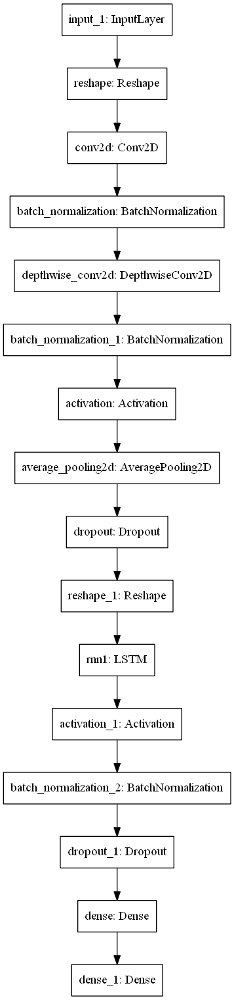

In [9]:
model = tf.keras.models.load_model(f'r2c_lstm_sra3_1_j_050_00+_split8.h5')
model.summary()
tf.keras.utils.plot_model(model, to_file='model.png')

## Loss and Accuracy Distribution

In [10]:
loss = []
val_loss = []
accuracy = []
val_accuracy = []

TRAIN = int(0.8*X_rates.shape[0])
BATCH_SIZE = 16
EPOCHS = 100

x_tr = X_rates[:TRAIN]
y_tr = Y_class[:TRAIN]
x_vl = X_rates[TRAIN:]
y_vl = Y_class[TRAIN:]

ds_train = tf.data.Dataset.from_tensor_slices((x_tr, y_tr))
ds_valid = tf.data.Dataset.from_tensor_slices((x_vl, y_vl))
ds_train = ds_train.shuffle(TRAIN + 1)
ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=True)

for i in range(100):
    print(f"Loop # {i+1}")
    tf.keras.backend.clear_session()
    randseed = 12345
    random.seed(randseed)
    np.random.seed(randseed)
    tf.random.set_seed(randseed)
    
    model = make_model(X_rates, Y_class.shape[-1], **model_kwargs)
    optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
    model.compile(optimizer=optim, loss='categorical_crossentropy', metrics=['accuracy'])
    
    history = model.fit(x=ds_train, epochs=EPOCHS, verbose=0, validation_data=ds_valid)
    loss.append(np.array(history.history['loss']))
    accuracy.append(np.array(history.history['accuracy']))
    val_loss.append(np.array(history.history['val_loss']))
    val_accuracy.append(np.array(history.history['val_accuracy']))

Loop # 1
Loop # 2
Loop # 3
Loop # 4
Loop # 5
Loop # 6
Loop # 7
Loop # 8
Loop # 9
Loop # 10
Loop # 11
Loop # 12
Loop # 13
Loop # 14
Loop # 15
Loop # 16
Loop # 17
Loop # 18
Loop # 19
Loop # 20
Loop # 21
Loop # 22
Loop # 23
Loop # 24
Loop # 25
Loop # 26
Loop # 27
Loop # 28
Loop # 29
Loop # 30
Loop # 31
Loop # 32
Loop # 33
Loop # 34
Loop # 35
Loop # 36
Loop # 37
Loop # 38
Loop # 39
Loop # 40
Loop # 41
Loop # 42
Loop # 43
Loop # 44
Loop # 45
Loop # 46
Loop # 47
Loop # 48
Loop # 49
Loop # 50
Loop # 51
Loop # 52
Loop # 53
Loop # 54
Loop # 55
Loop # 56
Loop # 57
Loop # 58
Loop # 59
Loop # 60
Loop # 61
Loop # 62
Loop # 63
Loop # 64
Loop # 65
Loop # 66
Loop # 67
Loop # 68
Loop # 69
Loop # 70
Loop # 71
Loop # 72
Loop # 73
Loop # 74
Loop # 75
Loop # 76
Loop # 77
Loop # 78
Loop # 79
Loop # 80
Loop # 81
Loop # 82
Loop # 83
Loop # 84
Loop # 85
Loop # 86
Loop # 87
Loop # 88
Loop # 89
Loop # 90
Loop # 91
Loop # 92
Loop # 93
Loop # 94
Loop # 95
Loop # 96
Loop # 97
Loop # 98
Loop # 99
Loop # 100


#### Chance Level

In [10]:
random_label = Y_class
np.random.shuffle(random_label)

TRAIN = int(0.8*X_rates.shape[0])
BATCH_SIZE = 16
EPOCHS = 100

x = X_rates
x_tr = X_rates[:TRAIN]
y_tr = random_label[:TRAIN]
x_vl = x[TRAIN:]
y_vl = random_label[TRAIN:]

ds_train = tf.data.Dataset.from_tensor_slices((x_tr, y_tr))
ds_valid = tf.data.Dataset.from_tensor_slices((x_vl, y_vl))
ds_train = ds_train.shuffle(TRAIN + 1)
ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=True)

tf.keras.backend.clear_session()
randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)

model = make_model(x_tr, Y_class.shape[-1], **model_kwargs)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

history = model.fit(x=ds_train, epochs=EPOCHS, verbose=1, validation_data=ds_valid)
shuf_loss=history.history['loss']
shuf_accuracy=history.history['accuracy']
shuf_val_loss=history.history['val_loss']
shuf_val_accuracy=history.history['val_accuracy']

Train for 14 steps, validate for 3 steps
Epoch 1/100
14/14 [==============================] - 8s 602ms/step - loss: 2.3270 - accuracy: 0.1741 - val_loss: 2.1543 - val_accuracy: 0.2500
Epoch 2/100
14/14 [==============================] - 1s 97ms/step - loss: 2.2174 - accuracy: 0.1964 - val_loss: 2.1501 - val_accuracy: 0.2708
Epoch 3/100
14/14 [==============================] - 1s 96ms/step - loss: 2.1790 - accuracy: 0.2098 - val_loss: 2.1438 - val_accuracy: 0.2708
Epoch 4/100
14/14 [==============================] - 1s 97ms/step - loss: 2.1134 - accuracy: 0.2455 - val_loss: 2.1403 - val_accuracy: 0.2708
Epoch 5/100
14/14 [==============================] - 1s 96ms/step - loss: 2.0860 - accuracy: 0.2589 - val_loss: 2.1377 - val_accuracy: 0.2708
Epoch 6/100
14/14 [==============================] - 1s 96ms/step - loss: 2.0958 - accuracy: 0.2455 - val_loss: 2.1342 - val_accuracy: 0.2708
Epoch 7/100
14/14 [==============================] - 1s 97ms/step - loss: 2.0457 - accuracy: 0.2991 - val_

14/14 [==============================] - 1s 96ms/step - loss: 1.6754 - accuracy: 0.4688 - val_loss: 2.4044 - val_accuracy: 0.2292
Epoch 59/100
14/14 [==============================] - 1s 97ms/step - loss: 1.6999 - accuracy: 0.4464 - val_loss: 2.3826 - val_accuracy: 0.2917
Epoch 60/100
14/14 [==============================] - 1s 97ms/step - loss: 1.6118 - accuracy: 0.5670 - val_loss: 2.4025 - val_accuracy: 0.3125
Epoch 61/100
14/14 [==============================] - 1s 97ms/step - loss: 1.6423 - accuracy: 0.5536 - val_loss: 2.4550 - val_accuracy: 0.2708
Epoch 62/100
14/14 [==============================] - 1s 96ms/step - loss: 1.6348 - accuracy: 0.5089 - val_loss: 2.4450 - val_accuracy: 0.2292
Epoch 63/100
14/14 [==============================] - 1s 96ms/step - loss: 1.6851 - accuracy: 0.4598 - val_loss: 2.4472 - val_accuracy: 0.2708
Epoch 64/100
14/14 [==============================] - 1s 97ms/step - loss: 1.6350 - accuracy: 0.5625 - val_loss: 2.3839 - val_accuracy: 0.2500
Epoch 65/100

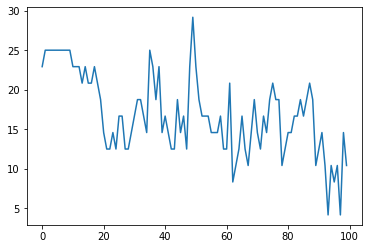

In [18]:
epochs = list(range(100))
plt.plot(epochs, 100*np.array(dist[7]))

In [33]:
len(shuf_val_accuracy)

100

In [34]:
dist = [loss, accuracy, val_loss, val_accuracy, shuf_loss, shuf_accuracy, shuf_val_loss, shuf_val_accuracy]

import pickle
with open('dist.pkl', 'wb') as f:
    pickle.dump(dist, f)


In [6]:
import pickle
with open('dist.pkl', 'rb') as f:
    dist = pickle.load(f)

In [36]:
mean_shuf_acc = np.mean(np.array(dist[5]), axis=0)
var_shuf_acc = np.var(np.array(dist[5]))

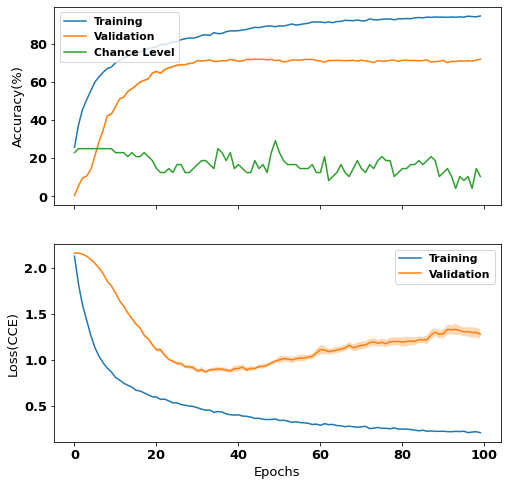

In [7]:
import matplotlib

mean_acc = np.mean(np.array(dist[1]), axis=0)
var_acc = np.var(np.array(dist[1]), axis=0)
mean_val_acc = np.mean(np.array(dist[3]), axis=0)
var_val_acc = np.var(np.array(dist[3]), axis=0)
mean_loss = np.mean(np.array(dist[0]), axis=0)
var_loss = np.var(np.array(dist[0]), axis=0)
mean_val_loss = np.mean(np.array(dist[2]), axis=0)
var_val_loss = np.var(np.array(dist[2]), axis=0)

mean_shuf_acc = np.mean(np.array(dist[5]), axis=0)
var_shuf_acc = np.var(np.array(dist[5]), axis=0)

font = {'weight' : 'bold',
        'size'   : 13}

matplotlib.rc('font', **font)


epochs = list(range(100))
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(8,8))
axs[0].plot(epochs, 100*mean_acc, label='Training')
axs[0].fill_between(epochs, 100*(mean_acc-var_acc), 100*(mean_acc+var_acc) ,alpha=0.3)
axs[0].plot(epochs, 100*mean_val_acc, label='Validation')
axs[0].fill_between(epochs, 100*(mean_val_acc-var_val_acc), 100*(mean_val_acc+var_val_acc) ,alpha=0.3)
axs[0].plot(epochs, 100*np.array(dist[7]), label='Chance Level')
# axs[0].fill_between(epochs, 100*(mean_shuf_acc-var_shuf_acc), 100*(mean_shuf_acc+var_shuf_acc) ,alpha=0.3)
axs[0].set(ylabel="Accuracy(%)")
axs[1].plot(epochs, mean_loss, label="Training")
axs[1].fill_between(epochs, mean_loss-var_loss, mean_loss+var_loss ,alpha=0.3)
axs[1].plot(epochs, mean_val_loss, label="Validation")
axs[1].fill_between(epochs, mean_val_loss-var_val_loss, mean_val_loss+var_val_loss ,alpha=0.3)
axs[1].set(xlabel="Epochs", ylabel="Loss(CCE)")
axs[0].legend(loc='upper left', fontsize='small')
axs[1].legend(loc='upper right', fontsize='small')

plt.savefig("distribution.svg")

## Accuracy as a function of data length

In [1]:
## THE NEXT TWO CELLS TAKES 15 HOURS ON CPU TO RUN
## WE HAVE THE RESULTS COPIED IN THIRD CELL

In [10]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 5
BATCH_SIZE = 16
EPOCHS = 100
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)



def get_hists_acc(sess_id, _x, y_class, l, verbose=1):
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(_x, y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        
        _y = tf.keras.utils.to_categorical(y_class, num_classes=8)
        ds_train = tf.data.Dataset.from_tensor_slices((_x[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((_x[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        kernLength = int(_x.shape[2]/7 + 1)
        ds_rate = int(_x.shape[2]/17 + 1)
        
        model = make_model(_x, _y.shape[-1], kernLength=kernLength, ds_rate=ds_rate, **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'length{l}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=0,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(_x[vld]).numpy())
        per_fold_true.append(y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nOveral accuracy using data of length {l} samples: {accuracy}%")
    
    return history, accuracy

In [28]:
acc = np.zeros(X_rates.shape[2]-1)

for l in range(1, X_rates.shape[2]):
    x = X_rates[:, :, :l]
    history, accuracy = get_hists_acc(sess_infos[1]['exp_code'], x, Y, l, verbose=0)
    
    acc[l-1] = accuracy

	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 1 samples: 28.07017543859649%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 2 samples: 31.57894736842105%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 3 samples: 29.12280701754386%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 4 samples: 29.12280701754386%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 5 samples: 26.31578947368421%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 6 samples: 28.771929824561404%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 7 samples: 30.17543859649123%
	Split 1 of 5
	Split 2 of 

	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 60 samples: 58.24561403508772%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 61 samples: 58.24561403508772%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 62 samples: 57.54385964912281%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 63 samples: 58.94736842105263%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 64 samples: 57.89473684210526%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 65 samples: 58.94736842105263%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 66 samples: 58.59649122807018%
	Split 1 of 5
	Split 2 of 5
	Split

	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 119 samples: 69.12280701754386%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 120 samples: 69.47368421052632%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 121 samples: 70.52631578947368%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 122 samples: 69.82456140350877%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 123 samples: 68.42105263157895%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 124 samples: 69.47368421052632%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 125 samples: 70.17543859649123%
	Split 1 of 5
	Split 2 of 5

In [55]:
accs = np.array([28.07017544, 31.57894737, 29.12280702, 29.12280702, 26.31578947,
       28.77192982, 30.1754386 , 28.77192982, 28.77192982, 27.71929825,
       27.36842105, 30.1754386 , 31.22807018, 30.1754386 , 30.1754386 ,
       29.8245614 , 29.8245614 , 31.57894737, 30.87719298, 29.8245614 ,
       31.57894737, 29.12280702, 28.77192982, 28.42105263, 29.8245614 ,
       30.1754386 , 29.12280702, 30.52631579, 28.42105263, 31.57894737,
       31.57894737, 30.87719298, 33.33333333, 32.98245614, 31.57894737,
       29.47368421, 31.57894737, 31.57894737, 32.28070175, 30.52631579,
       39.29824561, 43.50877193, 46.66666667, 44.21052632, 51.92982456,
       52.98245614, 52.63157895, 50.87719298, 58.24561404, 57.89473684,
       56.49122807, 55.43859649, 56.84210526, 56.49122807, 58.59649123,
       55.78947368, 57.19298246, 56.84210526, 56.14035088, 58.24561404,
       58.24561404, 57.54385965, 58.94736842, 57.89473684, 58.94736842,
       58.59649123, 60.70175439, 57.89473684, 56.14035088, 57.19298246,
       56.84210526, 58.24561404, 57.54385965, 57.89473684, 55.0877193 ,
       56.14035088, 56.49122807, 56.49122807, 57.19298246, 56.49122807,
       56.49122807, 56.49122807, 57.19298246, 55.43859649, 56.14035088,
       58.59649123, 56.14035088, 56.14035088, 55.78947368, 57.19298246,
       58.24561404, 58.94736842, 59.64912281, 60.35087719, 59.64912281,
       61.05263158, 63.50877193, 66.66666667, 66.66666667, 65.61403509,
       64.56140351, 63.50877193, 64.56140351, 65.26315789, 67.36842105,
       69.47368421, 68.77192982, 69.8245614 , 69.47368421, 68.77192982,
       70.87719298, 69.8245614 , 68.07017544, 69.8245614 , 68.42105263,
       70.52631579, 69.12280702, 71.57894737, 69.12280702, 69.47368421,
       70.52631579, 69.8245614 , 68.42105263, 69.47368421, 70.1754386 ,
       69.12280702, 69.12280702, 68.42105263, 70.52631579, 71.22807018,
       70.1754386 , 71.22807018, 73.68421053, 72.63157895, 71.92982456,
       73.68421053, 72.28070175, 72.98245614, 71.92982456, 74.38596491,
       74.38596491, 74.03508772, 73.68421053, 72.63157895, 71.57894737,
       78.94736842, 76.84210526, 78.24561404, 80.35087719, 78.59649123,
       78.24561404, 78.59649123, 79.29824561, 79.64912281, 78.94736842,
       79.64912281, 79.64912281, 79.29824561, 78.59649123, 79.64912281,
       79.29824561, 79.64912281, 80.70175439, 81.05263158, 81.75438596,
       80.70175439, 81.05263158, 81.40350877, 81.40350877, 80.70175439])
accs.shape

(170,)

In [56]:
t = np.arange(0, 1.6, .00945)
t.shape

(170,)

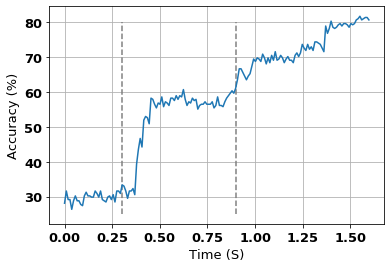

In [58]:
plt.plot(t, accs)
plt.vlines(x=0.3, ymin=25, ymax=80, linestyles='dashed', colors='grey')
plt.vlines(x=0.9, ymin=25, ymax=80, linestyles='dashed', colors='grey')
plt.ylabel("Accuracy (%)")
plt.xlabel("Time (S)")
plt.grid()
plt.savefig("performance_datapoint.svg")

### For all Sessions

In [39]:
# First four sessions
acc = np.zeros((4, 17))
for i in range(4):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"\nImporting session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    for j in range(1, 17):
        l = int(j * X_rates.shape[2] / 17)
        x = X_rates[:, :, :l]
        history, accuracy = get_hists_acc(sess_infos[i]['exp_code'], x, Y, l, verbose=0)

        acc[i, j-1] = accuracy


Importing session sra3_2_j_037_00+03
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 10 samples: 64.375%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 20 samples: 62.5%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 30 samples: 65.0%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 40 samples: 57.5%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 50 samples: 65.0%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 60 samples: 62.5%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 70 samples: 63.75%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 120 samples: 66.7870036101083%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 130 samples: 66.4259927797834%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 140 samples: 67.50902527075812%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 150 samples: 70.03610108303249%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 160 samples: 71.48014440433214%


In [12]:
acc = np.array([[64.375     , 62.5       , 65.        , 57.5       , 65.        ,
        62.5       , 63.75      , 61.875     , 65.625     , 66.875     ,
        60.625     , 62.5       , 60.        , 60.625     , 62.5       ,
        63.75],
       [27.71929825, 29.8245614 , 31.57894737, 30.52631579, 57.89473684,
        58.24561404, 57.19298246, 56.49122807, 57.19298246, 65.61403509,
        68.77192982, 69.47368421, 71.22807018, 74.38596491, 78.59649123,
        79.64912281],
       [44.64944649, 49.07749077, 52.39852399, 50.92250923, 65.31365314,
        68.63468635, 67.15867159, 66.7896679 , 69.00369004, 69.00369004,
        67.15867159, 68.63468635, 69.37269373, 71.58671587, 69.00369004,
        72.32472325],
       [41.51624549, 42.23826715, 47.29241877, 46.93140794, 66.06498195,
        65.70397112, 67.14801444, 67.50902527, 68.59205776, 64.98194946,
        67.50902527, 66.78700361, 66.42599278, 67.50902527, 70.03610108,
        71.4801444]])
acc.shape

(4, 16)

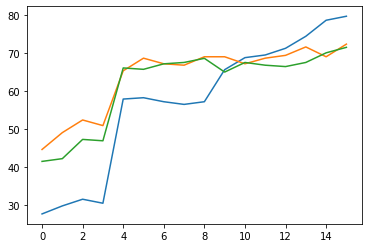

In [14]:
for i in range(1,4):
    plt.plot(acc[i])

In [12]:
# Second four sessions
acc2 = np.zeros((4, 17))
for i in range(4, 8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"\nImporting session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    for j in range(1, 17):
        l = int(j * X_rates.shape[2] / 17)
        x = X_rates[:, :, :l]
        history, accuracy = get_hists_acc(sess_infos[i]['exp_code'], x, Y, l, verbose=0)

        acc2[i-4, j-1] = accuracy


Importing session sra3_1_m_077_00+01
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 10 samples: 38.28125%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 20 samples: 40.625%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 30 samples: 42.96875%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 40 samples: 44.53125%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 50 samples: 53.125%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 60 samples: 56.25%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 70 samples: 59.375%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 

	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 130 samples: 69.41176470588235%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 140 samples: 63.529411764705884%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 150 samples: 67.05882352941177%
	Split 1 of 5
	Split 2 of 5
	Split 3 of 5
	Split 4 of 5
	Split 5 of 5


Overal accuracy using data of length 160 samples: 68.23529411764706%


In [11]:
acc2 = np.array([[38.28125   , 40.625     , 42.96875   , 44.53125   , 53.125     ,
        56.25      , 59.375     , 54.6875    , 53.90625   , 58.59375   ,
        64.0625    , 65.625     , 60.9375    , 64.84375   , 61.71875   ,
        65.625],
       [60.41666667, 54.16666667, 57.29166667, 55.20833333, 44.79166667,
        52.08333333, 53.125     , 54.16666667, 50.        , 51.04166667,
        53.125     , 60.41666667, 62.5       , 73.95833333, 70.83333333,
        72.91666667],
       [56.25      , 50.        , 50.        , 51.5625    , 59.375     ,
        57.8125    , 65.625     , 59.375     , 60.9375    , 57.8125    ,
        57.8125    , 59.375     , 67.1875    , 73.4375    , 73.4375    ,
        73.4375],
       [45.88235294, 50.58823529, 48.23529412, 48.23529412, 52.94117647,
        55.29411765, 56.47058824, 61.17647059, 67.05882353, 68.23529412,
        67.05882353, 67.05882353, 69.41176471, 63.52941176, 67.05882353,
        68.23529412]])
acc2.shape

(4, 16)

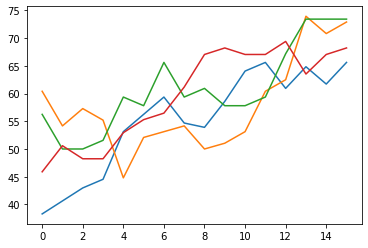

In [15]:
for i in range(4):
    plt.plot(acc2[i])

## Linearized Logistic Regression

In [10]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.model_selection import KFold

N_SPLITS = 10

kf = KFold(n_splits=N_SPLITS)
X = np.reshape(X_rates, (X_rates.shape[0], -1))
i = 1
scores = []

for train_index, test_index in kf.split(X):
    x_tr, x_ts = X[train_index], X[test_index]
    y_tr, y_ts = Y[train_index], Y[test_index]
    clf = LR(random_state=0, verbose=1).fit(x_tr, y_tr)
    acc = clf.score(x_ts, y_ts)
    scores.append(acc)
    print (f'Fold #{i} Accuracy is: {acc}')
    i+=1


print (f'The Linearized Logistic Regression Average Accuracy is: {np.mean(np.array(scores))}')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #1 Accuracy is: 0.8620689655172413


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #2 Accuracy is: 0.8275862068965517


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #3 Accuracy is: 0.7586206896551724


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #4 Accuracy is: 0.7586206896551724


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #5 Accuracy is: 0.8275862068965517


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #6 Accuracy is: 0.8571428571428571


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #7 Accuracy is: 0.8214285714285714


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #8 Accuracy is: 0.7857142857142857


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fold #9 Accuracy is: 0.8214285714285714
Fold #10 Accuracy is: 0.6785714285714286
The Linearized Logistic Regression Average Accuracy is: 0.7998768472906403


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


### RLR for all Sessions

In [33]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.model_selection import KFold

N_SPLITS = 10
accuracies = []

for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"\nImporting session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    kf = KFold(n_splits=N_SPLITS)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    i = 1
    tmp = []

    for train_index, test_index in kf.split(X):
        x_tr, x_ts = X[train_index], X[test_index]
        y_tr, y_ts = Y[train_index], Y[test_index]
        clf = LR(random_state=0, verbose=1).fit(x_tr, y_tr)
        y_prd = clf.predict(x_ts)
        tmp.append(y_prd)
    #     print (f'Fold #{i} Accuracy is: {acc}')
        i+=1

    predicted = tmp[0]
    for i in range(1, N_SPLITS):
        predicted = np.concatenate((predicted, tmp[i]))

    acc = 100 * np.sum(predicted == Y.flatten()) / len(predicted)
    print(f"\n{sess_id} overal accuracy: {acc}\n\n")

    accuracies.append(acc)



Importing session sra3_2_j_037_00+03


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_2_j_037_00+03 overal accuracy: 50.625



Importing session sra3_1_j_050_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_1_j_050_00+ overal accuracy: 80.0



Importing session sra3_1_j_051_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_1_j_051_00+ overal accuracy: 60.14760147601476



Importing session sra3_1_j_052_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_1_j_052_00+ overal accuracy: 50.90252707581227



Importing session sra3_1_m_077_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Us


sra3_1_m_077_00+01 overal accuracy: 52.34375



Importing session sra3_1_m_081_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Us


sra3_1_m_081_00+01 overal accuracy: 64.58333333333333



Importing session sra3_1_m_082_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Us


sra3_1_m_082_00+01 overal accuracy: 70.3125



Importing session sra3_1_m_083_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Us


sra3_1_m_083_00+01 overal accuracy: 69.41176470588235




[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished


In [35]:
accuracies = np.array([50.625,
 80.0,
 60.14760147601476,
 50.90252707581227,
 52.34375,
 64.58333333333333,
 70.3125,
 69.41176470588235])
accuracies

array([50.625     , 80.        , 60.14760148, 50.90252708, 52.34375   ,
       64.58333333, 70.3125    , 69.41176471])

## SVM

In [11]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold

N_SPLITS = 10

kf = KFold(n_splits=N_SPLITS)
X = np.reshape(X_rates, (X_rates.shape[0], -1))
i = 1
scores = []

for train_index, test_index in kf.split(X):
    x_tr, x_ts = X[train_index], X[test_index]
    y_tr, y_ts = Y[train_index], Y[test_index]
    clf = SVC(verbose=1).fit(x_tr, y_tr)
    acc = clf.score(x_ts, y_ts)
    scores.append(acc)
    print (f'Fold #{i} Accuracy is: {acc}')
    i+=1


print (f'The SVM Average Accuracy is: {np.mean(np.array(scores))}')

[LibSVM]Fold #1 Accuracy is: 0.5862068965517241
[LibSVM]Fold #2 Accuracy is: 0.7586206896551724
[LibSVM]Fold #3 Accuracy is: 0.7241379310344828
[LibSVM]Fold #4 Accuracy is: 0.7241379310344828
[LibSVM]Fold #5 Accuracy is: 0.7241379310344828
[LibSVM]Fold #6 Accuracy is: 0.7857142857142857
[LibSVM]Fold #7 Accuracy is: 0.8571428571428571
[LibSVM]Fold #8 Accuracy is: 0.8214285714285714
[LibSVM]Fold #9 Accuracy is: 0.6428571428571429
[LibSVM]Fold #10 Accuracy is: 0.5714285714285714
The SVM Average Accuracy is: 0.7195812807881773


### SVM for all Sessions

In [36]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold

N_SPLITS = 10
accuracies = []

for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"\nImporting session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    kf = KFold(n_splits=N_SPLITS)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    i = 1
    tmp = []

    for train_index, test_index in kf.split(X):
        x_tr, x_ts = X[train_index], X[test_index]
        y_tr, y_ts = Y[train_index], Y[test_index]
        clf = SVC(random_state=0, verbose=1).fit(x_tr, y_tr)
        y_prd = clf.predict(x_ts)
        tmp.append(y_prd)
    #     print (f'Fold #{i} Accuracy is: {acc}')
        i+=1

    predicted = tmp[0]
    for i in range(1, N_SPLITS):
        predicted = np.concatenate((predicted, tmp[i]))

    acc = 100 * np.sum(predicted == Y.flatten()) / len(predicted)
    print(f"\n{sess_id} overal accuracy: {acc}\n\n")

    accuracies.append(acc)


Importing session sra3_2_j_037_00+03
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]
sra3_2_j_037_00+03 overal accuracy: 53.125



Importing session sra3_1_j_050_00+
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]
sra3_1_j_050_00+ overal accuracy: 71.9298245614035



Importing session sra3_1_j_051_00+
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]
sra3_1_j_051_00+ overal accuracy: 60.14760147601476



Importing session sra3_1_j_052_00+
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]
sra3_1_j_052_00+ overal accuracy: 54.51263537906137



Importing session sra3_1_m_077_00+01
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]
sra3_1_m_077_00+01 overal accuracy: 42.96875



Importing session sra3_1_m_081_00+01
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]
sra3_1_m_081_00+01 overal accuracy: 62.

In [38]:
accuracies = np.array([53.125,
 71.9298245614035,
 60.14760147601476,
 54.51263537906137,
 42.96875,
 62.5,
 56.25,
 45.88235294117647])
accuracies

array([53.125     , 71.92982456, 60.14760148, 54.51263538, 42.96875   ,
       62.5       , 56.25      , 45.88235294])

## Random Forrest

In [12]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold

N_SPLITS = 10

kf = KFold(n_splits=N_SPLITS)
X = np.reshape(X_rates, (X_rates.shape[0], -1))
i = 1
scores = []

for train_index, test_index in kf.split(X):
    x_tr, x_ts = X[train_index], X[test_index]
    y_tr, y_ts = Y[train_index], Y[test_index]
    clf = RandomForestClassifier(max_depth=6, random_state=0).fit(x_tr, y_tr)
    acc = clf.score(x_ts, y_ts)
    scores.append(acc)
    print (f'Fold #{i} Accuracy is: {acc}')
    i+=1


print (f'The Random Forrest Average Accuracy is: {np.mean(np.array(scores))}')

Fold #1 Accuracy is: 0.5172413793103449
Fold #2 Accuracy is: 0.6206896551724138
Fold #3 Accuracy is: 0.8275862068965517
Fold #4 Accuracy is: 0.7931034482758621
Fold #5 Accuracy is: 0.6551724137931034
Fold #6 Accuracy is: 0.6785714285714286
Fold #7 Accuracy is: 0.7857142857142857
Fold #8 Accuracy is: 0.7142857142857143
Fold #9 Accuracy is: 0.4642857142857143
Fold #10 Accuracy is: 0.6428571428571429
The Random Forrest Average Accuracy is: 0.6699507389162562


### Random Forrest for all Sessions

In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold

N_SPLITS = 10
accuracies = []

for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"\nImporting session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    kf = KFold(n_splits=N_SPLITS)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    i = 1
    tmp = []

    for train_index, test_index in kf.split(X):
        x_tr, x_ts = X[train_index], X[test_index]
        y_tr, y_ts = Y[train_index], Y[test_index]
        clf = RandomForestClassifier(max_depth=6, random_state=0).fit(x_tr, y_tr)
        y_prd = clf.predict(x_ts)
        tmp.append(y_prd)
        i+=1

    predicted = tmp[0]
    for i in range(1, N_SPLITS):
        predicted = np.concatenate((predicted, tmp[i]))

    acc = 100 * np.sum(predicted == Y.flatten()) / len(predicted)
    print(f"\n{sess_id} overal accuracy: {acc}\n\n")

    accuracies.append(acc)


Importing session sra3_2_j_037_00+03

sra3_2_j_037_00+03 overal accuracy: 49.375



Importing session sra3_1_j_050_00+

sra3_1_j_050_00+ overal accuracy: 67.01754385964912



Importing session sra3_1_j_051_00+

sra3_1_j_051_00+ overal accuracy: 56.457564575645755



Importing session sra3_1_j_052_00+

sra3_1_j_052_00+ overal accuracy: 54.151624548736464



Importing session sra3_1_m_077_00+01

sra3_1_m_077_00+01 overal accuracy: 39.0625



Importing session sra3_1_m_081_00+01

sra3_1_m_081_00+01 overal accuracy: 67.70833333333333



Importing session sra3_1_m_082_00+01

sra3_1_m_082_00+01 overal accuracy: 60.9375



Importing session sra3_1_m_083_00+01

sra3_1_m_083_00+01 overal accuracy: 70.58823529411765




In [41]:
accuracies = np.array([49.375,
 67.01754385964912,
 56.457564575645755,
 54.151624548736464,
 39.0625,
 67.70833333333333,
 60.9375,
 70.58823529411765])
accuracies

array([49.375     , 67.01754386, 56.45756458, 54.15162455, 39.0625    ,
       67.70833333, 60.9375    , 70.58823529])

## Methods Comparison

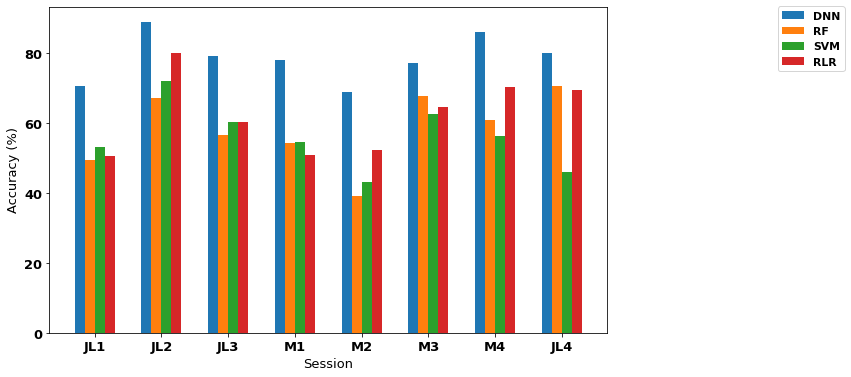

In [5]:
import matplotlib
font = {'weight' : 'bold',
        'size'   : 13}

matplotlib.rc('font', **font)

sessions = ['JL1', 'JL2', 'JL3', 'M1', 'M2', 'M3', 'M4', 'JL4']
x = np.arange(0, 2*len(sessions), 2)  # the label locations
width = 0.3

dnn = np.array([70.625, 88.7719298245614, 78.96678966789668,
               77.9783393501805, 68.75, 77.08333333333333, 85.9375, 80.0])
rf = np.array([49.375, 67.01754385964912, 56.457564575645755, 54.151624548736464,
               39.0625, 67.70833333333333, 60.9375, 70.58823529411765])
rlr = np.array([50.625, 80.0, 60.14760147601476, 50.90252707581227,
                52.34375, 64.58333333333333, 70.3125, 69.41176470588235])
svm = np.array([53.125, 71.9298245614035, 60.14760147601476, 54.51263537906137,
                42.96875, 62.5, 56.25, 45.88235294117647])

fig, ax = plt.subplots(figsize=(10,6))
rects1 = ax.bar(x - 3*width/2, dnn, width, label='DNN')
rects2 = ax.bar(x - width/2, rf, width, label='RF')
rects4 = ax.bar(x + width/2, svm, width, label='SVM')
rects3 = ax.bar(x + 3*width/2, rlr, width, label='RLR')


ax.set_ylabel('Accuracy (%)')
ax.set_xlabel('Session')
ax.set_xticks(x)
ax.set_xticklabels(sessions)
ax.legend(loc='lower right', bbox_to_anchor=(1.435, .785), fontsize='small')
fig.savefig("performance.svg")
# fig.tight_layout()
plt.show()

## Testing on Error Trials

### RNN

In [68]:
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs2)

In [74]:
print(ax_info['instance_data'])

     Marker ExperimentType NewType CueColour TargetRule TargetStr  \
109  Target              C     SR3         b         RR        RR   
112  Target              C     SR3         b         RR        RR   
114  Target              C     SR3         b         RR        RR   
117  Target              C     SR3         r         LL        LL   
118  Target              C     SR3         b         RR        RR   
124  Target              C     SR3         r         LL        LL   
128  Target              C     SR3         b         RR        RR   
131  Target              C     SR3         r         LL        LL   
135  Target              C     SR3         r         LL        LL   
149  Target              C     SR3         r         LL        LL   
151  Target              C     SR3         r         LL        LL   
156  Target              C     SR3         b         RR        RR   
158  Target              C     SR3         r         LL        LL   
159  Target              C     SR3

In [19]:
test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"Importing session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)

x_avg = np.zeros((8, X_rates.shape[1], X_rates.shape[2]))
num = np.zeros(8)
for i in range(X_rates.shape[0]):
    x_avg[Y[i]] += X_rates[i]
    num[Y[i]] += 1

# x_avg /= num[:, np.newaxis, np.newaxis]


Importing session sra3_2_j_037_00+03


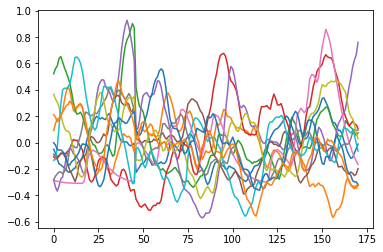

In [26]:
plt.plot(x_avg[7].T/num[7])

In [27]:
test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"Importing session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

x_avg2 = np.zeros((8, X_rates.shape[1], X_rates.shape[2]))
num2 = np.zeros(8)
for i in range(X_rates.shape[0]):
    x_avg2[Y[i]] += X_rates[i]
    num2[Y[i]] += 1

Importing session sra3_2_j_037_00+03


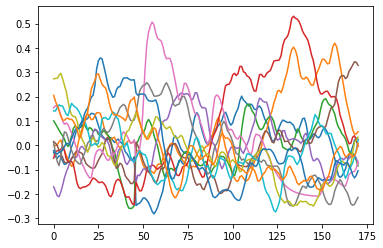

In [28]:
plt.plot(x_avg2[7].T/num2[7])

### Using Error Trials as Validation Data

In [13]:
accuracy = np.zeros(8)
for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"Importing session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    _y = tf.keras.utils.to_categorical(Y, num_classes=8)
    X_err, Y_err, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
    _y_err = tf.keras.utils.to_categorical(Y_err, num_classes=8)
    tf.keras.backend.clear_session()

    randseed = 12345
    random.seed(randseed)
    np.random.seed(randseed)
    tf.random.set_seed(randseed)

    model = make_model(X_rates, _y.shape[-1], **model_kwargs)
    optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
    loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
    model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
    model.fit(x=X_rates,y=_y, epochs=EPOCHS, validation_data=(X_err, _y_err), verbose=1)
    
    
    
#     pred_y = np.argmax(model.predict(X_rates), axis=1)
#     true_y = Y.flatten()
#     accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
#     print(f"RNN: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n\n")

Importing session sra3_2_j_037_00+03
Train on 160 samples, validate on 25 samples
Epoch 1/180
160/160 [==============================] - 3s 20ms/sample - loss: 2.4765 - accuracy: 0.1437 - val_loss: 2.1196 - val_accuracy: 0.6800
Epoch 2/180
160/160 [==============================] - 0s 1ms/sample - loss: 2.3173 - accuracy: 0.1688 - val_loss: 2.1048 - val_accuracy: 0.5600
Epoch 3/180
160/160 [==============================] - 0s 994us/sample - loss: 2.1225 - accuracy: 0.2875 - val_loss: 2.0873 - val_accuracy: 0.3600
Epoch 4/180
160/160 [==============================] - 0s 962us/sample - loss: 1.9980 - accuracy: 0.3000 - val_loss: 2.0683 - val_accuracy: 0.2400
Epoch 5/180
160/160 [==============================] - 0s 980us/sample - loss: 1.8091 - accuracy: 0.4938 - val_loss: 2.0451 - val_accuracy: 0.2400
Epoch 6/180
160/160 [==============================] - 0s 957us/sample - loss: 1.7140 - accuracy: 0.4750 - val_loss: 2.0212 - val_accuracy: 0.2400
Epoch 7/180
160/160 [==================

160/160 [==============================] - 0s 1ms/sample - loss: 1.2157 - accuracy: 0.7750 - val_loss: 1.6514 - val_accuracy: 0.2800
Epoch 57/180
160/160 [==============================] - 0s 966us/sample - loss: 1.2147 - accuracy: 0.7250 - val_loss: 1.6593 - val_accuracy: 0.2800
Epoch 58/180
160/160 [==============================] - 0s 998us/sample - loss: 1.1818 - accuracy: 0.8000 - val_loss: 1.6606 - val_accuracy: 0.2800
Epoch 59/180
160/160 [==============================] - 0s 991us/sample - loss: 1.1589 - accuracy: 0.8500 - val_loss: 1.6364 - val_accuracy: 0.3200
Epoch 60/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.1786 - accuracy: 0.7875 - val_loss: 1.6627 - val_accuracy: 0.3200
Epoch 61/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.2177 - accuracy: 0.7937 - val_loss: 1.6518 - val_accuracy: 0.2800
Epoch 62/180
160/160 [==============================] - 0s 976us/sample - loss: 1.1883 - accuracy: 0.8188 - val_loss: 1.6417 - val_

Epoch 112/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0457 - accuracy: 0.9062 - val_loss: 1.6863 - val_accuracy: 0.3600
Epoch 113/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0477 - accuracy: 0.8813 - val_loss: 1.6364 - val_accuracy: 0.4400
Epoch 114/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0633 - accuracy: 0.8750 - val_loss: 1.6132 - val_accuracy: 0.4400
Epoch 115/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0425 - accuracy: 0.8813 - val_loss: 1.4909 - val_accuracy: 0.4400
Epoch 116/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0564 - accuracy: 0.8875 - val_loss: 1.5985 - val_accuracy: 0.4000
Epoch 117/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0471 - accuracy: 0.9000 - val_loss: 1.7157 - val_accuracy: 0.3600
Epoch 118/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0289 - accuracy: 0.9062 - val_loss: 1

Epoch 168/180
160/160 [==============================] - 0s 1ms/sample - loss: 0.9879 - accuracy: 0.9375 - val_loss: 1.6373 - val_accuracy: 0.5600
Epoch 169/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0204 - accuracy: 0.9312 - val_loss: 1.6021 - val_accuracy: 0.6400
Epoch 170/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0050 - accuracy: 0.9187 - val_loss: 1.6994 - val_accuracy: 0.5200
Epoch 171/180
160/160 [==============================] - 0s 1ms/sample - loss: 0.9783 - accuracy: 0.9625 - val_loss: 1.7316 - val_accuracy: 0.4800
Epoch 172/180
160/160 [==============================] - 0s 1ms/sample - loss: 1.0007 - accuracy: 0.9250 - val_loss: 1.6788 - val_accuracy: 0.5200
Epoch 173/180
160/160 [==============================] - 0s 1ms/sample - loss: 0.9960 - accuracy: 0.9500 - val_loss: 1.6360 - val_accuracy: 0.5200
Epoch 174/180
160/160 [==============================] - 0s 1ms/sample - loss: 0.9934 - accuracy: 0.9375 - val_loss: 1

285/285 [==============================] - 1s 3ms/sample - loss: 1.0061 - accuracy: 0.9439 - val_loss: 1.5248 - val_accuracy: 0.7083
Epoch 100/180
285/285 [==============================] - 1s 3ms/sample - loss: 0.9708 - accuracy: 0.9544 - val_loss: 1.5418 - val_accuracy: 0.6250
Epoch 101/180
285/285 [==============================] - 1s 3ms/sample - loss: 1.0022 - accuracy: 0.9368 - val_loss: 1.5602 - val_accuracy: 0.6667
Epoch 102/180
285/285 [==============================] - 1s 3ms/sample - loss: 0.9671 - accuracy: 0.9684 - val_loss: 1.5035 - val_accuracy: 0.7083
Epoch 103/180
285/285 [==============================] - 1s 3ms/sample - loss: 0.9990 - accuracy: 0.9333 - val_loss: 1.4476 - val_accuracy: 0.7083
Epoch 104/180
285/285 [==============================] - 1s 3ms/sample - loss: 0.9786 - accuracy: 0.9474 - val_loss: 1.4535 - val_accuracy: 0.7083
Epoch 105/180
285/285 [==============================] - 1s 3ms/sample - loss: 0.9904 - accuracy: 0.9228 - val_loss: 1.5134 - val_ac

271/271 [==============================] - 1s 3ms/sample - loss: 1.1886 - accuracy: 0.8044 - val_loss: 1.4303 - val_accuracy: 0.6897
Epoch 30/180
271/271 [==============================] - 1s 4ms/sample - loss: 1.1949 - accuracy: 0.7749 - val_loss: 1.4144 - val_accuracy: 0.6897
Epoch 31/180
271/271 [==============================] - 1s 3ms/sample - loss: 1.2157 - accuracy: 0.8007 - val_loss: 1.4051 - val_accuracy: 0.7586
Epoch 32/180
271/271 [==============================] - 1s 4ms/sample - loss: 1.1764 - accuracy: 0.8155 - val_loss: 1.3955 - val_accuracy: 0.7586
Epoch 33/180
271/271 [==============================] - 1s 3ms/sample - loss: 1.1779 - accuracy: 0.8007 - val_loss: 1.3674 - val_accuracy: 0.7931
Epoch 34/180
271/271 [==============================] - 1s 3ms/sample - loss: 1.1476 - accuracy: 0.8376 - val_loss: 1.3382 - val_accuracy: 0.7586
Epoch 35/180
271/271 [==============================] - 1s 3ms/sample - loss: 1.1773 - accuracy: 0.7970 - val_loss: 1.3219 - val_accuracy

Epoch 141/180
271/271 [==============================] - 1s 3ms/sample - loss: 0.9064 - accuracy: 0.9815 - val_loss: 1.5322 - val_accuracy: 0.7241
Epoch 142/180
271/271 [==============================] - 1s 4ms/sample - loss: 0.9089 - accuracy: 0.9779 - val_loss: 1.5920 - val_accuracy: 0.6897
Epoch 143/180
271/271 [==============================] - 1s 3ms/sample - loss: 0.9108 - accuracy: 0.9852 - val_loss: 1.5571 - val_accuracy: 0.7241
Epoch 144/180
271/271 [==============================] - 1s 3ms/sample - loss: 0.9291 - accuracy: 0.9631 - val_loss: 1.5406 - val_accuracy: 0.7241
Epoch 145/180
271/271 [==============================] - 1s 4ms/sample - loss: 0.9212 - accuracy: 0.9742 - val_loss: 1.5034 - val_accuracy: 0.6552
Epoch 146/180
271/271 [==============================] - 1s 4ms/sample - loss: 0.9457 - accuracy: 0.9668 - val_loss: 1.6007 - val_accuracy: 0.6897
Epoch 147/180
271/271 [==============================] - 1s 3ms/sample - loss: 0.9235 - accuracy: 0.9668 - val_loss: 1

277/277 [==============================] - 1s 3ms/sample - loss: 1.1495 - accuracy: 0.8484 - val_loss: 1.3690 - val_accuracy: 0.6087
Epoch 73/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.1717 - accuracy: 0.8051 - val_loss: 1.4295 - val_accuracy: 0.5652
Epoch 74/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.1526 - accuracy: 0.8303 - val_loss: 1.3770 - val_accuracy: 0.5870
Epoch 75/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.1114 - accuracy: 0.8556 - val_loss: 1.3601 - val_accuracy: 0.5652
Epoch 76/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.1348 - accuracy: 0.8412 - val_loss: 1.4023 - val_accuracy: 0.5652
Epoch 77/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.1320 - accuracy: 0.8231 - val_loss: 1.3992 - val_accuracy: 0.5652
Epoch 78/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.1559 - accuracy: 0.8339 - val_loss: 1.3515 - val_accuracy

277/277 [==============================] - 1s 3ms/sample - loss: 0.9919 - accuracy: 0.9495 - val_loss: 1.4910 - val_accuracy: 0.6087
Epoch 129/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.0422 - accuracy: 0.9097 - val_loss: 1.4357 - val_accuracy: 0.6304
Epoch 130/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.0328 - accuracy: 0.8989 - val_loss: 1.5006 - val_accuracy: 0.6304
Epoch 131/180
277/277 [==============================] - 1s 3ms/sample - loss: 0.9936 - accuracy: 0.9350 - val_loss: 1.5507 - val_accuracy: 0.6087
Epoch 132/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.0223 - accuracy: 0.9206 - val_loss: 1.4329 - val_accuracy: 0.5870
Epoch 133/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.0265 - accuracy: 0.9314 - val_loss: 1.4471 - val_accuracy: 0.5870
Epoch 134/180
277/277 [==============================] - 1s 3ms/sample - loss: 1.0194 - accuracy: 0.9206 - val_loss: 1.4087 - val_ac

128/128 [==============================] - 0s 2ms/sample - loss: 1.3094 - accuracy: 0.7578 - val_loss: 1.6557 - val_accuracy: 0.4444
Epoch 60/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.2336 - accuracy: 0.8047 - val_loss: 1.6781 - val_accuracy: 0.4444
Epoch 61/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.2262 - accuracy: 0.7891 - val_loss: 1.6781 - val_accuracy: 0.4444
Epoch 62/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.2694 - accuracy: 0.7734 - val_loss: 1.6484 - val_accuracy: 0.4444
Epoch 63/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.2055 - accuracy: 0.8125 - val_loss: 1.6513 - val_accuracy: 0.4444
Epoch 64/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.2210 - accuracy: 0.8203 - val_loss: 1.6482 - val_accuracy: 0.4444
Epoch 65/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.2452 - accuracy: 0.7734 - val_loss: 1.6628 - val_accuracy

Epoch 171/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0434 - accuracy: 0.9062 - val_loss: 1.7641 - val_accuracy: 0.5556
Epoch 172/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0424 - accuracy: 0.9297 - val_loss: 1.9455 - val_accuracy: 0.5556
Epoch 173/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0232 - accuracy: 0.9297 - val_loss: 1.8882 - val_accuracy: 0.5556
Epoch 174/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0154 - accuracy: 0.9453 - val_loss: 1.8416 - val_accuracy: 0.5556
Epoch 175/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0052 - accuracy: 0.9609 - val_loss: 1.8551 - val_accuracy: 0.4444
Epoch 176/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0237 - accuracy: 0.9219 - val_loss: 1.9368 - val_accuracy: 0.4444
Epoch 177/180
128/128 [==============================] - 0s 2ms/sample - loss: 1.0285 - accuracy: 0.9141 - val_loss: 1

Epoch 104/180
96/96 [==============================] - 0s 2ms/sample - loss: 1.0066 - accuracy: 0.9583 - val_loss: 1.8318 - val_accuracy: 0.4400
Epoch 105/180
96/96 [==============================] - 0s 2ms/sample - loss: 1.0048 - accuracy: 0.9375 - val_loss: 1.7985 - val_accuracy: 0.4400
Epoch 106/180
96/96 [==============================] - 0s 2ms/sample - loss: 1.0448 - accuracy: 0.9375 - val_loss: 1.7882 - val_accuracy: 0.4400
Epoch 107/180
96/96 [==============================] - 0s 2ms/sample - loss: 0.9776 - accuracy: 0.9792 - val_loss: 1.7986 - val_accuracy: 0.4400
Epoch 108/180
96/96 [==============================] - 0s 2ms/sample - loss: 1.0191 - accuracy: 0.9375 - val_loss: 1.8006 - val_accuracy: 0.4000
Epoch 109/180
96/96 [==============================] - 0s 2ms/sample - loss: 1.0112 - accuracy: 0.9375 - val_loss: 1.8147 - val_accuracy: 0.4400
Epoch 110/180
96/96 [==============================] - 0s 2ms/sample - loss: 1.0133 - accuracy: 0.9271 - val_loss: 1.8056 - val_ac

64/64 [==============================] - 0s 2ms/sample - loss: 1.1338 - accuracy: 0.9062 - val_loss: 1.9419 - val_accuracy: 0.3000
Epoch 37/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.1159 - accuracy: 0.8594 - val_loss: 1.9339 - val_accuracy: 0.4000
Epoch 38/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.1579 - accuracy: 0.8906 - val_loss: 1.9333 - val_accuracy: 0.4000
Epoch 39/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.1383 - accuracy: 0.8906 - val_loss: 1.9354 - val_accuracy: 0.5000
Epoch 40/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.1556 - accuracy: 0.8906 - val_loss: 1.9253 - val_accuracy: 0.5000
Epoch 41/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.1210 - accuracy: 0.9219 - val_loss: 1.9231 - val_accuracy: 0.5000
Epoch 42/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.0654 - accuracy: 0.9375 - val_loss: 1.9258 - val_accuracy: 0.5000
Epoch

Epoch 93/180
64/64 [==============================] - 0s 2ms/sample - loss: 0.9454 - accuracy: 1.0000 - val_loss: 1.8024 - val_accuracy: 0.5000
Epoch 94/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.0344 - accuracy: 0.9219 - val_loss: 1.8042 - val_accuracy: 0.5000
Epoch 95/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.0239 - accuracy: 0.9375 - val_loss: 1.7964 - val_accuracy: 0.5000
Epoch 96/180
64/64 [==============================] - 0s 2ms/sample - loss: 1.0050 - accuracy: 0.9531 - val_loss: 1.8071 - val_accuracy: 0.5000
Epoch 97/180
64/64 [==============================] - 0s 2ms/sample - loss: 0.9308 - accuracy: 1.0000 - val_loss: 1.7890 - val_accuracy: 0.5000
Epoch 98/180
64/64 [==============================] - 0s 2ms/sample - loss: 0.9446 - accuracy: 0.9844 - val_loss: 1.7926 - val_accuracy: 0.5000
Epoch 99/180
64/64 [==============================] - 0s 2ms/sample - loss: 0.9322 - accuracy: 1.0000 - val_loss: 1.7838 - val_accuracy:

85/85 [==============================] - 0s 3ms/sample - loss: 1.4510 - accuracy: 0.6706 - val_loss: 1.9531 - val_accuracy: 0.6667
Epoch 26/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.3531 - accuracy: 0.7176 - val_loss: 1.9502 - val_accuracy: 0.6667
Epoch 27/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.2897 - accuracy: 0.7765 - val_loss: 1.9474 - val_accuracy: 0.6111
Epoch 28/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.3491 - accuracy: 0.7176 - val_loss: 1.9385 - val_accuracy: 0.6111
Epoch 29/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.2446 - accuracy: 0.8471 - val_loss: 1.9349 - val_accuracy: 0.6111
Epoch 30/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.3414 - accuracy: 0.7294 - val_loss: 1.9323 - val_accuracy: 0.6111
Epoch 31/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.2995 - accuracy: 0.8000 - val_loss: 1.9289 - val_accuracy: 0.6111
Epoch

Epoch 82/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.0396 - accuracy: 0.9294 - val_loss: 1.6713 - val_accuracy: 0.4444
Epoch 83/180
85/85 [==============================] - 0s 3ms/sample - loss: 0.9890 - accuracy: 0.9647 - val_loss: 1.6756 - val_accuracy: 0.4444
Epoch 84/180
85/85 [==============================] - 0s 3ms/sample - loss: 0.9827 - accuracy: 0.9882 - val_loss: 1.6849 - val_accuracy: 0.4444
Epoch 85/180
85/85 [==============================] - 0s 3ms/sample - loss: 0.9876 - accuracy: 0.9765 - val_loss: 1.6813 - val_accuracy: 0.4444
Epoch 86/180
85/85 [==============================] - 0s 2ms/sample - loss: 1.0004 - accuracy: 0.9647 - val_loss: 1.6990 - val_accuracy: 0.4444
Epoch 87/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.0049 - accuracy: 0.9529 - val_loss: 1.7360 - val_accuracy: 0.3333
Epoch 88/180
85/85 [==============================] - 0s 3ms/sample - loss: 1.0200 - accuracy: 0.9529 - val_loss: 1.7200 - val_accuracy:

### Using Error Trials as Test Data

In [14]:
accuracy = np.zeros(8)
for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"Importing session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    _y = tf.keras.utils.to_categorical(Y, num_classes=8)
    tf.keras.backend.clear_session()

    randseed = 12345
    random.seed(randseed)
    np.random.seed(randseed)
    tf.random.set_seed(randseed)

    model = make_model(X_rates, _y.shape[-1], **model_kwargs)
    optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
    loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
    model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
    model.fit(x=X_rates,y=_y, epochs=EPOCHS, verbose=0)
    
    X_err, Y_err, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
    pred_y = np.argmax(model.predict(X_err), axis=1)
    true_y = Y_err.flatten()
    accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"RNN: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n\n")

Importing session sra3_2_j_037_00+03
RNN: Session sra3_2_j_037_00+03 Accuracy over Error Trials: 44.0%


Importing session sra3_1_j_050_00+
RNN: Session sra3_1_j_050_00+ Accuracy over Error Trials: 62.5%


Importing session sra3_1_j_051_00+
RNN: Session sra3_1_j_051_00+ Accuracy over Error Trials: 65.51724137931035%


Importing session sra3_1_j_052_00+
RNN: Session sra3_1_j_052_00+ Accuracy over Error Trials: 65.21739130434783%


Importing session sra3_1_m_077_00+01
RNN: Session sra3_1_m_077_00+01 Accuracy over Error Trials: 44.44444444444444%


Importing session sra3_1_m_081_00+01
RNN: Session sra3_1_m_081_00+01 Accuracy over Error Trials: 40.0%


Importing session sra3_1_m_082_00+01
RNN: Session sra3_1_m_082_00+01 Accuracy over Error Trials: 40.0%


Importing session sra3_1_m_083_00+01
RNN: Session sra3_1_m_083_00+01 Accuracy over Error Trials: 33.333333333333336%




In [11]:
err_acc_rnn = np.array([44.        , 62.5       , 65.51724138, 65.2173913 , 44.44444444,
       40.        , 40.        , 33.33333333])

### SVM

In [20]:
from sklearn.svm import SVC

accuracy = np.zeros(8)

for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"Importing session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    clf = SVC(random_state=0, verbose=1).fit(X, Y)
    
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    pred_y = clf.predict(X)
    true_y = Y.flatten()
    accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"SVM: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n")

Importing session sra3_2_j_037_00+03
[LibSVM]SVM: Session sra3_2_j_037_00+03 Accuracy over Error Trials: 64.0%

Importing session sra3_1_j_050_00+
[LibSVM]SVM: Session sra3_1_j_050_00+ Accuracy over Error Trials: 70.83333333333333%

Importing session sra3_1_j_051_00+
[LibSVM]SVM: Session sra3_1_j_051_00+ Accuracy over Error Trials: 75.86206896551724%

Importing session sra3_1_j_052_00+
[LibSVM]SVM: Session sra3_1_j_052_00+ Accuracy over Error Trials: 67.3913043478261%

Importing session sra3_1_m_077_00+01
[LibSVM]SVM: Session sra3_1_m_077_00+01 Accuracy over Error Trials: 44.44444444444444%

Importing session sra3_1_m_081_00+01
[LibSVM]SVM: Session sra3_1_m_081_00+01 Accuracy over Error Trials: 32.0%

Importing session sra3_1_m_082_00+01
[LibSVM]SVM: Session sra3_1_m_082_00+01 Accuracy over Error Trials: 40.0%

Importing session sra3_1_m_083_00+01
[LibSVM]SVM: Session sra3_1_m_083_00+01 Accuracy over Error Trials: 38.888888888888886%



In [12]:
err_acc_svm = np.array([64.        , 70.83333333, 75.86206897, 67.39130435, 44.44444444,
       32.        , 40.        , 38.88888889])


In [11]:
for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"Importing session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
    print(X_rates.shape[0])

Importing session sra3_2_j_037_00+03
25
Importing session sra3_1_j_050_00+
24
Importing session sra3_1_j_051_00+
29
Importing session sra3_1_j_052_00+
46
Importing session sra3_1_m_077_00+01
9
Importing session sra3_1_m_081_00+01
25
Importing session sra3_1_m_082_00+01
10
Importing session sra3_1_m_083_00+01
18


## RLR

In [35]:
from sklearn.linear_model import LogisticRegression as LR

accuracy = np.zeros(8)

for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"Importing session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    clf = LR(random_state=0, verbose=1).fit(X, Y)
    
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    pred_y = clf.predict(X)
    true_y = Y.flatten()
    accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"RLR: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n")

Importing session sra3_2_j_037_00+03
RLR: Session sra3_2_j_037_00+03 Accuracy over Error Trials: 60.0%

Importing session sra3_1_j_050_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


RLR: Session sra3_1_j_050_00+ Accuracy over Error Trials: 66.66666666666667%

Importing session sra3_1_j_051_00+


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


RLR: Session sra3_1_j_051_00+ Accuracy over Error Trials: 68.96551724137932%

Importing session sra3_1_j_052_00+


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


RLR: Session sra3_1_j_052_00+ Accuracy over Error Trials: 54.34782608695652%

Importing session sra3_1_m_077_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


RLR: Session sra3_1_m_077_00+01 Accuracy over Error Trials: 55.55555555555556%

Importing session sra3_1_m_081_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


RLR: Session sra3_1_m_081_00+01 Accuracy over Error Trials: 32.0%

Importing session sra3_1_m_082_00+01


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


RLR: Session sra3_1_m_082_00+01 Accuracy over Error Trials: 40.0%

Importing session sra3_1_m_083_00+01
RLR: Session sra3_1_m_083_00+01 Accuracy over Error Trials: 38.888888888888886%



[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


In [13]:
err_acc_RLR = np.array([60.        , 66.66666667, 68.96551724, 54.34782609, 55.55555556,
       32.        , 40.        , 38.88888889])

## Random Forest

In [38]:
from sklearn.ensemble import RandomForestClassifier

accuracy = np.zeros(8)

for i in range(8):
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"Importing session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    clf = RandomForestClassifier(max_depth=6, random_state=0).fit(X, Y)
    
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    pred_y = clf.predict(X)
    true_y = Y.flatten()
    accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"RF: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n")

Importing session sra3_2_j_037_00+03
RF: Session sra3_2_j_037_00+03 Accuracy over Error Trials: 64.0%

Importing session sra3_1_j_050_00+
RF: Session sra3_1_j_050_00+ Accuracy over Error Trials: 62.5%

Importing session sra3_1_j_051_00+
RF: Session sra3_1_j_051_00+ Accuracy over Error Trials: 62.06896551724138%

Importing session sra3_1_j_052_00+
RF: Session sra3_1_j_052_00+ Accuracy over Error Trials: 71.73913043478261%

Importing session sra3_1_m_077_00+01
RF: Session sra3_1_m_077_00+01 Accuracy over Error Trials: 22.22222222222222%

Importing session sra3_1_m_081_00+01
RF: Session sra3_1_m_081_00+01 Accuracy over Error Trials: 36.0%

Importing session sra3_1_m_082_00+01
RF: Session sra3_1_m_082_00+01 Accuracy over Error Trials: 60.0%

Importing session sra3_1_m_083_00+01
RF: Session sra3_1_m_083_00+01 Accuracy over Error Trials: 33.333333333333336%



In [14]:
err_acc_RF = np.array([64.        , 62.5       , 62.06896552, 71.73913043, 22.22222222,
       36.        , 60.        , 33.33333333])

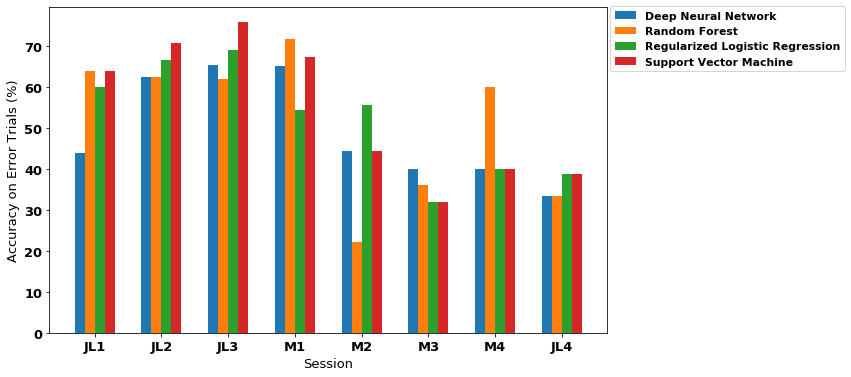

In [15]:
import matplotlib
font = {'weight' : 'bold',
        'size'   : 13}

matplotlib.rc('font', **font)

sessions = ['JL1', 'JL2', 'JL3', 'M1', 'M2', 'M3', 'M4', 'JL4']
x = np.arange(0, 2*len(sessions), 2)  # the label locations
width = 0.3


fig, ax = plt.subplots(figsize=(10,6))
rects1 = ax.bar(x - 3*width/2, err_acc_rnn, width, label='Deep Neural Network')
rects2 = ax.bar(x - width/2, err_acc_RF, width, label='Random Forest')
rects3 = ax.bar(x + width/2, err_acc_RLR, width, label='Regularized Logistic Regression')
rects4 = ax.bar(x + 3*width/2, err_acc_svm, width, label='Support Vector Machine')

ax.set_ylabel('Accuracy on Error Trials (%)')
ax.set_xlabel('Session')
ax.set_xticks(x)
ax.set_xticklabels(sessions)
ax.legend(loc='lower right', bbox_to_anchor=(1.435, .785), fontsize='small')
fig.savefig("error_performance.svg")
# fig.tight_layout()
plt.show()

### Exploiding Information in each Trial

In [13]:
test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"Importing session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
_y = tf.keras.utils.to_categorical(Y, num_classes=8)
tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(X_rates, _y.shape[-1], **model_kwargs)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
model.fit(x=X_rates,y=_y, epochs=EPOCHS, verbose=0)

Importing session sra3_2_j_037_00+03


In [90]:
from sklearn.svm import SVC

test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"Importing session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

X = np.reshape(X_rates, (X_rates.shape[0], -1))
svm_model = SVC(random_state=0, verbose=1).fit(X, Y)

# X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
# X = np.reshape(X_rates, (X_rates.shape[0], -1))
# pred_y = clf.predict(X)
# true_y = Y.flatten()
# accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
# print(f"SVM: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n")

Importing session sra3_2_j_037_00+03
[LibSVM]

In [15]:
a = svm_model.coef_.flatten()

AttributeError: coef_ is only available when using a linear kernel

In [14]:
X_err, Y_err, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs_error)
# pred_y = np.argmax(model.predict(X_err), axis=1)
# true_y = Y_err.flatten()
# accuracy[i] = 100 * np.sum(pred_y == true_y) / len(pred_y)
# print(f"RNN: Session {sess_id} Accuracy over Error Trials: {accuracy[i]}%\n\n")

In [15]:
from tensorflow.keras import backend as K

def get_saliency(_model, _X, tr_id):
    
    # Convert the input data _X to tf data.
    _input = tf.convert_to_tensor(_X[tr_id].astype(np.float32)[None, :, :])
    
    # Do we use the full model (incl SoftMax) or the truncated model as above?
    # If truncated model then we need a different loss function.
    
    # We will calculate the saliency for each output class
    _n_classes = _model.layers[-1].output.shape[-1]
    losses_grads = []
    for y_ix in range(_n_classes):
        with tf.GradientTape() as tape:
            tape.watch(_input)
            class_proba = _model(_input)
            loss_value = K.sparse_categorical_crossentropy(y_ix, class_proba)
        grads = tape.gradient(loss_value, _input)
        # Normalize gradients
        grads /= (K.sqrt(K.mean(K.square(grads))) + K.epsilon())
#         print(f'grads: {grads.shape} & loss_value: {loss_value.numpy()[0].shape}')
        # Save output
        losses_grads.append((loss_value.numpy()[0], np.squeeze(grads)))
    return losses_grads

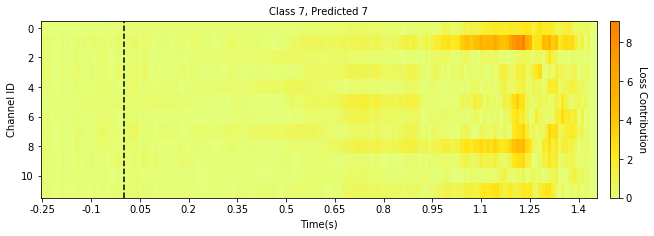

In [16]:
N_PLOT_SALIENCY = 4
t_vec = ax_info['timestamps']

# trial_ids = np.random.permutation(X_err.shape[0])[:N_PLOT_SALIENCY]
trial_ids = np.array([2])
fig = plt.figure(figsize=(12, 15))
x0_ix = np.argmin(np.abs(t_vec))
y_offset = -1
t_vec = np.around(t_vec, 2)

for row_ix, tr_id in enumerate(trial_ids):
    l_g = get_saliency(model, X_err, tr_id)
    plt.subplot(N_PLOT_SALIENCY, 1, row_ix + 1)
    
    y_ix = np.argmin([_[0] for _ in l_g])
    g = l_g[y_ix][1]
    im = plt.imshow(np.abs(g), aspect='auto', cmap='Wistia')

# create an index for each tick position
    freq = 15
    xi = list(range(len(t_vec)))
#     a = float("{:.2f}".format(t_vec))
# plot the index for the x-values
    plt.xticks(xi[::freq], t_vec[::freq])
#     dat = X[tr_id, ch_ids, :]
#     dat -= np.min(dat)
#     dat /= np.max(dat)
#     dat = 0.5 - dat + np.arange(36)[::-1][:, None]
#     for ch_ix in range(4):
#         plt.plot(dat[ch_ix], 'k')
        
    plt.title("Class {}, Predicted {}".format(int(Y_err[tr_id]), y_ix), fontsize=10)
    plt.axvline(x0_ix, color='k', linestyle='--')
#     plt.axvline(x0_ix + 0.25, color='k', linestyle='--')
#     plt.axvline(x0_ix + 1.25, color='k', linestyle='--')
#     plt.colorbar()
#     heatmap = ax.pcolor(data, cmap=cMap)
    cbar = plt.colorbar(im, orientation="vertical", pad=0.02)

#     cbar.ax.get_yaxis().set_ticks([])
#     for j, lab in enumerate(['$0$','$1$','$2$','$>3$']):
#         cbar.ax.text(.5, (2 * j + 1) / 8.0, lab, ha='center', va='center')
#     cbar.ax.get_yaxis().labelpad = 15
    cbar.ax.set_ylabel('Loss Contribution', rotation=270, labelpad=15)
    plt.ylabel("Channel ID")
    plt.xlabel("Time(s)")
    
fig.savefig("saliency.svg")

## With and without EEG-Net

### 10-Fold Without EEG-Net

In [9]:
def lstm_only_model(
    _input,
    num_classes,
    filt=8,
    n_rnn=64,
    n_rnn2=64,
    dropoutRate=0.25,
    activation='relu',
    l1_reg=0.000, l2_reg=0.000,
    norm_rate=0.25,
    latent_dim=16,
    return_model=True
):
    
    inputs = tf.keras.layers.Input(shape=_input.shape[1:])
    
    _y = tf.keras.layers.LSTM(n_rnn,
                              kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
                              recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
                              return_sequences=n_rnn2 > 0,
                              stateful=False,
                              name='rnn1')(inputs)
    _y = tf.keras.layers.Activation(activation)(_y)
    _y = tf.keras.layers.BatchNormalization()(_y)
    _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
    
    if n_rnn2 > 0:
        
        _y = tf.keras.layers.LSTM(n_rnn2,
                              kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
                              recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
                              return_sequences=False,
                              stateful=False,
                              name='rnn2')(_y)
        _y = tf.keras.layers.Activation(activation)(_y)
        _y = tf.keras.layers.BatchNormalization()(_y)
        _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
    # Dense
    _y = tf.keras.layers.Dense(latent_dim, activation=activation)(_y)
#     _y = parts.Bottleneck(_y, latent_dim=latent_dim, activation=activation)
    
    # Classify
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(_y)
#     outputs = parts.Classify(_y, n_classes=num_classes, norm_rate=norm_rate)
    

    if return_model is False:
        return outputs
    else:
        return tf.keras.models.Model(inputs=inputs, outputs=outputs)

In [10]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

lstm_model_kwargs = dict(
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=32
)


def get_hists_acc(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = lstm_only_model(X_rates, _y.shape[-1], **lstm_model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_only_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy: {accuracy}%")
    
    return history, accuracy

Processing session sra3_1_j_050_00+...
	Split 1 of 10
Train for 16 steps, validate for 2 steps
Epoch 1/180

Epoch 00001: val_accuracy improved from -inf to 0.13793, saving model to r2c_lstm_only_sra3_1_j_050_00+_split0.h5
16/16 - 6s - loss: 2.8000 - accuracy: 0.1562 - val_loss: 2.2785 - val_accuracy: 0.1379
Epoch 2/180

Epoch 00002: val_accuracy improved from 0.13793 to 0.20690, saving model to r2c_lstm_only_sra3_1_j_050_00+_split0.h5
16/16 - 1s - loss: 2.3678 - accuracy: 0.2734 - val_loss: 2.2105 - val_accuracy: 0.2069
Epoch 3/180

Epoch 00003: val_accuracy improved from 0.20690 to 0.41379, saving model to r2c_lstm_only_sra3_1_j_050_00+_split0.h5
16/16 - 1s - loss: 2.0989 - accuracy: 0.3711 - val_loss: 2.1461 - val_accuracy: 0.4138
Epoch 4/180

Epoch 00004: val_accuracy did not improve from 0.41379
16/16 - 1s - loss: 1.9193 - accuracy: 0.4844 - val_loss: 2.1014 - val_accuracy: 0.4138
Epoch 5/180

Epoch 00005: val_accuracy improved from 0.41379 to 0.48276, saving model to r2c_lstm_only

Epoch 51/180

Epoch 00051: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1448 - accuracy: 0.9648 - val_loss: 1.6548 - val_accuracy: 0.5517
Epoch 52/180

Epoch 00052: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1459 - accuracy: 0.9766 - val_loss: 1.7173 - val_accuracy: 0.5172
Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1331 - accuracy: 0.9727 - val_loss: 1.6653 - val_accuracy: 0.5862
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1375 - accuracy: 0.9766 - val_loss: 1.6724 - val_accuracy: 0.6207
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1547 - accuracy: 0.9688 - val_loss: 1.7423 - val_accuracy: 0.6552
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1183 - accuracy: 0.9766 - val_loss: 1.7207 - val_accuracy: 0.5172
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.6

Epoch 104/180

Epoch 00104: val_accuracy did not improve from 0.68966
16/16 - 0s - loss: 0.9882 - accuracy: 1.0000 - val_loss: 1.6796 - val_accuracy: 0.5517
Epoch 105/180

Epoch 00105: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0035 - accuracy: 1.0000 - val_loss: 1.5784 - val_accuracy: 0.5862
Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9852 - accuracy: 1.0000 - val_loss: 1.5685 - val_accuracy: 0.6552
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.68966
16/16 - 0s - loss: 1.0103 - accuracy: 0.9961 - val_loss: 1.6467 - val_accuracy: 0.5862
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9975 - accuracy: 1.0000 - val_loss: 1.6322 - val_accuracy: 0.6207
Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9925 - accuracy: 1.0000 - val_loss: 1.5311 - val_accuracy: 0.5862
Epoch 110/180

Epoch 00110: val_accuracy did not improve f

Epoch 156/180

Epoch 00156: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9496 - accuracy: 1.0000 - val_loss: 1.5690 - val_accuracy: 0.6207
Epoch 157/180

Epoch 00157: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9552 - accuracy: 0.9961 - val_loss: 1.5039 - val_accuracy: 0.6552
Epoch 158/180

Epoch 00158: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9580 - accuracy: 0.9961 - val_loss: 1.5720 - val_accuracy: 0.5517
Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9505 - accuracy: 1.0000 - val_loss: 1.4203 - val_accuracy: 0.6897
Epoch 160/180

Epoch 00160: val_accuracy improved from 0.72414 to 0.75862, saving model to r2c_lstm_only_sra3_1_j_050_00+_split0.h5
16/16 - 1s - loss: 0.9461 - accuracy: 0.9961 - val_loss: 1.4418 - val_accuracy: 0.7586
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.75862
16/16 - 0s - loss: 0.9420 - accuracy: 1.0000 - val_loss: 1.4459 - val_accuracy: 0.6

Epoch 25/180

Epoch 00025: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 1.3452 - accuracy: 0.8789 - val_loss: 1.6300 - val_accuracy: 0.6552
Epoch 26/180

Epoch 00026: val_accuracy did not improve from 0.65517
16/16 - 0s - loss: 1.3163 - accuracy: 0.9180 - val_loss: 1.6707 - val_accuracy: 0.5517
Epoch 27/180

Epoch 00027: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 1.2847 - accuracy: 0.9062 - val_loss: 1.6455 - val_accuracy: 0.5862
Epoch 28/180

Epoch 00028: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 1.2886 - accuracy: 0.9336 - val_loss: 1.6028 - val_accuracy: 0.6207
Epoch 29/180

Epoch 00029: val_accuracy improved from 0.65517 to 0.68966, saving model to r2c_lstm_only_sra3_1_j_050_00+_split1.h5
16/16 - 1s - loss: 1.2734 - accuracy: 0.9297 - val_loss: 1.5820 - val_accuracy: 0.6897
Epoch 30/180

Epoch 00030: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.2903 - accuracy: 0.9180 - val_loss: 1.5959 - val_accuracy: 0.6552
Ep

Epoch 78/180

Epoch 00078: val_accuracy did not improve from 0.68966
16/16 - 0s - loss: 1.0483 - accuracy: 0.9844 - val_loss: 1.6946 - val_accuracy: 0.5862
Epoch 79/180

Epoch 00079: val_accuracy did not improve from 0.68966
16/16 - 0s - loss: 1.0583 - accuracy: 0.9844 - val_loss: 1.6855 - val_accuracy: 0.5862
Epoch 80/180

Epoch 00080: val_accuracy did not improve from 0.68966
16/16 - 0s - loss: 1.0431 - accuracy: 0.9883 - val_loss: 1.6993 - val_accuracy: 0.6552
Epoch 81/180

Epoch 00081: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0627 - accuracy: 0.9883 - val_loss: 1.7082 - val_accuracy: 0.6552
Epoch 82/180

Epoch 00082: val_accuracy did not improve from 0.68966
16/16 - 0s - loss: 1.0481 - accuracy: 1.0000 - val_loss: 1.7193 - val_accuracy: 0.6552
Epoch 83/180

Epoch 00083: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0464 - accuracy: 0.9883 - val_loss: 1.7072 - val_accuracy: 0.6552
Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.6

Epoch 130/180

Epoch 00130: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9706 - accuracy: 1.0000 - val_loss: 1.6171 - val_accuracy: 0.6897
Epoch 131/180

Epoch 00131: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9761 - accuracy: 0.9922 - val_loss: 1.5921 - val_accuracy: 0.6552
Epoch 132/180

Epoch 00132: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9817 - accuracy: 0.9961 - val_loss: 1.5477 - val_accuracy: 0.6897
Epoch 133/180

Epoch 00133: val_accuracy did not improve from 0.72414
16/16 - 0s - loss: 0.9682 - accuracy: 0.9883 - val_loss: 1.5288 - val_accuracy: 0.7241
Epoch 134/180

Epoch 00134: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9793 - accuracy: 0.9883 - val_loss: 1.4971 - val_accuracy: 0.6897
Epoch 135/180

Epoch 00135: val_accuracy did not improve from 0.72414
16/16 - 0s - loss: 0.9638 - accuracy: 1.0000 - val_loss: 1.4978 - val_accuracy: 0.6897
Epoch 136/180

Epoch 00136: val_accuracy did not improve f

Epoch 2/180

Epoch 00002: val_accuracy improved from 0.06897 to 0.13793, saving model to r2c_lstm_only_sra3_1_j_050_00+_split2.h5
16/16 - 1s - loss: 2.4114 - accuracy: 0.2656 - val_loss: 2.2166 - val_accuracy: 0.1379
Epoch 3/180

Epoch 00003: val_accuracy improved from 0.13793 to 0.27586, saving model to r2c_lstm_only_sra3_1_j_050_00+_split2.h5
16/16 - 1s - loss: 2.1077 - accuracy: 0.3398 - val_loss: 2.1522 - val_accuracy: 0.2759
Epoch 4/180

Epoch 00004: val_accuracy improved from 0.27586 to 0.41379, saving model to r2c_lstm_only_sra3_1_j_050_00+_split2.h5
16/16 - 1s - loss: 1.9377 - accuracy: 0.4570 - val_loss: 2.1035 - val_accuracy: 0.4138
Epoch 5/180

Epoch 00005: val_accuracy improved from 0.41379 to 0.44828, saving model to r2c_lstm_only_sra3_1_j_050_00+_split2.h5
16/16 - 1s - loss: 1.8264 - accuracy: 0.5508 - val_loss: 2.0608 - val_accuracy: 0.4483
Epoch 6/180

Epoch 00006: val_accuracy did not improve from 0.44828
16/16 - 1s - loss: 1.7751 - accuracy: 0.5938 - val_loss: 2.0096 

Epoch 51/180

Epoch 00051: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.1374 - accuracy: 0.9648 - val_loss: 2.0005 - val_accuracy: 0.5172
Epoch 52/180

Epoch 00052: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.1277 - accuracy: 0.9922 - val_loss: 1.9511 - val_accuracy: 0.4483
Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.1337 - accuracy: 0.9727 - val_loss: 1.9688 - val_accuracy: 0.4828
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.1395 - accuracy: 0.9648 - val_loss: 2.0174 - val_accuracy: 0.5172
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.1258 - accuracy: 0.9766 - val_loss: 1.8473 - val_accuracy: 0.5862
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.1390 - accuracy: 0.9609 - val_loss: 1.9345 - val_accuracy: 0.5517
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.6

Epoch 104/180

Epoch 00104: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.0239 - accuracy: 0.9883 - val_loss: 1.9560 - val_accuracy: 0.5172
Epoch 105/180

Epoch 00105: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.0220 - accuracy: 0.9961 - val_loss: 2.0215 - val_accuracy: 0.4483
Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.0031 - accuracy: 1.0000 - val_loss: 1.9210 - val_accuracy: 0.5172
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.0016 - accuracy: 0.9922 - val_loss: 2.0108 - val_accuracy: 0.4828
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 1.0052 - accuracy: 0.9961 - val_loss: 2.0167 - val_accuracy: 0.4483
Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.62069
16/16 - 1s - loss: 0.9963 - accuracy: 0.9961 - val_loss: 1.9754 - val_accuracy: 0.4138
Epoch 110/180

Epoch 00110: val_accuracy did not improve f

Epoch 157/180

Epoch 00157: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 0.9483 - accuracy: 0.9922 - val_loss: 1.8147 - val_accuracy: 0.6207
Epoch 158/180

Epoch 00158: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 0.9620 - accuracy: 1.0000 - val_loss: 1.8206 - val_accuracy: 0.5517
Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 0.9362 - accuracy: 0.9961 - val_loss: 1.7749 - val_accuracy: 0.5862
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 0.9452 - accuracy: 0.9961 - val_loss: 1.7981 - val_accuracy: 0.5172
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 0.9412 - accuracy: 1.0000 - val_loss: 1.7699 - val_accuracy: 0.5862
Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.65517
16/16 - 1s - loss: 0.9446 - accuracy: 1.0000 - val_loss: 1.8236 - val_accuracy: 0.5517
Epoch 163/180

Epoch 00163: val_accuracy did not improve f

Epoch 27/180

Epoch 00027: val_accuracy did not improve from 0.58621
16/16 - 1s - loss: 1.2639 - accuracy: 0.9375 - val_loss: 1.6140 - val_accuracy: 0.5517
Epoch 28/180

Epoch 00028: val_accuracy did not improve from 0.58621
16/16 - 1s - loss: 1.2672 - accuracy: 0.9258 - val_loss: 1.6670 - val_accuracy: 0.5517
Epoch 29/180

Epoch 00029: val_accuracy did not improve from 0.58621
16/16 - 1s - loss: 1.2805 - accuracy: 0.9023 - val_loss: 1.6156 - val_accuracy: 0.5517
Epoch 30/180

Epoch 00030: val_accuracy did not improve from 0.58621
16/16 - 1s - loss: 1.2717 - accuracy: 0.9492 - val_loss: 1.6113 - val_accuracy: 0.5517
Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.58621
16/16 - 1s - loss: 1.2395 - accuracy: 0.9414 - val_loss: 1.7321 - val_accuracy: 0.4828
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.58621
16/16 - 1s - loss: 1.2471 - accuracy: 0.9453 - val_loss: 1.6227 - val_accuracy: 0.5517
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.5

Epoch 79/180

Epoch 00079: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0542 - accuracy: 0.9883 - val_loss: 1.7306 - val_accuracy: 0.5862
Epoch 80/180

Epoch 00080: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0565 - accuracy: 0.9844 - val_loss: 1.6749 - val_accuracy: 0.5862
Epoch 81/180

Epoch 00081: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0525 - accuracy: 0.9961 - val_loss: 1.6648 - val_accuracy: 0.5517
Epoch 82/180

Epoch 00082: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0535 - accuracy: 0.9961 - val_loss: 1.6208 - val_accuracy: 0.5517
Epoch 83/180

Epoch 00083: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0423 - accuracy: 0.9883 - val_loss: 1.5857 - val_accuracy: 0.6207
Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0264 - accuracy: 1.0000 - val_loss: 1.5907 - val_accuracy: 0.5517
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.6

Epoch 131/180

Epoch 00131: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 1.0050 - accuracy: 0.9844 - val_loss: 1.3669 - val_accuracy: 0.7241
Epoch 132/180

Epoch 00132: val_accuracy did not improve from 0.72414
16/16 - 1s - loss: 0.9957 - accuracy: 0.9883 - val_loss: 1.5262 - val_accuracy: 0.5862
Epoch 133/180

Epoch 00133: val_accuracy improved from 0.72414 to 0.75862, saving model to r2c_lstm_only_sra3_1_j_050_00+_split3.h5
16/16 - 1s - loss: 0.9812 - accuracy: 0.9961 - val_loss: 1.4497 - val_accuracy: 0.7586
Epoch 134/180

Epoch 00134: val_accuracy did not improve from 0.75862
16/16 - 1s - loss: 0.9853 - accuracy: 1.0000 - val_loss: 1.6151 - val_accuracy: 0.6207
Epoch 135/180

Epoch 00135: val_accuracy did not improve from 0.75862
16/16 - 1s - loss: 0.9775 - accuracy: 0.9883 - val_loss: 1.6505 - val_accuracy: 0.5862
Epoch 136/180

Epoch 00136: val_accuracy did not improve from 0.75862
16/16 - 1s - loss: 0.9821 - accuracy: 0.9961 - val_loss: 1.5855 - val_accuracy: 0.6


Epoch 00002: val_accuracy improved from 0.10345 to 0.20690, saving model to r2c_lstm_only_sra3_1_j_050_00+_split4.h5
16/16 - 1s - loss: 2.3879 - accuracy: 0.2695 - val_loss: 2.2224 - val_accuracy: 0.2069
Epoch 3/180

Epoch 00003: val_accuracy improved from 0.20690 to 0.41379, saving model to r2c_lstm_only_sra3_1_j_050_00+_split4.h5
16/16 - 1s - loss: 2.1465 - accuracy: 0.3164 - val_loss: 2.1580 - val_accuracy: 0.4138
Epoch 4/180

Epoch 00004: val_accuracy improved from 0.41379 to 0.48276, saving model to r2c_lstm_only_sra3_1_j_050_00+_split4.h5
16/16 - 1s - loss: 1.9925 - accuracy: 0.4453 - val_loss: 2.1055 - val_accuracy: 0.4828
Epoch 5/180

Epoch 00005: val_accuracy did not improve from 0.48276
16/16 - 1s - loss: 1.8379 - accuracy: 0.5625 - val_loss: 2.0699 - val_accuracy: 0.4483
Epoch 6/180

Epoch 00006: val_accuracy improved from 0.48276 to 0.55172, saving model to r2c_lstm_only_sra3_1_j_050_00+_split4.h5
16/16 - 1s - loss: 1.7539 - accuracy: 0.5977 - val_loss: 2.0189 - val_accura

Epoch 52/180

Epoch 00052: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1203 - accuracy: 0.9805 - val_loss: 1.8613 - val_accuracy: 0.5862
Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1184 - accuracy: 0.9805 - val_loss: 1.8730 - val_accuracy: 0.5862
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1389 - accuracy: 0.9688 - val_loss: 1.8032 - val_accuracy: 0.5517
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1399 - accuracy: 0.9727 - val_loss: 1.8384 - val_accuracy: 0.5517
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1251 - accuracy: 0.9766 - val_loss: 1.8162 - val_accuracy: 0.5517
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.1063 - accuracy: 0.9883 - val_loss: 1.8651 - val_accuracy: 0.5517
Epoch 58/180

Epoch 00058: val_accuracy did not improve from 0.6

Epoch 105/180

Epoch 00105: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0063 - accuracy: 0.9922 - val_loss: 1.8528 - val_accuracy: 0.6207
Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9981 - accuracy: 0.9961 - val_loss: 1.9047 - val_accuracy: 0.5517
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9843 - accuracy: 0.9961 - val_loss: 1.9070 - val_accuracy: 0.5172
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0027 - accuracy: 0.9844 - val_loss: 1.8809 - val_accuracy: 0.5172
Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0104 - accuracy: 0.9844 - val_loss: 1.9189 - val_accuracy: 0.5172
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 1.0224 - accuracy: 0.9766 - val_loss: 1.8274 - val_accuracy: 0.5862
Epoch 111/180

Epoch 00111: val_accuracy did not improve f

Epoch 158/180

Epoch 00158: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9593 - accuracy: 0.9961 - val_loss: 1.7838 - val_accuracy: 0.5517
Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9456 - accuracy: 0.9961 - val_loss: 1.7576 - val_accuracy: 0.5517
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9471 - accuracy: 1.0000 - val_loss: 1.8007 - val_accuracy: 0.5517
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9287 - accuracy: 1.0000 - val_loss: 1.7985 - val_accuracy: 0.4828
Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9514 - accuracy: 0.9883 - val_loss: 1.6619 - val_accuracy: 0.5862
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.68966
16/16 - 1s - loss: 0.9439 - accuracy: 0.9961 - val_loss: 1.7445 - val_accuracy: 0.5172
Epoch 164/180

Epoch 00164: val_accuracy did not improve f

Epoch 28/180

Epoch 00028: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2614 - accuracy: 0.9102 - val_loss: 1.8227 - val_accuracy: 0.4643
Epoch 29/180

Epoch 00029: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2856 - accuracy: 0.9180 - val_loss: 1.8586 - val_accuracy: 0.5000
Epoch 30/180

Epoch 00030: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2473 - accuracy: 0.9453 - val_loss: 1.8349 - val_accuracy: 0.4643
Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2175 - accuracy: 0.9688 - val_loss: 1.9011 - val_accuracy: 0.4643
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2261 - accuracy: 0.9492 - val_loss: 2.0155 - val_accuracy: 0.5000
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2117 - accuracy: 0.9570 - val_loss: 1.9934 - val_accuracy: 0.4643
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.6

Epoch 81/180

Epoch 00081: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.0597 - accuracy: 0.9844 - val_loss: 1.8960 - val_accuracy: 0.5714
Epoch 82/180

Epoch 00082: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.0300 - accuracy: 0.9961 - val_loss: 1.8786 - val_accuracy: 0.5714
Epoch 83/180

Epoch 00083: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.0364 - accuracy: 0.9844 - val_loss: 1.9727 - val_accuracy: 0.5357
Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.0364 - accuracy: 0.9883 - val_loss: 1.9938 - val_accuracy: 0.5000
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.0440 - accuracy: 0.9805 - val_loss: 1.8669 - val_accuracy: 0.5714
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.64286
16/16 - 0s - loss: 1.0374 - accuracy: 0.9883 - val_loss: 1.8925 - val_accuracy: 0.5357
Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.6

Epoch 134/180

Epoch 00134: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 0.9541 - accuracy: 0.9961 - val_loss: 1.8299 - val_accuracy: 0.5357
Epoch 135/180

Epoch 00135: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 0.9693 - accuracy: 0.9922 - val_loss: 1.8909 - val_accuracy: 0.5000
Epoch 136/180

Epoch 00136: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 0.9624 - accuracy: 0.9922 - val_loss: 1.8709 - val_accuracy: 0.5000
Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 0.9593 - accuracy: 1.0000 - val_loss: 2.0461 - val_accuracy: 0.5357
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 0.9810 - accuracy: 0.9961 - val_loss: 1.9833 - val_accuracy: 0.5000
Epoch 139/180

Epoch 00139: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 0.9601 - accuracy: 1.0000 - val_loss: 2.0080 - val_accuracy: 0.5357
Epoch 140/180

Epoch 00140: val_accuracy did not improve f

Epoch 5/180

Epoch 00005: val_accuracy improved from 0.35714 to 0.39286, saving model to r2c_lstm_only_sra3_1_j_050_00+_split6.h5
16/16 - 1s - loss: 1.8469 - accuracy: 0.5000 - val_loss: 2.1003 - val_accuracy: 0.3929
Epoch 6/180

Epoch 00006: val_accuracy improved from 0.39286 to 0.42857, saving model to r2c_lstm_only_sra3_1_j_050_00+_split6.h5
16/16 - 1s - loss: 1.8049 - accuracy: 0.5625 - val_loss: 2.0591 - val_accuracy: 0.4286
Epoch 7/180

Epoch 00007: val_accuracy did not improve from 0.42857
16/16 - 1s - loss: 1.6888 - accuracy: 0.6445 - val_loss: 2.0389 - val_accuracy: 0.4286
Epoch 8/180

Epoch 00008: val_accuracy improved from 0.42857 to 0.46429, saving model to r2c_lstm_only_sra3_1_j_050_00+_split6.h5
16/16 - 1s - loss: 1.7055 - accuracy: 0.5742 - val_loss: 2.0012 - val_accuracy: 0.4643
Epoch 9/180

Epoch 00009: val_accuracy did not improve from 0.46429
16/16 - 1s - loss: 1.6625 - accuracy: 0.6719 - val_loss: 1.9769 - val_accuracy: 0.4286
Epoch 10/180

Epoch 00010: val_accuracy

Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.1168 - accuracy: 0.9727 - val_loss: 2.0815 - val_accuracy: 0.5000
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.1097 - accuracy: 0.9805 - val_loss: 2.0829 - val_accuracy: 0.5000
Epoch 58/180

Epoch 00058: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.0997 - accuracy: 0.9922 - val_loss: 1.9839 - val_accuracy: 0.5000
Epoch 59/180

Epoch 00059: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.1249 - accuracy: 0.9805 - val_loss: 1.9815 - val_accuracy: 0.5000
Epoch 60/180

Epoch 00060: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.0993 - accuracy: 0.9883 - val_loss: 1.9961 - val_accuracy: 0.5000
Epoch 61/180

Epoch 00061: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.1023 - accuracy: 0.9805 - val_loss: 2.0198 - val_accuracy: 0.4286
Epoch 62/180

Epoch 00062: val_accuracy did not improve from 0.5

Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9926 - accuracy: 1.0000 - val_loss: 1.9023 - val_accuracy: 0.4643
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9992 - accuracy: 1.0000 - val_loss: 1.8223 - val_accuracy: 0.5000
Epoch 111/180

Epoch 00111: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9941 - accuracy: 1.0000 - val_loss: 1.7719 - val_accuracy: 0.5714
Epoch 112/180

Epoch 00112: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9898 - accuracy: 0.9922 - val_loss: 1.8519 - val_accuracy: 0.5000
Epoch 113/180

Epoch 00113: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9901 - accuracy: 1.0000 - val_loss: 1.8511 - val_accuracy: 0.5000
Epoch 114/180

Epoch 00114: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.0270 - accuracy: 0.9766 - val_loss: 1.9175 - val_accuracy: 0.5714
Epoch 115/180

Epoch 00115: val_accuracy did not improve f

Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9540 - accuracy: 0.9961 - val_loss: 2.0820 - val_accuracy: 0.4286
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9416 - accuracy: 1.0000 - val_loss: 1.9690 - val_accuracy: 0.5357
Epoch 164/180

Epoch 00164: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9448 - accuracy: 1.0000 - val_loss: 1.8895 - val_accuracy: 0.5000
Epoch 165/180

Epoch 00165: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9454 - accuracy: 1.0000 - val_loss: 1.8892 - val_accuracy: 0.5714
Epoch 166/180

Epoch 00166: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9333 - accuracy: 1.0000 - val_loss: 1.9566 - val_accuracy: 0.5000
Epoch 167/180

Epoch 00167: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 0.9406 - accuracy: 1.0000 - val_loss: 1.9489 - val_accuracy: 0.5000
Epoch 168/180

Epoch 00168: val_accuracy did not improve f

Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2426 - accuracy: 0.9336 - val_loss: 1.6959 - val_accuracy: 0.5714
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2603 - accuracy: 0.9219 - val_loss: 1.6369 - val_accuracy: 0.5357
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2192 - accuracy: 0.9570 - val_loss: 1.6489 - val_accuracy: 0.6071
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2533 - accuracy: 0.9414 - val_loss: 1.6534 - val_accuracy: 0.5000
Epoch 35/180

Epoch 00035: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.2429 - accuracy: 0.9336 - val_loss: 1.6644 - val_accuracy: 0.5714
Epoch 36/180

Epoch 00036: val_accuracy improved from 0.64286 to 0.67857, saving model to r2c_lstm_only_sra3_1_j_050_00+_split7.h5
16/16 - 1s - loss: 1.2200 - accuracy: 0.9375 - val_loss: 1.6364 - val_accuracy: 0.6786
Ep

Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.67857
16/16 - 0s - loss: 1.0412 - accuracy: 0.9961 - val_loss: 1.6277 - val_accuracy: 0.5357
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.67857
16/16 - 1s - loss: 1.0282 - accuracy: 1.0000 - val_loss: 1.7400 - val_accuracy: 0.5357
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.67857
16/16 - 1s - loss: 1.0316 - accuracy: 0.9961 - val_loss: 1.6309 - val_accuracy: 0.5000
Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.67857
16/16 - 1s - loss: 1.0213 - accuracy: 1.0000 - val_loss: 1.5789 - val_accuracy: 0.5000
Epoch 88/180

Epoch 00088: val_accuracy did not improve from 0.67857
16/16 - 1s - loss: 1.0291 - accuracy: 0.9883 - val_loss: 1.5032 - val_accuracy: 0.5714
Epoch 89/180

Epoch 00089: val_accuracy did not improve from 0.67857
16/16 - 1s - loss: 1.0294 - accuracy: 0.9922 - val_loss: 1.6047 - val_accuracy: 0.5000
Epoch 90/180

Epoch 00090: val_accuracy did not improve from 0.6

Epoch 136/180

Epoch 00136: val_accuracy improved from 0.75000 to 0.78571, saving model to r2c_lstm_only_sra3_1_j_050_00+_split7.h5
16/16 - 1s - loss: 0.9663 - accuracy: 1.0000 - val_loss: 1.4343 - val_accuracy: 0.7857
Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.78571
16/16 - 1s - loss: 0.9509 - accuracy: 1.0000 - val_loss: 1.3741 - val_accuracy: 0.7857
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.78571
16/16 - 1s - loss: 0.9622 - accuracy: 0.9961 - val_loss: 1.3886 - val_accuracy: 0.7500
Epoch 139/180

Epoch 00139: val_accuracy improved from 0.78571 to 0.82143, saving model to r2c_lstm_only_sra3_1_j_050_00+_split7.h5
16/16 - 1s - loss: 0.9603 - accuracy: 0.9961 - val_loss: 1.3763 - val_accuracy: 0.8214
Epoch 140/180

Epoch 00140: val_accuracy did not improve from 0.82143
16/16 - 1s - loss: 0.9543 - accuracy: 1.0000 - val_loss: 1.3978 - val_accuracy: 0.8214
Epoch 141/180

Epoch 00141: val_accuracy did not improve from 0.82143
16/16 - 1s - loss: 0.

Epoch 6/180

Epoch 00006: val_accuracy did not improve from 0.42857
16/16 - 1s - loss: 1.7490 - accuracy: 0.5742 - val_loss: 2.0510 - val_accuracy: 0.3929
Epoch 7/180

Epoch 00007: val_accuracy improved from 0.42857 to 0.46429, saving model to r2c_lstm_only_sra3_1_j_050_00+_split8.h5
16/16 - 1s - loss: 1.6884 - accuracy: 0.6172 - val_loss: 2.0296 - val_accuracy: 0.4643
Epoch 8/180

Epoch 00008: val_accuracy did not improve from 0.46429
16/16 - 1s - loss: 1.6763 - accuracy: 0.6094 - val_loss: 2.0082 - val_accuracy: 0.3929
Epoch 9/180

Epoch 00009: val_accuracy did not improve from 0.46429
16/16 - 1s - loss: 1.6538 - accuracy: 0.6719 - val_loss: 1.9729 - val_accuracy: 0.3929
Epoch 10/180

Epoch 00010: val_accuracy did not improve from 0.46429
16/16 - 1s - loss: 1.5832 - accuracy: 0.6953 - val_loss: 1.9433 - val_accuracy: 0.4286
Epoch 11/180

Epoch 00011: val_accuracy did not improve from 0.46429
16/16 - 1s - loss: 1.5527 - accuracy: 0.7266 - val_loss: 1.9100 - val_accuracy: 0.4643
Epoch 

Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.1149 - accuracy: 0.9766 - val_loss: 1.7541 - val_accuracy: 0.5357
Epoch 58/180

Epoch 00058: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.1071 - accuracy: 0.9922 - val_loss: 1.8053 - val_accuracy: 0.5357
Epoch 59/180

Epoch 00059: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.0912 - accuracy: 0.9922 - val_loss: 1.7344 - val_accuracy: 0.5714
Epoch 60/180

Epoch 00060: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.1030 - accuracy: 0.9883 - val_loss: 1.7203 - val_accuracy: 0.5714
Epoch 61/180

Epoch 00061: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.1109 - accuracy: 0.9766 - val_loss: 1.7881 - val_accuracy: 0.5714
Epoch 62/180

Epoch 00062: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.1034 - accuracy: 0.9922 - val_loss: 1.7270 - val_accuracy: 0.4643
Epoch 63/180

Epoch 00063: val_accuracy did not improve from 0.6

Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9964 - accuracy: 0.9922 - val_loss: 1.5691 - val_accuracy: 0.7143
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9916 - accuracy: 0.9922 - val_loss: 1.5253 - val_accuracy: 0.6786
Epoch 111/180

Epoch 00111: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9843 - accuracy: 1.0000 - val_loss: 1.4988 - val_accuracy: 0.6429
Epoch 112/180

Epoch 00112: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9837 - accuracy: 1.0000 - val_loss: 1.5519 - val_accuracy: 0.6786
Epoch 113/180

Epoch 00113: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9962 - accuracy: 0.9844 - val_loss: 1.6071 - val_accuracy: 0.6786
Epoch 114/180

Epoch 00114: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9888 - accuracy: 0.9961 - val_loss: 1.5840 - val_accuracy: 0.6429
Epoch 115/180

Epoch 00115: val_accuracy did not improve f

Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9407 - accuracy: 1.0000 - val_loss: 1.6112 - val_accuracy: 0.5357
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9740 - accuracy: 0.9766 - val_loss: 1.6979 - val_accuracy: 0.5357
Epoch 164/180

Epoch 00164: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9595 - accuracy: 0.9883 - val_loss: 1.6569 - val_accuracy: 0.5714
Epoch 165/180

Epoch 00165: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9639 - accuracy: 0.9922 - val_loss: 1.7314 - val_accuracy: 0.5357
Epoch 166/180

Epoch 00166: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9422 - accuracy: 0.9961 - val_loss: 1.6841 - val_accuracy: 0.5714
Epoch 167/180

Epoch 00167: val_accuracy did not improve from 0.75000
16/16 - 1s - loss: 0.9621 - accuracy: 0.9961 - val_loss: 1.9208 - val_accuracy: 0.5000
Epoch 168/180

Epoch 00168: val_accuracy did not improve f

Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.60714
16/16 - 1s - loss: 1.2255 - accuracy: 0.9570 - val_loss: 1.8335 - val_accuracy: 0.6071
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.60714
16/16 - 1s - loss: 1.2464 - accuracy: 0.9141 - val_loss: 1.7973 - val_accuracy: 0.6071
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.60714
16/16 - 1s - loss: 1.2203 - accuracy: 0.9531 - val_loss: 1.8014 - val_accuracy: 0.5357
Epoch 35/180

Epoch 00035: val_accuracy did not improve from 0.60714
16/16 - 1s - loss: 1.1990 - accuracy: 0.9531 - val_loss: 1.7840 - val_accuracy: 0.5357
Epoch 36/180

Epoch 00036: val_accuracy did not improve from 0.60714
16/16 - 1s - loss: 1.1910 - accuracy: 0.9609 - val_loss: 1.8082 - val_accuracy: 0.5357
Epoch 37/180

Epoch 00037: val_accuracy did not improve from 0.60714
16/16 - 1s - loss: 1.2197 - accuracy: 0.9297 - val_loss: 1.8501 - val_accuracy: 0.5714
Epoch 38/180

Epoch 00038: val_accuracy did not improve from 0.6

Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0391 - accuracy: 0.9844 - val_loss: 1.6707 - val_accuracy: 0.6071
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0250 - accuracy: 1.0000 - val_loss: 1.6199 - val_accuracy: 0.6071
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0329 - accuracy: 0.9883 - val_loss: 1.6335 - val_accuracy: 0.5714
Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0334 - accuracy: 0.9922 - val_loss: 1.7169 - val_accuracy: 0.5714
Epoch 88/180

Epoch 00088: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0386 - accuracy: 0.9883 - val_loss: 1.6160 - val_accuracy: 0.6071
Epoch 89/180

Epoch 00089: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0426 - accuracy: 0.9844 - val_loss: 1.6310 - val_accuracy: 0.5714
Epoch 90/180

Epoch 00090: val_accuracy did not improve from 0.7

Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 0.9666 - accuracy: 0.9922 - val_loss: 1.5365 - val_accuracy: 0.6786
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 0.9732 - accuracy: 0.9922 - val_loss: 1.4893 - val_accuracy: 0.6429
Epoch 139/180

Epoch 00139: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 0.9633 - accuracy: 1.0000 - val_loss: 1.5339 - val_accuracy: 0.6786
Epoch 140/180

Epoch 00140: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 0.9587 - accuracy: 0.9922 - val_loss: 1.6418 - val_accuracy: 0.5714
Epoch 141/180

Epoch 00141: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 1.0019 - accuracy: 0.9805 - val_loss: 1.5040 - val_accuracy: 0.7143
Epoch 142/180

Epoch 00142: val_accuracy did not improve from 0.71429
16/16 - 1s - loss: 0.9866 - accuracy: 0.9844 - val_loss: 1.6019 - val_accuracy: 0.6429
Epoch 143/180

Epoch 00143: val_accuracy did not improve f

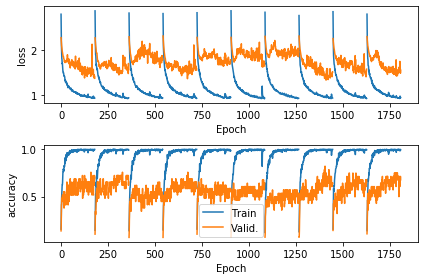

In [11]:
from indl.metrics import quickplot_history

history, accuracy = get_hists_acc(sess_infos[1]['exp_code'], verbose=2)
quickplot_history(history)

### 10-Fold with EEG-Net

In [11]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)



def get_hists_acc(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy with CNN/LSTM Model: {accuracy}%")
    
    return history, accuracy

Processing session sra3_1_j_050_00+...
	Split 1 of 10
Train for 16 steps, validate for 2 steps
Epoch 1/180

Epoch 00001: val_accuracy improved from -inf to 0.24138, saving model to r2c_lstm_sra3_1_j_050_00+_split0.h5
16/16 - 9s - loss: 2.2176 - accuracy: 0.2188 - val_loss: 2.1456 - val_accuracy: 0.2414
Epoch 2/180

Epoch 00002: val_accuracy improved from 0.24138 to 0.34483, saving model to r2c_lstm_sra3_1_j_050_00+_split0.h5
16/16 - 2s - loss: 1.9458 - accuracy: 0.3555 - val_loss: 2.1295 - val_accuracy: 0.3448
Epoch 3/180

Epoch 00003: val_accuracy improved from 0.34483 to 0.37931, saving model to r2c_lstm_sra3_1_j_050_00+_split0.h5
16/16 - 2s - loss: 1.7635 - accuracy: 0.4883 - val_loss: 2.1038 - val_accuracy: 0.3793
Epoch 4/180

Epoch 00004: val_accuracy improved from 0.37931 to 0.44828, saving model to r2c_lstm_sra3_1_j_050_00+_split0.h5
16/16 - 2s - loss: 1.6260 - accuracy: 0.5703 - val_loss: 2.0773 - val_accuracy: 0.4483
Epoch 5/180

Epoch 00005: val_accuracy did not improve from 

Epoch 50/180

Epoch 00050: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0987 - accuracy: 0.8672 - val_loss: 1.1469 - val_accuracy: 0.7586
Epoch 51/180

Epoch 00051: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1405 - accuracy: 0.8672 - val_loss: 1.1618 - val_accuracy: 0.8276
Epoch 52/180

Epoch 00052: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1467 - accuracy: 0.8438 - val_loss: 1.1475 - val_accuracy: 0.7586
Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1047 - accuracy: 0.8789 - val_loss: 1.1080 - val_accuracy: 0.8621
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0695 - accuracy: 0.9141 - val_loss: 1.1694 - val_accuracy: 0.7586
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0511 - accuracy: 0.9102 - val_loss: 1.1076 - val_accuracy: 0.7931
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.8

Epoch 103/180

Epoch 00103: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0011 - accuracy: 0.9297 - val_loss: 1.1070 - val_accuracy: 0.8621
Epoch 104/180

Epoch 00104: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0144 - accuracy: 0.9297 - val_loss: 1.0862 - val_accuracy: 0.8621
Epoch 105/180

Epoch 00105: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0361 - accuracy: 0.9102 - val_loss: 1.1385 - val_accuracy: 0.8621
Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0062 - accuracy: 0.9453 - val_loss: 1.0991 - val_accuracy: 0.8276
Epoch 107/180

Epoch 00107: val_accuracy improved from 0.86207 to 0.89655, saving model to r2c_lstm_sra3_1_j_050_00+_split0.h5
16/16 - 2s - loss: 0.9544 - accuracy: 0.9688 - val_loss: 1.0955 - val_accuracy: 0.8966
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9993 - accuracy: 0.9453 - val_loss: 1.1461 - val_accuracy: 0.8276
E

Epoch 155/180

Epoch 00155: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9846 - accuracy: 0.9453 - val_loss: 1.1521 - val_accuracy: 0.8621
Epoch 156/180

Epoch 00156: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9885 - accuracy: 0.9375 - val_loss: 1.1824 - val_accuracy: 0.8276
Epoch 157/180

Epoch 00157: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9444 - accuracy: 0.9648 - val_loss: 1.1332 - val_accuracy: 0.8621
Epoch 158/180

Epoch 00158: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9864 - accuracy: 0.9492 - val_loss: 1.1905 - val_accuracy: 0.8276
Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9533 - accuracy: 0.9609 - val_loss: 1.1939 - val_accuracy: 0.8276
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.89655
16/16 - 2s - loss: 0.9504 - accuracy: 0.9766 - val_loss: 1.1828 - val_accuracy: 0.7931
Epoch 161/180

Epoch 00161: val_accuracy did not improve f

Epoch 23/180

Epoch 00023: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 1.2415 - accuracy: 0.7969 - val_loss: 1.3476 - val_accuracy: 0.7586
Epoch 24/180

Epoch 00024: val_accuracy improved from 0.79310 to 0.86207, saving model to r2c_lstm_sra3_1_j_050_00+_split1.h5
16/16 - 2s - loss: 1.2624 - accuracy: 0.7656 - val_loss: 1.3085 - val_accuracy: 0.8621
Epoch 25/180

Epoch 00025: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.2112 - accuracy: 0.8125 - val_loss: 1.3203 - val_accuracy: 0.7931
Epoch 26/180

Epoch 00026: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1751 - accuracy: 0.8242 - val_loss: 1.3090 - val_accuracy: 0.7241
Epoch 27/180

Epoch 00027: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1925 - accuracy: 0.8359 - val_loss: 1.2841 - val_accuracy: 0.7931
Epoch 28/180

Epoch 00028: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.2221 - accuracy: 0.7891 - val_loss: 1.3023 - val_accuracy: 0.7241
Epoch 2

Epoch 75/180

Epoch 00075: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 1.0809 - accuracy: 0.8984 - val_loss: 1.1833 - val_accuracy: 0.8276
Epoch 76/180

Epoch 00076: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 1.0583 - accuracy: 0.9180 - val_loss: 1.1621 - val_accuracy: 0.8621
Epoch 77/180

Epoch 00077: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 1.0408 - accuracy: 0.9062 - val_loss: 1.1798 - val_accuracy: 0.8621
Epoch 78/180

Epoch 00078: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 1.0655 - accuracy: 0.8984 - val_loss: 1.3128 - val_accuracy: 0.6897
Epoch 79/180

Epoch 00079: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 1.0643 - accuracy: 0.8906 - val_loss: 1.2188 - val_accuracy: 0.8276
Epoch 80/180

Epoch 00080: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 1.0557 - accuracy: 0.9102 - val_loss: 1.1577 - val_accuracy: 0.8276
Epoch 81/180

Epoch 00081: val_accuracy did not improve from 0.9

Epoch 128/180

Epoch 00128: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 0.9953 - accuracy: 0.9453 - val_loss: 1.0949 - val_accuracy: 0.8966
Epoch 129/180

Epoch 00129: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 0.9706 - accuracy: 0.9570 - val_loss: 1.2019 - val_accuracy: 0.8621
Epoch 130/180

Epoch 00130: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 0.9573 - accuracy: 0.9727 - val_loss: 1.1843 - val_accuracy: 0.8621
Epoch 131/180

Epoch 00131: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 0.9999 - accuracy: 0.9297 - val_loss: 1.1853 - val_accuracy: 0.8276
Epoch 132/180

Epoch 00132: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 0.9589 - accuracy: 0.9688 - val_loss: 1.1653 - val_accuracy: 0.7586
Epoch 133/180

Epoch 00133: val_accuracy did not improve from 0.93103
16/16 - 2s - loss: 0.9698 - accuracy: 0.9492 - val_loss: 1.1667 - val_accuracy: 0.7931
Epoch 134/180

Epoch 00134: val_accuracy did not improve f

	Split 3 of 10
Train for 16 steps, validate for 2 steps
Epoch 1/180

Epoch 00001: val_accuracy improved from -inf to 0.24138, saving model to r2c_lstm_sra3_1_j_050_00+_split2.h5
16/16 - 9s - loss: 2.2319 - accuracy: 0.1836 - val_loss: 2.1472 - val_accuracy: 0.2414
Epoch 2/180

Epoch 00002: val_accuracy improved from 0.24138 to 0.31034, saving model to r2c_lstm_sra3_1_j_050_00+_split2.h5
16/16 - 2s - loss: 1.9929 - accuracy: 0.2969 - val_loss: 2.1354 - val_accuracy: 0.3103
Epoch 3/180

Epoch 00003: val_accuracy did not improve from 0.31034
16/16 - 2s - loss: 1.8490 - accuracy: 0.4219 - val_loss: 2.1196 - val_accuracy: 0.3103
Epoch 4/180

Epoch 00004: val_accuracy improved from 0.31034 to 0.48276, saving model to r2c_lstm_sra3_1_j_050_00+_split2.h5
16/16 - 2s - loss: 1.7082 - accuracy: 0.5000 - val_loss: 2.0993 - val_accuracy: 0.4828
Epoch 5/180

Epoch 00005: val_accuracy improved from 0.48276 to 0.51724, saving model to r2c_lstm_sra3_1_j_050_00+_split2.h5
16/16 - 2s - loss: 1.6362 - acc

Epoch 50/180

Epoch 00050: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1077 - accuracy: 0.8711 - val_loss: 1.1747 - val_accuracy: 0.8276
Epoch 51/180

Epoch 00051: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.1102 - accuracy: 0.8984 - val_loss: 1.2135 - val_accuracy: 0.8276
Epoch 52/180

Epoch 00052: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0668 - accuracy: 0.8984 - val_loss: 1.2552 - val_accuracy: 0.7931
Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0477 - accuracy: 0.9219 - val_loss: 1.2181 - val_accuracy: 0.7931
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0675 - accuracy: 0.9102 - val_loss: 1.1863 - val_accuracy: 0.7931
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0987 - accuracy: 0.8789 - val_loss: 1.2039 - val_accuracy: 0.7931
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.8

Epoch 103/180

Epoch 00103: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9789 - accuracy: 0.9570 - val_loss: 1.2386 - val_accuracy: 0.7586
Epoch 104/180

Epoch 00104: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9907 - accuracy: 0.9453 - val_loss: 1.2515 - val_accuracy: 0.8276
Epoch 105/180

Epoch 00105: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9915 - accuracy: 0.9453 - val_loss: 1.2792 - val_accuracy: 0.7931
Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0475 - accuracy: 0.9102 - val_loss: 1.3092 - val_accuracy: 0.8276
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0149 - accuracy: 0.9180 - val_loss: 1.2510 - val_accuracy: 0.7931
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0069 - accuracy: 0.9258 - val_loss: 1.2368 - val_accuracy: 0.8276
Epoch 109/180

Epoch 00109: val_accuracy did not improve f

Epoch 156/180

Epoch 00156: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 1.0069 - accuracy: 0.9219 - val_loss: 1.3293 - val_accuracy: 0.7931
Epoch 157/180

Epoch 00157: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9425 - accuracy: 0.9609 - val_loss: 1.3428 - val_accuracy: 0.7931
Epoch 158/180

Epoch 00158: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9869 - accuracy: 0.9492 - val_loss: 1.3554 - val_accuracy: 0.7931
Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9551 - accuracy: 0.9688 - val_loss: 1.3152 - val_accuracy: 0.7586
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9404 - accuracy: 0.9805 - val_loss: 1.3366 - val_accuracy: 0.7931
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.86207
16/16 - 2s - loss: 0.9454 - accuracy: 0.9648 - val_loss: 1.3910 - val_accuracy: 0.7931
Epoch 162/180

Epoch 00162: val_accuracy did not improve f

Epoch 25/180

Epoch 00025: val_accuracy did not improve from 0.72414
16/16 - 2s - loss: 1.1870 - accuracy: 0.8516 - val_loss: 1.3304 - val_accuracy: 0.6897
Epoch 26/180

Epoch 00026: val_accuracy did not improve from 0.72414
16/16 - 2s - loss: 1.1685 - accuracy: 0.8555 - val_loss: 1.3309 - val_accuracy: 0.6207
Epoch 27/180

Epoch 00027: val_accuracy did not improve from 0.72414
16/16 - 2s - loss: 1.1907 - accuracy: 0.8438 - val_loss: 1.3184 - val_accuracy: 0.6897
Epoch 28/180

Epoch 00028: val_accuracy did not improve from 0.72414
16/16 - 2s - loss: 1.1995 - accuracy: 0.8125 - val_loss: 1.3250 - val_accuracy: 0.6552
Epoch 29/180

Epoch 00029: val_accuracy did not improve from 0.72414
16/16 - 2s - loss: 1.1873 - accuracy: 0.8359 - val_loss: 1.3624 - val_accuracy: 0.6207
Epoch 30/180

Epoch 00030: val_accuracy did not improve from 0.72414
16/16 - 2s - loss: 1.1708 - accuracy: 0.8555 - val_loss: 1.3459 - val_accuracy: 0.6207
Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.7

Epoch 78/180

Epoch 00078: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 1.0279 - accuracy: 0.9375 - val_loss: 1.3452 - val_accuracy: 0.6897
Epoch 79/180

Epoch 00079: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 1.0483 - accuracy: 0.9180 - val_loss: 1.3680 - val_accuracy: 0.6552
Epoch 80/180

Epoch 00080: val_accuracy did not improve from 0.79310
16/16 - 1s - loss: 1.0550 - accuracy: 0.9062 - val_loss: 1.4272 - val_accuracy: 0.6897
Epoch 81/180

Epoch 00081: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 1.0146 - accuracy: 0.9258 - val_loss: 1.3951 - val_accuracy: 0.6552
Epoch 82/180

Epoch 00082: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 0.9839 - accuracy: 0.9688 - val_loss: 1.4120 - val_accuracy: 0.6552
Epoch 83/180

Epoch 00083: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 1.0123 - accuracy: 0.9297 - val_loss: 1.4734 - val_accuracy: 0.6897
Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.7

Epoch 131/180

Epoch 00131: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 1.0115 - accuracy: 0.9297 - val_loss: 1.3892 - val_accuracy: 0.6552
Epoch 132/180

Epoch 00132: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 0.9686 - accuracy: 0.9648 - val_loss: 1.4073 - val_accuracy: 0.6897
Epoch 133/180

Epoch 00133: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 0.9456 - accuracy: 0.9727 - val_loss: 1.4718 - val_accuracy: 0.6897
Epoch 134/180

Epoch 00134: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 0.9490 - accuracy: 0.9766 - val_loss: 1.4632 - val_accuracy: 0.6552
Epoch 135/180

Epoch 00135: val_accuracy did not improve from 0.79310
16/16 - 2s - loss: 0.9901 - accuracy: 0.9414 - val_loss: 1.3091 - val_accuracy: 0.6552
Epoch 136/180

Epoch 00136: val_accuracy did not improve from 0.79310
16/16 - 1s - loss: 0.9766 - accuracy: 0.9492 - val_loss: 1.3409 - val_accuracy: 0.6552
Epoch 137/180

Epoch 00137: val_accuracy did not improve f

Epoch 3/180

Epoch 00003: val_accuracy improved from 0.34483 to 0.37931, saving model to r2c_lstm_sra3_1_j_050_00+_split4.h5
16/16 - 2s - loss: 1.7798 - accuracy: 0.4648 - val_loss: 2.1039 - val_accuracy: 0.3793
Epoch 4/180

Epoch 00004: val_accuracy improved from 0.37931 to 0.51724, saving model to r2c_lstm_sra3_1_j_050_00+_split4.h5
16/16 - 2s - loss: 1.7014 - accuracy: 0.4961 - val_loss: 2.0794 - val_accuracy: 0.5172
Epoch 5/180

Epoch 00005: val_accuracy improved from 0.51724 to 0.58621, saving model to r2c_lstm_sra3_1_j_050_00+_split4.h5
16/16 - 2s - loss: 1.6187 - accuracy: 0.5430 - val_loss: 2.0453 - val_accuracy: 0.5862
Epoch 6/180

Epoch 00006: val_accuracy did not improve from 0.58621
16/16 - 2s - loss: 1.5499 - accuracy: 0.5781 - val_loss: 2.0005 - val_accuracy: 0.5862
Epoch 7/180

Epoch 00007: val_accuracy did not improve from 0.58621
16/16 - 2s - loss: 1.4991 - accuracy: 0.6094 - val_loss: 1.9683 - val_accuracy: 0.5172
Epoch 8/180

Epoch 00008: val_accuracy improved from 0

Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 1.0558 - accuracy: 0.9180 - val_loss: 1.3128 - val_accuracy: 0.7931
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 1.0869 - accuracy: 0.8906 - val_loss: 1.2628 - val_accuracy: 0.7931
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 1.1076 - accuracy: 0.8711 - val_loss: 1.2631 - val_accuracy: 0.8276
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.82759
16/16 - 1s - loss: 1.0870 - accuracy: 0.8945 - val_loss: 1.2786 - val_accuracy: 0.7931
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 1.0653 - accuracy: 0.8906 - val_loss: 1.2737 - val_accuracy: 0.8276
Epoch 58/180

Epoch 00058: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 1.0833 - accuracy: 0.9180 - val_loss: 1.3321 - val_accuracy: 0.7931
Epoch 59/180

Epoch 00059: val_accuracy did not improve from 0.8

Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9876 - accuracy: 0.9531 - val_loss: 1.3226 - val_accuracy: 0.7931
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9508 - accuracy: 0.9609 - val_loss: 1.3246 - val_accuracy: 0.7931
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9955 - accuracy: 0.9336 - val_loss: 1.2705 - val_accuracy: 0.8276
Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.82759
16/16 - 1s - loss: 0.9846 - accuracy: 0.9453 - val_loss: 1.2504 - val_accuracy: 0.7931
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9511 - accuracy: 0.9648 - val_loss: 1.2648 - val_accuracy: 0.7931
Epoch 111/180

Epoch 00111: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9502 - accuracy: 0.9688 - val_loss: 1.3157 - val_accuracy: 0.7931
Epoch 112/180

Epoch 00112: val_accuracy did not improve f

Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9584 - accuracy: 0.9648 - val_loss: 1.2508 - val_accuracy: 0.7931
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9474 - accuracy: 0.9453 - val_loss: 1.2588 - val_accuracy: 0.7931
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9241 - accuracy: 0.9688 - val_loss: 1.2614 - val_accuracy: 0.8276
Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9603 - accuracy: 0.9570 - val_loss: 1.2776 - val_accuracy: 0.7931
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9549 - accuracy: 0.9414 - val_loss: 1.2831 - val_accuracy: 0.8276
Epoch 164/180

Epoch 00164: val_accuracy did not improve from 0.82759
16/16 - 2s - loss: 0.9561 - accuracy: 0.9453 - val_loss: 1.2554 - val_accuracy: 0.7931
Epoch 165/180

Epoch 00165: val_accuracy did not improve f

Epoch 28/180

Epoch 00028: val_accuracy did not improve from 0.75000
16/16 - 2s - loss: 1.2152 - accuracy: 0.8203 - val_loss: 1.4200 - val_accuracy: 0.6429
Epoch 29/180

Epoch 00029: val_accuracy did not improve from 0.75000
16/16 - 2s - loss: 1.1837 - accuracy: 0.8359 - val_loss: 1.4285 - val_accuracy: 0.6429
Epoch 30/180

Epoch 00030: val_accuracy did not improve from 0.75000
16/16 - 2s - loss: 1.1739 - accuracy: 0.8398 - val_loss: 1.3333 - val_accuracy: 0.6786
Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.75000
16/16 - 2s - loss: 1.1659 - accuracy: 0.8438 - val_loss: 1.3175 - val_accuracy: 0.6786
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.75000
16/16 - 2s - loss: 1.2296 - accuracy: 0.7852 - val_loss: 1.3371 - val_accuracy: 0.6429
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.75000
16/16 - 2s - loss: 1.1891 - accuracy: 0.8086 - val_loss: 1.3119 - val_accuracy: 0.6429
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.7

Epoch 80/180

Epoch 00080: val_accuracy did not improve from 0.85714
16/16 - 2s - loss: 1.0104 - accuracy: 0.9180 - val_loss: 1.2343 - val_accuracy: 0.7500
Epoch 81/180

Epoch 00081: val_accuracy did not improve from 0.85714
16/16 - 2s - loss: 1.0270 - accuracy: 0.9258 - val_loss: 1.2423 - val_accuracy: 0.7857
Epoch 82/180

Epoch 00082: val_accuracy did not improve from 0.85714
16/16 - 2s - loss: 1.0157 - accuracy: 0.9258 - val_loss: 1.2065 - val_accuracy: 0.7500
Epoch 83/180

Epoch 00083: val_accuracy did not improve from 0.85714
16/16 - 2s - loss: 0.9873 - accuracy: 0.9531 - val_loss: 1.2679 - val_accuracy: 0.7143
Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.85714
16/16 - 2s - loss: 1.0377 - accuracy: 0.9023 - val_loss: 1.2217 - val_accuracy: 0.7857
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.85714
16/16 - 2s - loss: 1.0323 - accuracy: 0.9219 - val_loss: 1.2648 - val_accuracy: 0.6786
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.8

Epoch 133/180

Epoch 00133: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9720 - accuracy: 0.9414 - val_loss: 1.2589 - val_accuracy: 0.7857
Epoch 134/180

Epoch 00134: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9502 - accuracy: 0.9648 - val_loss: 1.2387 - val_accuracy: 0.8571
Epoch 135/180

Epoch 00135: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9473 - accuracy: 0.9766 - val_loss: 1.3448 - val_accuracy: 0.6786
Epoch 136/180

Epoch 00136: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9980 - accuracy: 0.9258 - val_loss: 1.3495 - val_accuracy: 0.7500
Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0244 - accuracy: 0.9297 - val_loss: 1.2321 - val_accuracy: 0.8214
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9542 - accuracy: 0.9570 - val_loss: 1.2738 - val_accuracy: 0.7857
Epoch 139/180

Epoch 00139: val_accuracy did not improve f

Epoch 5/180

Epoch 00005: val_accuracy improved from 0.50000 to 0.57143, saving model to r2c_lstm_sra3_1_j_050_00+_split6.h5
16/16 - 1s - loss: 1.5589 - accuracy: 0.5859 - val_loss: 2.0453 - val_accuracy: 0.5714
Epoch 6/180

Epoch 00006: val_accuracy did not improve from 0.57143
16/16 - 1s - loss: 1.5322 - accuracy: 0.6094 - val_loss: 2.0050 - val_accuracy: 0.5714
Epoch 7/180

Epoch 00007: val_accuracy improved from 0.57143 to 0.64286, saving model to r2c_lstm_sra3_1_j_050_00+_split6.h5
16/16 - 1s - loss: 1.4894 - accuracy: 0.6562 - val_loss: 1.9545 - val_accuracy: 0.6429
Epoch 8/180

Epoch 00008: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.4853 - accuracy: 0.6562 - val_loss: 1.9074 - val_accuracy: 0.6071
Epoch 9/180

Epoch 00009: val_accuracy did not improve from 0.64286
16/16 - 1s - loss: 1.4741 - accuracy: 0.6211 - val_loss: 1.8767 - val_accuracy: 0.6429
Epoch 10/180

Epoch 00010: val_accuracy improved from 0.64286 to 0.75000, saving model to r2c_lstm_sra3_1_j_050

Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0576 - accuracy: 0.9102 - val_loss: 1.1879 - val_accuracy: 0.7500
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.1117 - accuracy: 0.8867 - val_loss: 1.2438 - val_accuracy: 0.7500
Epoch 58/180

Epoch 00058: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0654 - accuracy: 0.9180 - val_loss: 1.1663 - val_accuracy: 0.7857
Epoch 59/180

Epoch 00059: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0879 - accuracy: 0.9141 - val_loss: 1.1539 - val_accuracy: 0.8214
Epoch 60/180

Epoch 00060: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0664 - accuracy: 0.9180 - val_loss: 1.2077 - val_accuracy: 0.8214
Epoch 61/180

Epoch 00061: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0864 - accuracy: 0.8906 - val_loss: 1.1631 - val_accuracy: 0.8214
Epoch 62/180

Epoch 00062: val_accuracy did not improve from 0.8

Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0296 - accuracy: 0.9336 - val_loss: 1.1971 - val_accuracy: 0.7857
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0050 - accuracy: 0.9219 - val_loss: 1.2731 - val_accuracy: 0.7857
Epoch 111/180

Epoch 00111: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9966 - accuracy: 0.9297 - val_loss: 1.1900 - val_accuracy: 0.8214
Epoch 112/180

Epoch 00112: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9735 - accuracy: 0.9648 - val_loss: 1.2635 - val_accuracy: 0.7500
Epoch 113/180

Epoch 00113: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.0001 - accuracy: 0.9336 - val_loss: 1.2546 - val_accuracy: 0.7143
Epoch 114/180

Epoch 00114: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9923 - accuracy: 0.9531 - val_loss: 1.2530 - val_accuracy: 0.7857
Epoch 115/180

Epoch 00115: val_accuracy did not improve f

Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9562 - accuracy: 0.9453 - val_loss: 1.2409 - val_accuracy: 0.7857
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9763 - accuracy: 0.9492 - val_loss: 1.2425 - val_accuracy: 0.8214
Epoch 164/180

Epoch 00164: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9468 - accuracy: 0.9688 - val_loss: 1.1999 - val_accuracy: 0.8214
Epoch 165/180

Epoch 00165: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9471 - accuracy: 0.9648 - val_loss: 1.2287 - val_accuracy: 0.7857
Epoch 166/180

Epoch 00166: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9788 - accuracy: 0.9453 - val_loss: 1.2010 - val_accuracy: 0.8214
Epoch 167/180

Epoch 00167: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 0.9785 - accuracy: 0.9531 - val_loss: 1.1854 - val_accuracy: 0.8571
Epoch 168/180

Epoch 00168: val_accuracy did not improve f

Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.2006 - accuracy: 0.8086 - val_loss: 1.1986 - val_accuracy: 0.7500
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1865 - accuracy: 0.8359 - val_loss: 1.1531 - val_accuracy: 0.8571
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1412 - accuracy: 0.8672 - val_loss: 1.0943 - val_accuracy: 0.9286
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1516 - accuracy: 0.8594 - val_loss: 1.1147 - val_accuracy: 0.8571
Epoch 35/180

Epoch 00035: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.2252 - accuracy: 0.8086 - val_loss: 1.1167 - val_accuracy: 0.9286
Epoch 36/180

Epoch 00036: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1239 - accuracy: 0.8633 - val_loss: 1.1757 - val_accuracy: 0.8571
Epoch 37/180

Epoch 00037: val_accuracy did not improve from 0.9

Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0503 - accuracy: 0.9102 - val_loss: 1.2284 - val_accuracy: 0.8214
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0268 - accuracy: 0.9336 - val_loss: 1.2021 - val_accuracy: 0.7857
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9878 - accuracy: 0.9453 - val_loss: 1.1656 - val_accuracy: 0.8214
Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0214 - accuracy: 0.9336 - val_loss: 1.2554 - val_accuracy: 0.8214
Epoch 88/180

Epoch 00088: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9991 - accuracy: 0.9336 - val_loss: 1.2361 - val_accuracy: 0.8214
Epoch 89/180

Epoch 00089: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0118 - accuracy: 0.9297 - val_loss: 1.2507 - val_accuracy: 0.8571
Epoch 90/180

Epoch 00090: val_accuracy did not improve from 0.9

Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9598 - accuracy: 0.9648 - val_loss: 1.3217 - val_accuracy: 0.8214
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9429 - accuracy: 0.9727 - val_loss: 1.3530 - val_accuracy: 0.8214
Epoch 139/180

Epoch 00139: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9633 - accuracy: 0.9609 - val_loss: 1.3883 - val_accuracy: 0.7857
Epoch 140/180

Epoch 00140: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9637 - accuracy: 0.9688 - val_loss: 1.5673 - val_accuracy: 0.7143
Epoch 141/180

Epoch 00141: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9205 - accuracy: 0.9766 - val_loss: 1.4034 - val_accuracy: 0.7143
Epoch 142/180

Epoch 00142: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9747 - accuracy: 0.9414 - val_loss: 1.3214 - val_accuracy: 0.8214
Epoch 143/180

Epoch 00143: val_accuracy did not improve f

Epoch 8/180

Epoch 00008: val_accuracy improved from 0.75000 to 0.82143, saving model to r2c_lstm_sra3_1_j_050_00+_split8.h5
16/16 - 1s - loss: 1.4665 - accuracy: 0.6055 - val_loss: 1.8950 - val_accuracy: 0.8214
Epoch 9/180

Epoch 00009: val_accuracy improved from 0.82143 to 0.85714, saving model to r2c_lstm_sra3_1_j_050_00+_split8.h5
16/16 - 1s - loss: 1.4290 - accuracy: 0.6914 - val_loss: 1.8409 - val_accuracy: 0.8571
Epoch 10/180

Epoch 00010: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.4149 - accuracy: 0.6875 - val_loss: 1.8154 - val_accuracy: 0.8571
Epoch 11/180

Epoch 00011: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.3934 - accuracy: 0.6914 - val_loss: 1.7580 - val_accuracy: 0.8214
Epoch 12/180

Epoch 00012: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.3296 - accuracy: 0.7539 - val_loss: 1.7141 - val_accuracy: 0.8214
Epoch 13/180

Epoch 00013: val_accuracy did not improve from 0.85714
16/16 - 1s - loss: 1.3609 - accuracy: 0


Epoch 00059: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0874 - accuracy: 0.9023 - val_loss: 1.0797 - val_accuracy: 0.8571
Epoch 60/180

Epoch 00060: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1058 - accuracy: 0.8750 - val_loss: 1.0695 - val_accuracy: 0.8571
Epoch 61/180

Epoch 00061: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0986 - accuracy: 0.8828 - val_loss: 1.0620 - val_accuracy: 0.8571
Epoch 62/180

Epoch 00062: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0637 - accuracy: 0.9102 - val_loss: 1.0167 - val_accuracy: 0.8929
Epoch 63/180

Epoch 00063: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0513 - accuracy: 0.9023 - val_loss: 1.0605 - val_accuracy: 0.8929
Epoch 64/180

Epoch 00064: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0480 - accuracy: 0.9102 - val_loss: 1.0293 - val_accuracy: 0.8929
Epoch 65/180

Epoch 00065: val_accuracy did not improve from 0.92857
16/16 - 

Epoch 112/180

Epoch 00112: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9874 - accuracy: 0.9453 - val_loss: 1.1319 - val_accuracy: 0.8571
Epoch 113/180

Epoch 00113: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0352 - accuracy: 0.9062 - val_loss: 1.1112 - val_accuracy: 0.8571
Epoch 114/180

Epoch 00114: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0068 - accuracy: 0.9375 - val_loss: 1.1098 - val_accuracy: 0.8571
Epoch 115/180

Epoch 00115: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9523 - accuracy: 0.9648 - val_loss: 1.1166 - val_accuracy: 0.8214
Epoch 116/180

Epoch 00116: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9904 - accuracy: 0.9570 - val_loss: 1.1180 - val_accuracy: 0.8214
Epoch 117/180

Epoch 00117: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0287 - accuracy: 0.9180 - val_loss: 1.0859 - val_accuracy: 0.8571
Epoch 118/180

Epoch 00118: val_accuracy did not improve f

Epoch 165/180

Epoch 00165: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9612 - accuracy: 0.9492 - val_loss: 1.0533 - val_accuracy: 0.8929
Epoch 166/180

Epoch 00166: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9949 - accuracy: 0.9336 - val_loss: 1.0778 - val_accuracy: 0.8929
Epoch 167/180

Epoch 00167: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9633 - accuracy: 0.9531 - val_loss: 1.1118 - val_accuracy: 0.8571
Epoch 168/180

Epoch 00168: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9765 - accuracy: 0.9609 - val_loss: 1.1429 - val_accuracy: 0.8571
Epoch 169/180

Epoch 00169: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9528 - accuracy: 0.9531 - val_loss: 1.1155 - val_accuracy: 0.8214
Epoch 170/180

Epoch 00170: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9882 - accuracy: 0.9414 - val_loss: 1.0994 - val_accuracy: 0.8214
Epoch 171/180

Epoch 00171: val_accuracy did not improve f

Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1568 - accuracy: 0.8281 - val_loss: 1.1692 - val_accuracy: 0.8571
Epoch 35/180

Epoch 00035: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.2107 - accuracy: 0.8047 - val_loss: 1.1543 - val_accuracy: 0.8571
Epoch 36/180

Epoch 00036: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1852 - accuracy: 0.8242 - val_loss: 1.1385 - val_accuracy: 0.8571
Epoch 37/180

Epoch 00037: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1389 - accuracy: 0.8516 - val_loss: 1.1355 - val_accuracy: 0.8571
Epoch 38/180

Epoch 00038: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1479 - accuracy: 0.8750 - val_loss: 1.1653 - val_accuracy: 0.8571
Epoch 39/180

Epoch 00039: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.1739 - accuracy: 0.8359 - val_loss: 1.1653 - val_accuracy: 0.8214
Epoch 40/180

Epoch 00040: val_accuracy did not improve from 0.9

Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0038 - accuracy: 0.9297 - val_loss: 1.1170 - val_accuracy: 0.8214
Epoch 88/180

Epoch 00088: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0451 - accuracy: 0.8906 - val_loss: 1.1213 - val_accuracy: 0.8571
Epoch 89/180

Epoch 00089: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0262 - accuracy: 0.9141 - val_loss: 1.1003 - val_accuracy: 0.8214
Epoch 90/180

Epoch 00090: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0176 - accuracy: 0.9297 - val_loss: 1.0962 - val_accuracy: 0.8929
Epoch 91/180

Epoch 00091: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0295 - accuracy: 0.9375 - val_loss: 1.0907 - val_accuracy: 0.8571
Epoch 92/180

Epoch 00092: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0586 - accuracy: 0.9062 - val_loss: 1.1062 - val_accuracy: 0.8214
Epoch 93/180

Epoch 00093: val_accuracy did not improve from 0.9

Epoch 140/180

Epoch 00140: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 1.0367 - accuracy: 0.9141 - val_loss: 1.1567 - val_accuracy: 0.8214
Epoch 141/180

Epoch 00141: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9590 - accuracy: 0.9531 - val_loss: 1.1351 - val_accuracy: 0.8214
Epoch 142/180

Epoch 00142: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9714 - accuracy: 0.9453 - val_loss: 1.1546 - val_accuracy: 0.7500
Epoch 143/180

Epoch 00143: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9698 - accuracy: 0.9414 - val_loss: 1.1886 - val_accuracy: 0.7857
Epoch 144/180

Epoch 00144: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9585 - accuracy: 0.9492 - val_loss: 1.1382 - val_accuracy: 0.8214
Epoch 145/180

Epoch 00145: val_accuracy did not improve from 0.92857
16/16 - 1s - loss: 0.9718 - accuracy: 0.9453 - val_loss: 1.1733 - val_accuracy: 0.8214
Epoch 146/180

Epoch 00146: val_accuracy did not improve f

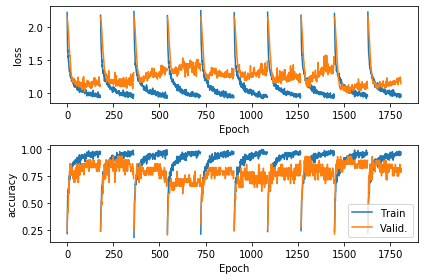

In [12]:
from indl.metrics import quickplot_history

history, accuracy = get_hists_acc(sess_infos[1]['exp_code'], verbose=2)
quickplot_history(history)

## Label Shuffling - Chance Level

In [14]:
random_label = Y_class
np.random.shuffle(random_label)

TRAIN = int(0.6*X_rates.shape[0])
VALID = int(0.8*X_rates.shape[0])
BATCH_SIZE = 16
EPOCHS = 50

x = X_rates
x_tr = X_rates[:TRAIN]
y_tr = random_label[:TRAIN]
x_vl = x[TRAIN:VALID]
y_vl = random_label[TRAIN:VALID]
x_ts = X_rates[VALID:]
y_ts = random_label[VALID:]

ds_train = tf.data.Dataset.from_tensor_slices((x_tr, y_tr))
ds_valid = tf.data.Dataset.from_tensor_slices((x_vl, y_vl))
ds_train = ds_train.shuffle(TRAIN + 1)
ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=True)

tf.keras.backend.clear_session()
randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)

model = make_model(x_tr, Y_class.shape[-1], **model_kwargs)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
model.summary()

model.fit(x=ds_train, epochs=EPOCHS, verbose=2, validation_data=ds_valid)

pred_y = model.predict(x = x_ts)
accuracy = 100 * np.sum(np.argmax(pred_y, axis=1) == np.argmax(y_ts, axis=1)) / len(pred_y)

# chance_rnn_accuracy = 100 * np.sum(np.argmax(rnn_pred_y, axis=1) == np.argmax(random_label, axis=1)) / len(rnn_pred_y)
# chance_accuracy = 100 * np.sum(np.argmax(pred_y, axis=1) == np.argmax(random_label, axis=1)) / len(pred_y)

print(f'\nChance Accuracy with EEG-Net is: {accuracy}')

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 171)]         0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 171, 1)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 152, 8)        168       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 152, 8)        32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 152, 8)         296       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 152, 8)         32        
_________________________________________________________________
activation (Activation)      (None, 1, 152, 8)         0     

In [17]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)

def chance_level_kfold(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    np.random.shuffle(Y_class)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy with CNN/LSTM Model: {accuracy}%")
    
    return history, accuracy

In [18]:
accuracies = []

for i in range(8):
    history, accuracy = chance_level_kfold(sess_infos[i]['exp_code'], verbose=0)
    accuracies.append(accuracy)

Processing session sra3_2_j_037_00+03...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_2_j_037_00+03 overall accuracy with CNN/LSTM Model: 73.125%
Processing session sra3_1_j_050_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_1_j_050_00+ overall accuracy with CNN/LSTM Model: 30.17543859649123%
Processing session sra3_1_j_051_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_1_j_051_00+ overall accuracy with CNN/LSTM Model: 39.85239852398524%
Processing session sra3_1_j_052_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 o

In [15]:
sess_infos

[{'name': 'JerryLee',
  'bank': 'A',
  'name_short': 'j',
  'date': '090601',
  'exp_code': 'sra3_2_j_037_00+03',
  'nsx': 'datafile003.ns2'},
 {'name': 'JerryLee',
  'bank': 'A',
  'name_short': 'j',
  'date': '090623',
  'exp_code': 'sra3_1_j_050_00+',
  'nsx': 'datafile002.ns2'},
 {'name': 'JerryLee',
  'bank': 'B',
  'name_short': 'j',
  'date': '090624',
  'exp_code': 'sra3_1_j_051_00+',
  'nsx': 'datafile002.ns2'},
 {'name': 'JerryLee',
  'bank': 'C',
  'name_short': 'j',
  'date': '090625',
  'exp_code': 'sra3_1_j_052_00+',
  'nsx': 'datafile003.ns2'},
 {'name': 'Marty',
  'bank': 'C',
  'name_short': 'm',
  'date': '090919',
  'exp_code': 'sra3_1_m_077_00+01',
  'nsx': 'datafile001.ns2'},
 {'name': 'Marty',
  'bank': 'B',
  'name_short': 'm',
  'date': '090925',
  'exp_code': 'sra3_1_m_081_00+01',
  'nsx': 'datafile001.ns2'},
 {'name': 'Marty',
  'bank': 'A',
  'name_short': 'm',
  'date': '090926',
  'exp_code': 'sra3_1_m_082_00+01',
  'nsx': 'datafile001.ns2'},
 {'name': 'Mar

## Cross-Session Performance

In [16]:
N_SPLITS = 10

test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
x_ts, yy, _ = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
y_ts = tf.keras.utils.to_categorical(yy, num_classes=8)
x_ts = np.concatenate((x_ts, x_ts, x_ts), axis=1)

accuracies = []

for i in range(N_SPLITS):
    model_name = f"r2c_lstm_sra3_1_j_050_00+_split{i}.h5"
    model = tf.keras.models.load_model(model_name)
    pred_y = model.predict(x = x_ts)
    acc = 100 * np.sum(np.argmax(pred_y, axis=1) == np.argmax(y_ts, axis=1)) / len(pred_y)
    accuracies.append(acc)
    print(f"Model for split {i} accuracy: {acc}")

print(f"\n\nCross-Session Accuracy on {sess_info['name']} and Electrode Bank {sess_info['bank']} is: {np.mean(np.array(accuracies))}")

Model for split 0 accuracy: 3.75
Model for split 1 accuracy: 6.25
Model for split 2 accuracy: 3.75
Model for split 3 accuracy: 2.5
Model for split 4 accuracy: 5.0
Model for split 5 accuracy: 5.0
Model for split 6 accuracy: 12.5
Model for split 7 accuracy: 7.5
Model for split 8 accuracy: 3.125
Model for split 9 accuracy: 6.25


Cross-Session Accuracy on JerryLee and Electrode Bank A is: 5.5625


### Fast Training

In [9]:
N_SPLITS = 10
P_TRAIN = 0.1
BATCH_SIZE = 16
EPOCHS = 150

test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
x, yy, _ = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
y = tf.keras.utils.to_categorical(yy, num_classes=8)
x = np.concatenate((x, x, x), axis=1)

print(f"Cross-Session Accuracy on {sess_info['name']} and Electrode Bank {sess_info['bank']}...\n\n\n")

for P_TRAIN in [0.1, 0.2, 0.3, 0.4, 0.5]:
    TRAIN = int(P_TRAIN*x.shape[0])


    x_tr = x[:TRAIN]
    y_tr = y[:TRAIN]
    x_vl = x[TRAIN:]
    y_vl = y[TRAIN:]

    ds_train = tf.data.Dataset.from_tensor_slices((x_tr, y_tr))
    ds_valid = tf.data.Dataset.from_tensor_slices((x_vl, y_vl))
    ds_train = ds_train.shuffle(TRAIN + 1)
    ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
    ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=True)

    accuracies = []

    for i in range(N_SPLITS):
        model_name = f"r2c_lstm_sra3_1_j_050_00+_split{i}.h5"
        model = tf.keras.models.load_model(model_name)
        model.fit(x=ds_train, epochs=EPOCHS, verbose=0, validation_data=ds_valid)
        pred_y = model.predict(x = x_vl)
        acc = 100 * np.sum(np.argmax(pred_y, axis=1) == np.argmax(y_vl, axis=1)) / len(pred_y)
        accuracies.append(acc)
        print(f"Model for split {i} accuracy: {acc}")

    print(f"\nAverage accuracy with {100*P_TRAIN}% Training Data: {np.mean(np.array(accuracies))}\n\n\n")

Cross-Session Accuracy on JerryLee and Electrode Bank A...



Model for split 0 accuracy: 49.30555555555556
Model for split 1 accuracy: 53.47222222222222
Model for split 2 accuracy: 52.77777777777778
Model for split 3 accuracy: 61.80555555555556
Model for split 4 accuracy: 53.47222222222222
Model for split 5 accuracy: 52.083333333333336
Model for split 6 accuracy: 54.861111111111114
Model for split 7 accuracy: 52.77777777777778
Model for split 8 accuracy: 55.55555555555556
Model for split 9 accuracy: 58.333333333333336

Average accuracy with 10.0% Training Data: 54.44444444444444



Model for split 0 accuracy: 57.03125
Model for split 1 accuracy: 42.96875
Model for split 2 accuracy: 52.34375
Model for split 3 accuracy: 54.6875
Model for split 4 accuracy: 46.09375
Model for split 5 accuracy: 51.5625
Model for split 6 accuracy: 53.90625
Model for split 7 accuracy: 50.0
Model for split 8 accuracy: 57.03125
Model for split 9 accuracy: 53.125

Average accuracy with 20.0% Training Data: 51.8

### Full Training for Reference

In [13]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)


def get_hists_acc(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    X_rates = np.concatenate((X_rates, X_rates, X_rates), axis=1)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy with CNN/LSTM Model: {accuracy}%")
    
    return history, accuracy

Processing session sra3_2_j_037_00+03...
	Split 1 of 10
Train for 9 steps, validate for 1 steps
Epoch 1/180

Epoch 00001: val_accuracy improved from -inf to 0.37500, saving model to r2c_lstm_sra3_2_j_037_00+03_split0.h5
9/9 - 3s - loss: 2.5182 - accuracy: 0.1181 - val_loss: 2.1103 - val_accuracy: 0.3750
Epoch 2/180

Epoch 00002: val_accuracy improved from 0.37500 to 0.50000, saving model to r2c_lstm_sra3_2_j_037_00+03_split0.h5
9/9 - 0s - loss: 2.1145 - accuracy: 0.2569 - val_loss: 2.0716 - val_accuracy: 0.5000
Epoch 3/180

Epoch 00003: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.8167 - accuracy: 0.4306 - val_loss: 2.0299 - val_accuracy: 0.5000
Epoch 4/180

Epoch 00004: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.6597 - accuracy: 0.5139 - val_loss: 1.9834 - val_accuracy: 0.5000
Epoch 5/180

Epoch 00005: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.5976 - accuracy: 0.5972 - val_loss: 1.9483 - val_accuracy: 0.5000
Epoch 6/180

Epoch 00006

Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.2144 - accuracy: 0.7569 - val_loss: 1.4517 - val_accuracy: 0.5000
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.1243 - accuracy: 0.8333 - val_loss: 1.5097 - val_accuracy: 0.5000
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.1407 - accuracy: 0.8472 - val_loss: 1.6361 - val_accuracy: 0.5000
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.1388 - accuracy: 0.8333 - val_loss: 1.6688 - val_accuracy: 0.4375
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.0966 - accuracy: 0.8403 - val_loss: 1.5633 - val_accuracy: 0.5000
Epoch 58/180

Epoch 00058: val_accuracy improved from 0.50000 to 0.56250, saving model to r2c_lstm_sra3_2_j_037_00+03_split0.h5
9/9 - 1s - loss: 1.1068 - accuracy: 0.8333 - val_loss: 1.5566 - val_accuracy: 0.5625
Epoch 59/180

Epo

Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0132 - accuracy: 0.9167 - val_loss: 1.9187 - val_accuracy: 0.3750
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0365 - accuracy: 0.9167 - val_loss: 1.9395 - val_accuracy: 0.4375
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0140 - accuracy: 0.9306 - val_loss: 2.0235 - val_accuracy: 0.4375
Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0223 - accuracy: 0.9028 - val_loss: 2.1884 - val_accuracy: 0.3125
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0048 - accuracy: 0.9444 - val_loss: 2.1143 - val_accuracy: 0.3125
Epoch 111/180

Epoch 00111: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0002 - accuracy: 0.9375 - val_loss: 2.1482 - val_accuracy: 0.3125
Epoch 112/180

Epoch 00112: val_accuracy did not improve from 0.62500


Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9551 - accuracy: 0.9514 - val_loss: 2.1129 - val_accuracy: 0.5000
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9411 - accuracy: 0.9722 - val_loss: 2.0483 - val_accuracy: 0.5625
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9455 - accuracy: 0.9444 - val_loss: 1.9875 - val_accuracy: 0.5000
Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9118 - accuracy: 1.0000 - val_loss: 1.9638 - val_accuracy: 0.5000
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9516 - accuracy: 0.9583 - val_loss: 1.9692 - val_accuracy: 0.5625
Epoch 164/180

Epoch 00164: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9434 - accuracy: 0.9653 - val_loss: 1.9140 - val_accuracy: 0.5625
Epoch 165/180

Epoch 00165: val_accuracy improved from 0.62500 to 0.68

Epoch 30/180

Epoch 00030: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2078 - accuracy: 0.7500 - val_loss: 1.5848 - val_accuracy: 0.5625
Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2294 - accuracy: 0.7639 - val_loss: 1.5691 - val_accuracy: 0.5625
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1983 - accuracy: 0.7500 - val_loss: 1.5854 - val_accuracy: 0.5000
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2007 - accuracy: 0.8056 - val_loss: 1.5928 - val_accuracy: 0.4375
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2199 - accuracy: 0.7361 - val_loss: 1.5815 - val_accuracy: 0.4375
Epoch 35/180

Epoch 00035: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1810 - accuracy: 0.8472 - val_loss: 1.5596 - val_accuracy: 0.3750
Epoch 36/180

Epoch 00036: val_accuracy did not improve from 0.56250
9/9 - 0

Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1089 - accuracy: 0.8472 - val_loss: 1.8068 - val_accuracy: 0.3750
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0789 - accuracy: 0.8889 - val_loss: 1.8164 - val_accuracy: 0.5000
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0667 - accuracy: 0.8819 - val_loss: 1.8982 - val_accuracy: 0.4375
Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0910 - accuracy: 0.8611 - val_loss: 1.8197 - val_accuracy: 0.4375
Epoch 88/180

Epoch 00088: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0316 - accuracy: 0.9028 - val_loss: 1.8237 - val_accuracy: 0.4375
Epoch 89/180

Epoch 00089: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0148 - accuracy: 0.9375 - val_loss: 1.9422 - val_accuracy: 0.4375
Epoch 90/180

Epoch 00090: val_accuracy did not improve from 0.56250
9/9 - 0

Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9656 - accuracy: 0.9444 - val_loss: 2.0339 - val_accuracy: 0.4375
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9781 - accuracy: 0.9514 - val_loss: 2.0004 - val_accuracy: 0.5000
Epoch 139/180

Epoch 00139: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9742 - accuracy: 0.9306 - val_loss: 2.1307 - val_accuracy: 0.5000
Epoch 140/180

Epoch 00140: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9770 - accuracy: 0.9375 - val_loss: 2.1474 - val_accuracy: 0.5000
Epoch 141/180

Epoch 00141: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9754 - accuracy: 0.9514 - val_loss: 2.2074 - val_accuracy: 0.5000
Epoch 142/180

Epoch 00142: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9621 - accuracy: 0.9514 - val_loss: 2.1886 - val_accuracy: 0.3750
Epoch 143/180

Epoch 00143: val_accuracy did not improve from 0.56250


Epoch 10/180

Epoch 00010: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.3725 - accuracy: 0.6667 - val_loss: 1.8205 - val_accuracy: 0.5000
Epoch 11/180

Epoch 00011: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.3864 - accuracy: 0.6667 - val_loss: 1.8022 - val_accuracy: 0.5000
Epoch 12/180

Epoch 00012: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.3279 - accuracy: 0.6667 - val_loss: 1.7847 - val_accuracy: 0.5000
Epoch 13/180

Epoch 00013: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.3033 - accuracy: 0.7014 - val_loss: 1.7696 - val_accuracy: 0.5000
Epoch 14/180

Epoch 00014: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.4252 - accuracy: 0.6111 - val_loss: 1.7567 - val_accuracy: 0.5000
Epoch 15/180

Epoch 00015: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.2837 - accuracy: 0.7014 - val_loss: 1.7446 - val_accuracy: 0.5000
Epoch 16/180

Epoch 00016: val_accuracy did not improve from 0.50000
9/9 - 0

Epoch 63/180

Epoch 00063: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1087 - accuracy: 0.8542 - val_loss: 1.5353 - val_accuracy: 0.6250
Epoch 64/180

Epoch 00064: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0818 - accuracy: 0.8681 - val_loss: 1.5235 - val_accuracy: 0.5625
Epoch 65/180

Epoch 00065: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1150 - accuracy: 0.8472 - val_loss: 1.5194 - val_accuracy: 0.5625
Epoch 66/180

Epoch 00066: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0791 - accuracy: 0.8819 - val_loss: 1.5480 - val_accuracy: 0.6250
Epoch 67/180

Epoch 00067: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0751 - accuracy: 0.8819 - val_loss: 1.6132 - val_accuracy: 0.5625
Epoch 68/180

Epoch 00068: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0698 - accuracy: 0.8681 - val_loss: 1.6037 - val_accuracy: 0.5625
Epoch 69/180

Epoch 00069: val_accuracy did not improve from 0.62500
9/9 - 0

Epoch 116/180

Epoch 00116: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0008 - accuracy: 0.9306 - val_loss: 1.8051 - val_accuracy: 0.5000
Epoch 117/180

Epoch 00117: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9800 - accuracy: 0.9375 - val_loss: 1.7827 - val_accuracy: 0.3750
Epoch 118/180

Epoch 00118: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0002 - accuracy: 0.9097 - val_loss: 1.7743 - val_accuracy: 0.6250
Epoch 119/180

Epoch 00119: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9945 - accuracy: 0.9097 - val_loss: 1.7578 - val_accuracy: 0.4375
Epoch 120/180

Epoch 00120: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0049 - accuracy: 0.9028 - val_loss: 1.7782 - val_accuracy: 0.5000
Epoch 121/180

Epoch 00121: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9987 - accuracy: 0.9167 - val_loss: 1.7815 - val_accuracy: 0.5625
Epoch 122/180

Epoch 00122: val_accuracy did not improve from 0.75000


Epoch 169/180

Epoch 00169: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9389 - accuracy: 0.9514 - val_loss: 1.6800 - val_accuracy: 0.6250
Epoch 170/180

Epoch 00170: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9612 - accuracy: 0.9514 - val_loss: 1.7544 - val_accuracy: 0.5625
Epoch 171/180

Epoch 00171: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9761 - accuracy: 0.9236 - val_loss: 1.7434 - val_accuracy: 0.6250
Epoch 172/180

Epoch 00172: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9767 - accuracy: 0.9167 - val_loss: 1.8272 - val_accuracy: 0.5625
Epoch 173/180

Epoch 00173: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9709 - accuracy: 0.9444 - val_loss: 1.7502 - val_accuracy: 0.4375
Epoch 174/180

Epoch 00174: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9533 - accuracy: 0.9583 - val_loss: 1.8153 - val_accuracy: 0.4375
Epoch 175/180

Epoch 00175: val_accuracy did not improve from 0.75000


Epoch 41/180

Epoch 00041: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.2390 - accuracy: 0.7778 - val_loss: 1.4451 - val_accuracy: 0.5625
Epoch 42/180

Epoch 00042: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.2064 - accuracy: 0.7639 - val_loss: 1.4609 - val_accuracy: 0.5000
Epoch 43/180

Epoch 00043: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1863 - accuracy: 0.7639 - val_loss: 1.4594 - val_accuracy: 0.5000
Epoch 44/180

Epoch 00044: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1900 - accuracy: 0.7708 - val_loss: 1.4325 - val_accuracy: 0.5000
Epoch 45/180

Epoch 00045: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.2147 - accuracy: 0.7986 - val_loss: 1.4286 - val_accuracy: 0.6250
Epoch 46/180

Epoch 00046: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1712 - accuracy: 0.7986 - val_loss: 1.4393 - val_accuracy: 0.5625
Epoch 47/180

Epoch 00047: val_accuracy did not improve from 0.62500
9/9 - 0

Epoch 94/180

Epoch 00094: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0080 - accuracy: 0.9028 - val_loss: 1.6433 - val_accuracy: 0.6875
Epoch 95/180

Epoch 00095: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0065 - accuracy: 0.9236 - val_loss: 1.6233 - val_accuracy: 0.6250
Epoch 96/180

Epoch 00096: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.1048 - accuracy: 0.8819 - val_loss: 1.6186 - val_accuracy: 0.6250
Epoch 97/180

Epoch 00097: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0752 - accuracy: 0.8542 - val_loss: 1.7045 - val_accuracy: 0.4375
Epoch 98/180

Epoch 00098: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0248 - accuracy: 0.9028 - val_loss: 1.7327 - val_accuracy: 0.5625
Epoch 99/180

Epoch 00099: val_accuracy improved from 0.68750 to 0.75000, saving model to r2c_lstm_sra3_2_j_037_00+03_split3.h5
9/9 - 0s - loss: 1.0948 - accuracy: 0.8542 - val_loss: 1.7051 - val_accuracy: 0.7500
Epoch 100/180

Ep

Epoch 147/180

Epoch 00147: val_accuracy did not improve from 0.75000
9/9 - 1s - loss: 1.0458 - accuracy: 0.9167 - val_loss: 1.4930 - val_accuracy: 0.6250
Epoch 148/180

Epoch 00148: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9738 - accuracy: 0.9653 - val_loss: 1.5292 - val_accuracy: 0.6250
Epoch 149/180

Epoch 00149: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0086 - accuracy: 0.9375 - val_loss: 1.5198 - val_accuracy: 0.6250
Epoch 150/180

Epoch 00150: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0011 - accuracy: 0.9375 - val_loss: 1.5762 - val_accuracy: 0.6250
Epoch 151/180

Epoch 00151: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0417 - accuracy: 0.9097 - val_loss: 1.6084 - val_accuracy: 0.5625
Epoch 152/180

Epoch 00152: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0167 - accuracy: 0.9167 - val_loss: 1.6240 - val_accuracy: 0.5625
Epoch 153/180

Epoch 00153: val_accuracy did not improve from 0.75000


Epoch 19/180

Epoch 00019: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2894 - accuracy: 0.6736 - val_loss: 1.7037 - val_accuracy: 0.5625
Epoch 20/180

Epoch 00020: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.3050 - accuracy: 0.7222 - val_loss: 1.6987 - val_accuracy: 0.5000
Epoch 21/180

Epoch 00021: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.3116 - accuracy: 0.7014 - val_loss: 1.6748 - val_accuracy: 0.5625
Epoch 22/180

Epoch 00022: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2590 - accuracy: 0.7222 - val_loss: 1.6707 - val_accuracy: 0.5625
Epoch 23/180

Epoch 00023: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2939 - accuracy: 0.6875 - val_loss: 1.6607 - val_accuracy: 0.5000
Epoch 24/180

Epoch 00024: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2450 - accuracy: 0.7222 - val_loss: 1.6491 - val_accuracy: 0.5000
Epoch 25/180

Epoch 00025: val_accuracy did not improve from 0.56250
9/9 - 0

Epoch 73/180

Epoch 00073: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0975 - accuracy: 0.8472 - val_loss: 1.9946 - val_accuracy: 0.3750
Epoch 74/180

Epoch 00074: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1123 - accuracy: 0.8333 - val_loss: 1.9216 - val_accuracy: 0.3750
Epoch 75/180

Epoch 00075: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1326 - accuracy: 0.8125 - val_loss: 1.6759 - val_accuracy: 0.3750
Epoch 76/180

Epoch 00076: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0851 - accuracy: 0.8819 - val_loss: 1.8233 - val_accuracy: 0.3750
Epoch 77/180

Epoch 00077: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0768 - accuracy: 0.8472 - val_loss: 2.0111 - val_accuracy: 0.3125
Epoch 78/180

Epoch 00078: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0790 - accuracy: 0.8889 - val_loss: 1.9121 - val_accuracy: 0.3750
Epoch 79/180

Epoch 00079: val_accuracy did not improve from 0.56250
9/9 - 0


Epoch 00126: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0224 - accuracy: 0.9097 - val_loss: 2.5579 - val_accuracy: 0.3125
Epoch 127/180

Epoch 00127: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0543 - accuracy: 0.8889 - val_loss: 2.0508 - val_accuracy: 0.3750
Epoch 128/180

Epoch 00128: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0318 - accuracy: 0.8958 - val_loss: 1.9415 - val_accuracy: 0.4375
Epoch 129/180

Epoch 00129: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0503 - accuracy: 0.8750 - val_loss: 2.0803 - val_accuracy: 0.3750
Epoch 130/180

Epoch 00130: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0560 - accuracy: 0.9028 - val_loss: 1.7161 - val_accuracy: 0.4375
Epoch 131/180

Epoch 00131: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 0.9848 - accuracy: 0.9375 - val_loss: 1.8998 - val_accuracy: 0.3750
Epoch 132/180

Epoch 00132: val_accuracy did not improve from 0.56250
9/9 - 0s - los

Epoch 179/180

Epoch 00179: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9802 - accuracy: 0.9444 - val_loss: 2.1648 - val_accuracy: 0.3750
Epoch 180/180

Epoch 00180: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0032 - accuracy: 0.9167 - val_loss: 1.9104 - val_accuracy: 0.4375
	Split 6 of 10
Train for 9 steps, validate for 1 steps
Epoch 1/180

Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to r2c_lstm_sra3_2_j_037_00+03_split5.h5
9/9 - 3s - loss: 2.4347 - accuracy: 0.1181 - val_loss: 2.1057 - val_accuracy: 0.5000
Epoch 2/180

Epoch 00002: val_accuracy did not improve from 0.50000
9/9 - 1s - loss: 2.0449 - accuracy: 0.2708 - val_loss: 2.0665 - val_accuracy: 0.5000
Epoch 3/180

Epoch 00003: val_accuracy did not improve from 0.50000
9/9 - 1s - loss: 1.7499 - accuracy: 0.4722 - val_loss: 2.0181 - val_accuracy: 0.5000
Epoch 4/180

Epoch 00004: val_accuracy did not improve from 0.50000
9/9 - 1s - loss: 1.6447 - accuracy: 0.5278 - val_los

Epoch 52/180

Epoch 00052: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1566 - accuracy: 0.8264 - val_loss: 1.5204 - val_accuracy: 0.5000
Epoch 53/180

Epoch 00053: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1085 - accuracy: 0.8681 - val_loss: 1.6170 - val_accuracy: 0.5000
Epoch 54/180

Epoch 00054: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1090 - accuracy: 0.8611 - val_loss: 1.6095 - val_accuracy: 0.4375
Epoch 55/180

Epoch 00055: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.0559 - accuracy: 0.9097 - val_loss: 1.6959 - val_accuracy: 0.5000
Epoch 56/180

Epoch 00056: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1695 - accuracy: 0.8472 - val_loss: 1.5505 - val_accuracy: 0.3125
Epoch 57/180

Epoch 00057: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1491 - accuracy: 0.8125 - val_loss: 1.6042 - val_accuracy: 0.5000
Epoch 58/180

Epoch 00058: val_accuracy did not improve from 0.56250
9/9 - 0

Epoch 105/180

Epoch 00105: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9969 - accuracy: 0.9306 - val_loss: 1.8344 - val_accuracy: 0.4375
Epoch 106/180

Epoch 00106: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9914 - accuracy: 0.9306 - val_loss: 1.7891 - val_accuracy: 0.5625
Epoch 107/180

Epoch 00107: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0667 - accuracy: 0.8958 - val_loss: 1.9785 - val_accuracy: 0.4375
Epoch 108/180

Epoch 00108: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9805 - accuracy: 0.9653 - val_loss: 2.0137 - val_accuracy: 0.3750
Epoch 109/180

Epoch 00109: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.0327 - accuracy: 0.8889 - val_loss: 2.1128 - val_accuracy: 0.4375
Epoch 110/180

Epoch 00110: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 0.9985 - accuracy: 0.9444 - val_loss: 2.0827 - val_accuracy: 0.3750
Epoch 111/180

Epoch 00111: val_accuracy did not improve from 0.62500


Epoch 158/180

Epoch 00158: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9584 - accuracy: 0.9514 - val_loss: 1.9898 - val_accuracy: 0.5625
Epoch 159/180

Epoch 00159: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9354 - accuracy: 0.9792 - val_loss: 1.9968 - val_accuracy: 0.4375
Epoch 160/180

Epoch 00160: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9766 - accuracy: 0.9444 - val_loss: 1.8640 - val_accuracy: 0.4375
Epoch 161/180

Epoch 00161: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9465 - accuracy: 0.9653 - val_loss: 1.8668 - val_accuracy: 0.4375
Epoch 162/180

Epoch 00162: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9851 - accuracy: 0.9167 - val_loss: 1.9863 - val_accuracy: 0.4375
Epoch 163/180

Epoch 00163: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9454 - accuracy: 0.9583 - val_loss: 1.9206 - val_accuracy: 0.3125
Epoch 164/180

Epoch 00164: val_accuracy did not improve from 0.68750



Epoch 00030: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1965 - accuracy: 0.7986 - val_loss: 1.5914 - val_accuracy: 0.4375
Epoch 31/180

Epoch 00031: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2370 - accuracy: 0.7361 - val_loss: 1.5867 - val_accuracy: 0.3750
Epoch 32/180

Epoch 00032: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2312 - accuracy: 0.7431 - val_loss: 1.5814 - val_accuracy: 0.4375
Epoch 33/180

Epoch 00033: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1951 - accuracy: 0.7847 - val_loss: 1.5842 - val_accuracy: 0.4375
Epoch 34/180

Epoch 00034: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2091 - accuracy: 0.7917 - val_loss: 1.5722 - val_accuracy: 0.5000
Epoch 35/180

Epoch 00035: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1925 - accuracy: 0.7431 - val_loss: 1.5600 - val_accuracy: 0.3750
Epoch 36/180

Epoch 00036: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1

Epoch 83/180

Epoch 00083: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0435 - accuracy: 0.9028 - val_loss: 1.7977 - val_accuracy: 0.6250
Epoch 84/180

Epoch 00084: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0297 - accuracy: 0.9097 - val_loss: 1.7971 - val_accuracy: 0.6250
Epoch 85/180

Epoch 00085: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0524 - accuracy: 0.8889 - val_loss: 1.9203 - val_accuracy: 0.6250
Epoch 86/180

Epoch 00086: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0140 - accuracy: 0.9375 - val_loss: 1.8566 - val_accuracy: 0.6250
Epoch 87/180

Epoch 00087: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0459 - accuracy: 0.8819 - val_loss: 1.9679 - val_accuracy: 0.6250
Epoch 88/180

Epoch 00088: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0786 - accuracy: 0.8681 - val_loss: 1.9801 - val_accuracy: 0.5625
Epoch 89/180

Epoch 00089: val_accuracy did not improve from 0.68750
9/9 - 0

Epoch 136/180

Epoch 00136: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9689 - accuracy: 0.9375 - val_loss: 1.9456 - val_accuracy: 0.5625
Epoch 137/180

Epoch 00137: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9669 - accuracy: 0.9444 - val_loss: 2.0290 - val_accuracy: 0.5625
Epoch 138/180

Epoch 00138: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0206 - accuracy: 0.8958 - val_loss: 1.8891 - val_accuracy: 0.5000
Epoch 139/180

Epoch 00139: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0011 - accuracy: 0.9236 - val_loss: 2.0181 - val_accuracy: 0.4375
Epoch 140/180

Epoch 00140: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0073 - accuracy: 0.9167 - val_loss: 2.0054 - val_accuracy: 0.5000
Epoch 141/180

Epoch 00141: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9680 - accuracy: 0.9306 - val_loss: 2.0628 - val_accuracy: 0.5000
Epoch 142/180

Epoch 00142: val_accuracy did not improve from 0.68750


Epoch 9/180

Epoch 00009: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.4455 - accuracy: 0.5694 - val_loss: 1.8447 - val_accuracy: 0.4375
Epoch 10/180

Epoch 00010: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3870 - accuracy: 0.6111 - val_loss: 1.8297 - val_accuracy: 0.4375
Epoch 11/180

Epoch 00011: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3084 - accuracy: 0.7083 - val_loss: 1.8100 - val_accuracy: 0.4375
Epoch 12/180

Epoch 00012: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3455 - accuracy: 0.6875 - val_loss: 1.7928 - val_accuracy: 0.4375
Epoch 13/180

Epoch 00013: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3464 - accuracy: 0.6389 - val_loss: 1.7693 - val_accuracy: 0.4375
Epoch 14/180

Epoch 00014: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3414 - accuracy: 0.6667 - val_loss: 1.7547 - val_accuracy: 0.4375
Epoch 15/180

Epoch 00015: val_accuracy did not improve from 0.43750
9/9 - 0s


Epoch 00061: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1332 - accuracy: 0.8333 - val_loss: 1.4146 - val_accuracy: 0.5625
Epoch 62/180

Epoch 00062: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1407 - accuracy: 0.8403 - val_loss: 1.4596 - val_accuracy: 0.5625
Epoch 63/180

Epoch 00063: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1443 - accuracy: 0.8125 - val_loss: 1.4568 - val_accuracy: 0.5625
Epoch 64/180

Epoch 00064: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1404 - accuracy: 0.7917 - val_loss: 1.5052 - val_accuracy: 0.5625
Epoch 65/180

Epoch 00065: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1399 - accuracy: 0.8333 - val_loss: 1.7404 - val_accuracy: 0.3750
Epoch 66/180

Epoch 00066: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1638 - accuracy: 0.7847 - val_loss: 1.4881 - val_accuracy: 0.5000
Epoch 67/180

Epoch 00067: val_accuracy did not improve from 0.62500
9/9 - 0s - loss: 1.1

Epoch 114/180

Epoch 00114: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0264 - accuracy: 0.9028 - val_loss: 1.7335 - val_accuracy: 0.5000
Epoch 115/180

Epoch 00115: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0407 - accuracy: 0.8958 - val_loss: 1.6903 - val_accuracy: 0.5625
Epoch 116/180

Epoch 00116: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0279 - accuracy: 0.8958 - val_loss: 1.7044 - val_accuracy: 0.5625
Epoch 117/180

Epoch 00117: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0043 - accuracy: 0.9306 - val_loss: 1.6781 - val_accuracy: 0.5625
Epoch 118/180

Epoch 00118: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9909 - accuracy: 0.9306 - val_loss: 1.7435 - val_accuracy: 0.4375
Epoch 119/180

Epoch 00119: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0179 - accuracy: 0.9167 - val_loss: 1.7437 - val_accuracy: 0.5000
Epoch 120/180

Epoch 00120: val_accuracy did not improve from 0.68750


Epoch 167/180

Epoch 00167: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9341 - accuracy: 0.9722 - val_loss: 2.0044 - val_accuracy: 0.3750
Epoch 168/180

Epoch 00168: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0088 - accuracy: 0.9028 - val_loss: 2.0646 - val_accuracy: 0.5000
Epoch 169/180

Epoch 00169: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9856 - accuracy: 0.9167 - val_loss: 1.8689 - val_accuracy: 0.5000
Epoch 170/180

Epoch 00170: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9976 - accuracy: 0.9375 - val_loss: 1.6517 - val_accuracy: 0.4375
Epoch 171/180

Epoch 00171: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9616 - accuracy: 0.9514 - val_loss: 1.6223 - val_accuracy: 0.3750
Epoch 172/180

Epoch 00172: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9699 - accuracy: 0.9375 - val_loss: 1.5975 - val_accuracy: 0.5000
Epoch 173/180

Epoch 00173: val_accuracy did not improve from 0.68750


Epoch 39/180

Epoch 00039: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1608 - accuracy: 0.8056 - val_loss: 1.5539 - val_accuracy: 0.3750
Epoch 40/180

Epoch 00040: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1747 - accuracy: 0.8472 - val_loss: 1.5447 - val_accuracy: 0.5000
Epoch 41/180

Epoch 00041: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1869 - accuracy: 0.7847 - val_loss: 1.5555 - val_accuracy: 0.4375
Epoch 42/180

Epoch 00042: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1791 - accuracy: 0.7639 - val_loss: 1.5467 - val_accuracy: 0.4375
Epoch 43/180

Epoch 00043: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.1447 - accuracy: 0.8403 - val_loss: 1.5500 - val_accuracy: 0.4375
Epoch 44/180

Epoch 00044: val_accuracy did not improve from 0.56250
9/9 - 0s - loss: 1.2137 - accuracy: 0.7569 - val_loss: 1.5434 - val_accuracy: 0.5625
Epoch 45/180

Epoch 00045: val_accuracy did not improve from 0.56250
9/9 - 0

Epoch 92/180

Epoch 00092: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0035 - accuracy: 0.9375 - val_loss: 1.5870 - val_accuracy: 0.4375
Epoch 93/180

Epoch 00093: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0195 - accuracy: 0.9167 - val_loss: 1.6114 - val_accuracy: 0.5000
Epoch 94/180

Epoch 00094: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0676 - accuracy: 0.8681 - val_loss: 1.7777 - val_accuracy: 0.4375
Epoch 95/180

Epoch 00095: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0960 - accuracy: 0.8472 - val_loss: 1.8414 - val_accuracy: 0.4375
Epoch 96/180

Epoch 00096: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0346 - accuracy: 0.9097 - val_loss: 1.9415 - val_accuracy: 0.3750
Epoch 97/180

Epoch 00097: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0573 - accuracy: 0.8958 - val_loss: 1.9818 - val_accuracy: 0.4375
Epoch 98/180

Epoch 00098: val_accuracy did not improve from 0.68750
9/9 - 0

Epoch 145/180

Epoch 00145: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9665 - accuracy: 0.9375 - val_loss: 1.8288 - val_accuracy: 0.5000
Epoch 146/180

Epoch 00146: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9544 - accuracy: 0.9514 - val_loss: 1.9724 - val_accuracy: 0.3750
Epoch 147/180

Epoch 00147: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 1.0029 - accuracy: 0.9306 - val_loss: 1.9504 - val_accuracy: 0.4375
Epoch 148/180

Epoch 00148: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9985 - accuracy: 0.9375 - val_loss: 1.9835 - val_accuracy: 0.4375
Epoch 149/180

Epoch 00149: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9601 - accuracy: 0.9375 - val_loss: 2.0926 - val_accuracy: 0.5000
Epoch 150/180

Epoch 00150: val_accuracy did not improve from 0.68750
9/9 - 0s - loss: 0.9740 - accuracy: 0.9514 - val_loss: 2.1613 - val_accuracy: 0.4375
Epoch 151/180

Epoch 00151: val_accuracy did not improve from 0.68750


Epoch 17/180

Epoch 00017: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3025 - accuracy: 0.7014 - val_loss: 1.7010 - val_accuracy: 0.4375
Epoch 18/180

Epoch 00018: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.2975 - accuracy: 0.6667 - val_loss: 1.7032 - val_accuracy: 0.4375
Epoch 19/180

Epoch 00019: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.2614 - accuracy: 0.7500 - val_loss: 1.6888 - val_accuracy: 0.4375
Epoch 20/180

Epoch 00020: val_accuracy did not improve from 0.43750
9/9 - 0s - loss: 1.3115 - accuracy: 0.7500 - val_loss: 1.6624 - val_accuracy: 0.4375
Epoch 21/180

Epoch 00021: val_accuracy improved from 0.43750 to 0.50000, saving model to r2c_lstm_sra3_2_j_037_00+03_split9.h5
9/9 - 1s - loss: 1.2981 - accuracy: 0.7222 - val_loss: 1.6480 - val_accuracy: 0.5000
Epoch 22/180

Epoch 00022: val_accuracy did not improve from 0.50000
9/9 - 0s - loss: 1.2978 - accuracy: 0.7014 - val_loss: 1.6309 - val_accuracy: 0.5000
Epoch 23/180

Epo

Epoch 69/180

Epoch 00069: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0863 - accuracy: 0.8750 - val_loss: 1.8040 - val_accuracy: 0.3125
Epoch 70/180

Epoch 00070: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0776 - accuracy: 0.8681 - val_loss: 1.7157 - val_accuracy: 0.5000
Epoch 71/180

Epoch 00071: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0916 - accuracy: 0.8403 - val_loss: 1.7853 - val_accuracy: 0.5000
Epoch 72/180

Epoch 00072: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0422 - accuracy: 0.8819 - val_loss: 1.8086 - val_accuracy: 0.4375
Epoch 73/180

Epoch 00073: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0608 - accuracy: 0.8819 - val_loss: 1.7615 - val_accuracy: 0.4375
Epoch 74/180

Epoch 00074: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0261 - accuracy: 0.9097 - val_loss: 1.7650 - val_accuracy: 0.5000
Epoch 75/180

Epoch 00075: val_accuracy did not improve from 0.75000
9/9 - 0


Epoch 00122: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9628 - accuracy: 0.9653 - val_loss: 1.8822 - val_accuracy: 0.5000
Epoch 123/180

Epoch 00123: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9791 - accuracy: 0.9375 - val_loss: 2.0721 - val_accuracy: 0.5000
Epoch 124/180

Epoch 00124: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9467 - accuracy: 0.9722 - val_loss: 2.3252 - val_accuracy: 0.4375
Epoch 125/180

Epoch 00125: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9643 - accuracy: 0.9375 - val_loss: 1.9356 - val_accuracy: 0.5000
Epoch 126/180

Epoch 00126: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9785 - accuracy: 0.9583 - val_loss: 1.7609 - val_accuracy: 0.6250
Epoch 127/180

Epoch 00127: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9952 - accuracy: 0.9444 - val_loss: 1.8947 - val_accuracy: 0.4375
Epoch 128/180

Epoch 00128: val_accuracy did not improve from 0.75000
9/9 - 0s - los

Epoch 175/180

Epoch 00175: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9429 - accuracy: 0.9861 - val_loss: 1.7031 - val_accuracy: 0.5625
Epoch 176/180

Epoch 00176: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9263 - accuracy: 0.9583 - val_loss: 1.8998 - val_accuracy: 0.5000
Epoch 177/180

Epoch 00177: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9865 - accuracy: 0.9375 - val_loss: 2.0436 - val_accuracy: 0.5000
Epoch 178/180

Epoch 00178: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 1.0131 - accuracy: 0.9167 - val_loss: 2.0691 - val_accuracy: 0.4375
Epoch 179/180

Epoch 00179: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9743 - accuracy: 0.9167 - val_loss: 1.9920 - val_accuracy: 0.4375
Epoch 180/180

Epoch 00180: val_accuracy did not improve from 0.75000
9/9 - 0s - loss: 0.9328 - accuracy: 0.9583 - val_loss: 2.1490 - val_accuracy: 0.4375


Session sra3_2_j_037_00+03 overall accuracy with CNN/LSTM Model: 69.

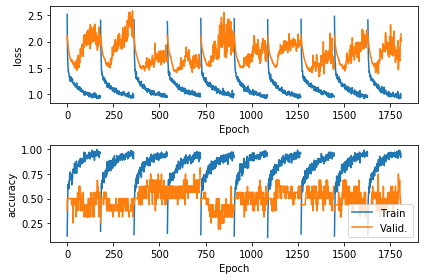

In [14]:
from indl.metrics import quickplot_history

history, accuracy = get_hists_acc(sess_infos[0]['exp_code'], verbose=2)
quickplot_history(history)

## t-SNE on Hidden States and Fixed Points

### Inputs

In [10]:
model = tf.keras.models.load_model(f'r2c_lstm_sra3_1_j_050_00+_split8.h5')
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 171)]         0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 171, 1)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 152, 8)        168       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 152, 8)        32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 152, 8)         296       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 152, 8)         32        
_________________________________________________________________
activation (Activation)      (None, 1, 152, 8)         0     

In [ ]:
import pickle

with open('state_outputs.pkl', 'rb') as f:
    state_outputs = pickle.load(f)

### Hidden States

In [11]:
model = tf.keras.models.load_model(f'r2c_lstm_sra3_1_j_050_00+_split8.h5')
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 171)]         0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 171, 1)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 152, 8)        168       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 152, 8)        32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 152, 8)         296       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 152, 8)         32        
_________________________________________________________________
activation (Activation)      (None, 1, 152, 8)         0     

In [12]:
N_SPLITS = 10
state_outputs = []

for i in range(N_SPLITS):
    print(f'Working on Split #{i}')
    model = tf.keras.models.load_model(f'r2c_lstm_sra3_1_j_050_00+_split{i}.h5')
    lstm = model.layers[10].get_weights()
    output = model.layers[9].output
    factor_model = tf.keras.Model(model.input, output)
    factors = factor_model(X_rates)
    inputs = tf.keras.layers.Input(shape=factors.shape[1:])
    state_lstm = tf.keras.layers.LSTM(model_kwargs['n_rnn'],
                                      kernel_regularizer=tf.keras.regularizers.l2(model_kwargs['l2_reg']),
                                      recurrent_regularizer=tf.keras.regularizers.l2(model_kwargs['l2_reg']),
                                      return_sequences=True,
                                      name='state_rnn1')(inputs)
    state_model = tf.keras.Model(inputs, state_lstm)
    state_model.layers[-1].set_weights(lstm)
    state_outputs.append(state_model(factors))
    
    
#     pca = PCA(n_components=2)
#     tmp = np.reshape(state_outputs, (state_outputs.shape[0] * state_outputs.shape[1], state_outputs.shape[2]))
#     st_out_pc = pca.fit_transform(tmp)
#     tmp = np.reshape(st_out_pc, (state_outputs.shape[0], state_outputs.shape[1], st_out_pc.shape[1]))
#     hidden_states.append(tmp)
    
#     tmp = fxpts_list[2*i].T
#     tmp = pca.transform(tmp)
#     fixed_points.append(tmp.T)

Working on Split #0
Working on Split #1
Working on Split #2
Working on Split #3
Working on Split #4
Working on Split #5
Working on Split #6
Working on Split #7
Working on Split #8
Working on Split #9


In [18]:
print(len(state_outputs))
state_outputs[0].shape

10


TensorShape([285, 30, 64])

In [17]:
import pickle

with open('state_outputs.pkl', 'wb') as f:
    pickle.dump(state_outputs, f)

In [22]:
import pickle

with open('fixed_points.pkl', 'rb') as f:
    fxpts_list = pickle.load(f)
    
# Keeping only new-data-related fixed points
fixed_points = []
for i in range(N_SPLITS):
    fixed_points.append(fxpts_list[2*i])

In [23]:
# To use t-SNE it is recommended to first reduce the dimmensions to "a reasonalbe amount (eg. 50)"
# by a method like PCA

from sklearn.decomposition import PCA

for i in range(N_SPLITS):
    tmp1 = state_outputs[i]
    pca = PCA(n_components=50)
    tmp = np.reshape(tmp1, (tmp1.shape[0]*tmp1.shape[1], tmp1.shape[2]))
    st_out_pc = pca.fit_transform(tmp)
    tmp = np.reshape(st_out_pc, (tmp1.shape[0], tmp1.shape[1], st_out_pc.shape[1]))
    state_outputs[i] = tmp
    
    tmp = fixed_points[i].T
    tmp = pca.transform(tmp)
    fixed_points[i] = tmp.T

In [25]:
# Now we apply t-SNE on both states and fixed points

from sklearn.manifold import TSNE

for i in range(N_SPLITS):
    print(f"Split: {i}")
    print("\t\tStates")
    tmp1 = state_outputs[i]
    tsne = TSNE(n_components=2)
    tmp = np.reshape(tmp1, (tmp1.shape[0]*tmp1.shape[1], tmp1.shape[2]))
    st_embedded = tsne.fit_transform(tmp)
    tmp = np.reshape(st_embedded, (tmp1.shape[0], tmp1.shape[1], st_embedded.shape[1]))
    state_outputs[i] = tmp
    print("\t\tFixed Points")
    tmp = fixed_points[i].T
    tmp = tsne.fit_transform(tmp)
    fixed_points[i] = tmp.T

Split: 0
		States
		Fixed Points
Split: 1
		States
		Fixed Points
Split: 2
		States
		Fixed Points
Split: 3
		States
		Fixed Points
Split: 4
		States
		Fixed Points
Split: 5
		States
		Fixed Points
Split: 6
		States
		Fixed Points
Split: 7
		States
		Fixed Points
Split: 8
		States
		Fixed Points
Split: 9
		States
		Fixed Points


In [26]:
print(fixed_points[0].shape)
print(state_outputs[0].shape)

(2, 19)
(285, 30, 2)


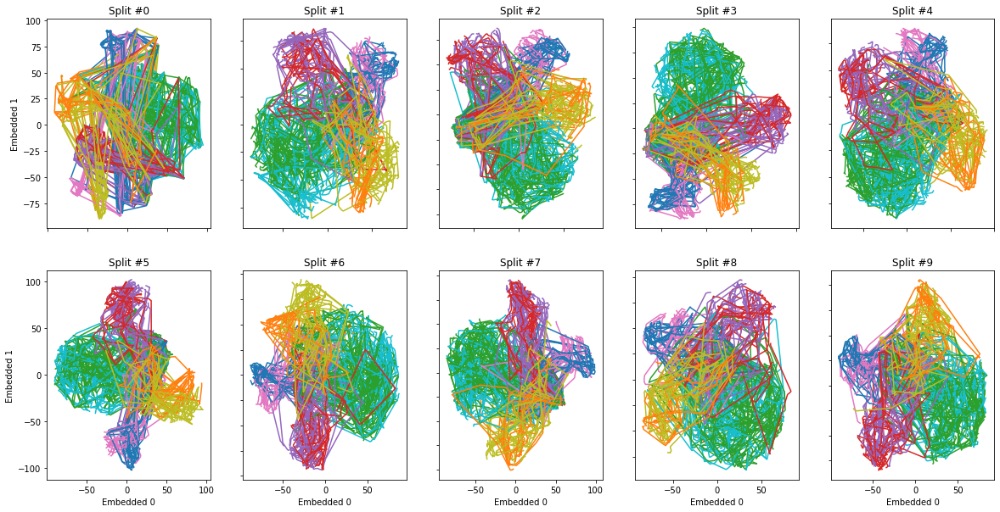

In [29]:
# Plotting the t-SNE results

test_sess_ix = 1
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
X_rates, Y, _ = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

color_map = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:pink', 'tab:olive', 'tab:cyan', 'tab:purple']

fig, axs = plt.subplots(2, 5, figsize=(20, 10))
for i in range(N_SPLITS):
    for j in range(X_rates.shape[0]):
        axs[int(i/5), i%5].plot(state_outputs[i][j, :, 0], state_outputs[i][j, :, 1], color_map[int(Y[j])])
    axs[int(i/5), i%5].set_title(f'Split #{i}')
    
#     axs[int(i/5), i%5].plot(fixed_points[i][0], fixed_points[i][1], 'ko')
    
for ax in axs.flat:
    ax.set(xlabel='Embedded 0', ylabel='Embedded 1')

for ax in axs.flat:
    ax.label_outer()
    

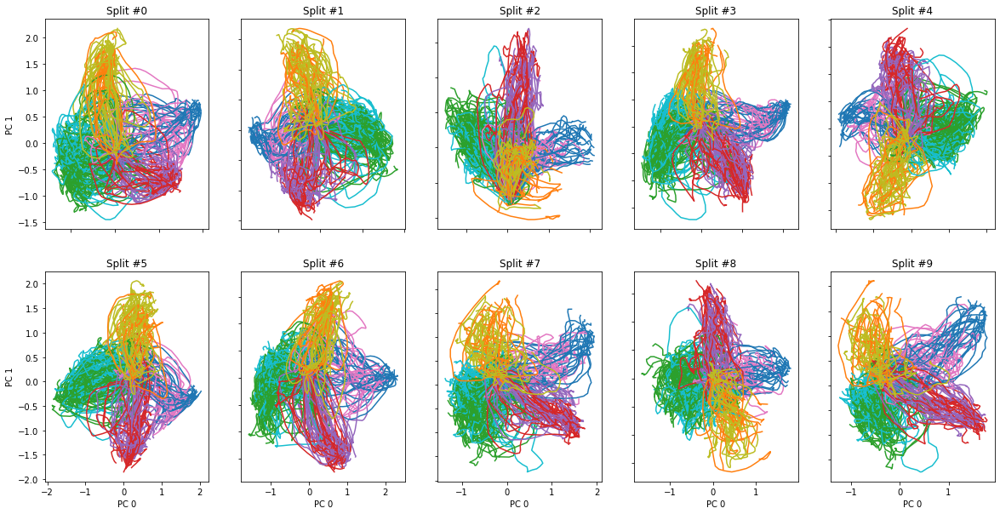

In [30]:
# Comparing with PCA results

import pickle

with open('state_outputs.pkl', 'rb') as f:
    state_outputs = pickle.load(f)
    
with open('fixed_points.pkl', 'rb') as f:
    fxpts_list = pickle.load(f)
    
# Keeping only new-data-related fixed points
fixed_points = []
for i in range(N_SPLITS):
    fixed_points.append(fxpts_list[2*i])
    
from sklearn.decomposition import PCA

for i in range(N_SPLITS):
    tmp1 = state_outputs[i]
    pca = PCA(n_components=2)
    tmp = np.reshape(tmp1, (tmp1.shape[0]*tmp1.shape[1], tmp1.shape[2]))
    st_out_pc = pca.fit_transform(tmp)
    tmp = np.reshape(st_out_pc, (tmp1.shape[0], tmp1.shape[1], st_out_pc.shape[1]))
    state_outputs[i] = tmp
    
    tmp = fixed_points[i].T
    tmp = pca.transform(tmp)
    fixed_points[i] = tmp.T
    
test_sess_ix = 1
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
X_rates, Y, _ = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

color_map = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:pink', 'tab:olive', 'tab:cyan', 'tab:purple']

fig, axs = plt.subplots(2, 5, figsize=(20, 10))
for i in range(N_SPLITS):
    for j in range(X_rates.shape[0]):
        axs[int(i/5), i%5].plot(state_outputs[i][j, :, 0], state_outputs[i][j, :, 1], color_map[int(Y[j])])
    axs[int(i/5), i%5].set_title(f'Split #{i}')
    
#     axs[int(i/5), i%5].plot(fixed_points[i][0], fixed_points[i][1], 'ko')
    
for ax in axs.flat:
    ax.set(xlabel='PC 0', ylabel='PC 1')

for ax in axs.flat:
    ax.label_outer()

## Performance Metrics

In [9]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)


def kfold_pred(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    X_rates = np.concatenate((X_rates, X_rates, X_rates), axis=1)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy with CNN/LSTM Model: {accuracy}%")
    
    return pred_y, true_y, history

In [11]:
from indl.metrics import quickplot_history

pred_y, true_y, history = kfold_pred(sess_infos[1]['exp_code'], verbose=0)

Processing session sra3_1_j_050_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_1_j_050_00+ overall accuracy with CNN/LSTM Model: 90.17543859649123%


In [15]:
print(pred_y.shape, true_y.shape)
print(pred_y[24])
print(true_y[24])

(285,) (285,)
7
7


In [16]:
N_SPLITS = 10

cm = np.zeros((Y_class.shape[1], Y_class.shape[1])) # Confusion Matrix

for i in range(X_rates.shape[0]):
    cm[pred_y[i], true_y[i]] += 1

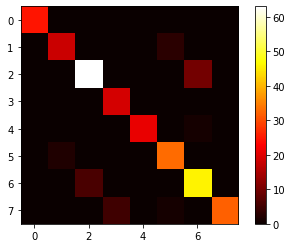

In [17]:
plt.imshow(cm, cmap='hot', interpolation='nearest')
plt.colorbar()

In [34]:
Y

array([[0],
       [0],
       [0],
       [4],
       [0],
       [0],
       [4],
       [4],
       [4],
       [4],
       [0],
       [4],
       [4],
       [0],
       [4],
       [0],
       [4],
       [0],
       [4],
       [7],
       [3],
       [7],
       [7],
       [7],
       [3],
       [3],
       [3],
       [3],
       [3],
       [7],
       [3],
       [3],
       [7],
       [7],
       [7],
       [7],
       [3],
       [7],
       [3],
       [7],
       [3],
       [3],
       [7],
       [7],
       [7],
       [3],
       [3],
       [7],
       [7],
       [0],
       [0],
       [0],
       [0],
       [4],
       [0],
       [0],
       [4],
       [4],
       [0],
       [0],
       [4],
       [5],
       [5],
       [5],
       [1],
       [5],
       [5],
       [5],
       [1],
       [1],
       [1],
       [5],
       [5],
       [5],
       [1],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
    

In [41]:
a = X_rates[0] + X_rates[1]
print(a)
print((a/2).shape)

[[ 0.39270592  0.33872147  0.25672104 ... -0.69979559 -0.78292076
  -0.86496287]
 [-2.08960296 -2.09420734 -2.09585879 ...  0.19413882  0.46564607
   0.44611173]
 [ 2.89101772  3.0715522   3.47879704 ... -0.72008504 -0.2469564
   0.11626646]
 ...
 [-0.58757352 -0.59648733 -0.59660735 ...  3.37723242  3.35495869
   3.15585193]
 [-1.38529819 -1.40791324 -1.42715177 ...  4.79930177  5.142043
   5.00926181]
 [-1.06988194 -1.08019783 -1.08755308 ...  4.85738762  5.26112109
   5.52561883]]
(36, 171)


In [36]:
count = np.zeros(8)
for i in range(len(Y)):
    count[Y[i]] += 1
print(count)

[25. 20. 69. 24. 21. 37. 57. 32.]


In [42]:
avg_X = np.zeros((8, 36, 171))
for i in range(len(Y)):
    avg_X[Y[i]] += X_rates[i]

for i in range(8):
    avg_X[i]/=count[i]

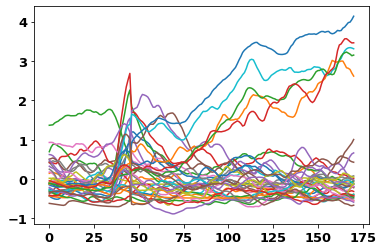

In [44]:
plt.plot(avg_X[0].T)

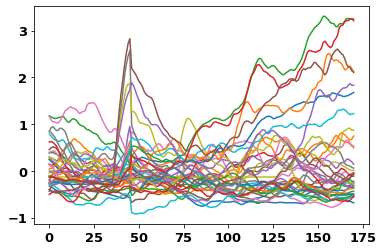

In [45]:
plt.plot(avg_X[1].T)

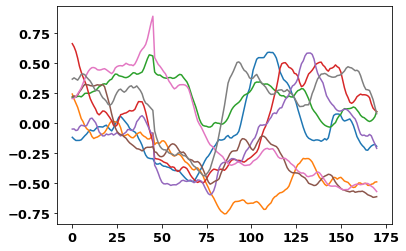

In [50]:
for i in range(8):
    plt.plot(avg_X[i,10])

## Experiencing with Two Loss Functions

In [14]:
ax_info['timestamps'][25]

0.0

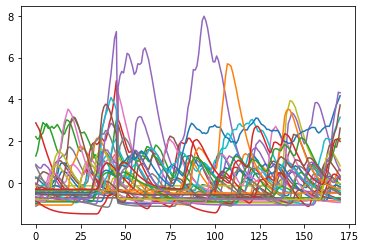

In [16]:
plt.plot(X_rates[0].T)

In [9]:
from indl.model import parts
# from indl.model.helper import check_inputs
from indl.regularizers import KernelLengthRegularizer

def make_2loss_model(
    _input,
    num_classes,
    filt=8,
    kernLength=25,
    ds_rate=10,
    n_rnn=64,
    n_rnn2=64,
    dropoutRate=0.25,
    activation='relu',
    l1_reg=0.000, l2_reg=0.000,
    norm_rate=0.25,
    latent_dim=16,
    return_model=True
):
    
    inputs = tf.keras.layers.Input(shape=_input.shape[1:])
    
    input_shape = list(_input.shape)
#     # The Conv layers are insensitive to the number of samples in the time dimension.
#     # To make it possible for this trained model to be applied to segments of different
#     # durations, we need to explicitly state that we don't care about the number of samples.
#     # input_shape[2] = -1  # Comment out during debug
#     # _y = layers.Reshape(input_shape[1:])(_input)  # Note that Reshape ignores the batch dimension.

#     # RNN
#     if len(input_shape) < 4:
#         input_shape = input_shape + [1]
#     # The Conv layers are insensitive to the number of samples in the time dimension.
#     # To make it possible for this trained model to be applied to segments of different
#     # durations, we need to explicitly state that we don't care about the number of samples.
#     _y = tf.keras.layers.Reshape(input_shape[1:])(inputs)
#     _y = tf.keras.layers.Conv2D(filt, (1, kernLength), padding='valid', data_format=None,
#                                 dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform',
#                                 bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None,
#                                 activity_regularizer=None, kernel_constraint=None, bias_constraint=None)(_y)
#     _y = tf.keras.layers.BatchNormalization()(_y)
#     _y = tf.keras.layers.DepthwiseConv2D((_y.shape.as_list()[1], 1), padding='valid',
#                                       depth_multiplier=1, data_format=None, dilation_rate=(1, 1),
#                                       activation=None, use_bias=True, depthwise_initializer='glorot_uniform',
#                                       bias_initializer='zeros', depthwise_regularizer=None,
#                                       bias_regularizer=None, activity_regularizer=None,
#                                       depthwise_constraint=None, bias_constraint=None)(_y)
#     _y = tf.keras.layers.BatchNormalization()(_y)
#     _y = tf.keras.layers.Activation(activation)(_y)
#     _y = tf.keras.layers.AveragePooling2D(pool_size=(1, ds_rate))(_y)
#     _y = tf.keras.layers.Dropout(dropoutRate)(_y)
#     _y = tf.keras.layers.Reshape(_y.shape.as_list()[2:])(_y)
    _y = tf.keras.layers.LSTM(n_rnn,
                              kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
                              recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
                              return_sequences=True,
                              stateful=False,
                              name='rnn1')(inputs)
    _y2 = tf.keras.layers.LSTM(n_rnn,
                              kernel_regularizer=tf.keras.regularizers.l2(l2_reg),
                              recurrent_regularizer=tf.keras.regularizers.l2(l2_reg),
                              return_sequences=False,
                              stateful=False,
                              name='rnn2')(_y[:,25:75])
    _y2 = tf.keras.layers.Activation(activation)(_y2)
    _y2 = tf.keras.layers.BatchNormalization()(_y2)
    _y2 = tf.keras.layers.Dropout(dropoutRate)(_y2)
    
    
    # Dense
    _y2 = tf.keras.layers.Dense(latent_dim, activation=activation)(_y2)
#     _y = parts.Bottleneck(_y, latent_dim=latent_dim, activation=activation)
    
    # Classify
    outputs2 = tf.keras.layers.Dense(int(num_classes/2), activation='softmax', name='four_pair')(_y2)
    
    _y = tf.keras.layers.Activation(activation)(_y[:,-1])
    _y = tf.keras.layers.BatchNormalization()(_y)
    _y = tf.keras.layers.Dropout(dropoutRate)(_y)
    
    
    # Dense
    _y = tf.keras.layers.Dense(latent_dim, activation=activation)(_y)
#     _y = parts.Bottleneck(_y, latent_dim=latent_dim, activation=activation)
    
    # Classify
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax', name='eight')(_y)
#     outputs = parts.Classify(_y, n_classes=num_classes, norm_rate=norm_rate)
    

    if return_model is False:
        return outputs
    else:
        return tf.keras.models.Model(inputs=inputs, outputs=[outputs2, outputs])

In [22]:
Y % 4

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [3],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
    

In [34]:
_X = np.transpose(X_rates, [0, 2, 1])
_X.shape

(285, 171, 36)

In [17]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)



def get_hists_acc(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    X_rates = np.transpose(X, [0, 2, 1])
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []
    per_fold_eval2 = []
    per_fold_true2 = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        _y2 = tf.keras.utils.to_categorical(Y_class%4, num_classes=4)
        
        _x_trn = X_rates[trn]
        _x_val = X_rates[vld]
        _y_trn = _y[trn]
        _y_val = _y[vld]
        _y2_trn = _y2[trn]
        _y2_val = _y2[vld]

#         ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y2[trn], _y[trn]))
#         ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y2[vld], _y[vld]))

#         # cast data types to GPU-friendly types.
#         ds_train = ds_train.map(lambda x, y, z: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8), tf.cast(z, tf.uint8)))
#         ds_valid = ds_valid.map(lambda x, y, z: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8), tf.cast(z, tf.uint8)))

#         # TODO: augmentations (random slicing?)

#         ds_train = ds_train.shuffle(len(trn) + 1)
#         ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
#         ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_2loss_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2pc_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=_x_trn,y=[_y2_trn, _y_trn], epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=(_x_val, [_y2_val, _y_val]),
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld])[1].numpy())
        per_fold_true.append(Y_class[vld])
        per_fold_eval2.append(model(X_rates[vld])[0].numpy())
        per_fold_true2.append([np.argmax(_, axis=1) for _ in _y_val])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy: {accuracy}%")
    pred_y2 = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval2])
    true_y2 = np.concatenate(per_fold_true2).flatten()
    accuracy2 = 100 * np.sum(pred_y2 == true_y2) / len(pred_y)
    print(f"\n\nSession {sess_id} overall pair-target accuracy: {accuracy}%")
    
    return history, accuracy

In [26]:
int(0.2*X_rates.shape[0])

57

In [10]:
N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

trn = int(0.2*X_rates.shape[0])

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)

_X = np.transpose(X_rates, [0, 2, 1])
_y = tf.keras.utils.to_categorical(Y, num_classes=8)
_y2 = tf.keras.utils.to_categorical(Y%4, num_classes=4)

_x_trn = _X[:trn]
_x_val = _X[trn:]
_y_trn = _y[:trn]
_y_val = _y[trn:]
_y2_trn = _y2[:trn]
_y2_val = _y2[trn:]


# ds_train = tf.data.Dataset.from_tensor_slices((_X[:trn], _y2[:trn], _y[:trn]))
# ds_valid = tf.data.Dataset.from_tensor_slices((_X[trn:], _y2[trn:], _y[trn:]))

# cast data types to GPU-friendly types.
# ds_train = ds_train.map(lambda x, y, z: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8), tf.cast(z, tf.uint8)))
# ds_valid = ds_valid.map(lambda x, y, z: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8), tf.cast(z, tf.uint8)))

# # TODO: augmentations (random slicing?)

# ds_train = ds_train.shuffle(trn + 1)
# ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
# ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

# tf.keras.backend.clear_session()

# randseed = 12345
# random.seed(randseed)
# np.random.seed(randseed)
# tf.random.set_seed(randseed)

model = make_2loss_model(_X, _y.shape[-1], **model_kwargs)
model.summary()
# optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
# loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
# model.compile(optimizer=optim, loss={'four_pair':loss_obj, 'eight':loss_obj}, metrics={'four_pair': 'accuracy', 'eight': 'accuracy'})


# hist = model.fit(x=ds_train, epochs=EPOCHS,
#                  verbose=1,
#                  validation_data=ds_valid)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 171, 36)]    0                                            
__________________________________________________________________________________________________
rnn1 (LSTM)                     (None, 171, 64)      25856       input_1[0][0]                    
__________________________________________________________________________________________________
tf_op_layer_strided_slice (Tens [(None, 50, 64)]     0           rnn1[0][0]                       
__________________________________________________________________________________________________
rnn2 (LSTM)                     (None, 64)           33024       tf_op_layer_strided_slice[0][0]  
______________________________________________________________________________________________

In [11]:
 optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])


hist = model.fit(_x_trn,[_y2_trn, _y_trn], epochs=EPOCHS,verbose=1, validation_data=(_x_val, [_y2_val, _y_val]))

Train on 57 samples, validate on 228 samples
Epoch 1/180
57/57 [==============================] - 13s 226ms/sample - loss: 4.3564 - four_pair_loss: 1.4782 - eight_loss: 2.5705 - four_pair_accuracy: 0.2807 - eight_accuracy: 0.1930 - val_loss: 3.8171 - val_four_pair_loss: 1.3974 - val_eight_loss: 2.1117 - val_four_pair_accuracy: 0.1579 - val_eight_accuracy: 0.1009
Epoch 2/180
57/57 [==============================] - 1s 17ms/sample - loss: 3.8885 - four_pair_loss: 1.2926 - eight_loss: 2.3084 - four_pair_accuracy: 0.5263 - eight_accuracy: 0.2456 - val_loss: 3.8179 - val_four_pair_loss: 1.3986 - val_eight_loss: 2.1143 - val_four_pair_accuracy: 0.1667 - val_eight_accuracy: 0.0921
Epoch 3/180
57/57 [==============================] - 1s 17ms/sample - loss: 3.4913 - four_pair_loss: 1.1037 - eight_loss: 2.0838 - four_pair_accuracy: 0.5965 - eight_accuracy: 0.3333 - val_loss: 3.8191 - val_four_pair_loss: 1.4026 - val_eight_loss: 2.1137 - val_four_pair_accuracy: 0.1667 - val_eight_accuracy: 0.1096

Epoch 27/180
57/57 [==============================] - 1s 18ms/sample - loss: 1.9126 - four_pair_loss: 0.6451 - eight_loss: 0.9908 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8088 - val_four_pair_loss: 1.4267 - val_eight_loss: 2.1343 - val_four_pair_accuracy: 0.1842 - val_eight_accuracy: 0.1491
Epoch 28/180
57/57 [==============================] - 1s 25ms/sample - loss: 1.9314 - four_pair_loss: 0.6371 - eight_loss: 1.0256 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9649 - val_loss: 3.8082 - val_four_pair_loss: 1.4270 - val_eight_loss: 2.1348 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1491
Epoch 29/180
57/57 [==============================] - 1s 13ms/sample - loss: 1.9235 - four_pair_loss: 0.6708 - eight_loss: 0.9784 - four_pair_accuracy: 0.9825 - eight_accuracy: 0.9825 - val_loss: 3.8066 - val_four_pair_loss: 1.4277 - val_eight_loss: 2.1340 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1535
Epoch 30/180
57/57 [=======================

Epoch 53/180
57/57 [==============================] - 1s 20ms/sample - loss: 1.7864 - four_pair_loss: 0.6274 - eight_loss: 0.9186 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.7788 - val_four_pair_loss: 1.4383 - val_eight_loss: 2.1303 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1491
Epoch 54/180
57/57 [==============================] - 1s 22ms/sample - loss: 1.7867 - four_pair_loss: 0.6242 - eight_loss: 0.9228 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9825 - val_loss: 3.7790 - val_four_pair_loss: 1.4390 - val_eight_loss: 2.1312 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1491
Epoch 55/180
57/57 [==============================] - 1s 22ms/sample - loss: 1.8179 - four_pair_loss: 0.6422 - eight_loss: 0.9389 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9649 - val_loss: 3.7790 - val_four_pair_loss: 1.4391 - val_eight_loss: 2.1323 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1535
Epoch 56/180
57/57 [=======================

Epoch 79/180
57/57 [==============================] - 1s 21ms/sample - loss: 1.7286 - four_pair_loss: 0.6193 - eight_loss: 0.9022 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9825 - val_loss: 3.7757 - val_four_pair_loss: 1.4485 - val_eight_loss: 2.1484 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1754
Epoch 80/180
57/57 [==============================] - 1s 21ms/sample - loss: 1.7102 - four_pair_loss: 0.6207 - eight_loss: 0.8818 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.7768 - val_four_pair_loss: 1.4503 - val_eight_loss: 2.1485 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1754
Epoch 81/180
57/57 [==============================] - 1s 22ms/sample - loss: 1.7504 - four_pair_loss: 0.6375 - eight_loss: 0.9049 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.7766 - val_four_pair_loss: 1.4493 - val_eight_loss: 2.1496 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1754
Epoch 82/180
57/57 [=======================

Epoch 105/180
57/57 [==============================] - 1s 17ms/sample - loss: 1.6647 - four_pair_loss: 0.6150 - eight_loss: 0.8671 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8201 - val_four_pair_loss: 1.4785 - val_eight_loss: 2.1892 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1667
Epoch 106/180
57/57 [==============================] - 1s 20ms/sample - loss: 1.6782 - four_pair_loss: 0.6117 - eight_loss: 0.8849 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8215 - val_four_pair_loss: 1.4781 - val_eight_loss: 2.1928 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1623
Epoch 107/180
57/57 [==============================] - 2s 27ms/sample - loss: 1.6579 - four_pair_loss: 0.6122 - eight_loss: 0.8648 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8206 - val_four_pair_loss: 1.4781 - val_eight_loss: 2.1933 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1623
Epoch 108/180
57/57 [===================

Epoch 131/180
57/57 [==============================] - 1s 21ms/sample - loss: 1.6455 - four_pair_loss: 0.6065 - eight_loss: 0.8807 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8703 - val_four_pair_loss: 1.5156 - val_eight_loss: 2.2237 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1667
Epoch 132/180
57/57 [==============================] - 1s 21ms/sample - loss: 1.6744 - four_pair_loss: 0.6487 - eight_loss: 0.8700 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8785 - val_four_pair_loss: 1.5214 - val_eight_loss: 2.2258 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1667
Epoch 133/180
57/57 [==============================] - 1s 22ms/sample - loss: 1.6322 - four_pair_loss: 0.6141 - eight_loss: 0.8595 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.8798 - val_four_pair_loss: 1.5222 - val_eight_loss: 2.2277 - val_four_pair_accuracy: 0.1886 - val_eight_accuracy: 0.1623
Epoch 134/180
57/57 [===================

Epoch 157/180
57/57 [==============================] - 1s 20ms/sample - loss: 1.6074 - four_pair_loss: 0.6064 - eight_loss: 0.8589 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.9632 - val_four_pair_loss: 1.5591 - val_eight_loss: 2.2897 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1623
Epoch 158/180
57/57 [==============================] - 1s 22ms/sample - loss: 1.6066 - four_pair_loss: 0.6090 - eight_loss: 0.8556 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.9686 - val_four_pair_loss: 1.5616 - val_eight_loss: 2.2935 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1623
Epoch 159/180
57/57 [==============================] - 1s 16ms/sample - loss: 1.6095 - four_pair_loss: 0.6024 - eight_loss: 0.8651 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 3.9670 - val_four_pair_loss: 1.5597 - val_eight_loss: 2.2939 - val_four_pair_accuracy: 0.1930 - val_eight_accuracy: 0.1667
Epoch 160/180
57/57 [===================

In [12]:
a = model(_X)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



In [15]:
a[0].shape

TensorShape([285, 4])

In [18]:
i = 1
history, accuracy = get_hists_acc(sess_infos[i]['exp_code'], verbose=1)

Processing session sra3_1_j_050_00+...
	Split 1 of 10
Train on 256 samples, validate on 29 samples
Epoch 1/180
256/256 [==============================] - 12s 47ms/sample - loss: 4.1985 - four_pair_loss: 1.4961 - eight_loss: 2.4092 - four_pair_accuracy: 0.3867 - eight_accuracy: 0.1797 - val_loss: 3.7179 - val_four_pair_loss: 1.3623 - val_eight_loss: 2.0632 - val_four_pair_accuracy: 0.4483 - val_eight_accuracy: 0.1724
Epoch 2/180
256/256 [==============================] - 1s 5ms/sample - loss: 3.5257 - four_pair_loss: 1.0994 - eight_loss: 2.1345 - four_pair_accuracy: 0.6367 - eight_accuracy: 0.2500 - val_loss: 3.6241 - val_four_pair_loss: 1.3157 - val_eight_loss: 2.0176 - val_four_pair_accuracy: 0.7241 - val_eight_accuracy: 0.2759
Epoch 3/180
256/256 [==============================] - 1s 6ms/sample - loss: 3.0712 - four_pair_loss: 0.9088 - eight_loss: 1.8723 - four_pair_accuracy: 0.8008 - eight_accuracy: 0.3789 - val_loss: 3.5417 - val_four_pair_loss: 1.2763 - val_eight_loss: 1.9766 - va

256/256 [==============================] - 1s 5ms/sample - loss: 1.8588 - four_pair_loss: 0.6454 - eight_loss: 1.0004 - four_pair_accuracy: 0.9961 - eight_accuracy: 0.9609 - val_loss: 2.5586 - val_four_pair_loss: 0.8840 - val_eight_loss: 1.4632 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6207
Epoch 30/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.8403 - four_pair_loss: 0.6349 - eight_loss: 0.9951 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9648 - val_loss: 2.5432 - val_four_pair_loss: 0.8744 - val_eight_loss: 1.4601 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6207
Epoch 31/180
256/256 [==============================] - 1s 6ms/sample - loss: 1.8096 - four_pair_loss: 0.6316 - eight_loss: 0.9704 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9805 - val_loss: 2.5260 - val_four_pair_loss: 0.8623 - val_eight_loss: 1.4576 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.5862
Epoch 32/180
256/256 [==============================]

Epoch 44/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.7355 - four_pair_loss: 0.6238 - eight_loss: 0.9359 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9805 - val_loss: 2.3223 - val_four_pair_loss: 0.7118 - val_eight_loss: 1.4360 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6552
Epoch 45/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.7249 - four_pair_loss: 0.6211 - eight_loss: 0.9303 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9883 - val_loss: 2.3139 - val_four_pair_loss: 0.6999 - val_eight_loss: 1.4417 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6552
Epoch 46/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.7334 - four_pair_loss: 0.6269 - eight_loss: 0.9352 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9766 - val_loss: 2.2945 - val_four_pair_loss: 0.6856 - val_eight_loss: 1.4387 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6552
Epoch 47/180
256/256 [==================

256/256 [==============================] - 1s 5ms/sample - loss: 1.6800 - four_pair_loss: 0.6207 - eight_loss: 0.9103 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9961 - val_loss: 2.2542 - val_four_pair_loss: 0.6567 - val_eight_loss: 1.4494 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.7241
Epoch 59/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.6782 - four_pair_loss: 0.6225 - eight_loss: 0.9082 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9961 - val_loss: 2.2476 - val_four_pair_loss: 0.6569 - val_eight_loss: 1.4440 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6897
Epoch 60/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.6707 - four_pair_loss: 0.6159 - eight_loss: 0.9088 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9922 - val_loss: 2.2405 - val_four_pair_loss: 0.6539 - val_eight_loss: 1.4416 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6552
Epoch 61/180
256/256 [==============================]

Epoch 73/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.6275 - four_pair_loss: 0.6121 - eight_loss: 0.8872 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9961 - val_loss: 2.2262 - val_four_pair_loss: 0.6424 - val_eight_loss: 1.4563 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6897
Epoch 74/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.6384 - four_pair_loss: 0.6157 - eight_loss: 0.8957 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9922 - val_loss: 2.2050 - val_four_pair_loss: 0.6368 - val_eight_loss: 1.4418 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.7241
Epoch 75/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.6245 - four_pair_loss: 0.6133 - eight_loss: 0.8853 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 2.2017 - val_four_pair_loss: 0.6387 - val_eight_loss: 1.4378 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.6897
Epoch 76/180
256/256 [==================

256/256 [==============================] - 1s 5ms/sample - loss: 1.5954 - four_pair_loss: 0.6108 - eight_loss: 0.8715 - four_pair_accuracy: 1.0000 - eight_accuracy: 1.0000 - val_loss: 2.1583 - val_four_pair_loss: 0.6292 - val_eight_loss: 1.4165 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.7586
Epoch 88/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.5939 - four_pair_loss: 0.6112 - eight_loss: 0.8705 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9922 - val_loss: 2.1706 - val_four_pair_loss: 0.6275 - val_eight_loss: 1.4315 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.7241
Epoch 89/180
256/256 [==============================] - 1s 5ms/sample - loss: 1.6022 - four_pair_loss: 0.6070 - eight_loss: 0.8841 - four_pair_accuracy: 1.0000 - eight_accuracy: 0.9961 - val_loss: 2.1648 - val_four_pair_loss: 0.6272 - val_eight_loss: 1.4269 - val_four_pair_accuracy: 0.9655 - val_eight_accuracy: 0.7241
Epoch 90/180
256/256 [==============================]

KeyboardInterrupt: 

# RNN vs LRL

In [12]:
from sklearn.model_selection import StratifiedKFold

N_SPLITS = 10
BATCH_SIZE = 16
EPOCHS = 180
LABEL_SMOOTHING = 0.2

model_kwargs = dict(
    filt=8,
    kernLength=20,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=0,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)



def get_pred_hists_acc(sess_id, verbose=1):
    print(f"Processing session {sess_id}...")
    X_rates, Y_class, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    
    splitter = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=0)
    split_ix = 0
    histories = []
    per_fold_eval = []
    per_fold_true = []

    for trn, vld in splitter.split(X_rates, Y_class):
        print(f"\tSplit {split_ix + 1} of {N_SPLITS}")
        _y = tf.keras.utils.to_categorical(Y_class, num_classes=8)
        
        ds_train = tf.data.Dataset.from_tensor_slices((X_rates[trn], _y[trn]))
        ds_valid = tf.data.Dataset.from_tensor_slices((X_rates[vld], _y[vld]))

        # cast data types to GPU-friendly types.
        ds_train = ds_train.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))
        ds_valid = ds_valid.map(lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.uint8)))

        # TODO: augmentations (random slicing?)

        ds_train = ds_train.shuffle(len(trn) + 1)
        ds_train = ds_train.batch(BATCH_SIZE, drop_remainder=True)
        ds_valid = ds_valid.batch(BATCH_SIZE, drop_remainder=False)

        tf.keras.backend.clear_session()
        
        randseed = 12345
        random.seed(randseed)
        np.random.seed(randseed)
        tf.random.set_seed(randseed)
        
        model = make_model(X_rates, _y.shape[-1], **model_kwargs)
        optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
        loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
        model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])
        
        best_model_path = f'r2c_lstm_{sess_id}_split{split_ix}.h5'
        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=best_model_path,
                # Path where to save the model
                # The two parameters below mean that we will overwrite
                # the current checkpoint if and only if
                # the `val_loss` score has improved.
                save_best_only=True,
                monitor='val_accuracy',
                verbose=verbose)
        ]

        hist = model.fit(x=ds_train, epochs=EPOCHS,
                         verbose=verbose,
                         validation_data=ds_valid,
                         callbacks=callbacks)
        # tf.keras.models.save_model(model, 'model.h5')
        histories.append(hist.history)
        
        model = tf.keras.models.load_model(best_model_path)
        per_fold_eval.append(model(X_rates[vld]).numpy())
        per_fold_true.append(Y_class[vld])
        
        split_ix += 1
        
    # Combine histories into one dictionary.
    history = {}
    for h in histories:
        for k,v in h.items():
            if k not in history:
                history[k] = v
            else:
                history[k].append(np.nan)
                history[k].extend(v)
                
    pred_y = np.concatenate([np.argmax(_, axis=1) for _ in per_fold_eval])
    true_y = np.concatenate(per_fold_true).flatten()
    accuracy = 100 * np.sum(pred_y == true_y) / len(pred_y)
    print(f"\n\nSession {sess_id} overall accuracy with CNN/LSTM Model: {accuracy}%")
    
    return history, accuracy, pred_y

In [11]:
rnn_pred_y = []

for i in [0, 1, 3]:
    history, accuracy, pred_y = get_pred_hists_acc(sess_infos[i]['exp_code'], verbose=0)
    rnn_pred_y.append(pred_y)

Processing session sra3_2_j_037_00+03...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_2_j_037_00+03 overall accuracy with CNN/LSTM Model: 70.625%
Processing session sra3_1_j_050_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_1_j_050_00+ overall accuracy with CNN/LSTM Model: 88.7719298245614%
Processing session sra3_1_j_052_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_1_j_052_00+ overall accuracy with CNN/LSTM Model: 77.9783393501805%


In [12]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.model_selection import KFold

N_SPLITS = 10
lrl_pred_y = []

for i in [0, 1, 3]:
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    print(f"\nImporting session {sess_id}")
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

    kf = KFold(n_splits=N_SPLITS)
    X = np.reshape(X_rates, (X_rates.shape[0], -1))
    i = 1
    tmp = []

    for train_index, test_index in kf.split(X):
        x_tr, x_ts = X[train_index], X[test_index]
        y_tr, y_ts = Y[train_index], Y[test_index]
        clf = LR(random_state=0, verbose=1).fit(x_tr, y_tr)
        y_prd = clf.predict(x_ts)
        tmp.append(y_prd)
    #     print (f'Fold #{i} Accuracy is: {acc}')
        i+=1

    predicted = tmp[0]
    for i in range(1, N_SPLITS):
        predicted = np.concatenate((predicted, tmp[i]))

    acc = 100 * np.sum(predicted == Y.flatten()) / len(predicted)
    print(f"\n{sess_id} overal accuracy: {acc}\n\n")

    lrl_pred_y.append(predicted)


Importing session sra3_2_j_037_00+03


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_2_j_037_00+03 overal accuracy: 50.625



Importing session sra3_1_j_050_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_1_j_050_00+ overal accuracy: 80.0



Importing session sra3_1_j_052_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_1_j_052_00+ overal accuracy: 50.90252707581227




[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


In [81]:
len(rnn_pred_y)

3

In [84]:
np.shape(rnn_pred_y[2])

(323,)

In [13]:
import pickle
mylist = [rnn_pred_y, lrl_pred_y]
with open('compare.pkl', 'wb') as f:
    pickle.dump(mylist, f)

In [17]:
print(rnn_pred_y[2].shape)
print(lrl_pred_y[2].shape)

(277,)
(277,)


In [18]:
len(Y)

277

In [20]:
for i in [0, 1, 3]:
    test_sess_ix = i
    sess_info = sess_infos[test_sess_ix]
    sess_id = sess_info['exp_code']
    X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
    print(f"Session: {sess_id}")
    k = 0
    for j in range(len(Y)):
        if ((rnn_pred_y[k][j]==Y[j]) and (lrl_pred_y[k][j]!=Y[j])):
            print(j)
    k+=1


Importing session sra3_2_j_037_00+03
Session: sra3_2_j_037_00+03
4
6
7
11
21
22
25
28
33
38
39
42
44
46
50
53
54
59
61
65
67
69
70
71
75
81
83
91
96
98
105
106
110
114
115
121
123
129
134
136
143
146
147
148
149
150
157
158

Importing session sra3_1_j_050_00+
Session: sra3_1_j_050_00+
19
22
24
25
28
30
32
33
34
39
40
41
42
43
47


IndexError: index 160 is out of bounds for axis 0 with size 160

In [27]:
test_sess_ix = 3
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
print(f"Session: {sess_id}")
k = 0
for j in range(len(Y)):
    if ((lrl_pred_y[2][j]==Y[j])and(rnn_pred_y[2][j]!=Y[j])):
        k+=1
print(k)

Session: sra3_1_j_052_00+
112


In [21]:
test_sess_ix = 3
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

In [30]:
a=np.array(ax_info['instance_data']['Block'])
print(a)
b=np.diff(a, axis=0)
print(b)
c=np.array(np.where(b>0)).flatten()
print(c)

[ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  7  7  7  7  7  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7  7
  7  7  7  7  7  7  7  7  7  7  9  9  9  9  9  9  9  9  9  9  9  9  9  9
  9  9  9  9  9  9  9  9  9  9  9 11 11 11 11 11 11 11 11 11 11 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0
 0 0 0

In [29]:
rnn_pred_y[2]

array([3, 3, 3, 3, 7, 7, 7, 5, 1, 5, 1, 5, 2, 2, 6, 6, 2, 6, 6, 6, 6, 6,
       5, 4, 5, 5, 5, 5, 7, 7, 5, 3, 7, 7, 7, 5, 5, 5, 5, 1, 1, 6, 2, 6,
       2, 2, 2, 2, 2, 6, 2, 2, 4, 4, 2, 5, 7, 3, 7, 3, 3, 3, 7, 1, 5, 5,
       5, 1, 5, 2, 2, 2, 2, 2, 2, 7, 2, 2, 2, 4, 4, 4, 5, 5, 7, 7, 3, 3,
       7, 7, 3, 5, 1, 5, 1, 1, 5, 2, 2, 6, 2, 2, 4, 6, 2, 2, 6, 0, 4, 4,
       1, 5, 7, 3, 7, 7, 7, 7, 7, 5, 5, 5, 5, 1, 5, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 4, 4, 4, 1, 5, 3, 7, 7, 7, 3, 3, 3, 5, 5, 5, 5, 5, 1, 2,
       2, 2, 2, 2, 6, 2, 2, 2, 2, 4, 4, 4, 5, 5, 7, 7, 3, 7, 3, 3, 3, 1,
       5, 5, 1, 5, 5, 2, 2, 2, 6, 2, 6, 6, 2, 2, 6, 0, 4, 4, 5, 5, 7, 7,
       3, 7, 7, 7, 7, 5, 5, 5, 5, 1, 5, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4,
       4, 1, 5, 7, 3, 7, 3, 7, 7, 7, 5, 1, 5, 5, 5, 2, 2, 2, 2, 6, 2, 2,
       2, 2, 2, 4, 4, 5, 5, 5, 3, 7, 7, 7, 7, 7, 7, 1, 5, 5, 6, 2, 2, 2,
       2, 2, 6, 6, 2, 2, 4, 4, 5, 5, 5, 5, 5], dtype=int64)

In [31]:
Y.flatten()

array([7, 3, 3, 7, 7, 3, 3, 7, 3, 7, 3, 3, 3, 7, 7, 7, 7, 3, 7, 7, 3, 7,
       7, 7, 7, 3, 3, 3, 7, 7, 3, 7, 3, 7, 7, 7, 3, 3, 7, 7, 3, 7, 3, 7,
       3, 7, 7, 7, 7, 7, 3, 7, 7, 3, 7, 3, 3, 7, 3, 3, 3, 3, 7, 7, 3, 3,
       7, 7, 7, 7, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 5, 5,
       1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 1, 1, 1, 5,
       5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 6, 2, 2, 6, 6, 2, 2,
       6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 2, 2, 6, 2, 6, 6, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 6, 2, 2, 2, 6, 2, 2, 2, 2, 6, 2, 6, 2, 2, 2, 2, 2, 2, 2,
       6, 6, 2, 2, 6, 2, 6, 2, 6, 2, 6, 2, 6, 2, 2, 2, 6, 6, 2, 2, 2, 6,
       6, 2, 2, 2, 2, 2, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 6, 2, 2, 6, 6, 6,
       2, 2, 2, 2, 2, 6, 4, 0, 4, 0, 4, 4, 4, 4, 4, 0, 4, 4, 4, 4, 4, 0,
       0, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5,
       5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5])

In [32]:
lrl_pred_y[2]

array([3, 7, 7, 3, 7, 7, 7, 3, 3, 7, 7, 7, 3, 7, 7, 7, 7, 7, 7, 7, 7, 6,
       7, 7, 7, 7, 7, 7, 7, 7, 3, 3, 3, 3, 7, 6, 3, 7, 7, 3, 3, 3, 3, 3,
       3, 3, 2, 2, 7, 7, 3, 7, 3, 7, 5, 3, 3, 7, 7, 7, 3, 7, 3, 3, 3, 3,
       3, 7, 7, 7, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 5,
       1, 5, 3, 5, 5, 1, 5, 5, 5, 5, 1, 5, 1, 5, 1, 1, 5, 1, 5, 1, 1, 5,
       5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 2, 2, 2, 2, 2, 2,
       2, 6, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2,
       2, 6, 2, 6, 7, 2, 6, 2, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2, 2, 2, 6,
       2, 6, 2, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 6, 6, 2, 2, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 6, 2, 6, 2,
       2, 2, 6, 6, 2, 2, 5, 2, 2, 5, 5, 5, 2, 5, 5, 5, 5, 5, 2, 5, 2, 5,
       2, 5, 5, 5, 5, 2, 5, 5, 4, 5, 4, 4, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 2, 2, 4, 6, 4, 4, 4, 4, 4, 4, 4, 1])

In [10]:
import pickle

with open(r"compare.pkl", "rb") as input_file:
    e = pickle.load(input_file)
rnn = np.array(e[0][1]).flatten()
rlr = np.array(e[1][1]).flatten()

test_sess_ix = 1
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
X_rates, tru, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

Text(0, 0.5, 'RNN=+1')

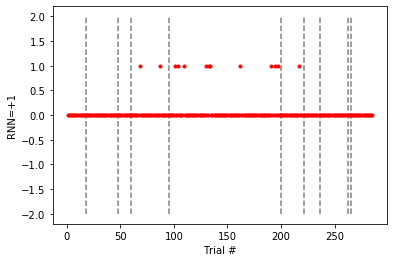

In [11]:
TRIALS = X_rates.shape[0]
tr = np.arange(1, TRIALS+1)
rnn_vs_rlr = np.zeros(TRIALS)
for i in range(TRIALS):
    if (rnn[i] == tru[i]):
        if (rlr[i] != tru[i]):
            rnn_vs_rlr[i] = 1
#     elif (rlr[i] == tru[i]):
#         rnn_vs_rlr[i] = -1
        
a=np.array(ax_info['instance_data']['Block'])
b=np.diff(a, axis=0)
blck=np.array(np.where(b>0)).flatten()

plt.plot(tr, rnn_vs_rlr, 'r.')
for j in range(len(blck)):
    plt.vlines(x=blck[j], ymin=-2, ymax=2, linestyles='dashed', colors='grey')
plt.xlabel("Trial #")
plt.ylabel("RNN=+1")

In [13]:
history, accuracy, pred_y = get_pred_hists_acc(sess_infos[0]['exp_code'], verbose=0)
rnn_pred_y=pred_y

Processing session sra3_2_j_037_00+03...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_2_j_037_00+03 overall accuracy with CNN/LSTM Model: 70.0%


NameError: name 'rnn_pred_y' is not defined

In [15]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.model_selection import KFold

N_SPLITS = 10
lrl_pred_y = []

test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"\nImporting session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

kf = KFold(n_splits=N_SPLITS)
X = np.reshape(X_rates, (X_rates.shape[0], -1))
i = 1
tmp = []

for train_index, test_index in kf.split(X):
    x_tr, x_ts = X[train_index], X[test_index]
    y_tr, y_ts = Y[train_index], Y[test_index]
    clf = LR(random_state=0, verbose=1).fit(x_tr, y_tr)
    y_prd = clf.predict(x_ts)
    tmp.append(y_prd)
#     print (f'Fold #{i} Accuracy is: {acc}')
    i+=1

predicted = tmp[0]
for i in range(1, N_SPLITS):
    predicted = np.concatenate((predicted, tmp[i]))

acc = 100 * np.sum(predicted == Y.flatten()) / len(predicted)
print(f"\n{sess_id} overal accuracy: {acc}\n\n")

lrl_pred_y.append(predicted)


Importing session sra3_2_j_037_00+03


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_2_j_037_00+03 overal accuracy: 50.625




In [20]:
lrl = np.array(lrl_pred_y).flatten()
print(lrl)
print(tru)
print(rnn_pred_y)

[3 3 7 7 7 7 7 7 7 7 7 7 3 7 7 7 3 3 7 3 3 7 3 7 7 7 7 3 7 3 7 3 3 3 3 7 7
 7 3 3 7 7 3 3 7 7 3 3 3 7 7 7 7 3 3 7 3 7 3 3 7 3 7 3 3 7 7 7 7 3 7 7 7 3
 3 3 3 3 3 3 3 3 3 7 7 3 3 7 7 7 3 3 7 7 3 3 7 3 7 3 7 7 3 7 7 7 7 3 3 3 7
 3 3 3 7 7 7 3 7 7 7 7 3 7 3 7 3 3 3 7 7 7 7 3 7 3 3 7 3 7 7 3 3 3 3 7 3 7
 7 3 3 7 3 7 3 7 7 3 3 7]
[3 3 3 7 3 7 3 3 3 7 7 3 3 7 7 7 7 3 3 3 3 3 7 3 7 3 7 3 3 3 7 3 3 7 3 7 7
 3 7 7 7 7 7 3 3 3 7 3 7 3 3 7 7 7 7 3 3 7 7 7 7 7 7 7 7 3 7 3 7 7 3 3 7 7
 3 7 7 3 3 7 7 7 3 3 7 7 3 7 7 7 3 7 3 7 7 3 3 7 3 3 7 3 3 7 7 3 3 7 3 7 3
 3 7 3 3 3 7 3 7 3 7 3 3 3 3 7 3 3 3 3 7 7 3 3 3 7 7 3 3 7 7 7 3 7 3 7 7 3
 3 7 7 7 3 7 7 7 7 7 7 7]
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 7 7 7 3 3 7 7 3 3 7 7 3 3 3 7 7 7 7 7 7
 7 7 7 3 3 7 7 3 7 7 7 3 7 3 7 7 7 7 7 3 3 3 7 7 7 3 3 3 3 3 3 7 7 3 3 3 3
 7 7 3 3 3 3 3 7 3 3 7 3 7 7 3 7 7 7 7 3 3 7 3 3 3 3 3 7 7 3 3 3 3 3 3 3 3
 3 3 7 3 3 3 3 3 7 7 3 3 3 7 3 3 7 7 3 7 3 7 7 3 3 7 7 3 3 3 3 3 7 7 7 7 3
 3 7 7 3 3 7 3 7 3 7 7 7]


In [16]:
tru = Y.flatten()

Text(0, 0.5, 'RNN=+1, RLR=-1')

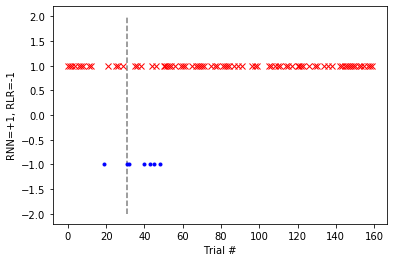

In [26]:
TRIALS = X_rates.shape[0]
tr = np.arange(1, TRIALS+1)
rnn_vs_rlr = np.zeros(TRIALS)
for i in range(TRIALS):
    if (rnn_pred_y[i] == tru[i]):
        if (rlr[i] != tru[i]):
            rnn_vs_rlr[i] = 1
    elif (rlr[i] == tru[i]):
        rnn_vs_rlr[i] = -1
        
a=np.array(ax_info['instance_data']['Block'])
b=np.diff(a, axis=0)
blck=np.array(np.where(b>0)).flatten()
b=0
for a in rnn_vs_rlr:
    if a>0:
        plt.plot(b, a, 'rx')
    elif a<0:
        plt.plot(b, a, 'b.')
    b += 1
# plt.plot(tr, rnn_vs_rlr, 'r.')
for j in range(len(blck)):
    plt.vlines(x=blck[j], ymin=-2, ymax=2, linestyles='dashed', colors='grey')
plt.xlabel("Trial #")
plt.ylabel("RNN=+1, RLR=-1")

In [27]:
history, accuracy, pred_y = get_pred_hists_acc(sess_infos[1]['exp_code'], verbose=0)
rnn_pred_y=pred_y

Processing session sra3_1_j_050_00+...
	Split 1 of 10
	Split 2 of 10
	Split 3 of 10
	Split 4 of 10
	Split 5 of 10
	Split 6 of 10
	Split 7 of 10
	Split 8 of 10
	Split 9 of 10
	Split 10 of 10


Session sra3_1_j_050_00+ overall accuracy with CNN/LSTM Model: 88.7719298245614%


In [30]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.model_selection import KFold

N_SPLITS = 10
lrl_pred_y = []

test_sess_ix = 1
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
print(f"\nImporting session {sess_id}")
X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)

kf = KFold(n_splits=N_SPLITS)
X = np.reshape(X_rates, (X_rates.shape[0], -1))
i = 1
tmp = []

for train_index, test_index in kf.split(X):
    x_tr, x_ts = X[train_index], X[test_index]
    y_tr, y_ts = Y[train_index], Y[test_index]
    clf = LR(random_state=0, verbose=1).fit(x_tr, y_tr)
    y_prd = clf.predict(x_ts)
    tmp.append(y_prd)
#     print (f'Fold #{i} Accuracy is: {acc}')
    i+=1

predicted = tmp[0]
for i in range(1, N_SPLITS):
    predicted = np.concatenate((predicted, tmp[i]))

acc = 100 * np.sum(predicted == Y.flatten()) / len(predicted)
print(f"\n{sess_id} overal accuracy: {acc}\n\n")

lrl_pred_y.append(predicted)


Importing session sra3_1_j_050_00+


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j


sra3_1_j_050_00+ overal accuracy: 80.0




[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


In [31]:
X_rates.shape

(285, 36, 171)

In [32]:
tru = Y.flatten()

Text(0, 0.5, 'RNN=+1, RLR=-1')

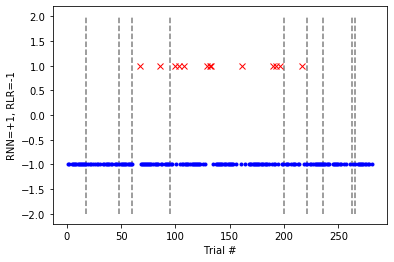

In [33]:
TRIALS = X_rates.shape[0]
tr = np.arange(1, TRIALS+1)
rnn_vs_rlr = np.zeros(TRIALS)
for i in range(TRIALS):
    if (rnn_pred_y[i] == tru[i]):
        if (rlr[i] != tru[i]):
            rnn_vs_rlr[i] = 1
    elif (rlr[i] == tru[i]):
        rnn_vs_rlr[i] = -1
        
a=np.array(ax_info['instance_data']['Block'])
b=np.diff(a, axis=0)
blck=np.array(np.where(b>0)).flatten()
b=0
for a in rnn_vs_rlr:
    if a>0:
        plt.plot(b, a, 'rx')
    elif a<0:
        plt.plot(b, a, 'b.')
    b += 1
# plt.plot(tr, rnn_vs_rlr, 'r.')
for j in range(len(blck)):
    plt.vlines(x=blck[j], ymin=-2, ymax=2, linestyles='dashed', colors='grey')
plt.xlabel("Trial #")
plt.ylabel("RNN=+1, RLR=-1")

# Monkey Behavioural Performance

## J37A

In [103]:
test_sess_ix = 0
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
# print(f"\nImporting session {sess_id}")
# X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
# Y_class = tf.keras.utils.to_categorical(Y, num_classes=8)
print(data_path)
print(sess_id)

C:\My Stuff\Workplace\GitHub\MonkeyPFC_Master\MonkeyPFCSaccadeStudies\StudyLocationRule\Data\Preprocessed
sra3_2_j_037_00+03


In [104]:
segmented_path = Path.cwd() / 'StudyLocationRule' / 'Data' / 'Preprocessed' / 'sra3_1_j_050_00_segmented.h5'

print(segmented_path)
segmented_data = from_neuropype_h5(segmented_path)
outcome = segmented_data[2][1]['axes'][0]['data']['OutcomeCode']
Y = segmented_data[2][1]['axes'][0]['data']['TargetClass']
X = segmented_data[2][1]['data']
print(outcome.shape)
print(X.shape)
print(Y.shape, min(Y), max(Y))

C:\My Stuff\Workplace\GitHub\MonkeyPFC_Master\MonkeyPFCSaccadeStudies\StudyLocationRule\Data\Preprocessed\sra3_1_j_050_00_segmented.h5
(663,)
(663, 2052, 36)
(663,) 0 7


In [25]:
np.unique(Y[:300])

array([0, 1, 2, 3, 4, 5, 6, 7])

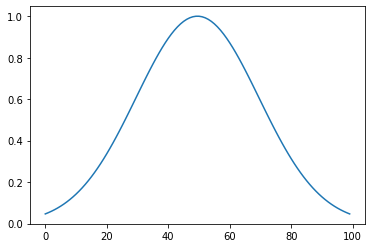

In [27]:
from scipy import signal

kernel = signal.gaussian(100, 20)
plt.plot(kernel)

In [28]:
from scipy import signal
kernel = signal.gaussian(100, 20)
X_conv = np.zeros_like(X)
for i in range(X.shape[0]):
    for j in range(X.shape[2]):
        X_conv[i,:,j] = signal.fftconvolve(np.squeeze(X[i,:,j]), kernel, mode='same')

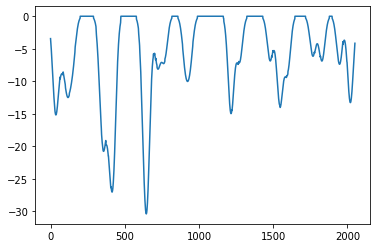

In [29]:
plt.plot(X_conv[10,:,0])

In [31]:
X_conv = np.abs(X_conv)

In [38]:
model_kwargs1 = dict(
    filt=16,
    kernLength=30,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=64,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)

In [35]:
np.unique(Y[:400], return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 array([53, 43, 58, 34, 52, 57, 65, 38], dtype=int64))

In [36]:
np.unique(Y[400:], return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 array([30, 32, 42, 24, 18, 58, 32, 27], dtype=int64))

### First 400 Trials for Training

In [41]:
EPOCHS = 150

X_conv = np.transpose(X, (0, 2, 1))
x_tr = X_conv[:400]
tmp = Y[:400]
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[400:]
tmp = Y[400:]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       592       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [43]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 400 samples, validate on 263 samples
Epoch 1/150
400/400 [==============================] - 23s 58ms/sample - loss: 2.6972 - accuracy: 0.1425 - val_loss: 2.3343 - val_accuracy: 0.0798
Epoch 2/150
400/400 [==============================] - 22s 55ms/sample - loss: 2.4527 - accuracy: 0.2125 - val_loss: 2.3281 - val_accuracy: 0.0684
Epoch 3/150
400/400 [==============================] - 22s 54ms/sample - loss: 2.3538 - accuracy: 0.2575 - val_loss: 2.3225 - val_accuracy: 0.0684
Epoch 4/150
400/400 [==============================] - 22s 54ms/sample - loss: 2.2219 - accuracy: 0.3350 - val_loss: 2.3169 - val_accuracy: 0.1749
Epoch 5/150
400/400 [==============================] - 22s 54ms/sample - loss: 2.1278 - accuracy: 0.3700 - val_loss: 2.3120 - val_accuracy: 0.2167
Epoch 6/150
400/400 [==============================] - 22s 54ms/sample - loss: 2.0284 - accuracy: 0.4425 - val_loss: 2.3069 - val_accuracy: 0.2091
Epoch 7/150
400/400 [==============================] - 22s 54ms/sample -

400/400 [==============================] - 22s 55ms/sample - loss: 1.0638 - accuracy: 0.9475 - val_loss: 1.6075 - val_accuracy: 0.6502
Epoch 112/150
400/400 [==============================] - 22s 55ms/sample - loss: 1.0688 - accuracy: 0.9350 - val_loss: 1.5943 - val_accuracy: 0.6768
Epoch 113/150
400/400 [==============================] - 22s 55ms/sample - loss: 1.0700 - accuracy: 0.9375 - val_loss: 1.5233 - val_accuracy: 0.6996
Epoch 114/150
400/400 [==============================] - 22s 55ms/sample - loss: 1.0482 - accuracy: 0.9525 - val_loss: 1.5360 - val_accuracy: 0.7034
Epoch 115/150
400/400 [==============================] - 22s 55ms/sample - loss: 1.0503 - accuracy: 0.9500 - val_loss: 1.5088 - val_accuracy: 0.7186
Epoch 116/150
400/400 [==============================] - 22s 55ms/sample - loss: 1.0853 - accuracy: 0.9300 - val_loss: 1.5342 - val_accuracy: 0.7072
Epoch 117/150
400/400 [==============================] - 22s 55ms/sample - loss: 1.0412 - accuracy: 0.9525 - val_loss: 1

In [44]:
model_path = f'lstm_manual_trained.h5'
model.save(model_path)

In [47]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(663,)

In [49]:
pred_y = np.array([4, 4, 0, 4, 4, 0, 0, 4, 4, 4, 0, 4, 4, 0, 4, 0, 0, 0, 0, 4, 0, 4,
       0, 4, 0, 0, 4, 0, 4, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4, 0, 0, 4, 0, 4,
       0, 0, 4, 4, 0, 0, 4, 4, 0, 4, 0, 0, 0, 4, 0, 0, 4, 4, 4, 4, 0, 4,
       4, 0, 4, 0, 4, 0, 4, 1, 3, 3, 3, 3, 3, 3, 7, 3, 3, 7, 3, 7, 7, 3,
       3, 7, 3, 7, 7, 7, 7, 7, 7, 3, 7, 7, 7, 3, 3, 3, 3, 7, 7, 7, 7, 7,
       3, 7, 3, 3, 7, 3, 7, 7, 7, 3, 7, 3, 3, 3, 3, 7, 3, 3, 7, 7, 7, 7,
       7, 3, 7, 3, 7, 3, 3, 7, 7, 7, 3, 3, 7, 7, 0, 4, 0, 4, 4, 0, 4, 0,
       0, 0, 0, 0, 4, 0, 0, 4, 4, 4, 4, 0, 0, 0, 0, 0, 4, 0, 0, 4, 4, 0,
       0, 4, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 1, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 1,
       1, 5, 1, 5, 5, 5, 1, 1, 5, 1, 5, 1, 5, 5, 1, 1, 1, 0, 5, 5, 5, 1,
       5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 1, 1, 1, 0, 1, 1, 5, 1, 5, 5, 0, 5,
       5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 0, 1, 1, 2, 6, 2, 2, 6, 2, 6, 6, 6,
       6, 2, 6, 2, 2, 6, 6, 6, 6, 6, 6, 2, 6, 6, 6, 6, 2, 6, 2, 2, 2, 6,
       2, 2, 2, 6, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 2, 6, 2, 6, 6, 2, 2, 2,
       6, 6, 2, 6, 2, 6, 6, 2, 6, 2, 6, 6, 6, 2, 6, 2, 6, 2, 2, 6, 6, 2,
       6, 6, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 6, 6,
       2, 2, 2, 6, 6, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 2, 6, 6, 2, 6, 2, 2,
       2, 6, 2, 6, 6, 6, 2, 2, 6, 6, 2, 2, 6, 6, 2, 6, 2, 2, 2, 2, 2, 6,
       6, 6, 6, 6, 2, 4, 4, 0, 4, 6, 6, 6, 2, 2, 2, 6, 6, 2, 6, 2, 2, 2,
       6, 2, 2, 6, 6, 6, 6, 6, 7, 2, 2, 6, 6, 2, 2, 2, 2, 2, 5, 2, 2, 6,
       6, 6, 2, 6, 6, 2, 6, 6, 2, 2, 2, 6, 2, 2, 6, 4, 4, 4, 4, 4, 0, 4,
       0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 4, 0, 0, 4, 0, 0, 0, 4, 0, 0, 0,
       4, 4, 0, 4, 0, 4, 0, 4, 4, 4, 4, 2, 3, 7, 3, 7, 3, 3, 3, 3, 3, 7,
       3, 3, 7, 3, 3, 3, 3, 7, 7, 7, 7, 7, 7, 7, 3, 7, 3, 7, 7, 7, 7, 3,
       7, 7, 3, 3, 3, 3, 7, 3, 3, 7, 7, 3, 3, 7, 6, 3, 7, 7, 1, 5, 0, 1,
       5, 1, 6, 4, 5, 0, 0, 5, 4, 6, 5, 5, 0, 5, 5, 6, 5, 5, 4, 5, 1, 1,
       1, 4, 0, 5, 6, 0, 4, 4, 0, 5, 5, 5, 5, 5, 5, 1, 0, 5, 1, 5, 5, 4,
       5, 1, 1, 4, 1, 1, 1, 1, 5, 5, 4, 1, 5, 5, 1, 5, 1, 6, 7, 5, 5, 7,
       1, 5, 7, 1, 5, 6, 0, 1, 1, 5, 5, 5, 5, 5, 1, 5, 4, 0, 5, 0, 1, 5,
       5, 1, 5])

In [50]:
true_y = np.array([4, 4, 4, 4, 4, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 4, 0, 4,
       0, 4, 0, 0, 4, 0, 4, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4, 0, 0, 4, 0, 4,
       0, 0, 4, 4, 0, 0, 4, 4, 0, 4, 0, 0, 0, 4, 0, 0, 4, 4, 4, 4, 0, 4,
       4, 0, 4, 0, 4, 0, 4, 1, 3, 3, 3, 3, 3, 3, 7, 3, 3, 7, 3, 7, 7, 3,
       3, 7, 3, 7, 7, 7, 7, 7, 7, 3, 7, 7, 7, 3, 3, 3, 3, 7, 7, 7, 7, 7,
       3, 7, 3, 3, 7, 3, 7, 7, 7, 3, 7, 3, 3, 3, 3, 7, 3, 3, 7, 7, 7, 7,
       7, 3, 7, 3, 7, 3, 3, 7, 7, 7, 3, 3, 7, 7, 0, 4, 0, 4, 4, 0, 4, 0,
       0, 4, 0, 0, 4, 0, 0, 4, 4, 4, 4, 0, 0, 0, 0, 0, 4, 0, 0, 4, 4, 0,
       0, 4, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 1, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 1,
       1, 5, 1, 5, 5, 5, 1, 1, 5, 1, 5, 1, 5, 5, 1, 1, 1, 1, 5, 5, 5, 1,
       5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 1, 1, 1, 1, 1, 1, 5, 1, 5, 5, 5, 5,
       5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 1, 1, 1, 2, 6, 2, 2, 6, 2, 6, 6, 6,
       6, 2, 6, 2, 2, 6, 6, 6, 6, 6, 6, 2, 6, 6, 6, 6, 2, 6, 2, 2, 2, 6,
       2, 2, 2, 6, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 2, 6, 2, 6, 6, 2, 2, 2,
       6, 6, 2, 6, 2, 6, 6, 2, 6, 2, 6, 6, 6, 2, 6, 2, 6, 2, 2, 6, 6, 2,
       6, 6, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 6, 6,
       2, 2, 2, 6, 6, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 2, 6, 6, 2, 6, 2, 2,
       2, 6, 2, 6, 6, 6, 2, 2, 6, 6, 2, 2, 6, 6, 2, 6, 2, 2, 2, 2, 2, 6,
       2, 6, 6, 2, 2, 4, 4, 4, 4, 6, 6, 6, 2, 2, 2, 6, 6, 6, 6, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 6, 6, 2, 2, 2, 6, 6, 2, 2, 2, 2, 2, 6, 2, 2, 6,
       6, 6, 2, 6, 6, 2, 6, 6, 2, 2, 2, 6, 2, 2, 6, 0, 0, 0, 0, 0, 4, 0,
       4, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4, 4, 0, 0, 0,
       4, 4, 0, 4, 0, 4, 0, 0, 0, 4, 0, 3, 7, 7, 3, 7, 3, 7, 3, 7, 3, 7,
       3, 3, 7, 3, 7, 3, 3, 3, 7, 3, 7, 7, 7, 7, 7, 7, 3, 7, 7, 7, 7, 7,
       3, 7, 3, 3, 3, 3, 7, 3, 3, 7, 7, 3, 3, 7, 7, 3, 7, 3, 5, 5, 1, 5,
       1, 1, 5, 1, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 6, 4, 4, 4, 0, 1, 5, 5, 1, 5, 5, 1, 5, 5, 1, 1, 5, 1,
       1, 1, 1, 5, 5, 5, 1, 5, 5, 5, 1, 5, 5, 5, 1, 1, 5, 5, 5, 5, 5, 5,
       1, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 1, 5, 5, 1, 5,
       1, 5, 5])

In [51]:
perf = (pred_y == true_y).astype(int)
print(perf)

[1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0
 0 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0
 0 0 0 0 1 1 1 0 1 1 1 1 

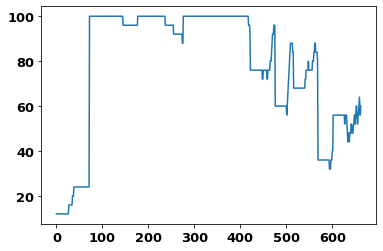

In [60]:
mod_perf = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%9
    elif perf[i] == perf[i-tot]:
        mod_perf[i] = mod_perf[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf)):
    if mod_perf[i]<0:
        mod_perf[i] = 0
# print(m_performance)
plt.plot(mod_perf)

### Last 400 Trials for Training

In [105]:
EPOCHS = 150

X_conv = np.transpose(X, (0, 2, 1))
x_tr = X_conv[-400:]
tmp = Y[-400:]
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[:-400]
tmp = Y[:-400]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model2 = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model2.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model2.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       592       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [108]:
hist = model2.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 400 samples, validate on 263 samples
Epoch 1/150
400/400 [==============================] - 24s 61ms/sample - loss: 2.6065 - accuracy: 0.1875 - val_loss: 2.3392 - val_accuracy: 0.1673
Epoch 2/150
400/400 [==============================] - 22s 55ms/sample - loss: 2.3121 - accuracy: 0.2900 - val_loss: 2.3363 - val_accuracy: 0.1863
Epoch 3/150
400/400 [==============================] - 22s 55ms/sample - loss: 2.1441 - accuracy: 0.3925 - val_loss: 2.3310 - val_accuracy: 0.1863
Epoch 4/150
400/400 [==============================] - 22s 56ms/sample - loss: 2.1048 - accuracy: 0.4550 - val_loss: 2.3260 - val_accuracy: 0.1825
Epoch 5/150
400/400 [==============================] - 23s 57ms/sample - loss: 2.0241 - accuracy: 0.4975 - val_loss: 2.3251 - val_accuracy: 0.1635
Epoch 6/150
400/400 [==============================] - 22s 56ms/sample - loss: 1.9187 - accuracy: 0.5400 - val_loss: 2.3189 - val_accuracy: 0.1825
Epoch 7/150
400/400 [==============================] - 22s 56ms/sample -

400/400 [==============================] - 24s 60ms/sample - loss: 1.0601 - accuracy: 0.9275 - val_loss: 1.7426 - val_accuracy: 0.5513
Epoch 112/150
400/400 [==============================] - 24s 60ms/sample - loss: 1.0347 - accuracy: 0.9400 - val_loss: 1.7847 - val_accuracy: 0.5817
Epoch 113/150
400/400 [==============================] - 24s 60ms/sample - loss: 1.0480 - accuracy: 0.9500 - val_loss: 1.7382 - val_accuracy: 0.5970
Epoch 114/150
400/400 [==============================] - 24s 59ms/sample - loss: 1.0569 - accuracy: 0.9350 - val_loss: 1.7793 - val_accuracy: 0.6046
Epoch 115/150
400/400 [==============================] - 24s 59ms/sample - loss: 1.0401 - accuracy: 0.9475 - val_loss: 1.8718 - val_accuracy: 0.5475
Epoch 116/150
400/400 [==============================] - 24s 60ms/sample - loss: 1.0364 - accuracy: 0.9425 - val_loss: 1.8241 - val_accuracy: 0.5475
Epoch 117/150
400/400 [==============================] - 24s 60ms/sample - loss: 1.0448 - accuracy: 0.9400 - val_loss: 1

In [119]:
model_path = f'lstm_manual_trained2.h5'
model2.save(model_path)

In [110]:
y_pred2 = model2.predict(X_conv)
pred_y2 = np.argmax(y_pred2, axis=1)
pred_y2.shape

(663,)

In [112]:
pred_y2 = np.array([4, 0, 0, 0, 4, 0, 4, 5, 4, 0, 0, 0, 4, 0, 5, 0, 0, 6, 0, 0, 0, 0,
       4, 4, 0, 3, 0, 0, 0, 4, 3, 6, 4, 4, 4, 1, 5, 5, 4, 0, 4, 5, 5, 5,
       0, 0, 0, 4, 0, 0, 5, 0, 0, 0, 0, 0, 4, 0, 0, 0, 5, 4, 4, 4, 0, 4,
       4, 0, 4, 0, 1, 0, 0, 6, 3, 3, 3, 3, 3, 3, 3, 3, 7, 3, 3, 3, 7, 3,
       3, 3, 3, 7, 3, 3, 7, 3, 7, 3, 7, 7, 7, 3, 7, 3, 3, 7, 7, 3, 7, 3,
       3, 7, 7, 3, 7, 3, 3, 3, 7, 7, 3, 3, 3, 3, 3, 7, 3, 3, 3, 3, 3, 3,
       7, 4, 7, 3, 3, 3, 3, 7, 7, 7, 7, 3, 0, 3, 0, 7, 0, 0, 0, 4, 4, 0,
       4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 4, 0, 0, 4, 0, 0,
       0, 3, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 1, 5,
       5, 5, 1, 5, 5, 5, 5, 1, 5, 0, 5, 5, 5, 6, 5, 5, 6, 5, 5, 5, 5, 1,
       1, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 6, 6, 5, 1, 1, 5, 0, 5, 5, 5, 1,
       1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 1, 0, 1, 1, 5, 5, 1, 5, 1, 5,
       5, 0, 5, 5, 1, 5, 1, 5, 5, 5, 1, 1, 1, 7, 6, 2, 2, 6, 2, 6, 6, 6,
       6, 2, 6, 7, 7, 6, 6, 6, 6, 6, 6, 2, 6, 6, 6, 6, 2, 6, 2, 2, 2, 6,
       2, 2, 2, 6, 6, 2, 6, 2, 2, 7, 6, 6, 6, 6, 2, 6, 2, 6, 6, 7, 2, 2,
       6, 6, 2, 6, 2, 6, 6, 2, 6, 2, 6, 6, 6, 2, 6, 2, 6, 3, 2, 6, 6, 2,
       6, 6, 6, 6, 2, 6, 6, 6, 6, 7, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 6, 6,
       2, 2, 2, 6, 6, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 6, 6, 6, 2, 6, 2, 2,
       2, 6, 2, 6, 6, 6, 2, 2, 6, 6, 2, 2, 6, 6, 2, 6, 3, 3, 7, 2, 2, 6,
       2, 6, 6, 7, 2, 4, 4, 4, 4, 6, 6, 6, 2, 2, 2, 6, 6, 6, 6, 2, 3, 2,
       2, 2, 2, 2, 2, 2, 6, 6, 7, 2, 2, 6, 6, 2, 7, 2, 2, 2, 6, 2, 2, 6,
       6, 6, 3, 6, 6, 2, 6, 6, 2, 2, 3, 6, 2, 2, 6, 0, 0, 0, 0, 0, 4, 0,
       4, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4, 4, 0, 0, 0,
       4, 4, 0, 4, 0, 4, 0, 0, 0, 4, 0, 7, 7, 7, 3, 7, 3, 7, 3, 7, 3, 7,
       3, 3, 7, 3, 7, 3, 3, 3, 7, 3, 7, 7, 7, 7, 7, 7, 3, 7, 7, 7, 7, 7,
       3, 7, 3, 3, 3, 3, 7, 3, 3, 7, 7, 3, 3, 7, 7, 3, 7, 3, 5, 5, 1, 5,
       1, 5, 5, 1, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 6, 4, 4, 4, 0, 1, 5, 5, 1, 5, 5, 1, 5, 5, 1, 5, 5, 1,
       1, 1, 1, 5, 5, 1, 1, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5,
       1, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 0, 5, 5, 1, 5,
       1, 5, 5])

In [113]:
perf2 = (pred_y2 == true_y).astype(int)
print(perf2)

[1 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 0 0
 1 1 1 1 1 1 0 1 0 0 1 0 1 1 1 0 1 1 0 0 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1
 1 0 1 1 1 0 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 1 0 0 1 0
 1 0 0 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0
 0 1 1 0 0 1 0 0 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 0 1 0 1 0 1 1 1
 1 1 1 1 0 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 1 1 1
 0 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

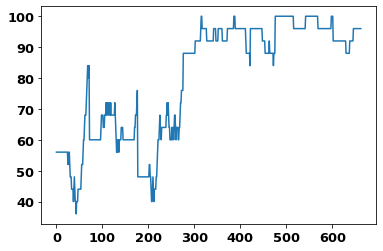

In [114]:
mod_perf2 = np.zeros(len(perf2))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf2[i]==0:
        cor += 1

mod_perf2[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf2):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf2[i+j]==1:
                cor += 1
        mod_perf2[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%9
    elif perf2[i] == perf2[i-tot]:
        mod_perf2[i] = mod_perf2[i-1]
        i += 1
    elif perf2[i]==1:
        cor += 1
        mod_perf2[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf2[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf2)):
    if mod_perf2[i]<0:
        mod_perf2[i] = 0
# print(m_performance)
plt.plot(mod_perf2)

### First 200 and Last 200 Trials for Training

In [117]:
a = X_conv[200:-200]
a.shape

(263, 36, 2052)

In [118]:
EPOCHS = 150

X_conv = np.transpose(X, (0, 2, 1))
x_tr = np.concatenate((X_conv[:200], X_conv[-200:]), axis=0)
tmp = np.concatenate((Y[:200], Y[-200:]), axis=0)
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[200:-200]
tmp = Y[200:-200]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model3 = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model3.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model3.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 36, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 36, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       592       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [120]:
hist = model3.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 400 samples, validate on 263 samples
Epoch 1/150
400/400 [==============================] - 27s 68ms/sample - loss: 2.6864 - accuracy: 0.1250 - val_loss: 2.3452 - val_accuracy: 0.0190
Epoch 2/150
400/400 [==============================] - 48s 119ms/sample - loss: 2.4630 - accuracy: 0.2275 - val_loss: 2.3517 - val_accuracy: 0.0152
Epoch 3/150
400/400 [==============================] - 48s 119ms/sample - loss: 2.3070 - accuracy: 0.2550 - val_loss: 2.3603 - val_accuracy: 0.0152
Epoch 4/150
400/400 [==============================] - 47s 117ms/sample - loss: 2.0987 - accuracy: 0.3325 - val_loss: 2.3720 - val_accuracy: 0.0152
Epoch 5/150
400/400 [==============================] - 48s 119ms/sample - loss: 2.1172 - accuracy: 0.3600 - val_loss: 2.3769 - val_accuracy: 0.0152
Epoch 6/150
400/400 [==============================] - 48s 119ms/sample - loss: 2.0386 - accuracy: 0.4075 - val_loss: 2.3927 - val_accuracy: 0.0152
Epoch 7/150
400/400 [==============================] - 48s 119ms/sa

400/400 [==============================] - 48s 120ms/sample - loss: 1.2241 - accuracy: 0.8625 - val_loss: 1.7065 - val_accuracy: 0.6350
Epoch 111/150
400/400 [==============================] - 47s 116ms/sample - loss: 1.2235 - accuracy: 0.8525 - val_loss: 1.7654 - val_accuracy: 0.6236
Epoch 112/150
400/400 [==============================] - 47s 118ms/sample - loss: 1.2351 - accuracy: 0.8400 - val_loss: 1.7590 - val_accuracy: 0.6160
Epoch 113/150
400/400 [==============================] - 48s 119ms/sample - loss: 1.2415 - accuracy: 0.8225 - val_loss: 1.7490 - val_accuracy: 0.6464
Epoch 114/150
400/400 [==============================] - 48s 119ms/sample - loss: 1.2358 - accuracy: 0.8400 - val_loss: 1.7498 - val_accuracy: 0.6274
Epoch 115/150
400/400 [==============================] - 48s 119ms/sample - loss: 1.2143 - accuracy: 0.8600 - val_loss: 2.0039 - val_accuracy: 0.4601
Epoch 116/150
400/400 [==============================] - 48s 119ms/sample - loss: 1.2359 - accuracy: 0.8175 - val_

In [121]:
model_path = f'lstm_manual_trained3.h5'
model3.save(model_path)

In [122]:
y_pred3 = model3.predict(X_conv)
pred_y3 = np.argmax(y_pred3, axis=1)
pred_y3.shape

(663,)

In [123]:
pred_y3

array([0, 4, 0, 4, 4, 0, 0, 4, 4, 4, 0, 0, 0, 4, 4, 0, 0, 0, 0, 4, 0, 4,
       0, 4, 0, 0, 4, 0, 4, 0, 0, 0, 0, 0, 0, 4, 4, 0, 4, 0, 0, 0, 0, 4,
       0, 0, 4, 0, 0, 0, 4, 4, 0, 4, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 0, 4,
       4, 0, 4, 0, 4, 0, 4, 1, 3, 3, 3, 3, 3, 3, 3, 3, 7, 7, 3, 7, 7, 3,
       3, 7, 3, 7, 7, 7, 7, 7, 7, 3, 7, 7, 7, 3, 3, 3, 3, 7, 7, 7, 7, 7,
       3, 7, 3, 3, 7, 3, 7, 7, 7, 3, 7, 3, 3, 3, 3, 7, 3, 3, 7, 7, 7, 7,
       7, 3, 7, 3, 7, 3, 3, 7, 7, 7, 3, 3, 7, 7, 0, 4, 0, 0, 4, 0, 4, 0,
       0, 0, 0, 0, 4, 0, 0, 4, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0,
       0, 4, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 7, 1, 5, 6, 5, 5, 1, 1, 1,
       5, 5, 1, 5, 5, 4, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 1,
       5, 5, 5, 1, 5, 1, 5, 1, 4, 5, 5, 1, 1, 1, 5, 1, 5, 5, 1, 4, 1, 1,
       7, 1, 5, 7, 1, 5, 1, 5, 5, 5, 5, 1, 5, 7, 7, 6, 3, 7, 3, 2, 6, 7,
       7, 7, 7, 7, 6, 2, 6, 6, 6, 7, 6, 2, 7, 2, 7,

In [124]:
perf3 = (pred_y3 == true_y).astype(int)
print(perf3)

[0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 0 1 1 0 1
 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0 0 1 1 1 0 0 1 0 1 1 1 0 1 1
 0 0 0 0 0 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0
 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 1 0 0 1 0 0 0 0 1 1 1 1 1 1 1 1 0 0 0 1 1 1
 1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 1 1 0 1 0 1 1 0 1 1 1 0 1 1 1 1
 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 1 1 1 1
 1 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 1 1 1 1 1 1 0 0 1 1 0 0 1 0 0 1
 0 0 0 1 0 0 1 1 1 0 0 0 1 1 1 0 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0
 0 1 1 1 1 1 1 1 1 1 1 1 

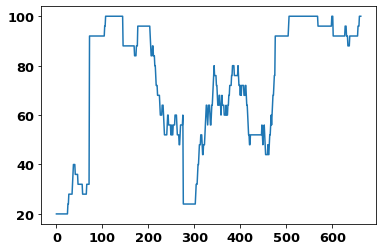

In [125]:
mod_perf3 = np.zeros(len(perf3))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf3[i]==0:
        cor += 1

mod_perf3[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf3):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf3[i+j]==1:
                cor += 1
        mod_perf3[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%9
    elif perf3[i] == perf3[i-tot]:
        mod_perf3[i] = mod_perf3[i-1]
        i += 1
    elif perf3[i]==1:
        cor += 1
        mod_perf3[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf3[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf3)):
    if mod_perf3[i]<0:
        mod_perf3[i] = 0
# print(m_performance)
plt.plot(mod_perf3)

## Monkey Performance

In [53]:
block = segmented_data[2][1]['axes'][0]['data']['Block']
block = np.array(block).flatten()

In [28]:
print(block)
block[:80]

[ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  5  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 3, 3, 3, 3, 3, 3], dtype=int64)

In [54]:
b=np.diff(block, axis=0)
blck=np.array(np.where(b>0)).flatten()
print(blck)
# for i in range(len(blck)):
#     print(target[blck[i]-1])
#     print(color[])
blck = np.hstack((np.array([0]), blck))
print (blck)

[ 72  73 145 177 178 276 422 426 476 516 565 566 567 597 598 602]
[  0  72  73 145 177 178 276 422 426 476 516 565 566 567 597 598 602]


In [53]:
for i in range(1,len(blck)):
    print(np.unique(target[blck[i-1]:blck[i]], return_index = True))
    print(np.unique(color[blck[i-1]:blck[i]], return_index = True))
    
print(np.unique(target[blck[-1]:], return_index = True))
print(np.unique(color[blck[-1]:], return_index = True))


(array(['DD', 'UU'], dtype=object), array([0, 5], dtype=int64))
(array(['b', 'g'], dtype=object), array([5, 0], dtype=int64))
(array(['DD'], dtype=object), array([0], dtype=int64))
(array(['g'], dtype=object), array([0], dtype=int64))
(array(['DR', 'UL', 'UR'], dtype=object), array([1, 7, 0], dtype=int64))
(array(['b', 'r'], dtype=object), array([7, 0], dtype=int64))
(array(['DD', 'UL', 'UU'], dtype=object), array([2, 0, 1], dtype=int64))
(array(['b', 'g'], dtype=object), array([0, 2], dtype=int64))
(array(['DD'], dtype=object), array([0], dtype=int64))
(array(['g'], dtype=object), array([0], dtype=int64))
(array(['DL', 'UR'], dtype=object), array([0, 6], dtype=int64))
(array(['b', 'g', 'r'], dtype=object), array([1, 6, 0], dtype=int64))
(array(['LL', 'RR', 'UR'], dtype=object), array([2, 1, 0], dtype=int64))
(array(['g', 'r'], dtype=object), array([0, 2], dtype=int64))
(array(['DD', 'RR'], dtype=object), array([1, 0], dtype=int64))
(array(['g', 'r'], dtype=object), array([0, 1], dtype

In [58]:
for i in range(1,len(blck)):
    print(target[blck[i]-1], color[blck[i]-1])
print

UU b
DD g
UL b
UU b
DD g
UR g
RR g
DD r
RR g
DD g
UL b
DR g
UL b
DL r
DL r
DD r


In [65]:
print(target[-1])
print(color[-1])

DL
b


In [ ]:
blck[]

In [55]:
g_block = np.array([1, 3, 4, 6, 8, 10, 11, 13, 16, 19])
rules = np.array([['DD', 'UU'],['DR', 'UL'],['DD', 'UU'],['DL', 'UR'],['LL', 'RR'],['LL', 'RR'],
                  ['DD', 'UU'],['DR', 'UL'],['UR', 'DL'],['UR', 'DL']])
colors = np.array([['g', 'b'],['r', 'b'],['g', 'b'],['b', 'g'],['r','g'],['r','g'],['g','r'],
                   ['g', 'b'],['g','r'],['r','b']])
border = np.array([72, 145, 177, 276, 422, 476, 516, 569, 602])

In [49]:
# print(target)

In [39]:
np.unique(color[:72])

array(['b', 'g'], dtype=object)

In [12]:
color = segmented_data[2][1]['axes'][0]['data']['CueColour']
color = np.array(color).flatten()
print(color)

['g' 'g' 'g' 'g' 'g' 'b' 'b' 'g' 'g' 'g' 'g' 'g' 'g' 'g' 'g' 'b' 'b' 'b'
 'b' 'g' 'b' 'g' 'b' 'g' 'b' 'b' 'g' 'b' 'g' 'b' 'b' 'b' 'b' 'b' 'b' 'g'
 'g' 'b' 'g' 'b' 'b' 'g' 'b' 'g' 'b' 'b' 'g' 'g' 'b' 'b' 'g' 'g' 'b' 'g'
 'b' 'b' 'b' 'g' 'b' 'b' 'g' 'g' 'g' 'g' 'b' 'g' 'g' 'b' 'g' 'b' 'g' 'b'
 'g' 'r' 'r' 'r' 'r' 'r' 'r' 'r' 'b' 'r' 'r' 'b' 'r' 'b' 'b' 'r' 'r' 'b'
 'r' 'b' 'b' 'b' 'b' 'b' 'b' 'r' 'b' 'b' 'b' 'r' 'r' 'r' 'r' 'b' 'b' 'b'
 'b' 'b' 'r' 'b' 'r' 'r' 'b' 'r' 'b' 'b' 'b' 'r' 'b' 'r' 'r' 'r' 'r' 'b'
 'r' 'r' 'b' 'b' 'b' 'b' 'b' 'r' 'b' 'r' 'b' 'r' 'r' 'b' 'b' 'b' 'r' 'r'
 'b' 'b' 'b' 'g' 'b' 'g' 'g' 'b' 'g' 'b' 'b' 'g' 'b' 'b' 'g' 'b' 'b' 'g'
 'g' 'g' 'g' 'b' 'b' 'b' 'b' 'b' 'g' 'b' 'b' 'g' 'g' 'b' 'b' 'g' 'r' 'b'
 'b' 'b' 'b' 'b' 'g' 'g' 'b' 'b' 'g' 'g' 'g' 'b' 'b' 'b' 'g' 'g' 'b' 'b'
 'b' 'g' 'b' 'b' 'b' 'b' 'g' 'g' 'g' 'g' 'b' 'b' 'b' 'b' 'g' 'b' 'b' 'b'
 'g' 'b' 'g' 'g' 'g' 'b' 'g' 'b' 'b' 'b' 'g' 'g' 'b' 'g' 'b' 'g' 'b' 'b'
 'g' 'g' 'g' 'g' 'b' 'b' 'b' 'g' 'b' 'b' 'g' 'b' 'b

In [13]:
target = np.array(segmented_data[2][1]['axes'][0]['data']['TargetRule']).flatten()
classes = np.array(segmented_data[2][1]['axes'][0]['data']['TargetClass']).flatten()
print(target)

['DD' 'DD' 'DD' 'DD' 'DD' 'UU' 'UU' 'DD' 'DD' 'DD' 'DD' 'DD' 'DD' 'DD'
 'DD' 'UU' 'UU' 'UU' 'UU' 'DD' 'UU' 'DD' 'UU' 'DD' 'UU' 'UU' 'DD' 'UU'
 'DD' 'UU' 'UU' 'UU' 'UU' 'UU' 'UU' 'DD' 'DD' 'UU' 'DD' 'UU' 'UU' 'DD'
 'UU' 'DD' 'UU' 'UU' 'DD' 'DD' 'UU' 'UU' 'DD' 'DD' 'UU' 'DD' 'UU' 'UU'
 'UU' 'DD' 'UU' 'UU' 'DD' 'DD' 'DD' 'DD' 'UU' 'DD' 'DD' 'UU' 'DD' 'UU'
 'DD' 'UU' 'DD' 'UR' 'DR' 'DR' 'DR' 'DR' 'DR' 'DR' 'UL' 'DR' 'DR' 'UL'
 'DR' 'UL' 'UL' 'DR' 'DR' 'UL' 'DR' 'UL' 'UL' 'UL' 'UL' 'UL' 'UL' 'DR'
 'UL' 'UL' 'UL' 'DR' 'DR' 'DR' 'DR' 'UL' 'UL' 'UL' 'UL' 'UL' 'DR' 'UL'
 'DR' 'DR' 'UL' 'DR' 'UL' 'UL' 'UL' 'DR' 'UL' 'DR' 'DR' 'DR' 'DR' 'UL'
 'DR' 'DR' 'UL' 'UL' 'UL' 'UL' 'UL' 'DR' 'UL' 'DR' 'UL' 'DR' 'DR' 'UL'
 'UL' 'UL' 'DR' 'DR' 'UL' 'UL' 'UU' 'DD' 'UU' 'DD' 'DD' 'UU' 'DD' 'UU'
 'UU' 'DD' 'UU' 'UU' 'DD' 'UU' 'UU' 'DD' 'DD' 'DD' 'DD' 'UU' 'UU' 'UU'
 'UU' 'UU' 'DD' 'UU' 'UU' 'DD' 'DD' 'UU' 'UU' 'DD' 'DL' 'DL' 'DL' 'DL'
 'DL' 'DL' 'UR' 'UR' 'DL' 'DL' 'UR' 'UR' 'UR' 'DL' 'DL' 'DL' 'UR' 'UR'
 'DL' 

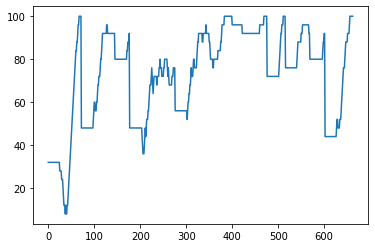

In [56]:
m_performance = np.zeros(len(outcome))
cor = 0
b=0
tot = 25
for i in range(tot):
    if outcome[i]==0:
        cor += 1

m_performance[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(outcome):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if outcome[i+j]==0:
                cor += 1
        m_performance[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%9
    elif outcome[i] == outcome[i-tot]:
        m_performance[i] = m_performance[i-1]
        i += 1
    elif outcome[i]==0:
        cor += 1
        m_performance[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        m_performance[i] = 100 * (cor / tot)
        i +=1

for i in range(len(m_performance)):
    if m_performance[i]<0:
        m_performance[i] = 0
# print(m_performance)
plt.plot(m_performance)

## Plotting Model and Monkey Performance

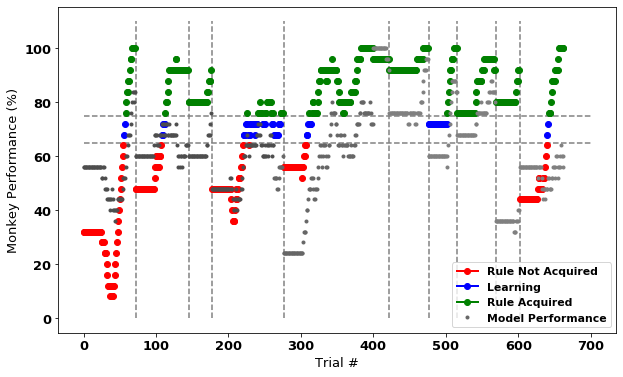

In [132]:
import matplotlib

font = {'weight' : 'bold',
        'size'   : 13}

matplotlib.rc('font', **font)
fig, ax = plt.subplots(figsize=(10,6))
first = np.zeros(3)


for i in range(len(m_performance)):
    if m_performance[i] > 75:
        if (first[0] == 0):
            ax.plot(i, m_performance[i], 'go-', linewidth=2, label='Rule Acquired')
            first[0] = 1
        else:
            ax.plot(i, m_performance[i], 'go-', linewidth=2)
            
                
    elif m_performance[i] < 65:
        if (first[1] == 0):
            ax.plot(i, m_performance[i], 'ro-', linewidth=2, label='Rule Not Acquired')
            first[1] = 1
        else:
            ax.plot(i, m_performance[i], 'ro-', linewidth=2)
    else:
        if (first[2] == 0):
            ax.plot(i, m_performance[i], 'bo-', linewidth=2, label='Learning')
            first[2] = 1
        else:
            ax.plot(i, m_performance[i], 'bo-', linewidth=2)

for i in range(0, len(mod_perf)-400):
    ax.plot(i, mod_perf2[i], 'k.', linewidth=1, color=(0.3,0.3,0.3))

for i in range(len(mod_perf)-400, 400):
    if (i==len(mod_perf)-400):
        ax.plot(i, mod_perf3[i], 'k.', linewidth=1, color=(0.4, 0.4, 0.4), label='Model Performance')
    else:
        ax.plot(i, mod_perf3[i], 'k.', linewidth=1, color=(0.4, 0.4, 0.4))

for i in range(400, len(mod_perf)):
    ax.plot(i, mod_perf[i], 'k.', linewidth=1, color=(0.5, 0.5, 0.5))
# plt.plot(m_performance, linewidth=2)
for i in range(len(border)):
    ax.vlines(x=border[i], ymin=0, ymax=110, linestyles='dashed', colors='grey')
    
ax.hlines(y=65, xmin=0, xmax=700, linestyles='dashed', colors='grey')
ax.hlines(y=75, xmin=0, xmax=700, linestyles='dashed', colors='grey')

plt.ylabel("Monkey Performance (%)")
plt.xlabel("Trial #")
ax.legend(loc='lower right', fontsize='small')
# plt.grid()
plt.savefig("monkey_model_performance.svg")

## J51B

In [12]:
test_sess_ix = 2
sess_info = sess_infos[test_sess_ix]
sess_id = sess_info['exp_code']
# print(f"\nImporting session {sess_id}")
# X_rates, Y, ax_info = load_macaque_pfc(data_path, sess_id, x_chunk='spikerates', **load_kwargs)
# Y_class = tf.keras.utils.to_categorical(Y, num_classes=8)
print(data_path)
print(sess_id)

C:\My Stuff\Workplace\GitHub\MonkeyPFC_Master\MonkeyPFCSaccadeStudies\StudyLocationRule\Data\Preprocessed
sra3_1_j_051_00+


In [43]:
segmented_path = Path.cwd() / 'StudyLocationRule' / 'Data' / 'Preprocessed' / 'sra3_1_j_051_00_segmented.h5'

print(segmented_path)
segmented_data = from_neuropype_h5(segmented_path)
outcome = segmented_data[2][1]['axes'][0]['data']['OutcomeCode']
Y = segmented_data[2][1]['axes'][0]['data']['TargetClass']
X = segmented_data[2][1]['data']
print(outcome.shape)
print(X.shape)
print(Y.shape)
print(np.unique(Y, return_counts=True))

C:\My Stuff\Workplace\GitHub\MonkeyPFC_Master\MonkeyPFCSaccadeStudies\StudyLocationRule\Data\Preprocessed\sra3_1_j_051_00_segmented.h5
(681,)
(681, 2052, 48)
(681,)
(array([0, 1, 2, 4, 5, 6]), array([ 21,  82, 192,  24, 165, 197], dtype=int64))


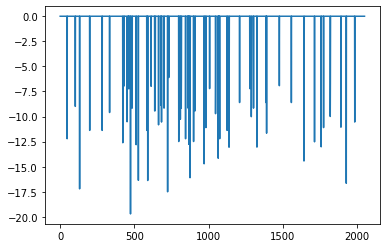

In [18]:
plt.plot(X[0,:,0])

In [44]:
from scipy import signal
kernel = signal.gaussian(100, 20)
X_conv = np.zeros_like(X)
for i in range(X.shape[0]):
    for j in range(X.shape[2]):
        X_conv[i,:,j] = signal.fftconvolve(np.squeeze(X[i,:,j]), kernel, mode='same')

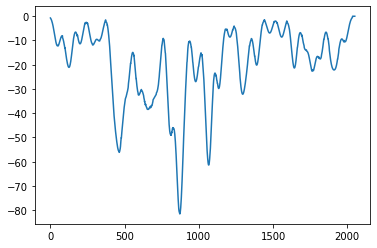

In [45]:
plt.plot(X_conv[0,:,0])

In [46]:
X_conv = np.abs(X_conv)
X_conv = np.transpose(X_conv, (0, 2, 1))

In [47]:
model_kwargs1 = dict(
    filt=16,
    kernLength=30,
    ds_rate=5,
    n_rnn=64,
    n_rnn2=64,
    dropoutRate=0.40,
    activation='relu',
    l1_reg=0.0000, l2_reg=0.001,
    norm_rate=0.25,
    latent_dim=64
)

In [29]:
# tmp1=X_conv
# tmp2=Y
# shuffler = np.random.permutation(len(tmp1))
# X_conv = tmp1[shuffler]
# Y = tmp2[shuffler]
# print(X_conv.shape, Y.shape)

(681, 2052, 48) (681,)


In [55]:
np.unique(Y[:434], return_counts=True)

(array([0, 2, 4, 6]), array([ 21, 192,  24, 197], dtype=int64))

In [56]:
np.unique(Y[434:], return_counts=True)

(array([1, 5]), array([ 82, 165], dtype=int64))

In [57]:
EPOCHS = 150


x_tr = X_conv[:300]
tmp = Y[:300]
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[300:434]
tmp = Y[300:434]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 48, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 48, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 48, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 48, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       784       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [58]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 300 samples, validate on 134 samples
Epoch 1/150
300/300 [==============================] - 22s 74ms/sample - loss: 2.4340 - accuracy: 0.1900 - val_loss: 2.2718 - val_accuracy: 0.4851
Epoch 2/150
300/300 [==============================] - 21s 69ms/sample - loss: 2.1486 - accuracy: 0.3567 - val_loss: 2.2077 - val_accuracy: 0.4403
Epoch 3/150
300/300 [==============================] - 21s 68ms/sample - loss: 1.9114 - accuracy: 0.5333 - val_loss: 2.1644 - val_accuracy: 0.5000
Epoch 4/150
300/300 [==============================] - 20s 68ms/sample - loss: 1.7282 - accuracy: 0.6200 - val_loss: 2.1187 - val_accuracy: 0.5672
Epoch 5/150
300/300 [==============================] - 21s 69ms/sample - loss: 1.6807 - accuracy: 0.6633 - val_loss: 2.0780 - val_accuracy: 0.6194
Epoch 6/150
300/300 [==============================] - 21s 69ms/sample - loss: 1.6257 - accuracy: 0.6767 - val_loss: 2.0400 - val_accuracy: 0.6716
Epoch 7/150
300/300 [==============================] - 22s 72ms/sample -

300/300 [==============================] - 38s 127ms/sample - loss: 0.9495 - accuracy: 0.9900 - val_loss: 1.4052 - val_accuracy: 0.7910
Epoch 112/150
300/300 [==============================] - 39s 130ms/sample - loss: 0.9440 - accuracy: 0.9967 - val_loss: 1.3761 - val_accuracy: 0.8060
Epoch 113/150
300/300 [==============================] - 39s 129ms/sample - loss: 0.9436 - accuracy: 0.9933 - val_loss: 1.3936 - val_accuracy: 0.7985
Epoch 114/150
300/300 [==============================] - 38s 127ms/sample - loss: 0.9716 - accuracy: 0.9700 - val_loss: 1.4247 - val_accuracy: 0.7687
Epoch 115/150
300/300 [==============================] - 38s 126ms/sample - loss: 0.9489 - accuracy: 0.9933 - val_loss: 1.4316 - val_accuracy: 0.7761
Epoch 116/150
300/300 [==============================] - 38s 126ms/sample - loss: 0.9557 - accuracy: 0.9867 - val_loss: 1.4973 - val_accuracy: 0.7164
Epoch 117/150
300/300 [==============================] - 38s 126ms/sample - loss: 0.9426 - accuracy: 0.9933 - val_

In [59]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(681,)

In [67]:
pred_y = np.array([0, 4, 0, 4, 0, 4, 4, 0, 0, 0, 0, 4, 4, 4, 0, 4, 0, 0, 4, 0, 0, 4,
       4, 0, 0, 4, 0, 4, 4, 0, 4, 4, 0, 4, 4, 4, 4, 4, 4, 0, 0, 0, 4, 0,
       4, 2, 6, 2, 2, 6, 6, 6, 2, 6, 2, 6, 6, 6, 6, 2, 2, 2, 6, 2, 6, 2,
       6, 2, 2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 2, 6, 6, 2, 6, 6, 6, 6, 6,
       2, 2, 2, 6, 6, 6, 6, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 6, 6,
       6, 6, 2, 6, 2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 6, 6, 6,
       2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2, 6, 6, 6, 6, 6, 2, 6, 2, 6, 2, 2,
       6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 6, 6, 6, 6, 6, 2, 6, 6, 2, 2, 2, 6,
       2, 6, 6, 2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 6, 6, 2, 2, 2, 6, 6, 2,
       6, 2, 6, 6, 6, 2, 6, 2, 2, 6, 6, 2, 2, 6, 6, 2, 2, 2, 2, 6, 2, 6,
       2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 6, 6, 6, 2, 6, 6, 6, 6, 6, 2, 2,
       2, 2, 2, 2, 6, 2, 2, 6, 6, 6, 2, 6, 2, 6, 6, 6, 2, 2, 2, 2, 2, 6,
       2, 6, 2, 6, 6, 6, 2, 6, 6, 2, 6, 6, 6, 2, 2, 6, 6, 2, 2, 6, 6, 6,
       6, 6, 2, 6, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 2, 6, 6, 6, 6, 6, 6, 6,
       6, 2, 2, 6, 6, 2, 6, 6, 2, 2, 2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 2, 2,
       6, 2, 6, 6, 2, 6, 2, 2, 6, 2, 2, 2, 2, 6, 2, 6, 2, 6, 6, 6, 6, 6,
       6, 6, 6, 2, 6, 6, 2, 6, 2, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6,
       6, 6, 2, 2, 6, 2, 2, 2, 2, 2, 2, 6, 6, 2, 6, 6, 6, 6, 6, 2, 2, 2,
       2, 6, 2, 6, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 2, 6,
       2, 2, 2, 6, 2, 2, 6, 6, 6, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 4, 2, 6,
       2, 2, 2, 0, 2, 6, 2, 2, 6, 2, 2, 6, 2, 2, 6, 6, 2, 2, 2, 6, 2, 0,
       2, 2, 2, 2, 4, 6, 2, 2, 6, 2, 0, 6, 0, 2, 4, 2, 2, 2, 2, 2, 2, 6,
       6, 2, 6, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2,
       2, 2, 2, 0, 6, 6, 2, 2, 2, 4, 2, 0, 0, 2, 2, 4, 2, 4, 2, 2, 2, 2,
       2, 2, 6, 6, 2, 2, 2, 6, 6, 2, 6, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 2,
       2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 6, 6, 2, 6, 2, 6,
       6, 2, 4, 6, 2, 6, 0, 6, 4, 6, 2, 2, 2, 6, 2, 2, 4, 2, 2, 6, 2, 6,
       2, 4, 6, 2, 2, 6, 6, 2, 6, 2, 6, 2, 2, 2, 0, 2, 2, 6, 2, 2, 2, 6,
       2, 0, 2, 6, 2, 2, 6, 2, 6, 2, 2, 6, 2, 0, 4, 2, 2, 2, 2, 2, 2, 6,
       2, 6, 6, 0, 2, 2, 6, 6, 2, 6, 2, 2, 2, 0, 2, 0, 2, 6, 2, 6, 2, 6,
       6, 6, 6, 2, 6, 0, 2, 6, 6, 6, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2])

In [66]:
true_y = np.array([0, 4, 0, 4, 0, 4, 4, 0, 0, 0, 0, 4, 4, 4, 0, 4, 0, 0, 4, 0, 0, 4,
       4, 0, 0, 4, 0, 4, 4, 0, 4, 4, 0, 4, 4, 4, 4, 4, 4, 0, 0, 0, 4, 0,
       4, 2, 6, 2, 2, 6, 6, 6, 2, 6, 2, 6, 6, 6, 6, 2, 2, 2, 6, 2, 6, 2,
       6, 2, 2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 2, 6, 6, 2, 6, 6, 6, 6, 6,
       2, 2, 2, 6, 6, 6, 6, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 6, 2,
       6, 6, 2, 6, 2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 6, 2, 2, 2, 2, 6, 6, 6,
       2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2, 6, 6, 6, 6, 6, 2, 6, 2, 6, 2, 2,
       6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 6, 6, 6, 6, 6, 2, 6, 6, 2, 2, 2, 6,
       2, 6, 6, 2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 6, 6, 2, 2, 2, 6, 6, 2,
       6, 2, 6, 6, 6, 2, 6, 2, 2, 6, 6, 2, 2, 6, 6, 2, 2, 2, 2, 6, 2, 6,
       2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 6, 6, 6, 2, 6, 6, 6, 6, 6, 2, 2,
       2, 2, 2, 2, 6, 2, 2, 6, 6, 6, 2, 6, 2, 6, 6, 6, 2, 2, 2, 2, 2, 6,
       2, 6, 2, 6, 6, 6, 2, 6, 6, 2, 6, 6, 6, 2, 2, 6, 6, 2, 2, 6, 6, 6,
       6, 6, 2, 6, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 6, 2,
       2, 2, 6, 6, 6, 2, 6, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 6, 6, 6, 2, 2,
       6, 6, 6, 6, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 6,
       6, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6,
       6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6, 6, 6, 2, 6,
       2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 2, 6,
       2, 2, 2, 6, 2, 2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 2, 1, 5, 1, 1, 5, 5,
       1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 1, 1, 1, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5,
       1, 1, 5, 5, 1, 1, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1,
       5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1,
       5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5,
       1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 5])


In [68]:
perf = (pred_y == true_y).astype(int)
print(perf)

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 0 0 0 0 0 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1
 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1
 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

In [42]:
block = segmented_data[2][1]['axes'][0]['data']['Block']
block = np.array(block).flatten()
b=np.diff(block, axis=0)
blck=np.array(np.where(b>0)).flatten()
print(blck)
# for i in range(len(blck)):
#     print(target[blck[i]-1])
#     print(color[])
blck = np.hstack((np.array([0]), blck))
print (blck)

[ 44 212 255 384 433 598 599 640]
[  0  44 212 255 384 433 598 599 640]


In [62]:
border = np.array([44, 212, 255, 384, 433, 598, 640])
target = np.array(segmented_data[2][1]['axes'][0]['data']['TargetRule']).flatten()
color = np.array(segmented_data[2][1]['axes'][0]['data']['CueColour']).flatten()
 

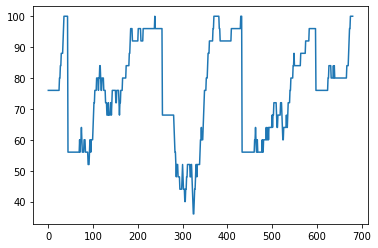

In [64]:
m_performance = np.zeros(len(outcome))
cor = 0
b=0
tot = 25
for i in range(tot):
    if outcome[i]==0:
        cor += 1

m_performance[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(outcome):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if outcome[i+j]==0:
                cor += 1
        m_performance[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif outcome[i] == outcome[i-tot]:
        m_performance[i] = m_performance[i-1]
        i += 1
    elif outcome[i]==0:
        cor += 1
        m_performance[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        m_performance[i] = 100 * (cor / tot)
        i +=1

for i in range(len(m_performance)):
    if m_performance[i]<0:
        m_performance[i] = 0
# print(m_performance)
plt.plot(m_performance)

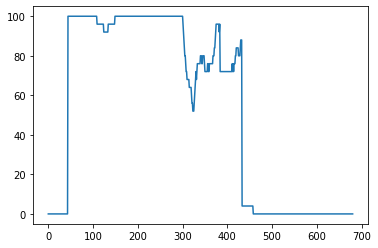

In [70]:
mod_perf = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif perf[i] == perf[i-tot]:
        mod_perf[i] = mod_perf[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf)):
    if mod_perf[i]<0:
        mod_perf[i] = 0
# print(m_performance)
plt.plot(mod_perf)

In [72]:
EPOCHS = 150


x_tr = X_conv[134:434]
tmp = Y[134:434]
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[:134]
tmp = Y[:134]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 48, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 48, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 48, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 48, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       784       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [73]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 300 samples, validate on 134 samples
Epoch 1/150
300/300 [==============================] - 47s 158ms/sample - loss: 2.3378 - accuracy: 0.2600 - val_loss: 2.3007 - val_accuracy: 0.4030
Epoch 2/150
300/300 [==============================] - 34s 112ms/sample - loss: 2.0416 - accuracy: 0.4333 - val_loss: 2.2632 - val_accuracy: 0.3806
Epoch 3/150
300/300 [==============================] - 33s 111ms/sample - loss: 1.7911 - accuracy: 0.5600 - val_loss: 2.2273 - val_accuracy: 0.3731
Epoch 4/150
300/300 [==============================] - 36s 120ms/sample - loss: 1.6309 - accuracy: 0.6567 - val_loss: 2.1996 - val_accuracy: 0.4104
Epoch 5/150
300/300 [==============================] - 35s 117ms/sample - loss: 1.6205 - accuracy: 0.6667 - val_loss: 2.1760 - val_accuracy: 0.4179
Epoch 6/150
300/300 [==============================] - 34s 114ms/sample - loss: 1.5199 - accuracy: 0.7433 - val_loss: 2.1587 - val_accuracy: 0.3881
Epoch 7/150
300/300 [==============================] - 37s 125ms/s

Epoch 56/150
300/300 [==============================] - 21s 70ms/sample - loss: 1.0048 - accuracy: 0.9967 - val_loss: 2.3880 - val_accuracy: 0.4328
Epoch 57/150
300/300 [==============================] - 21s 70ms/sample - loss: 0.9949 - accuracy: 0.9933 - val_loss: 2.3755 - val_accuracy: 0.4478
Epoch 58/150
300/300 [==============================] - 21s 70ms/sample - loss: 1.0047 - accuracy: 0.9900 - val_loss: 2.3884 - val_accuracy: 0.4254
Epoch 59/150
300/300 [==============================] - 21s 71ms/sample - loss: 0.9931 - accuracy: 1.0000 - val_loss: 2.3662 - val_accuracy: 0.4254
Epoch 60/150
300/300 [==============================] - 21s 71ms/sample - loss: 0.9971 - accuracy: 0.9933 - val_loss: 2.4095 - val_accuracy: 0.4179
Epoch 61/150
300/300 [==============================] - 21s 69ms/sample - loss: 0.9886 - accuracy: 1.0000 - val_loss: 2.3987 - val_accuracy: 0.4104
Epoch 62/150
300/300 [==============================] - 21s 69ms/sample - loss: 0.9897 - accuracy: 0.9967 - val_

In [74]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(681,)

In [102]:
pred_y = np.array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 6, 6, 2, 2, 2, 6, 2, 2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 2, 2, 6,
       2, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 2, 6, 2, 6, 6, 6, 6, 6, 2, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 2, 2, 6, 2, 6, 6, 2, 6, 6, 6, 6, 2,
       6, 6, 6, 6, 6, 6, 2, 2, 6, 6, 6, 2, 2, 6, 2, 2, 6, 2, 2, 6, 6, 2,
       2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 2, 6, 6, 6, 6, 6, 2, 6, 2, 6, 2, 2,
       6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 6, 6, 6, 6, 6, 2, 6, 6, 2, 2, 2, 6,
       2, 6, 6, 2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 6, 6, 2, 2, 2, 6, 6, 2,
       6, 2, 6, 6, 6, 2, 6, 2, 2, 6, 6, 2, 2, 6, 6, 2, 2, 2, 2, 6, 2, 6,
       2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 6, 6, 6, 2, 6, 6, 6, 6, 6, 2, 2,
       2, 2, 2, 2, 6, 2, 2, 6, 6, 6, 2, 6, 2, 6, 6, 6, 2, 2, 2, 2, 2, 6,
       2, 6, 2, 6, 6, 6, 2, 6, 6, 2, 6, 6, 6, 2, 2, 6, 6, 2, 2, 6, 6, 6,
       6, 6, 2, 6, 6, 2, 6, 2, 2, 2, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 6, 2,
       2, 2, 6, 6, 6, 2, 6, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 6, 6, 6, 2, 2,
       6, 6, 6, 6, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 6,
       6, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6,
       6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6, 6, 6, 2, 6,
       2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 2, 6,
       2, 2, 2, 6, 2, 2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 6, 2, 6, 2, 2, 2, 2, 2, 2, 2,
       2, 6, 2, 2, 2, 6, 2, 2, 6, 2, 2, 6, 2, 6, 2, 2, 2, 2, 6, 2, 2, 6,
       2, 2, 6, 6, 2, 6, 6, 2, 6, 6, 2, 2, 2, 2, 6, 6, 2, 6, 2, 6, 2, 2,
       2, 2, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 6, 2, 2, 6,
       2, 6, 2, 6, 6, 2, 2, 6, 6, 2, 6, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 2,
       2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 6, 2, 2, 2, 6, 2, 6, 2, 6, 2, 2, 2, 2, 2, 2, 2, 6, 6, 2, 6, 2,
       2, 2, 6, 2, 2, 2, 2, 2, 6, 2, 2, 2, 6, 2, 2, 2, 2, 2, 6, 2, 2, 2,
       2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 6, 2, 2, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2,
       2, 2, 2, 2, 6, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 2, 2, 6, 6, 6])

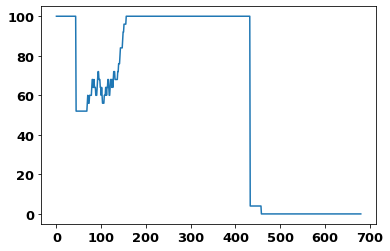

In [76]:
perf = (pred_y == true_y).astype(int)
mod_perf2 = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf2[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf2[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif perf[i] == perf[i-tot]:
        mod_perf2[i] = mod_perf2[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf2[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf2[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf2)):
    if mod_perf2[i]<0:
        mod_perf2[i] = 0
# print(m_performance)
plt.plot(mod_perf2)

In [77]:
EPOCHS = 150

x_tr = np.concatenate((X_conv[:134], X_conv[300:]), axis=0)
tmp = np.concatenate((Y[:134], Y[300:]), axis=0)
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[134:300]
tmp = Y[134:300]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

In [78]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 515 samples, validate on 166 samples
Epoch 1/150
515/515 [==============================] - 45s 86ms/sample - loss: 2.6898 - accuracy: 0.1495 - val_loss: 2.2954 - val_accuracy: 0.3554
Epoch 2/150
515/515 [==============================] - 39s 76ms/sample - loss: 2.1831 - accuracy: 0.3553 - val_loss: 2.2232 - val_accuracy: 0.4819
Epoch 3/150
515/515 [==============================] - 40s 78ms/sample - loss: 1.9144 - accuracy: 0.4990 - val_loss: 2.1801 - val_accuracy: 0.3554
Epoch 4/150
515/515 [==============================] - 40s 77ms/sample - loss: 1.8069 - accuracy: 0.5476 - val_loss: 2.0262 - val_accuracy: 0.4337
Epoch 5/150
515/515 [==============================] - 39s 76ms/sample - loss: 1.7613 - accuracy: 0.5689 - val_loss: 1.9875 - val_accuracy: 0.4337
Epoch 6/150
515/515 [==============================] - 39s 76ms/sample - loss: 1.6673 - accuracy: 0.6369 - val_loss: 1.9028 - val_accuracy: 0.4337
Epoch 7/150
515/515 [==============================] - 39s 77ms/sample -

515/515 [==============================] - 39s 76ms/sample - loss: 1.0168 - accuracy: 0.9748 - val_loss: 1.4460 - val_accuracy: 0.7711
Epoch 112/150
515/515 [==============================] - 39s 76ms/sample - loss: 1.0279 - accuracy: 0.9650 - val_loss: 1.4380 - val_accuracy: 0.7831
Epoch 113/150
515/515 [==============================] - 39s 76ms/sample - loss: 1.0309 - accuracy: 0.9631 - val_loss: 1.4498 - val_accuracy: 0.7590
Epoch 114/150
515/515 [==============================] - 39s 76ms/sample - loss: 1.0186 - accuracy: 0.9728 - val_loss: 1.4239 - val_accuracy: 0.7530
Epoch 115/150
515/515 [==============================] - 39s 75ms/sample - loss: 1.0041 - accuracy: 0.9825 - val_loss: 1.6165 - val_accuracy: 0.6747
Epoch 116/150
515/515 [==============================] - 39s 75ms/sample - loss: 1.0622 - accuracy: 0.9515 - val_loss: 1.4392 - val_accuracy: 0.7831
Epoch 117/150
515/515 [==============================] - 40s 78ms/sample - loss: 1.0185 - accuracy: 0.9612 - val_loss: 1

In [79]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(681,)

In [101]:
pred_y = np.array([0, 4, 0, 4, 0, 4, 4, 0, 0, 0, 0, 4, 4, 4, 0, 4, 0, 0, 4, 0, 0, 4,
       4, 0, 0, 4, 0, 4, 4, 0, 4, 4, 0, 4, 4, 4, 4, 4, 4, 0, 0, 0, 4, 0,
       4, 2, 6, 2, 2, 6, 6, 6, 2, 6, 2, 6, 6, 6, 6, 2, 2, 2, 6, 2, 6, 2,
       6, 2, 2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 6, 2, 6, 6, 2, 6, 6, 6, 6, 6,
       2, 2, 2, 6, 6, 6, 6, 2, 2, 6, 6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 6, 2,
       6, 6, 2, 6, 2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 6, 2, 2, 2, 2, 6, 6, 6,
       2, 2, 2, 2, 2, 2, 6, 2, 2, 6, 2, 6, 6, 6, 6, 6, 2, 6, 2, 2, 2, 2,
       6, 6, 6, 6, 6, 2, 6, 2, 2, 6, 6, 6, 6, 6, 6, 2, 6, 2, 2, 2, 2, 6,
       6, 6, 6, 2, 6, 2, 6, 2, 2, 2, 6, 6, 2, 6, 2, 6, 2, 2, 2, 6, 6, 2,
       6, 2, 2, 6, 2, 2, 6, 2, 2, 2, 6, 2, 2, 6, 2, 6, 2, 2, 2, 6, 2, 6,
       2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2, 2, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2,
       2, 2, 2, 2, 6, 6, 2, 6, 6, 6, 2, 6, 2, 6, 2, 6, 2, 6, 2, 2, 2, 6,
       2, 6, 2, 6, 6, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2,
       2, 6, 2, 2, 2, 2, 6, 2, 6, 2, 6, 6, 6, 6, 2, 2, 2, 2, 2, 2, 6, 2,
       2, 2, 6, 6, 6, 2, 6, 2, 2, 2, 2, 6, 6, 2, 2, 6, 2, 6, 6, 6, 2, 2,
       6, 6, 6, 6, 2, 2, 2, 2, 6, 2, 2, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 6,
       6, 6, 6, 2, 6, 6, 6, 6, 2, 2, 2, 6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6,
       6, 6, 2, 2, 6, 2, 2, 2, 6, 2, 2, 6, 2, 2, 2, 6, 2, 6, 6, 6, 2, 6,
       2, 6, 2, 6, 2, 2, 2, 6, 6, 6, 2, 2, 2, 2, 6, 6, 6, 2, 2, 2, 2, 6,
       2, 2, 2, 6, 2, 2, 6, 2, 6, 2, 6, 6, 2, 2, 2, 2, 1, 5, 1, 1, 5, 5,
       1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 1, 1, 1, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5,
       1, 1, 5, 5, 1, 1, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1,
       5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1,
       5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5,
       1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 5])

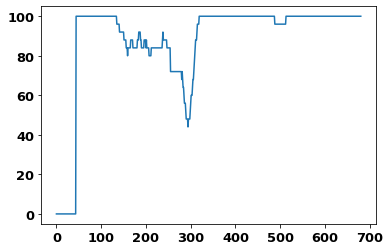

In [81]:
perf = (pred_y == true_y).astype(int)
mod_perf3 = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf3[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf3[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif perf[i] == perf[i-tot]:
        mod_perf3[i] = mod_perf3[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf3[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf3[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf3)):
    if mod_perf3[i]<0:
        mod_perf3[i] = 0
# print(m_performance)
plt.plot(mod_perf3)

In [82]:
EPOCHS = 150


x_tr = X_conv[434:600]
tmp = Y[434:600]
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[600:]
tmp = Y[600:]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 48, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 48, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 48, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 48, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       784       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [83]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 166 samples, validate on 81 samples
Epoch 1/150
166/166 [==============================] - 19s 113ms/sample - loss: 3.2487 - accuracy: 0.0241 - val_loss: 2.3439 - val_accuracy: 0.0864
Epoch 2/150
166/166 [==============================] - 13s 79ms/sample - loss: 2.8954 - accuracy: 0.1265 - val_loss: 2.3016 - val_accuracy: 0.5185
Epoch 3/150
166/166 [==============================] - 13s 77ms/sample - loss: 2.5737 - accuracy: 0.1506 - val_loss: 2.2658 - val_accuracy: 0.6790
Epoch 4/150
166/166 [==============================] - 13s 77ms/sample - loss: 2.2100 - accuracy: 0.3193 - val_loss: 2.2355 - val_accuracy: 0.6790
Epoch 5/150
166/166 [==============================] - 13s 78ms/sample - loss: 1.9820 - accuracy: 0.4819 - val_loss: 2.1898 - val_accuracy: 0.6667
Epoch 6/150
166/166 [==============================] - 13s 78ms/sample - loss: 1.7709 - accuracy: 0.6446 - val_loss: 2.1491 - val_accuracy: 0.6543
Epoch 7/150
166/166 [==============================] - 13s 78ms/sample -

166/166 [==============================] - 23s 137ms/sample - loss: 1.0908 - accuracy: 0.9880 - val_loss: 1.3300 - val_accuracy: 0.8148
Epoch 57/150
166/166 [==============================] - 21s 125ms/sample - loss: 1.0911 - accuracy: 0.9759 - val_loss: 1.3342 - val_accuracy: 0.8148
Epoch 58/150
166/166 [==============================] - 21s 128ms/sample - loss: 1.0807 - accuracy: 0.9819 - val_loss: 1.3437 - val_accuracy: 0.8148
Epoch 59/150
166/166 [==============================] - 25s 153ms/sample - loss: 1.1103 - accuracy: 0.9578 - val_loss: 1.3445 - val_accuracy: 0.8272
Epoch 60/150
166/166 [==============================] - 24s 146ms/sample - loss: 1.0878 - accuracy: 0.9880 - val_loss: 1.3566 - val_accuracy: 0.8148
Epoch 61/150
166/166 [==============================] - 25s 151ms/sample - loss: 1.0811 - accuracy: 0.9880 - val_loss: 1.3730 - val_accuracy: 0.8025
Epoch 62/150
166/166 [==============================] - 25s 150ms/sample - loss: 1.0931 - accuracy: 0.9639 - val_loss: 

Epoch 111/150
166/166 [==============================] - 25s 148ms/sample - loss: 0.9983 - accuracy: 0.9940 - val_loss: 1.4873 - val_accuracy: 0.8148
Epoch 112/150
166/166 [==============================] - 25s 150ms/sample - loss: 0.9965 - accuracy: 0.9819 - val_loss: 1.5027 - val_accuracy: 0.8148
Epoch 113/150
166/166 [==============================] - 24s 146ms/sample - loss: 0.9895 - accuracy: 0.9940 - val_loss: 1.5572 - val_accuracy: 0.8025
Epoch 114/150
166/166 [==============================] - 25s 150ms/sample - loss: 0.9867 - accuracy: 1.0000 - val_loss: 1.5713 - val_accuracy: 0.7901
Epoch 115/150
166/166 [==============================] - 25s 151ms/sample - loss: 1.0008 - accuracy: 0.9940 - val_loss: 1.5722 - val_accuracy: 0.8025
Epoch 116/150
166/166 [==============================] - 25s 150ms/sample - loss: 0.9890 - accuracy: 1.0000 - val_loss: 1.5708 - val_accuracy: 0.8025
Epoch 117/150
166/166 [==============================] - 25s 152ms/sample - loss: 0.9878 - accuracy:

In [84]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(681,)

In [100]:
pred_y=np.array([5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5,
       5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5,
       1, 5, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5,
       5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1, 1, 5, 5, 5, 5, 5,
       5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1,
       5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 5, 1, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 1, 5, 5, 5, 1, 1, 5, 5, 1, 5,
       5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       1, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5,
       1, 5, 1, 5, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 1, 5, 5, 5, 5, 5,
       5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 1, 1, 5, 5, 5, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 1, 5, 5, 1, 1, 1, 1, 1, 1, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 1,
       5, 5, 1, 1, 5, 5, 1, 5, 1, 5, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5,
       1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 1, 1, 1, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5,
       1, 1, 5, 5, 1, 1, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1,
       5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1,
       5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 1, 5, 1, 1, 1, 5,
       1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 1, 5, 1, 5, 5, 5, 1, 1, 1, 5, 1, 5,
       1, 5, 5, 1, 1, 5, 5, 5, 1, 5, 1, 5, 1, 1, 5, 5, 5, 5, 1, 1, 5, 5,
       5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5])

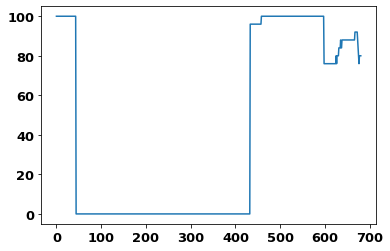

In [86]:
perf = (pred_y == true_y).astype(int)
mod_perf4 = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf4[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf4[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif perf[i] == perf[i-tot]:
        mod_perf4[i] = mod_perf4[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf4[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf4[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf4)):
    if mod_perf4[i]<0:
        mod_perf4[i] = 0
# print(m_performance)
plt.plot(mod_perf4)

In [87]:
EPOCHS = 150


x_tr = X_conv[500:]
tmp = Y[500:]
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[434:500]
tmp = Y[434:500]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 48, 2052)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 48, 2052, 1)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 48, 2023, 16)      496       
_________________________________________________________________
batch_normalization (BatchNo (None, 48, 2023, 16)      64        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 2023, 16)       784       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 2023, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 2023, 16)       0     

In [88]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 181 samples, validate on 66 samples
Epoch 1/150
181/181 [==============================] - 38s 212ms/sample - loss: 3.1722 - accuracy: 0.0331 - val_loss: 2.3440 - val_accuracy: 0.1061
Epoch 2/150
181/181 [==============================] - 25s 140ms/sample - loss: 2.7741 - accuracy: 0.1050 - val_loss: 2.3147 - val_accuracy: 0.4394
Epoch 3/150
181/181 [==============================] - 25s 138ms/sample - loss: 2.5016 - accuracy: 0.1547 - val_loss: 2.2802 - val_accuracy: 0.5303
Epoch 4/150
181/181 [==============================] - 25s 136ms/sample - loss: 2.1798 - accuracy: 0.3370 - val_loss: 2.2497 - val_accuracy: 0.6061
Epoch 5/150
181/181 [==============================] - 24s 132ms/sample - loss: 1.9196 - accuracy: 0.5138 - val_loss: 2.2165 - val_accuracy: 0.6364
Epoch 6/150
181/181 [==============================] - 24s 135ms/sample - loss: 1.7732 - accuracy: 0.6243 - val_loss: 2.1886 - val_accuracy: 0.6212
Epoch 7/150
181/181 [==============================] - 25s 138ms/sa

Epoch 56/150
181/181 [==============================] - 25s 140ms/sample - loss: 1.0535 - accuracy: 1.0000 - val_loss: 1.9596 - val_accuracy: 0.5909
Epoch 57/150
181/181 [==============================] - 25s 139ms/sample - loss: 1.0496 - accuracy: 0.9945 - val_loss: 1.8171 - val_accuracy: 0.6212
Epoch 58/150
181/181 [==============================] - 25s 138ms/sample - loss: 1.0477 - accuracy: 1.0000 - val_loss: 1.8275 - val_accuracy: 0.6212
Epoch 59/150
181/181 [==============================] - 25s 139ms/sample - loss: 1.0482 - accuracy: 0.9890 - val_loss: 1.8012 - val_accuracy: 0.5909
Epoch 60/150
181/181 [==============================] - 25s 139ms/sample - loss: 1.0579 - accuracy: 1.0000 - val_loss: 1.8319 - val_accuracy: 0.6061
Epoch 61/150
181/181 [==============================] - 26s 142ms/sample - loss: 1.0487 - accuracy: 0.9834 - val_loss: 1.7698 - val_accuracy: 0.6061
Epoch 62/150
181/181 [==============================] - 25s 140ms/sample - loss: 1.0442 - accuracy: 1.0000

Epoch 111/150
181/181 [==============================] - 25s 141ms/sample - loss: 0.9689 - accuracy: 0.9945 - val_loss: 1.8275 - val_accuracy: 0.6061
Epoch 112/150
181/181 [==============================] - 25s 138ms/sample - loss: 0.9634 - accuracy: 1.0000 - val_loss: 1.8561 - val_accuracy: 0.5909
Epoch 113/150
181/181 [==============================] - 25s 139ms/sample - loss: 0.9633 - accuracy: 1.0000 - val_loss: 1.8483 - val_accuracy: 0.5909
Epoch 114/150
181/181 [==============================] - 26s 142ms/sample - loss: 0.9563 - accuracy: 1.0000 - val_loss: 1.9256 - val_accuracy: 0.5758
Epoch 115/150
181/181 [==============================] - 26s 141ms/sample - loss: 0.9666 - accuracy: 0.9945 - val_loss: 1.8461 - val_accuracy: 0.6061
Epoch 116/150
181/181 [==============================] - 26s 142ms/sample - loss: 0.9642 - accuracy: 1.0000 - val_loss: 1.8376 - val_accuracy: 0.5909
Epoch 117/150
181/181 [==============================] - 25s 139ms/sample - loss: 0.9660 - accuracy:

In [89]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(681,)

In [99]:
pred_y = np.array([5, 5, 5, 1, 5, 1, 5, 1, 1, 5, 1, 5, 5, 5, 1, 5, 1, 1, 1, 5, 5, 5,
       1, 1, 1, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 1,
       5, 1, 5, 5, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 1, 1,
       5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 1, 5, 5, 1, 5, 5, 1, 1, 5, 5, 5, 1,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 5, 1, 5, 5, 5, 1, 1,
       5, 5, 5, 1, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1, 5, 1,
       1, 5, 5, 1, 1, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5,
       1, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5,
       1, 1, 5, 5, 5, 1, 5, 5, 1, 1, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 1, 5,
       1, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5,
       5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 1, 1,
       1, 1, 5, 1, 1, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 1, 5, 1, 1, 5, 5, 5,
       5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 5, 5, 5, 1, 5,
       5, 1, 1, 5, 5, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 5,
       5, 5, 1, 1, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1,
       5, 5, 1, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5,
       5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 1,
       1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 5, 5,
       1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 1, 1,
       5, 5, 1, 5, 1, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1, 5,
       1, 1, 5, 5, 1, 1, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 5, 5, 1,
       5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1,
       5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 5,
       5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5,
       1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 5])

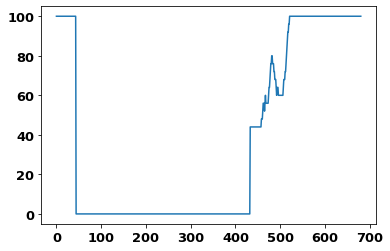

In [91]:
perf = (pred_y == true_y).astype(int)
mod_perf5 = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf5[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf5[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif perf[i] == perf[i-tot]:
        mod_perf5[i] = mod_perf5[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf5[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf5[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf5)):
    if mod_perf5[i]<0:
        mod_perf5[i] = 0
# print(m_performance)
plt.plot(mod_perf5)

In [92]:
EPOCHS = 150

x_tr = np.concatenate((X_conv[434:500], X_conv[600:]), axis=0)
tmp = np.concatenate((Y[434:500], Y[600:]), axis=0)
y_tr = tf.keras.utils.to_categorical(tmp, num_classes=8)
x_val = X_conv[500:600]
tmp = Y[500:600]
y_val = tf.keras.utils.to_categorical(tmp, num_classes=8)

tf.keras.backend.clear_session()

randseed = 12345
random.seed(randseed)
np.random.seed(randseed)
tf.random.set_seed(randseed)

model = make_model(x_tr, y_tr.shape[-1], **model_kwargs1)
optim = tf.keras.optimizers.Nadam(learning_rate=0.001)
loss_obj = tf.keras.losses.CategoricalCrossentropy(label_smoothing=LABEL_SMOOTHING)
model.compile(optimizer=optim, loss=loss_obj, metrics=['accuracy'])

In [93]:
hist = model.fit(x=x_tr, y=y_tr, epochs=EPOCHS, validation_data=(x_val, y_val), verbose=1)

Train on 147 samples, validate on 100 samples
Epoch 1/150
147/147 [==============================] - 35s 236ms/sample - loss: 3.2149 - accuracy: 0.0544 - val_loss: 2.3467 - val_accuracy: 0.1000
Epoch 2/150
147/147 [==============================] - 21s 143ms/sample - loss: 2.9896 - accuracy: 0.0476 - val_loss: 2.3176 - val_accuracy: 0.2800
Epoch 3/150
147/147 [==============================] - 21s 146ms/sample - loss: 2.6358 - accuracy: 0.1361 - val_loss: 2.2824 - val_accuracy: 0.6000
Epoch 4/150
147/147 [==============================] - 22s 146ms/sample - loss: 2.3050 - accuracy: 0.2993 - val_loss: 2.2473 - val_accuracy: 0.8000
Epoch 5/150
147/147 [==============================] - 22s 149ms/sample - loss: 2.1138 - accuracy: 0.4558 - val_loss: 2.2130 - val_accuracy: 0.7800
Epoch 6/150
147/147 [==============================] - 22s 146ms/sample - loss: 1.8724 - accuracy: 0.5170 - val_loss: 2.1903 - val_accuracy: 0.7900
Epoch 7/150
147/147 [==============================] - 22s 147ms/s

Epoch 56/150
147/147 [==============================] - 14s 95ms/sample - loss: 1.1332 - accuracy: 0.9524 - val_loss: 1.3974 - val_accuracy: 0.8200
Epoch 57/150
147/147 [==============================] - 13s 86ms/sample - loss: 1.1069 - accuracy: 0.9864 - val_loss: 1.3991 - val_accuracy: 0.8100
Epoch 58/150
147/147 [==============================] - 12s 80ms/sample - loss: 1.1012 - accuracy: 0.9864 - val_loss: 1.3877 - val_accuracy: 0.8000
Epoch 59/150
147/147 [==============================] - 12s 78ms/sample - loss: 1.0925 - accuracy: 1.0000 - val_loss: 1.4102 - val_accuracy: 0.8000
Epoch 60/150
147/147 [==============================] - 11s 78ms/sample - loss: 1.1275 - accuracy: 0.9524 - val_loss: 1.3882 - val_accuracy: 0.8100
Epoch 61/150
147/147 [==============================] - 11s 77ms/sample - loss: 1.0923 - accuracy: 0.9796 - val_loss: 1.4263 - val_accuracy: 0.7500
Epoch 62/150
147/147 [==============================] - 11s 77ms/sample - loss: 1.0813 - accuracy: 0.9932 - val_

In [94]:
y_pred = model.predict(X_conv)
pred_y = np.argmax(y_pred, axis=1)
pred_y.shape

(681,)

In [97]:
pred_y = np.array([1, 1, 5, 5, 5, 1, 5, 5, 1, 1, 1, 5, 1, 5, 5, 5, 1, 1, 5, 5, 1, 1,
       5, 5, 1, 1, 1, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 5, 1, 1, 5, 5, 1,
       5, 1, 5, 5, 5, 1, 1, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 5, 5, 5, 1, 5,
       1, 5, 1, 5, 1, 1, 5, 1, 1, 1, 1, 5, 1, 1, 1, 5, 5, 1, 5, 5, 5, 5,
       1, 1, 5, 5, 1, 1, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 1, 1,
       1, 5, 5, 1, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 1,
       1, 1, 1, 1, 1, 1, 5, 5, 1, 5, 1, 5, 1, 5, 1, 5, 5, 1, 1, 1, 1, 5,
       1, 5, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 1, 1, 1, 1, 1, 1, 5,
       1, 5, 5, 1, 5, 5, 5, 1, 1, 1, 1, 1, 1, 5, 1, 1, 1, 5, 1, 5, 5, 5,
       5, 5, 5, 1, 5, 1, 5, 1, 1, 5, 1, 1, 5, 5, 5, 5, 1, 1, 1, 5, 1, 5,
       1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 1, 5, 5, 5, 5, 5, 5,
       1, 1, 1, 5, 1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 5, 5, 1, 5, 5, 5, 5, 5,
       5, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 5, 1, 1,
       1, 5, 1, 5, 1, 1, 5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1, 5, 5, 1, 1, 5, 1, 5, 5, 1,
       5, 5, 5, 5, 1, 1, 1, 1, 1, 5, 1, 1, 1, 1, 1, 1, 1, 5, 1, 5, 5, 5,
       5, 1, 1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 5, 1, 5, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 1, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1,
       5, 5, 1, 5, 1, 5, 5, 5, 5, 1, 5, 1, 1, 1, 5, 5, 1, 1, 1, 5, 1, 5,
       5, 1, 5, 1, 1, 1, 1, 5, 5, 5, 5, 5, 1, 5, 5, 1, 1, 5, 1, 1, 5, 5,
       1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 1, 5, 1, 1, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 1, 1, 1, 5, 5, 1, 5, 5, 1, 5, 1, 1, 5, 5, 5, 1, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 1,
       1, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5,
       5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 1, 5, 5, 5,
       1, 5, 1, 1, 5, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 1,
       5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 1, 5, 1, 5,
       1, 1, 5, 5, 1, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5, 5, 5, 1, 5, 1, 5,
       1, 5, 5, 5, 5, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 5, 1, 1, 1, 5, 5, 5,
       1, 5, 5, 1, 5, 5, 5, 5, 1, 1, 1, 5, 1, 1, 1, 5, 5, 5, 1, 1, 5, 5,
       5, 5, 5, 1, 5, 5, 1, 5, 5, 5, 5, 5, 1, 1, 1, 1, 5, 5, 5, 5, 5])

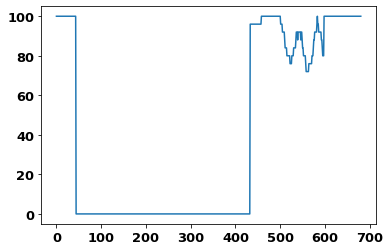

In [96]:
perf = (pred_y == true_y).astype(int)
mod_perf6 = np.zeros(len(perf))
cor = 0
b=0
tot = 25
for i in range(tot):
    if perf[i]==0:
        cor += 1

mod_perf6[:tot] = 100 * (cor / tot)
# for i in range(tot, len(outcome)):
i = tot
while i<len(perf):
    if i == border[b]:
        cor = 0
        for j in range(tot):
            if perf[i+j]==1:
                cor += 1
        mod_perf6[i:i+tot] = 100 * (cor / tot)
        i += tot
        b = (b+1)%7
    elif perf[i] == perf[i-tot]:
        mod_perf6[i] = mod_perf6[i-1]
        i += 1
    elif perf[i]==1:
        cor += 1
        mod_perf6[i] = 100 * (cor / tot)
        i += 1
    else:
        cor -= 1
        mod_perf6[i] = 100 * (cor / tot)
        i +=1

for i in range(len(mod_perf6)):
    if mod_perf6[i]<0:
        mod_perf6[i] = 0
# print(m_performance)
plt.plot(mod_perf6)

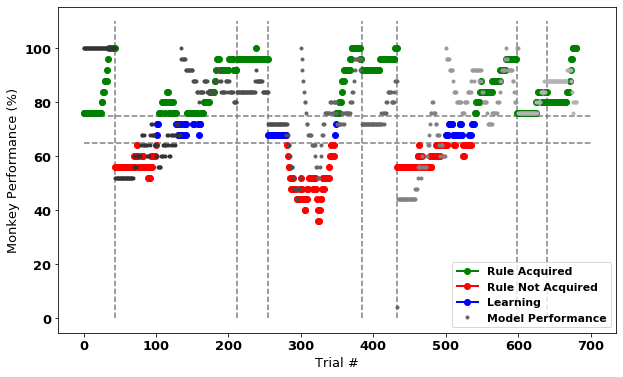

In [98]:
import matplotlib

font = {'weight' : 'bold',
        'size'   : 13}

matplotlib.rc('font', **font)
fig, ax = plt.subplots(figsize=(10,6))
first = np.zeros(3)


for i in range(len(m_performance)):
    if m_performance[i] > 75:
        if (first[0] == 0):
            ax.plot(i, m_performance[i], 'go-', linewidth=2, label='Rule Acquired')
            first[0] = 1
        else:
            ax.plot(i, m_performance[i], 'go-', linewidth=2)
            
                
    elif m_performance[i] < 65:
        if (first[1] == 0):
            ax.plot(i, m_performance[i], 'ro-', linewidth=2, label='Rule Not Acquired')
            first[1] = 1
        else:
            ax.plot(i, m_performance[i], 'ro-', linewidth=2)
    else:
        if (first[2] == 0):
            ax.plot(i, m_performance[i], 'bo-', linewidth=2, label='Learning')
            first[2] = 1
        else:
            ax.plot(i, m_performance[i], 'bo-', linewidth=2)

for i in range(434, 500):
    ax.plot(i, mod_perf5[i], 'k.', linewidth=1, color=(0.5,0.5,0.5))

for i in range(300, 434):
    if (i==300):
        ax.plot(i, mod_perf[i], 'k.', linewidth=1, color=(0.4, 0.4, 0.4), label='Model Performance')
    else:
        ax.plot(i, mod_perf[i], 'k.', linewidth=1, color=(0.4, 0.4, 0.4))

for i in range(500, 600):
    ax.plot(i, mod_perf6[i], 'k.', linewidth=1, color=(0.6, 0.6, 0.6))

for i in range(134):
    ax.plot(i, mod_perf2[i], 'k.', linewidth=1, color=(0.2, 0.2, 0.2))

for i in range(134, 300):
    ax.plot(i, mod_perf3[i], 'k.', linewidth=1, color=(0.3, 0.3, 0.3))
    
for i in range(600, len(mod_perf4)):
    ax.plot(i, mod_perf4[i], 'k.', linewidth=1, color=(0.7, 0.7, 0.7))
# plt.plot(m_performance, linewidth=2)
for i in range(len(border)):
    ax.vlines(x=border[i], ymin=0, ymax=110, linestyles='dashed', colors='grey')
    
ax.hlines(y=65, xmin=0, xmax=700, linestyles='dashed', colors='grey')
ax.hlines(y=75, xmin=0, xmax=700, linestyles='dashed', colors='grey')

plt.ylabel("Monkey Performance (%)")
plt.xlabel("Trial #")
ax.legend(loc='lower right', fontsize='small')
# plt.grid()
plt.savefig("monkey_model_performance_J51_B.svg")